In [74]:
# Uses python3

## Importing libs

In [2]:
import numpy as np
import operator
import pandas as pd

import inspect

from os import getpid
from psutil import Process
from pprint import pprint

import matplotlib.pyplot as plt
import seaborn as sns

import warnings
from tqdm import tqdm

import os

start = "\033[1m"
end = "\033[0;0m"

warnings.simplefilter('ignore')

__One little handle function__

In [3]:
def memory_usage():
    """ 
    Shows memory usage in Mb
    """
    process = Process(getpid())
    print(f'RAM used in Mb: {start}{np.round(process.memory_info().rss/1024/1024, 3)}{end}')

# Task 1. Python


### a) В python2.7 есть ф-ции range, и xrange, в чем разница?
 - Честно говоря не писал на 2.7, но проведя небольшой ресерч, могу сказать, что разница принципиальная,
```xrange()```по сути был генератором, не хранил в памяти лист последовательности, и возвращал объект типа ```range()```
по которому можно было итерироваться

 - в то время как ```range()``` создавал ```list()``` и выдавал всю последовательность целиком

 - К слову в python3 ```range()``` был заменен на ```xrange()```  [PEP-3100](https://www.python.org/dev/peps/pep-3100/#id72) 
 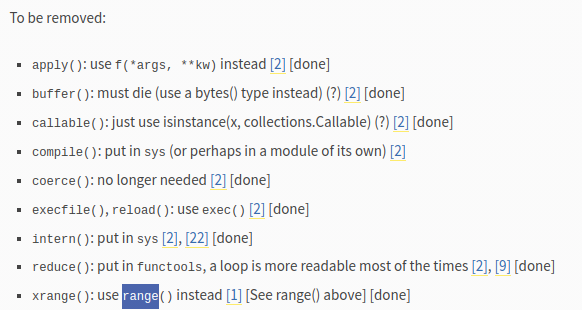

 - Условно, суть вышесказанного можно передать через две функции: ```simple_gen()``` и ```default_func()```, первая и есть генератор (как ```xrange```) она не создает массива с данными, а лениво генерит по мере надобности, элемент из указанной последовательности.

 - Вторая же функция, есть отсылка на ```range``` времён python 2.7, создает всю последовательности значений заранее, и хранит в себе, занимая большой объем памяти в случае с длинными последовательностями

In [57]:
print(inspect.getdoc(range))

range(stop) -> range object
range(start, stop[, step]) -> range object

Return an object that produces a sequence of integers from start (inclusive)
to stop (exclusive) by step.  range(i, j) produces i, i+1, i+2, ..., j-1.
start defaults to 0, and stop is omitted!  range(4) produces 0, 1, 2, 3.
These are exactly the valid indices for a list of 4 elements.
When step is given, it specifies the increment (or decrement).


In [121]:
def simple_gen(nums) -> object:
    """
    Simple generator, which increments input list or objects values
    
    Arguments:
    nums -- python list, or range object
    
    Returns:
    yields incremented values
    """
    for num in nums:
        yield num + 1
        
def default_func(nums) -> list:
    """
    Simple list values incremenetor
    
    Arguments:
    nums -- python list, or range object
    
    Returns:
    result -- list of icremented values
    """
    result = []
    for num in nums:
        result.append(num + 1)
    return result

__Память до запуска функций__

In [20]:
memory_usage()

RAM used in Mb: 116.305


__Заводим переменную куда сохраняем результат от выполнения__ ```simple_gen()```

In [49]:
h = simple_gen(range(10000))

__Получаем объект типа generator__

In [50]:
h

<generator object simple_gen at 0x7fa59b732d00>

__По памяти usage не изменился__

In [22]:
memory_usage()

RAM used in Mb: 116.305


__Запустим же__ ```default_func()```

In [26]:
s = default_func(range(10000))

__Собственно о чем мы и говорила около 465Mb памяти оказалось занято__

In [27]:
memory_usage()

RAM used in Mb: 116.77


__В ```s``` имеем всю последовательности сгенерированных значений__

In [35]:
s

[1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 34,
 35,
 36,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 74,
 75,
 76,
 77,
 78,
 79,
 80,
 81,
 82,
 83,
 84,
 85,
 86,
 87,
 88,
 89,
 90,
 91,
 92,
 93,
 94,
 95,
 96,
 97,
 98,
 99,
 100,
 101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125,
 126,
 127,
 128,
 129,
 130,
 131,
 132,
 133,
 134,
 135,
 136,
 137,
 138,
 139,
 140,
 141,
 142,
 143,
 144,
 145,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 161,
 162,
 163,
 164,
 165,
 166,
 167,
 168,
 169,
 170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,
 185

__К элементам__ ```h``` __можно обращаться через стандартную функцию__ ```next()``` __или же сразу в цикле__

In [51]:
next(h)

1

In [52]:
for element in h:
    print(element)

2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277
27

4599
4600
4601
4602
4603
4604
4605
4606
4607
4608
4609
4610
4611
4612
4613
4614
4615
4616
4617
4618
4619
4620
4621
4622
4623
4624
4625
4626
4627
4628
4629
4630
4631
4632
4633
4634
4635
4636
4637
4638
4639
4640
4641
4642
4643
4644
4645
4646
4647
4648
4649
4650
4651
4652
4653
4654
4655
4656
4657
4658
4659
4660
4661
4662
4663
4664
4665
4666
4667
4668
4669
4670
4671
4672
4673
4674
4675
4676
4677
4678
4679
4680
4681
4682
4683
4684
4685
4686
4687
4688
4689
4690
4691
4692
4693
4694
4695
4696
4697
4698
4699
4700
4701
4702
4703
4704
4705
4706
4707
4708
4709
4710
4711
4712
4713
4714
4715
4716
4717
4718
4719
4720
4721
4722
4723
4724
4725
4726
4727
4728
4729
4730
4731
4732
4733
4734
4735
4736
4737
4738
4739
4740
4741
4742
4743
4744
4745
4746
4747
4748
4749
4750
4751
4752
4753
4754
4755
4756
4757
4758
4759
4760
4761
4762
4763
4764
4765
4766
4767
4768
4769
4770
4771
4772
4773
4774
4775
4776
4777
4778
4779
4780
4781
4782
4783
4784
4785
4786
4787
4788
4789
4790
4791
4792
4793
4794
4795
4796
4797
4798


7945
7946
7947
7948
7949
7950
7951
7952
7953
7954
7955
7956
7957
7958
7959
7960
7961
7962
7963
7964
7965
7966
7967
7968
7969
7970
7971
7972
7973
7974
7975
7976
7977
7978
7979
7980
7981
7982
7983
7984
7985
7986
7987
7988
7989
7990
7991
7992
7993
7994
7995
7996
7997
7998
7999
8000
8001
8002
8003
8004
8005
8006
8007
8008
8009
8010
8011
8012
8013
8014
8015
8016
8017
8018
8019
8020
8021
8022
8023
8024
8025
8026
8027
8028
8029
8030
8031
8032
8033
8034
8035
8036
8037
8038
8039
8040
8041
8042
8043
8044
8045
8046
8047
8048
8049
8050
8051
8052
8053
8054
8055
8056
8057
8058
8059
8060
8061
8062
8063
8064
8065
8066
8067
8068
8069
8070
8071
8072
8073
8074
8075
8076
8077
8078
8079
8080
8081
8082
8083
8084
8085
8086
8087
8088
8089
8090
8091
8092
8093
8094
8095
8096
8097
8098
8099
8100
8101
8102
8103
8104
8105
8106
8107
8108
8109
8110
8111
8112
8113
8114
8115
8116
8117
8118
8119
8120
8121
8122
8123
8124
8125
8126
8127
8128
8129
8130
8131
8132
8133
8134
8135
8136
8137
8138
8139
8140
8141
8142
8143
8144


### b) Написать на python 2 или 3 генератор первых n чисел фибоначи.

In [135]:
def fib(n):
    """
    Fibonacci generator
    
    Arguments:
    n -- number of needed Fibonacci numbers
    
    Returns:
    yields first n Fibonacci numbers
    """
    current_num, next_num = 0, 1
    for _ in range(n):
        yield current_num
        current_num, next_num = next_num, next_num + current_num

In [159]:
%time
for num in fib(10000):
    print(num)

CPU times: user 2 µs, sys: 1e+03 ns, total: 3 µs
Wall time: 4.05 µs
0
1
1
2
3
5
8
13
21
34
55
89
144
233
377
610
987
1597
2584
4181
6765
10946
17711
28657
46368
75025
121393
196418
317811
514229
832040
1346269
2178309
3524578
5702887
9227465
14930352
24157817
39088169
63245986
102334155
165580141
267914296
433494437
701408733
1134903170
1836311903
2971215073
4807526976
7778742049
12586269025
20365011074
32951280099
53316291173
86267571272
139583862445
225851433717
365435296162
591286729879
956722026041
1548008755920
2504730781961
4052739537881
6557470319842
10610209857723
17167680177565
27777890035288
44945570212853
72723460248141
117669030460994
190392490709135
308061521170129
498454011879264
806515533049393
1304969544928657
2111485077978050
3416454622906707
5527939700884757
8944394323791464
14472334024676221
23416728348467685
37889062373143906
61305790721611591
99194853094755497
160500643816367088
259695496911122585
420196140727489673
679891637638612258
1100087778366101931
1779979416

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [154]:
def fib_another(n):
    """
    Fibonacci generator
    
    Arguments:
    n -- number of needed Fibonacci numbers
    
    Returns:
    yields first n Fibonacci numbers
    """
    current_num, next_num = 0, 1

    while n > 0:
        yield current_num
        current_num, next_num = next_num, current_num + next_num
        n -= 1

In [160]:
%time
for num in fib_another(10000):
    print(num)

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 4.29 µs
0
1
1
2
3
5
8
13
21
34
55
89
144
233
377
610
987
1597
2584
4181
6765
10946
17711
28657
46368
75025
121393
196418
317811
514229
832040
1346269
2178309
3524578
5702887
9227465
14930352
24157817
39088169
63245986
102334155
165580141
267914296
433494437
701408733
1134903170
1836311903
2971215073
4807526976
7778742049
12586269025
20365011074
32951280099
53316291173
86267571272
139583862445
225851433717
365435296162
591286729879
956722026041
1548008755920
2504730781961
4052739537881
6557470319842
10610209857723
17167680177565
27777890035288
44945570212853
72723460248141
117669030460994
190392490709135
308061521170129
498454011879264
806515533049393
1304969544928657
2111485077978050
3416454622906707
5527939700884757
8944394323791464
14472334024676221
23416728348467685
37889062373143906
61305790721611591
99194853094755497
160500643816367088
259695496911122585
420196140727489673
679891637638612258
1100087778366101931
17799794160047

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



# Task 2. Написать Sql-запросы

### Reading .xlsx files for solution in dataframes

In [216]:
department = pd.read_excel('data.xlsx',sheet_name=0)
staff = pd.read_excel('data.xlsx',sheet_name=1)

In [217]:
staff

,Id,Id_head,Id_dep,name,sal
0,1,1,2,Бегинс,45 000
1,2,1,2,Поттер,80 000
2,3,2,2,Чапаев,100 000
3,4,4,4,Шилов,65 000
4,5,2,4,Мурзахметов,100 000


In [218]:
staff.dtypes

Id          int64
Id_head     int64
Id_dep      int64
name       object
sal        object
dtype: object

In [219]:
staff['sal'] = staff.sal.str.replace(' ', '').astype('int')

In [220]:
staff.dtypes

Id          int64
Id_head     int64
Id_dep      int64
name       object
sal         int64
dtype: object

In [222]:
department

,Id,name
0,1,Финансы
1,2,Риски
2,3,Розница
3,4,Безопасность


### Creating db's in sql

```mysql
CREATE TABLE Departments
	(`Id` int, `name` varchar(20));

INSERT INTO Departments
	(`Id`, `name`)
VALUES
	(1,	'Финансы'),
	(2,	'Риски'),
	(3,	'Розница'),
    (4,	'Безопасность');
    
CREATE TABLE Staff
	(`Id` int,`Id_head` int, `Id_dep` int, `name` varchar(20), `sal` int);

INSERT INTO Staff
	(`Id`,`Id_head`, `Id_dep`, `name`, `sal`)
VALUES
	(1, 1, 2, 'Бегинс', 45000),
	(2, 1, 2, 'Поттер', 80000),
	(3, 2, 2, 'Чапаев', 100000),
	(4, 4, 4, 'Шилов', 65000),
	(5, 2, 4, 'Мурзахметов', 100000);
```

### a) Вывести отдел с наибольшим числом сотрудников;?

### Solution in dataframes

In [197]:
department[department['Id'] == staff.groupby(by = ['Id_dep']).count().index[0]][['name']]

,name
1,Риски


### Solution in sql

```mysql
SELECT name FROM Departments
WHERE Id IN
(SELECT Id_dep
FROM Staff
GROUP BY Id_dep
ORDER by COUNT(Id) DESC)
LIMIT 1
```

[LINT TO SOLUTION](http://sqlfiddle.com/#!9/afa73d/23)

### b) Вывести список сотрудников, получающих заработную плату выше, чем у руководителя?

### Solution in dataframes

In [238]:
for row in staff.itertuples():
    if staff[staff.Id==row.Id_head].sal.values[0] < row.sal:
        print(f'Staff name: {start}{row.name}{end}')

Staff name: Поттер
Staff name: Чапаев
Staff name: Мурзахметов


### Solution in sql

```mysql
SELECT a.name from
(
  SELECT emp.name 
  FROM Staff AS emp, Staff AS bosses
  WHERE bosses.Id = emp.Id_head AND emp.sal > bosses.sal
) as a
```

[LINK TO SOLUTION](http://sqlfiddle.com/#!9/afa73d/43)

# Task 3. Задачка на определение отрасли компании

## Reading data

In [4]:
inn = pd.read_csv('inn_info_public.csv')
pays = pd.read_csv('pays.csv')

In [10]:
pays.shape, inn.shape

((5430150, 5), (240069, 4))

In [52]:
pays

,hash_inn_kt,hash_inn_dt,week,count,sum
0,0,0,1,4,38399.600
1,0,0,5,2,399.600
2,0,0,7,2,79.600
3,0,0,9,2,239.600
4,0,0,12,2,79.600
5,0,0,15,2,399.600
6,0,0,16,2,0.920
7,0,0,20,4,2399.600
8,0,0,21,4,0.800
9,0,0,22,2,239.600


In [6]:
inn.head()

,hash_inn,okved2,region,is_public
0,61058,34,86,True
1,8311,18,86,True
2,130273,-1,86,False
3,64081,43,86,True
4,218005,12,86,True


запилить колонки по всем отраслям и насколько они контактируют по бабкам, по частоте

## Data stats

In [118]:
inn.dtypes

hash_inn     int64
okved2       int64
region       int64
is_public     bool
dtype: object

In [119]:
pays.dtypes

hash_inn_kt      int64
hash_inn_dt      int64
week             int64
count            int64
sum            float64
dtype: object

In [120]:
inn.describe()

,hash_inn,okved2,region
count,240069.000000,240069.000000,240069.000000
mean,130236.418734,18.771803,58.938343
std,75201.512046,22.078592,26.935958
min,0.000000,-1.000000,0.000000
25%,65170.000000,-1.000000,37.000000
50%,130169.000000,12.000000,60.000000
75%,195380.000000,34.000000,84.000000
max,260515.000000,79.000000,90.000000


In [121]:
pays.describe()

,hash_inn_kt,hash_inn_dt,week,count,sum
count,5.430150e+06,5.430150e+06,5.430150e+06,5.430150e+06,5.429025e+06
mean,1.288775e+05,1.305203e+05,1.161926e+01,2.919462e+00,3.939404e+02
std,7.569651e+04,7.564641e+04,6.332949e+00,5.050308e+00,7.259421e+03
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-4.000000e-01
25%,6.292900e+04,6.476100e+04,6.000000e+00,1.000000e+00,3.280000e+00
50%,1.273810e+05,1.295880e+05,1.200000e+01,2.000000e+00,1.456800e+01
75%,1.943850e+05,1.966060e+05,1.700000e+01,3.000000e+00,6.920000e+01
max,2.605110e+05,2.605150e+05,2.300000e+01,2.530000e+03,3.966400e+06


## Data visualization of inn

__Defining plotting funcs__

In [131]:
def heatmap_plotter(data):
    """
    Plots sns.heatmap of data with specific settings
    """
    plt.figure(figsize=(16,11))
    sns.set(font_scale=1)
    sns.heatmap(data.corr(), annot = True,fmt = ".2", cbar = True, cmap="YlGnBu")
    plt.show()

In [132]:
def pair_plotter(data, hue=None):
    """
    Plots sns.pairplot of data with specific settings
    """
    plt.figure(figsize=(20,7))
    sns.set(font_scale=1)
    _ = sns.pairplot(data, kind='scatter', hue=hue)
    plt.show()

<Figure size 1440x504 with 0 Axes>

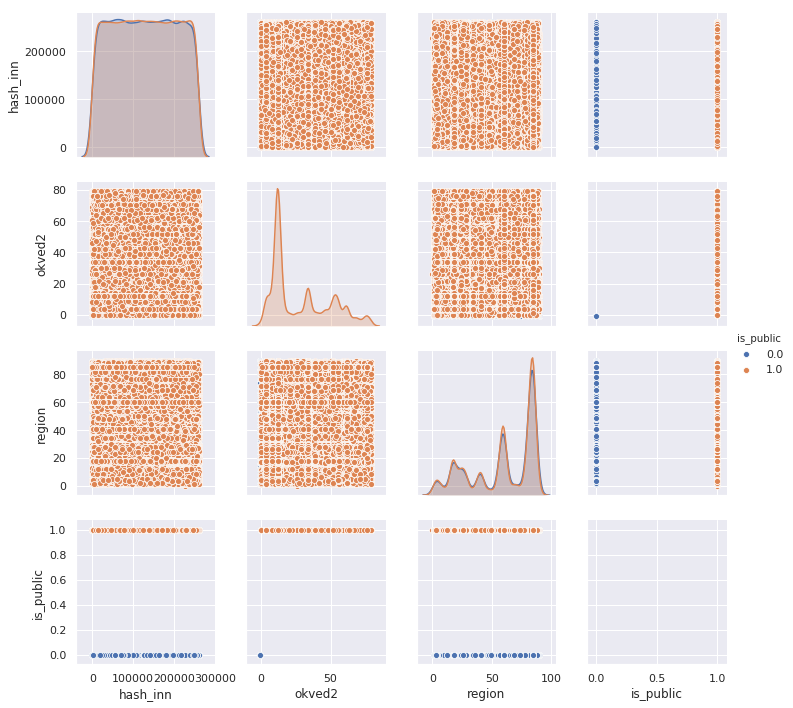

In [6]:
pair_plotter(inn.astype('float'), hue='is_public')

__Более детально рассмотрим распределение таргета okved2__

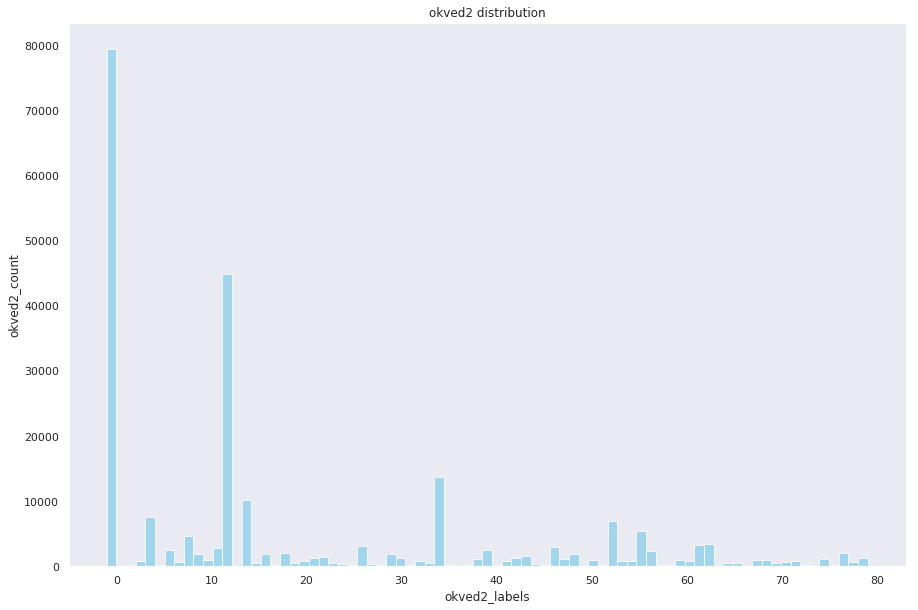

In [80]:
fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(111)
x = inn.okved2.values.tolist()
ax.hist(x, bins=max(x), fc='skyblue', alpha=0.75)
plt.title('okved2 distribution')
plt.ylabel('okved2_count')
plt.xlabel('okved2_labels')
plt.grid()
plt.show()
n = np.unique(x, return_counts=True)

__Численное представление распределения классов__

In [110]:
balance = sorted(list(zip(n[0], n[1])), key=operator.itemgetter(1), reverse=True)
print(f'{start}Distribution of classes in numbers{end}\n')
print(f'{start}Mean{end} observations: {np.mean(balance[1:], axis = 0)[1]} (except of "-1" class)')
print(f'{start}Median{end} observations: {np.median(balance[1:], axis = 0)[1]} (except of "-1" class)\n')
pprint(balance)

Distribution of classes in numbers

Mean observations: 2017.6875 (except of "-1" class)
Median observations: 783.5 (except of "-1" class)

[(-1, 78654),
 (12, 44918),
 (34, 13654),
 (14, 10179),
 (4, 7617),
 (52, 6986),
 (55, 5493),
 (8, 4658),
 (62, 3498),
 (61, 3194),
 (26, 3141),
 (46, 2969),
 (11, 2850),
 (39, 2577),
 (6, 2456),
 (56, 2307),
 (76, 2059),
 (18, 1999),
 (29, 1905),
 (9, 1887),
 (16, 1873),
 (48, 1847),
 (43, 1544),
 (22, 1385),
 (30, 1297),
 (21, 1254),
 (42, 1206),
 (74, 1132),
 (38, 1104),
 (47, 1067),
 (68, 1043),
 (67, 1022),
 (10, 1006),
 (50, 994),
 (79, 948),
 (59, 916),
 (54, 887),
 (20, 851),
 (3, 842),
 (0, 815),
 (53, 786),
 (32, 781),
 (60, 768),
 (71, 757),
 (41, 742),
 (7, 649),
 (77, 644),
 (70, 601),
 (19, 560),
 (23, 556),
 (65, 538),
 (64, 519),
 (33, 464),
 (69, 437),
 (15, 436),
 (24, 388),
 (78, 380),
 (44, 338),
 (27, 280),
 (57, 263),
 (28, 253),
 (5, 250),
 (17, 241),
 (40, 234),
 (58, 222),
 (25, 203),
 (75, 187),
 (37, 177),
 (45, 173),
 (31

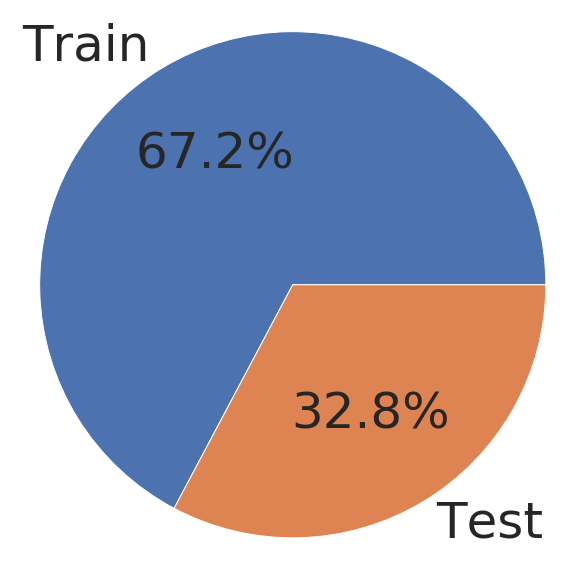

In [85]:
plt.figure(figsize=(10,10))
patches = plt.pie(inn['is_public'].value_counts().tolist(),
        labels=['Train', 'Test'],
        autopct='%1.1f%%')
plt.setp(patches[1:3], size=50)
axis = plt.axis('equal')

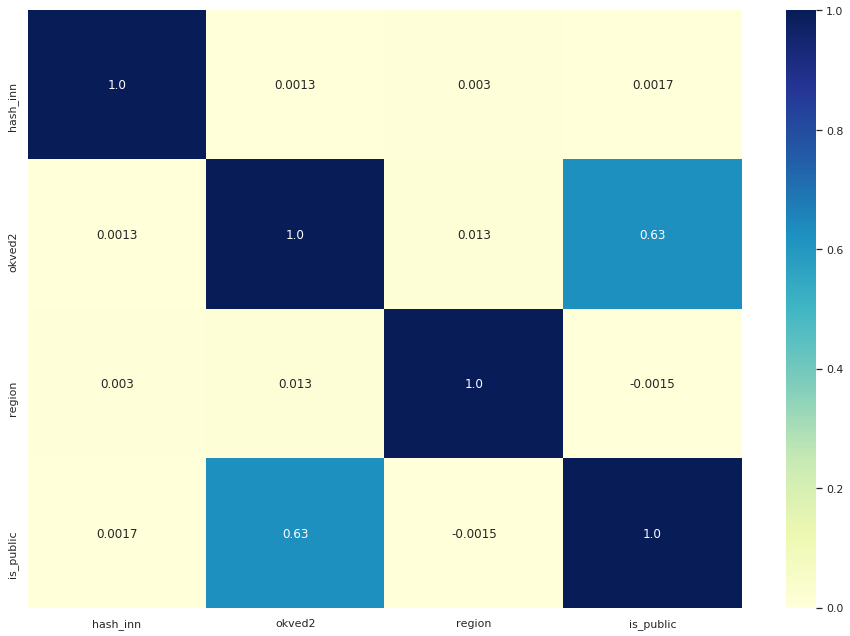

In [133]:
heatmap_plotter(inn)

## Data visualization of pays

<Figure size 1440x504 with 0 Axes>

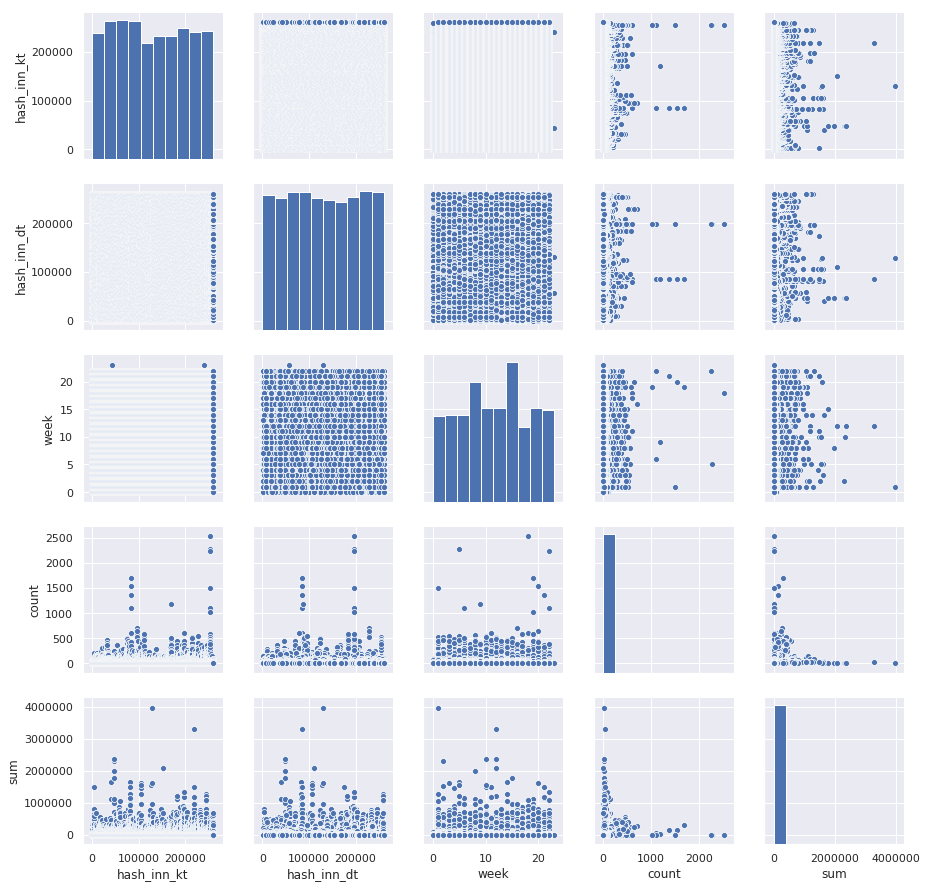

In [7]:
pair_plotter(data=pays)

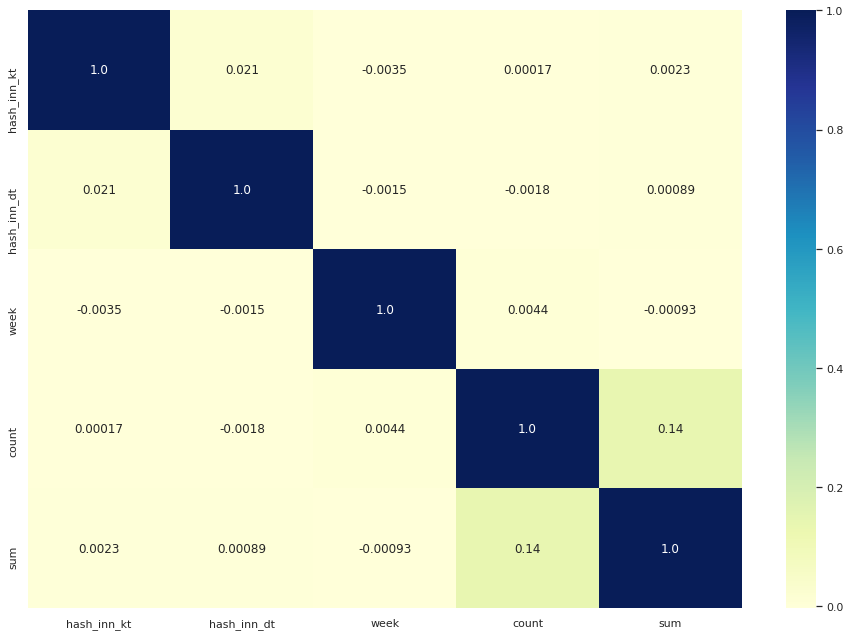

In [134]:
heatmap_plotter(pays)

### Мысли по задаче:

**Как определяется компания?**

Напрашивается аналогия с Word2Vec ( то что слово, определяется его контекстом, словами с которыми оно встречается в определенном диапазоне) хочется спроецировать это видение на нашу задачу, то есть, компания, определяется своими партнерами, теми с кем она сотрудничает, проводит транзакции, в общем кэшфлоу и взаимодействия, говорят о сфере деятельности организации

**Пример:**

Условно компания по производствоу октаоксида-триурана, работает и ведет крупные транзакции с поставщиками серной кислоты, ионнообменной смолы, и прочих специфичных хим-реагентов, плюс гигантские затраты на логистику, едва ли подобный n-мерный вектор имеет много общего с вектором компании занимающейся производством софта

## Data preprocessing

__Defining aggregation funcs__

In [195]:
def pz_extracter(column_from_inn):
    """
    Data extracter from inn dataframe
    
    Arguments:
    columns_from_inn -- pd.Series which values will be value in our output dict
    
    Returns:
    inn_dict -- python dictionary, with hash_inn - key, column_from_inn - value
    
    """
    train_dict = dict(zip(inn.hash_inn, column_from_inn))
    inn_dict = {}
    for item in all_operations_df.company_2.values:
        if item not in inn_dict:
            reg = train_dict.get(item, None)
            inn_dict[item] = reg
    return inn_dict

In [171]:
def target_dist_plotter(df_name):
    """
    Plots distribution of classes
    
    Arguments:
    df_name -- dataframe name, which classes distribution we gonna plot
    
    Returns:
    n -- nested list of each classes counts
    """
    fig = plt.figure(figsize=(15,10))
    ax = fig.add_subplot(111)
    x = df_name.target.values.tolist()
    ax.hist(x, bins=max(x), fc='skyblue', alpha=0.75)
    plt.title('target distribution')
    plt.ylabel('target_count')
    plt.xlabel('target_labels')
    plt.grid()
    plt.show()
    n = np.unique(x, return_counts=True)
    return n

In [172]:
def downsampler(target_value, objects_count):
    """
    Extracts random objects from trainset dataframe
    
    Arguments:
    target_value -- which class we gonna undersample
    objects_count -- shape[0] of extracted df
    
    Returns:
    downsampled -- undersampled df
    """
    downsampled = resample(trainset[trainset.target==target_value],
                                replace = False, 
                                n_samples = objects_count, 
                                random_state = 27) 
    return downsampled

In [6]:
pays.head(10)

,hash_inn_kt,hash_inn_dt,week,count,sum
0,0,0,1,4,38399.60
1,0,0,5,2,399.60
2,0,0,7,2,79.60
3,0,0,9,2,239.60
4,0,0,12,2,79.60
5,0,0,15,2,399.60
6,0,0,16,2,0.92
7,0,0,20,4,2399.60
8,0,0,21,4,0.80
9,0,0,22,2,239.60


__Идея по решению:__

Мы хотим сделать представление вида:
__Компания__ - ее взаимодействия со всеми __индустриями__ (изначально рассматривалась идея создания представления компании в пространстве других компаний, но она отпала в плане, что образуется 240к фичей, потом все это нужно будет сжать, большая потеря информации, очень ресурсоемко, поэтому было решено сразу отразить компанию в пространстве искомых нами индустрий)

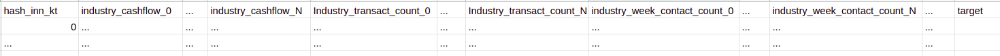

__Сагрегируем данные в стиле, hash_inn_kt - его взаимодейтсиве с компанией hash_inn_dt в целом__
 - sum (сумма всех платежей между ними)
 - count (общее число транзакций между ними)
 - week (число недель их взаимодействия)

In [5]:
grouped_pays_kt = pd.DataFrame(pays.groupby(['hash_inn_kt', 'hash_inn_dt']).agg({'count': 'sum', 'sum': 'sum','week':'count'})).reset_index()
grouped_pays_dt = pd.DataFrame(pays.groupby(['hash_inn_dt', 'hash_inn_kt']).agg({'count': 'sum', 'sum': 'sum','week':'count'})).reset_index()

__Посмотрим, нет ли компаний, для которых нет данных__

In [6]:
identified_companies = inn.hash_inn.values 

pays_inns_kt = grouped_pays_kt.hash_inn_kt.unique()
pays_inns_dt = grouped_pays_dt.hash_inn_dt.unique()
all_inns_in_pays = np.union1d(pays_inns_kt, pays_inns_dt)

common_vals = np.intersect1d(all_inns_in_pays, identified_companies)

In [7]:
not_identified_comps = np.setdiff1d(all_inns_in_pays, identified_companies)

__Нашлись 2 компании которые выпали из пересечения множеств всех компаний файла inn и смердженных датасэтов__ 

In [9]:
not_identified_comps

array([75120, 87315])

__Создаем датафрейм взаимодействий__

In [173]:
grouped_pays_kt = grouped_pays_kt.rename(columns={"hash_inn_kt": "company_1", "hash_inn_dt": "company_2"})
grouped_pays_dt = grouped_pays_dt.rename(columns={"hash_inn_dt": "company_1", "hash_inn_kt": "company_2"})

In [174]:
merged_df = pd.concat([grouped_pays_kt, grouped_pays_dt], axis=0, sort=False).reset_index()

In [175]:
merged_df = merged_df.drop('index', axis=1)

In [176]:
all_operations_df = merged_df.drop_duplicates(subset=None, keep='first', inplace=False)

In [177]:
useless_1_1 = all_operations_df[all_operations_df.company_1 == not_identified_comps[0]].index[0]
useless_1_2 = all_operations_df[all_operations_df.company_2 == not_identified_comps[0]].index[0]
useless_2_1 = all_operations_df[all_operations_df.company_1 == not_identified_comps[1]].index[0]
useless_2_2 = all_operations_df[all_operations_df.company_2 == not_identified_comps[1]].index[0]

In [178]:
all_operations_df = all_operations_df.drop([useless_1_1, useless_1_2, useless_2_1, useless_2_2])

In [192]:
all_operations_df

,company_1,company_2,count,sum,week
0,0,0,26,42238.520,10
1,0,7212,16,2463.384,7
2,0,11703,1,1462.800,1
3,0,25395,3,100.080,1
4,0,34686,5,1473.616,2
5,0,41812,3,107.600,1
6,0,47950,1,299.692,1
7,0,53971,12,8146.240,4
8,0,57889,3,-0.176,1
9,0,66361,2,2.000,1


In [200]:
region_dict = pz_extracter(inn.region)
industry_dict = pz_extracter(inn.okved2)

In [201]:
all_operations_df['company_2_region'] = all_operations_df['company_2'].apply(lambda row: region_dict[row])
all_operations_df['company_2_industry'] = all_operations_df['company_2'].apply(lambda row: industry_dict[row])

__Постепенно осуществляем нашу идею по отражению компании в пространстве индустрий, подтянув показатель индустрии ее партнера__

In [202]:
all_operations_df

,company_1,company_2,count,sum,week,company_2_region,company_2_industry
0,0,0,26,42238.520,10,84,-1
1,0,7212,16,2463.384,7,84,36
2,0,11703,1,1462.800,1,84,12
3,0,25395,3,100.080,1,60,52
4,0,34686,5,1473.616,2,58,-1
5,0,41812,3,107.600,1,57,55
6,0,47950,1,299.692,1,7,61
7,0,53971,12,8146.240,4,60,52
8,0,57889,3,-0.176,1,18,34
9,0,66361,2,2.000,1,84,-1


__Cоздадим датафрэйм присутствия компании в регионах, регион получим через референс с компании-партнера__

In [207]:
company_1_regions_presence = all_operations_df.groupby(['company_1', 'company_2_region'],sort=False)\
                                      .count()\
                                        .reset_index()[['company_1', 'company_2_region','count']]

In [211]:
company_1_regions_presence.head(3)

,company_1,company_2_region,count
0,0,84,75
1,0,60,36
2,0,58,2


__Создадим искомый датафрэйм, где у нас есть компания - и все индустрии с которой у нее отношения__

In [212]:
almost_finale_df = all_operations_df.groupby(['company_1', 'company_2_industry'],sort=False)\
                            .agg({'count': 'sum', 'week': 'sum','sum': 'sum'}).reset_index()

In [215]:
finale_df = almost_finale_df[almost_finale_df.company_2_industry!=-1].reset_index()

__Тадааам__

In [217]:
finale_df.head(20)

,index,company_1,company_2_industry,count,week,sum
0,1,0,36,18,9,6988.164
1,2,0,12,119,67,8222.796
2,3,0,52,61,20,157515.984
3,4,0,55,10,3,9207.432
4,5,0,61,10,6,1498.352
5,6,0,34,17,6,335.840
6,7,0,22,1,1,412.472
7,8,0,16,12,7,481.576
8,9,0,53,32,15,73.640
9,10,0,59,2,2,4796.136


__Теперь нужно проделать следующую итерацию для формирования нашего датасэта, для этого грубо говоря необходимо транспонировать__ ```finale_df``` __чтобы каждый показатель колонок__ ```week```__,__ ```count```__,__ ```sum```__стал значением в ячейке соответствующей ему колонки под номером индустрии__

In [218]:
feature_list = ['company_1'] + [i + str(j) for i in ['industry_cashflow_', 'industry_payment_count_', 'industry_week_count_'] \
                            for j in range(80)] + ['region_' + str(i) for i in range(91)]

In [219]:
model_dataframe = pd.DataFrame(0, index=np.arange(inn.shape[0]), columns=feature_list)

In [220]:
memory_usage()

RAM used in Mb: 3558.672


In [371]:
cols = model_dataframe.columns.values
uniq_vals = finale_df.company_1.unique()

In [228]:
for main_index, value in enumerate(tqdm(uniq_vals)):
    model_dataframe.loc[main_index, 'company_1'] = value
    buff_df = finale_df[finale_df.company_1==value]
    for index, val in enumerate(buff_df['company_2_industry'].values):
        sums = buff_df['sum'].values
        weeks = buff_df['week'].values
        counts = buff_df['count'].values
        model_dataframe.loc[main_index, cols[val + 1]]=sums[index]
        model_dataframe.loc[main_index, cols[val+1 + 160]]=weeks[index]
        model_dataframe.loc[main_index, cols[val+1 + 80]]=counts[index]


  0%|          | 770/210360 [00:53<3:47:58, 15.32it/s]


  1%|          | 1628/210360 [01:12<1:59:46, 29.04it/s]


  1%|          | 2457/210360 [01:32<1:25:49, 40.37it/s]


  2%|▏         | 3276/210360 [01:52<1:50:12, 31.32it/s]


  2%|▏         | 4101/210360 [02:12<1:31:56, 37.39it/s]


  2%|▏         | 4902/210360 [02:33<2:22:00, 24.11it/s]


  3%|▎         | 5726/210360 [02:52<1:06:05, 51.60it/s]


  3%|▎         | 6560/210360 [03:12<1:10:26, 48.21it/s]


  4%|▎         | 7376/210360 [03:32<1:08:49, 49.16it/s]


  4%|▍         | 8203/210360 [03:52<1:09:36, 48.40it/s]


  4%|▍         | 9036/210360 [04:12<1:25:42, 39.15it/s]


  5%|▍         | 9858/210360 [04:33<1:12:04, 46.36it/s]


  5%|▌         | 10637/210360 [04:53<1:08:15, 48.76it/s]


  5%|▌         | 11424/210360 [05:13<1:22:00, 40.43it/s]


  6%|▌         | 12248/210360 [05:33<1:03:30, 52.00it/s]


  6%|▌         | 13040/210360 [05:53<2:05:15, 26.25it/s]


  7%|▋         | 13848/210360 [06:12<1:42:23, 31.99it/s]


  7%|▋         | 14624/210360 [06:31<1:17:44, 41.96it/s]


  7%|▋         | 15424/210360 [06:53<1:28:17, 36.80it/s]


  8%|▊         | 16215/210360 [07:12<1:09:50, 46.33it/s]


  8%|▊         | 17046/210360 [07:32<1:46:13, 30.33it/s]


  8%|▊         | 17864/210360 [07:52<1:46:45, 30.05it/s]


  9%|▉         | 18679/210360 [08:11<1:18:33, 40.67it/s]


  9%|▉         | 19459/210360 [08:31<1:04:48, 49.09it/s]


 10%|▉         | 20262/210360 [08:51<1:34:56, 33.37it/s]


 10%|█         | 21060/210360 [09:11<1:19:37, 39.63it/s]


 10%|█         | 21877/210360 [09:30<1:36:52, 32.43it/s]


 11%|█         | 22722/210360 [09:50<1:41:03, 30.95it/s]


 11%|█         | 23523/210360 [10:10<1:21:34, 38.17it/s]


 12%|█▏        | 24368/210360 [10:29<1:05:47, 47.12it/s]


 12%|█▏        | 25155/210360 [10:49<1:08:35, 45.01it/s]


 12%|█▏        | 25990/210360 [11:08<1:32:40, 33.16it/s]


 13%|█▎        | 26785/210360 [11:29<1:25:22, 35.84it/s]


 13%|█▎        | 27585/210360 [11:48<1:31:08, 33.42it/s]


 14%|█▎        | 28423/210360 [12:07<1:17:40, 39.04it/s]


 14%|█▍        | 29190/210360 [12:26<1:15:59, 39.74it/s]


 14%|█▍        | 29944/210360 [12:46<1:32:02, 32.67it/s]


 15%|█▍        | 30710/210360 [13:06<1:12:09, 41.49it/s]


 15%|█▍        | 31548/210360 [13:26<1:11:03, 41.94it/s]


 15%|█▌        | 32346/210360 [13:46<1:10:34, 42.04it/s]


 16%|█▌        | 33159/210360 [14:06<1:19:12, 37.29it/s]


 16%|█▌        | 33927/210360 [14:27<56:42, 51.86it/s]  


 16%|█▋        | 34441/210360 [14:51<2:16:35, 21.47it/s]


 17%|█▋        | 34930/210360 [15:14<1:07:16, 43.46it/s]


 17%|█▋        | 35710/210360 [15:34<1:11:37, 40.64it/s]


 17%|█▋        | 36559/210360 [15:53<55:41, 52.02it/s]  


 18%|█▊        | 37332/210360 [16:12<1:06:25, 43.42it/s]


 18%|█▊        | 38134/210360 [16:32<1:25:31, 33.56it/s]


 19%|█▊        | 38918/210360 [16:51<1:18:35, 36.36it/s]


 19%|█▉        | 39738/210360 [17:11<1:21:38, 34.83it/s]


 19%|█▉        | 40593/210360 [17:31<1:15:50, 37.31it/s]


 20%|█▉        | 41431/210360 [17:52<1:44:17, 27.00it/s]


 20%|██        | 42253/210360 [18:11<1:35:47, 29.25it/s]


 20%|██        | 43075/210360 [18:31<53:55, 51.70it/s]


 21%|██        | 43900/210360 [18:50<43:52, 63.22it/s]


 21%|██▏       | 44735/210360 [19:10<50:39, 54.49it/s]


 22%|██▏       | 45557/210360 [19:30<53:27, 51.38it/s]


 22%|██▏       | 46404/210360 [19:51<54:45, 49.90it/s]


 22%|██▏       | 47216/210360 [20:11<54:05, 50.27it/s]  


 23%|██▎       | 48070/210360 [20:31<1:11:10, 38.00it/s]


 23%|██▎       | 48889/210360 [20:51<1:23:00, 32.42it/s]


 24%|██▎       | 49731/210360 [21:11<1:01:27, 43.56it/s]


 24%|██▍       | 50576/210360 [21:31<1:15:49, 35.12it/s]


 24%|██▍       | 51421/210360 [21:50<1:16:21, 34.69it/s]


 25%|██▍       | 52284/210360 [22:10<1:40:52, 26.12it/s]


 25%|██▌       | 53141/210360 [22:30<1:11:13, 36.79it/s]


 26%|██▌       | 53963/210360 [22:50<1:16:54, 33.89it/s]


 26%|██▌       | 54850/210360 [23:09<46:32, 55.70it/s]


 26%|██▋       | 55716/210360 [23:29<1:17:22, 33.31it/s]


 27%|██▋       | 56551/210360 [23:49<2:03:30, 20.76it/s]


 27%|██▋       | 57379/210360 [24:09<56:36, 45.04it/s]  


 28%|██▊       | 58251/210360 [24:28<1:03:59, 39.61it/s]


 28%|██▊       | 59068/210360 [24:48<1:11:52, 35.08it/s]


 28%|██▊       | 59908/210360 [25:09<53:45, 46.64it/s]


 29%|██▉       | 60724/210360 [25:29<1:02:16, 40.05it/s]


 29%|██▉       | 61549/210360 [25:48<1:01:24, 40.39it/s]


 30%|██▉       | 62377/210360 [26:07<54:30, 45.24it/s]  


 30%|███       | 63210/210360 [26:27<1:00:07, 40.79it/s]


 30%|███       | 64055/210360 [26:47<1:00:16, 40.46it/s]


 31%|███       | 64880/210360 [27:07<1:02:24, 38.85it/s]


 31%|███       | 65711/210360 [27:27<1:03:23, 38.03it/s]


 32%|███▏      | 66577/210360 [27:47<54:09, 44.25it/s]


 32%|███▏      | 67454/210360 [28:07<56:01, 42.51it/s]


 32%|███▏      | 68314/210360 [28:27<50:36, 46.78it/s]


 33%|███▎      | 69175/210360 [28:47<1:08:31, 34.34it/s]


 33%|███▎      | 70040/210360 [29:07<48:55, 47.81it/s]


 34%|███▎      | 70895/210360 [29:28<1:00:46, 38.24it/s]


 34%|███▍      | 71737/210360 [29:48<48:34, 47.57it/s]


 35%|███▍      | 72587/210360 [30:08<56:05, 40.93it/s]


 35%|███▍      | 73413/210360 [30:29<46:31, 49.06it/s]


 35%|███▌      | 74260/210360 [30:48<44:36, 50.84it/s]


 36%|███▌      | 75083/210360 [31:08<57:57, 38.90it/s]


 36%|███▌      | 75931/210360 [31:28<46:35, 48.08it/s]


 37%|███▋      | 76814/210360 [31:47<47:06, 47.25it/s]


 37%|███▋      | 77661/210360 [32:08<1:06:50, 33.09it/s]


 37%|███▋      | 78549/210360 [32:27<55:38, 39.49it/s]


 38%|███▊      | 79382/210360 [32:47<42:07, 51.83it/s]


 38%|███▊      | 80208/210360 [33:07<51:52, 41.82it/s]


 39%|███▊      | 81100/210360 [33:27<1:00:08, 35.82it/s]


 39%|███▉      | 81961/210360 [33:47<1:02:33, 34.20it/s]


 39%|███▉      | 82803/210360 [34:06<59:47, 35.56it/s]  


 40%|███▉      | 83624/210360 [34:27<52:51, 39.96it/s]


 40%|████      | 84453/210360 [34:47<38:24, 54.65it/s]


 41%|████      | 85279/210360 [35:07<1:17:05, 27.04it/s]


 41%|████      | 86142/210360 [35:28<1:06:04, 31.33it/s]


 41%|████▏     | 87007/210360 [35:48<49:51, 41.24it/s]


 42%|████▏     | 87865/210360 [36:08<50:34, 40.37it/s]


 42%|████▏     | 88690/210360 [36:28<1:05:15, 31.07it/s]


 43%|████▎     | 89550/210360 [36:48<52:44, 38.18it/s]


 43%|████▎     | 90412/210360 [37:08<1:00:02, 33.29it/s]


 43%|████▎     | 91282/210360 [37:29<40:32, 48.95it/s]


 44%|████▍     | 92138/210360 [37:49<1:01:43, 31.92it/s]


 44%|████▍     | 92977/210360 [38:10<43:31, 44.95it/s]


 45%|████▍     | 93817/210360 [38:31<52:11, 37.21it/s]  


 45%|████▌     | 94697/210360 [38:51<49:45, 38.74it/s]


 45%|████▌     | 95554/210360 [39:12<52:04, 36.75it/s]  


 46%|████▌     | 96419/210360 [39:31<41:49, 45.41it/s]


 46%|████▌     | 97275/210360 [39:52<46:04, 40.91it/s]


 47%|████▋     | 98108/210360 [40:13<1:18:59, 23.68it/s]


 48%|████▊     | 101107/210360 [41:22<42:52, 42.46it/s]


 48%|████▊     | 101925/210360 [41:43<45:08, 40.04it/s]


 49%|████▉     | 102813/210360 [42:03<53:15, 33.66it/s]


 49%|████▉     | 103666/210360 [42:23<37:30, 47.41it/s]


 50%|████▉     | 104512/210360 [42:43<29:23, 60.03it/s]


 50%|█████     | 105321/210360 [43:03<43:09, 40.56it/s]


 50%|█████     | 106157/210360 [43:23<36:39, 47.37it/s]


 51%|█████     | 106405/210360 [43:30<40:59, 42.26it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)


 52%|█████▏    | 109956/210360 [44:53<34:54, 47.93it/s]


 53%|█████▎    | 110735/210360 [45:13<35:14, 47.11it/s]


 53%|█████▎    | 111539/210360 [45:33<32:08, 51.25it/s]


 53%|█████▎    | 112345/210360 [45:53<38:23, 42.55it/s]


 54%|█████▍    | 113117/210360 [46:13<50:16, 32.24it/s]


 54%|█████▍    | 113917/210360 [46:33<47:05, 34.13it/s]


 55%|█████▍    | 114690/210360 [46:54<55:02, 28.97it/s]


 55%|█████▍    | 115490/210360 [47:14<49:10, 32.15it/s]


 55%|█████▌    | 116253/210360 [47:34<28:44, 54.57it/s]


 56%|█████▌    | 117028/210360 [47:55<38:49, 40.07it/s]


 56%|█████▌    | 117820/210360 [48:15<32:46, 47.05it/s]


 56%|█████▋    | 118644/210360 [48:35<38:17, 39.92it/s]


 57%|█████▋    | 119500/210360 [48:55<30:34, 49.54it/s]


 57%|█████▋    | 120297/210360 [49:15<39:57, 37.56it/s]


 58%|█████▊    | 121109/210360 [49:36<43:06, 34.51it/s]


 58%|█████▊    | 121930/210360 [49:56<34:56, 42.18it/s]


 58%|█████▊    | 122774/210360 [50:16<36:12, 40.32it/s]


 59%|█████▉    | 123635/210360 [50:35<33:37, 42.99it/s]


 59%|█████▉    | 124457/210360 [50:56<34:48, 41.12it/s]


 60%|█████▉    | 125216/210360 [51:17<48:42, 29.14it/s]


 60%|█████▉    | 126014/210360 [51:37<50:20, 27.93it/s]


 60%|██████    | 126833/210360 [51:57<1:04:24, 21.61it/s]


 61%|██████    | 127597/210360 [52:16<30:17, 45.54it/s]


 61%|██████    | 128409/210360 [52:36<32:25, 42.13it/s]


 61%|██████▏   | 129194/210360 [52:57<43:42, 30.95it/s]


 62%|██████▏   | 130040/210360 [53:17<14:26, 92.72it/s]


 63%|██████▎   | 131598/210360 [53:32<11:45, 111.58it/s]


 63%|██████▎   | 133160/210360 [53:48<13:05, 98.23it/s] 


 64%|██████▍   | 134707/210360 [54:03<13:50, 91.13it/s]


 65%|██████▍   | 136296/210360 [54:19<11:56, 103.34it/s]


 66%|██████▌   | 137819/210360 [54:35<14:34, 82.97it/s]


 66%|██████▌   | 138687/210360 [54:53<39:53, 29.95it/s]


 66%|██████▌   | 139223/210360 [55:12<51:01, 23.23it/s]


 66%|██████▋   | 139725/210360 [55:31<36:11, 32.52it/s]


 67%|██████▋   | 140042/210360 [55:50<49:51, 23.51it/s]


 67%|██████▋   | 140374/210360 [56:10<1:12:46, 16.03it/s]


 67%|██████▋   | 140707/210360 [56:30<1:21:45, 14.20it/s]


 67%|██████▋   | 140994/210360 [56:52<2:11:50,  8.77it/s]


 67%|██████▋   | 141277/210360 [57:14<1:45:33, 10.91it/s]


 67%|██████▋   | 141581/210360 [57:35<1:15:08, 15.26it/s]


 67%|██████▋   | 141943/210360 [57:55<55:16, 20.63it/s]


 68%|██████▊   | 142384/210360 [58:14<47:16, 23.96it/s]


 68%|██████▊   | 143006/210360 [58:32<39:09, 28.66it/s]


 69%|██████▊   | 144179/210360 [58:48<09:34, 115.29it/s]


 69%|██████▉   | 145672/210360 [59:04<19:00, 56.71it/s]


 70%|██████▉   | 146512/210360 [59:22<22:41, 46.89it/s]


 70%|██████▉   | 147181/210360 [59:41<28:50, 36.52it/s]


 70%|███████   | 147600/210360 [1:00:00<52:47, 19.81it/s]


 70%|███████   | 147938/210360 [1:00:20<1:02:18, 16.70it/s]


 70%|███████   | 148246/210360 [1:00:40<1:20:56, 12.79it/s]


 71%|███████   | 148535/210360 [1:01:00<1:01:16, 16.82it/s]


 71%|███████   | 148803/210360 [1:01:21<1:55:57,  8.85it/s]


 71%|███████   | 149078/210360 [1:01:43<1:03:09, 16.17it/s]


 71%|███████   | 149372/210360 [1:02:03<1:10:28, 14.42it/s]


 71%|███████   | 149637/210360 [1:02:23<1:12:20, 13.99it/s]


 71%|███████▏  | 149901/210360 [1:02:45<1:12:04, 13.98it/s]


 71%|███████▏  | 150175/210360 [1:03:07<1:28:07, 11.38it/s]


 72%|███████▏  | 150445/210360 [1:03:30<1:27:30, 11.41it/s]


 72%|███████▏  | 150743/210360 [1:03:52<1:15:52, 13.09it/s]


 72%|███████▏  | 151056/210360 [1:04:13<1:27:23, 11.31it/s]


 72%|███████▏  | 151374/210360 [1:04:34<57:55, 16.97it/s]


 72%|███████▏  | 151658/210360 [1:04:54<1:28:15, 11.08it/s]


 72%|███████▏  | 152050/210360 [1:05:14<1:11:13, 13.64it/s]


 72%|███████▏  | 152340/210360 [1:05:34<1:04:07, 15.08it/s]


 73%|███████▎  | 152699/210360 [1:05:53<36:07, 26.60it/s]


 73%|███████▎  | 153090/210360 [1:06:12<52:51, 18.06it/s]


 73%|███████▎  | 153468/210360 [1:06:31<47:16, 20.05it/s]


 73%|███████▎  | 153926/210360 [1:06:50<41:03, 22.91it/s]


 73%|███████▎  | 154340/210360 [1:07:09<32:59, 28.30it/s]


 74%|███████▎  | 154742/210360 [1:07:29<27:03, 34.26it/s]


 74%|███████▍  | 155205/210360 [1:07:48<1:02:48, 14.64it/s]


 74%|███████▍  | 155641/210360 [1:08:09<48:30, 18.80it/s]


 74%|███████▍  | 156030/210360 [1:08:28<46:39, 19.41it/s]


 74%|███████▍  | 156402/210360 [1:08:48<54:19, 16.55it/s]


 75%|███████▍  | 156862/210360 [1:09:07<46:45, 19.07it/s]


 75%|███████▍  | 157305/210360 [1:09:26<40:20, 21.92it/s]


 75%|███████▍  | 157751/210360 [1:09:45<38:30, 22.77it/s]


 75%|███████▌  | 158152/210360 [1:10:05<1:01:44, 14.09it/s]


 75%|███████▌  | 158538/210360 [1:10:26<1:03:45, 13.55it/s]


 76%|███████▌  | 158866/210360 [1:10:46<1:03:20, 13.55it/s]


 76%|███████▌  | 159186/210360 [1:11:06<28:02, 30.42it/s]


 76%|███████▌  | 159507/210360 [1:11:25<46:58, 18.04it/s]


 76%|███████▌  | 159907/210360 [1:11:44<36:57, 22.75it/s]


 76%|███████▋  | 160510/210360 [1:12:02<32:30, 25.55it/s]


 77%|███████▋  | 161002/210360 [1:12:20<29:18, 28.07it/s]


 77%|███████▋  | 161391/210360 [1:12:40<34:25, 23.71it/s]


 77%|███████▋  | 161852/210360 [1:13:00<33:50, 23.89it/s]


 78%|███████▊  | 163069/210360 [1:13:15<07:16, 108.37it/s]


 78%|███████▊  | 164319/210360 [1:13:32<16:27, 46.64it/s]


 78%|███████▊  | 164944/210360 [1:13:49<28:59, 26.11it/s]


 79%|███████▊  | 165357/210360 [1:14:09<34:43, 21.60it/s]


 79%|███████▉  | 165801/210360 [1:14:28<39:49, 18.65it/s]


 79%|███████▉  | 166244/210360 [1:14:46<18:20, 40.09it/s]


 79%|███████▉  | 166705/210360 [1:15:05<51:50, 14.03it/s]


 79%|███████▉  | 167079/210360 [1:15:24<41:21, 17.44it/s]


 80%|███████▉  | 167594/210360 [1:15:43<19:59, 35.65it/s]


 80%|███████▉  | 168121/210360 [1:16:01<30:28, 23.10it/s]


 80%|████████  | 168540/210360 [1:16:22<43:00, 16.21it/s]


 80%|████████  | 168931/210360 [1:16:41<26:41, 25.86it/s]


 81%|████████  | 169451/210360 [1:16:59<34:58, 19.50it/s]


 81%|████████  | 169892/210360 [1:17:18<36:24, 18.53it/s]


 81%|████████  | 170271/210360 [1:17:38<33:04, 20.20it/s]


 81%|████████  | 170692/210360 [1:17:58<37:54, 17.44it/s]


 81%|████████▏ | 171114/210360 [1:18:17<30:26, 21.49it/s]


 82%|████████▏ | 171500/210360 [1:18:37<30:23, 21.31it/s]


 82%|████████▏ | 172068/210360 [1:18:55<11:03, 57.71it/s]


 82%|████████▏ | 172645/210360 [1:19:14<27:03, 23.23it/s]


 82%|████████▏ | 173115/210360 [1:19:33<22:10, 28.00it/s]


 83%|████████▎ | 173574/210360 [1:19:52<26:44, 22.93it/s]


 83%|████████▎ | 174102/210360 [1:20:11<15:24, 39.20it/s]


 83%|████████▎ | 174719/210360 [1:20:29<31:29, 18.87it/s]


 83%|████████▎ | 175138/210360 [1:20:48<21:43, 27.02it/s]


 83%|████████▎ | 175590/210360 [1:21:08<20:46, 27.88it/s]


 84%|████████▎ | 175955/210360 [1:21:28<29:06, 19.70it/s]


 84%|████████▍ | 176418/210360 [1:21:48<30:23, 18.61it/s]


 84%|████████▍ | 177002/210360 [1:22:06<13:04, 42.50it/s]


 85%|████████▍ | 177760/210360 [1:22:24<10:20, 52.52it/s]


 85%|████████▍ | 178770/210360 [1:22:40<11:33, 45.52it/s]


 85%|████████▌ | 179284/210360 [1:22:59<29:32, 17.53it/s]


 85%|████████▌ | 179742/210360 [1:23:17<17:49, 28.63it/s]


 86%|████████▌ | 180139/210360 [1:23:37<32:45, 15.38it/s]


 86%|████████▌ | 180518/210360 [1:23:57<17:20, 28.67it/s]


 86%|████████▌ | 181116/210360 [1:24:15<14:43, 33.08it/s]


 86%|████████▋ | 181626/210360 [1:24:33<18:04, 26.50it/s]


 87%|████████▋ | 182360/210360 [1:24:50<11:12, 41.63it/s]


 87%|████████▋ | 182937/210360 [1:25:08<14:38, 31.23it/s]


 87%|████████▋ | 183409/210360 [1:25:26<19:29, 23.05it/s]


 87%|████████▋ | 183978/210360 [1:25:45<15:54, 27.65it/s]


 88%|████████▊ | 184487/210360 [1:26:03<16:00, 26.93it/s]


 88%|████████▊ | 184994/210360 [1:26:21<18:45, 22.54it/s]


 88%|████████▊ | 185567/210360 [1:26:40<15:51, 26.06it/s]


 88%|████████▊ | 186031/210360 [1:27:00<24:36, 16.48it/s]


 89%|████████▊ | 186540/210360 [1:27:19<18:53, 21.01it/s]


 89%|████████▉ | 187057/210360 [1:27:37<09:20, 41.56it/s]


 89%|████████▉ | 187710/210360 [1:27:55<17:58, 20.99it/s]


 89%|████████▉ | 188125/210360 [1:28:15<23:47, 15.58it/s]


 90%|████████▉ | 188591/210360 [1:28:35<18:38, 19.46it/s]


 90%|████████▉ | 188999/210360 [1:28:54<11:35, 30.72it/s]


 90%|█████████ | 189507/210360 [1:29:12<13:40, 25.41it/s]


 90%|█████████ | 189920/210360 [1:29:32<14:33, 23.41it/s]


 91%|█████████ | 190428/210360 [1:29:49<12:56, 25.68it/s]


 91%|█████████ | 190930/210360 [1:30:07<11:50, 27.34it/s]


 91%|█████████ | 191417/210360 [1:30:27<12:32, 25.16it/s]


 91%|█████████ | 191853/210360 [1:30:46<16:21, 18.86it/s]


 91%|█████████▏| 192300/210360 [1:31:05<10:40, 28.22it/s]


 92%|█████████▏| 192946/210360 [1:31:22<09:47, 29.67it/s]


 92%|█████████▏| 193529/210360 [1:31:41<11:59, 23.40it/s]


 92%|█████████▏| 194027/210360 [1:31:59<10:42, 25.44it/s]


 93%|█████████▎| 194664/210360 [1:32:17<08:12, 31.84it/s]


 93%|█████████▎| 195136/210360 [1:32:35<08:03, 31.51it/s]


 93%|█████████▎| 195644/210360 [1:32:54<10:21, 23.70it/s]


 93%|█████████▎| 196122/210360 [1:33:13<08:33, 27.72it/s]


 93%|█████████▎| 196595/210360 [1:33:31<10:47, 21.25it/s]


 94%|█████████▎| 197062/210360 [1:33:50<09:26, 23.47it/s]


 94%|█████████▍| 197588/210360 [1:34:09<10:02, 21.20it/s]


 94%|█████████▍| 198158/210360 [1:34:28<11:59, 16.95it/s]


 94%|█████████▍| 198495/210360 [1:34:49<13:46, 14.35it/s]


 95%|█████████▍| 198890/210360 [1:35:08<08:35, 22.24it/s]


 95%|█████████▍| 199372/210360 [1:35:27<04:05, 44.83it/s]


 95%|█████████▌| 200270/210360 [1:35:44<04:57, 33.97it/s]


 96%|█████████▌| 201387/210360 [1:36:01<04:31, 33.05it/s]


 96%|█████████▌| 201957/210360 [1:36:19<04:59, 28.10it/s]


 96%|█████████▌| 202429/210360 [1:36:37<05:02, 26.24it/s]


 97%|█████████▋| 203195/210360 [1:36:55<02:42, 44.19it/s]


 97%|█████████▋| 203850/210360 [1:37:13<03:19, 32.58it/s]


 97%|█████████▋| 204352/210360 [1:37:31<05:04, 19.73it/s]


 97%|█████████▋| 204704/210360 [1:37:51<08:16, 11.38it/s]


 97%|█████████▋| 205008/210360 [1:38:13<08:11, 10.89it/s]


 98%|█████████▊| 205288/210360 [1:38:35<04:59, 16.95it/s]


 98%|█████████▊| 205633/210360 [1:38:56<05:51, 13.45it/s]


 98%|█████████▊| 206046/210360 [1:39:16<03:54, 18.43it/s]


 98%|█████████▊| 206425/210360 [1:39:37<02:25, 27.03it/s]


 98%|█████████▊| 206836/210360 [1:39:56<02:16, 25.73it/s]


 99%|█████████▊| 207226/210360 [1:40:16<02:32, 20.57it/s]


 99%|█████████▊| 207717/210360 [1:40:35<01:38, 26.97it/s]


 99%|█████████▉| 208207/210360 [1:40:53<00:57, 37.24it/s]


 99%|█████████▉| 208776/210360 [1:41:10<00:49, 32.19it/s]


100%|█████████▉| 209349/210360 [1:41:28<00:39, 25.42it/s]


100%|█████████▉| 209862/210360 [1:41:47<00:24, 20.55it/s]


100%|█████████▉| 210247/210360 [1:42:06<00:05, 21.86it/s]


100%|██████████| 210360/210360 [1:42:11<00:00, 34.31it/s]


In [291]:
model_dataframe.to_csv('model_dataframe.csv', sep=',', index=False)

In [10]:
model_dataframe = pd.read_csv('model_dataframe.csv')

In [247]:
model_dataframe['target'] = model_dataframe.company_1.apply(lambda row: okved_dict[row])

In [365]:
feature_list_1 = ['region_' + str(i) for i in range(91)]

In [366]:
region_dataframe = pd.DataFrame(0, index=np.arange(210360), columns=feature_list_1)

In [369]:
cols_1 = region_dataframe.columns.values

In [372]:
for index, value in enumerate(tqdm(company_1_regions_presence.company_1.unique())):
    slice_df = company_1_regions_presence[company_1_regions_presence.company_1==value]
    cnts = slice_df['count'].values
    for ind, val in enumerate(slice_df['company_2_region'].values):
        region_dataframe.loc[index, cols_1[val]] = cnts[ind]







  0%|          | 0/240069 [00:00<?, ?it/s]





  0%|          | 1/240069 [00:00<8:39:09,  7.71it/s]





  0%|          | 8/240069 [00:00<6:23:27, 10.43it/s]





  0%|          | 13/240069 [00:00<4:53:53, 13.61it/s]





  0%|          | 27/240069 [00:00<3:37:16, 18.41it/s]





  0%|          | 36/240069 [00:00<2:45:34, 24.16it/s]





  0%|          | 48/240069 [00:00<2:07:13, 31.44it/s]





  0%|          | 62/240069 [00:00<1:37:44, 40.93it/s]





  0%|          | 78/240069 [00:00<1:17:22, 51.69it/s]





  0%|          | 89/240069 [00:01<1:05:46, 60.81it/s]





  0%|          | 100/240069 [00:01<58:08, 68.78it/s] 





  0%|          | 112/240069 [00:01<52:14, 76.54it/s]





  0%|          | 125/240069 [00:01<46:01, 86.89it/s]





  0%|          | 139/240069 [00:01<43:01, 92.93it/s]





  0%|          | 151/240069 [00:01<40:48, 98.00it/s]





  0%|          | 163/240069 [00:01<40:04, 99.77it/s]





  0%|          | 174/240069 [00:01<45:18, 88.25it/s]





  0%|     

  1%|          | 1864/240069 [00:12<24:47, 160.19it/s]





  1%|          | 1882/240069 [00:12<24:05, 164.76it/s]





  1%|          | 1899/240069 [00:12<24:50, 159.83it/s]





  1%|          | 1916/240069 [00:12<25:02, 158.51it/s]





  1%|          | 1933/240069 [00:12<25:25, 156.08it/s]





  1%|          | 1954/240069 [00:12<23:31, 168.67it/s]





  1%|          | 1972/240069 [00:13<24:35, 161.41it/s]





  1%|          | 1989/240069 [00:13<24:46, 160.16it/s]





  1%|          | 2006/240069 [00:13<30:01, 132.14it/s]





  1%|          | 2021/240069 [00:13<33:41, 117.74it/s]





  1%|          | 2034/240069 [00:13<37:03, 107.03it/s]





  1%|          | 2046/240069 [00:13<39:21, 100.81it/s]





  1%|          | 2057/240069 [00:13<40:39, 97.58it/s] 





  1%|          | 2068/240069 [00:14<40:35, 97.73it/s]





  1%|          | 2079/240069 [00:14<48:10, 82.34it/s]





  1%|          | 2092/240069 [00:14<43:01, 92.18it/s]





  1%|          | 2103/240069 [00:14<42:59, 

  1%|▏         | 3079/240069 [00:25<41:33, 95.03it/s]





  1%|▏         | 3092/240069 [00:25<40:20, 97.90it/s]





  1%|▏         | 3102/240069 [00:25<44:40, 88.41it/s]





  1%|▏         | 3112/240069 [00:25<47:44, 82.72it/s]





  1%|▏         | 3124/240069 [00:25<44:53, 87.96it/s]





  1%|▏         | 3134/240069 [00:25<43:48, 90.13it/s]





  1%|▏         | 3144/240069 [00:25<43:41, 90.36it/s]





  1%|▏         | 3154/240069 [00:25<45:45, 86.29it/s]





  1%|▏         | 3163/240069 [00:26<46:18, 85.28it/s]





  1%|▏         | 3172/240069 [00:26<47:54, 82.43it/s]





  1%|▏         | 3181/240069 [00:26<51:23, 76.84it/s]





  1%|▏         | 3190/240069 [00:26<49:07, 80.35it/s]





  1%|▏         | 3199/240069 [00:26<47:42, 82.76it/s]





  1%|▏         | 3209/240069 [00:26<46:04, 85.68it/s]





  1%|▏         | 3223/240069 [00:26<42:52, 92.08it/s]





  1%|▏         | 3234/240069 [00:26<42:18, 93.30it/s]





  1%|▏         | 3244/240069 [00:26<43:58, 89.74it/s]




  2%|▏         | 4176/240069 [00:37<40:16, 97.63it/s]





  2%|▏         | 4187/240069 [00:37<40:43, 96.52it/s]





  2%|▏         | 4200/240069 [00:37<39:09, 100.38it/s]





  2%|▏         | 4211/240069 [00:37<45:00, 87.33it/s] 





  2%|▏         | 4222/240069 [00:38<43:08, 91.13it/s]





  2%|▏         | 4232/240069 [00:38<43:25, 90.50it/s]





  2%|▏         | 4243/240069 [00:38<41:21, 95.05it/s]





  2%|▏         | 4255/240069 [00:38<39:33, 99.37it/s]





  2%|▏         | 4266/240069 [00:38<38:59, 100.78it/s]





  2%|▏         | 4277/240069 [00:38<49:18, 79.71it/s] 





  2%|▏         | 4286/240069 [00:38<49:11, 79.87it/s]





  2%|▏         | 4295/240069 [00:38<47:42, 82.36it/s]





  2%|▏         | 4306/240069 [00:39<45:51, 85.69it/s]





  2%|▏         | 4315/240069 [00:39<47:21, 82.96it/s]





  2%|▏         | 4327/240069 [00:39<44:31, 88.25it/s]





  2%|▏         | 4337/240069 [00:39<49:06, 79.99it/s]





  2%|▏         | 4348/240069 [00:39<45:06, 87.10it/s

  2%|▏         | 5291/240069 [00:50<59:53, 65.33it/s]





  2%|▏         | 5299/240069 [00:50<57:19, 68.25it/s]





  2%|▏         | 5308/240069 [00:50<55:47, 70.13it/s]





  2%|▏         | 5316/240069 [00:50<54:31, 71.75it/s]





  2%|▏         | 5324/240069 [00:50<1:04:05, 61.04it/s]





  2%|▏         | 5331/240069 [00:50<1:04:43, 60.45it/s]





  2%|▏         | 5340/240069 [00:51<58:55, 66.39it/s]  





  2%|▏         | 5349/240069 [00:51<56:22, 69.40it/s]





  2%|▏         | 5357/240069 [00:51<57:57, 67.49it/s]





  2%|▏         | 5366/240069 [00:51<57:11, 68.40it/s]





  2%|▏         | 5373/240069 [00:51<57:19, 68.23it/s]





  2%|▏         | 5382/240069 [00:51<54:02, 72.38it/s]





  2%|▏         | 5391/240069 [00:51<52:38, 74.31it/s]





  2%|▏         | 5399/240069 [00:51<1:01:33, 63.54it/s]





  2%|▏         | 5407/240069 [00:52<58:18, 67.07it/s]  





  2%|▏         | 5415/240069 [00:52<57:47, 67.68it/s]





  2%|▏         | 5424/240069 [00:52<56:29, 69.

  3%|▎         | 6316/240069 [01:03<1:00:26, 64.46it/s]





  3%|▎         | 6326/240069 [01:03<54:10, 71.90it/s]  





  3%|▎         | 6335/240069 [01:03<52:30, 74.18it/s]





  3%|▎         | 6345/240069 [01:03<49:27, 78.75it/s]





  3%|▎         | 6354/240069 [01:03<49:17, 79.03it/s]





  3%|▎         | 6364/240069 [01:03<48:16, 80.69it/s]





  3%|▎         | 6374/240069 [01:03<50:33, 77.04it/s]





  3%|▎         | 6382/240069 [01:03<50:01, 77.87it/s]





  3%|▎         | 6393/240069 [01:03<45:42, 85.19it/s]





  3%|▎         | 6402/240069 [01:04<51:18, 75.89it/s]





  3%|▎         | 6413/240069 [01:04<48:13, 80.74it/s]





  3%|▎         | 6422/240069 [01:04<48:11, 80.80it/s]





  3%|▎         | 6431/240069 [01:04<52:55, 73.58it/s]





  3%|▎         | 6439/240069 [01:04<54:27, 71.50it/s]





  3%|▎         | 6447/240069 [01:04<53:14, 73.14it/s]





  3%|▎         | 6455/240069 [01:04<54:56, 70.86it/s]





  3%|▎         | 6463/240069 [01:04<55:21, 70.32it/s

  3%|▎         | 7481/240069 [01:15<47:03, 82.37it/s]





  3%|▎         | 7491/240069 [01:15<47:14, 82.06it/s]





  3%|▎         | 7502/240069 [01:15<45:29, 85.20it/s]





  3%|▎         | 7513/240069 [01:16<45:10, 85.81it/s]





  3%|▎         | 7522/240069 [01:16<45:41, 84.83it/s]





  3%|▎         | 7531/240069 [01:16<51:48, 74.81it/s]





  3%|▎         | 7543/240069 [01:16<45:57, 84.32it/s]





  3%|▎         | 7555/240069 [01:16<45:33, 85.06it/s]





  3%|▎         | 7566/240069 [01:16<42:28, 91.25it/s]





  3%|▎         | 7576/240069 [01:16<44:35, 86.90it/s]





  3%|▎         | 7586/240069 [01:16<42:53, 90.32it/s]





  3%|▎         | 7596/240069 [01:16<43:24, 89.25it/s]





  3%|▎         | 7608/240069 [01:17<41:42, 92.90it/s]





  3%|▎         | 7620/240069 [01:17<39:07, 99.02it/s]





  3%|▎         | 7631/240069 [01:17<41:08, 94.15it/s]





  3%|▎         | 7646/240069 [01:17<38:06, 101.63it/s]





  3%|▎         | 7658/240069 [01:17<36:34, 105.89it/s]


  3%|▎         | 8385/240069 [01:29<1:03:53, 60.44it/s]





  3%|▎         | 8393/240069 [01:29<1:04:08, 60.20it/s]





  3%|▎         | 8400/240069 [01:29<1:08:19, 56.51it/s]





  4%|▎         | 8407/240069 [01:29<1:09:28, 55.57it/s]





  4%|▎         | 8413/240069 [01:29<1:10:54, 54.45it/s]





  4%|▎         | 8419/240069 [01:29<1:26:34, 44.60it/s]





  4%|▎         | 8425/240069 [01:29<1:23:02, 46.50it/s]





  4%|▎         | 8431/240069 [01:29<1:18:39, 49.08it/s]





  4%|▎         | 8439/240069 [01:30<1:12:41, 53.11it/s]





  4%|▎         | 8446/240069 [01:30<1:12:28, 53.27it/s]





  4%|▎         | 8452/240069 [01:30<1:13:55, 52.21it/s]





  4%|▎         | 8459/240069 [01:30<1:12:27, 53.27it/s]





  4%|▎         | 8468/240069 [01:30<1:04:51, 59.51it/s]





  4%|▎         | 8475/240069 [01:30<1:07:15, 57.38it/s]





  4%|▎         | 8481/240069 [01:30<1:18:02, 49.46it/s]





  4%|▎         | 8493/240069 [01:31<1:08:39, 56.21it/s]





  4%|▎         | 8500/24

  4%|▍         | 9125/240069 [01:42<1:00:53, 63.21it/s]





  4%|▍         | 9133/240069 [01:42<57:51, 66.52it/s]  





  4%|▍         | 9140/240069 [01:42<1:01:07, 62.97it/s]





  4%|▍         | 9150/240069 [01:42<56:38, 67.95it/s]  





  4%|▍         | 9158/240069 [01:42<54:26, 70.69it/s]





  4%|▍         | 9167/240069 [01:42<53:30, 71.91it/s]





  4%|▍         | 9175/240069 [01:42<56:51, 67.69it/s]





  4%|▍         | 9183/240069 [01:42<54:58, 69.99it/s]





  4%|▍         | 9191/240069 [01:43<55:30, 69.32it/s]





  4%|▍         | 9200/240069 [01:43<54:18, 70.86it/s]





  4%|▍         | 9208/240069 [01:43<53:59, 71.27it/s]





  4%|▍         | 9216/240069 [01:43<56:13, 68.44it/s]





  4%|▍         | 9225/240069 [01:43<52:20, 73.50it/s]





  4%|▍         | 9233/240069 [01:43<52:49, 72.83it/s]





  4%|▍         | 9241/240069 [01:43<57:54, 66.44it/s]





  4%|▍         | 9250/240069 [01:43<57:01, 67.46it/s]





  4%|▍         | 9259/240069 [01:44<54:01, 71.21

  4%|▍         | 10372/240069 [01:54<36:46, 104.09it/s]





  4%|▍         | 10384/240069 [01:54<38:47, 98.69it/s] 





  4%|▍         | 10395/240069 [01:54<40:15, 95.06it/s]





  4%|▍         | 10405/240069 [01:55<39:56, 95.85it/s]





  4%|▍         | 10416/240069 [01:55<39:05, 97.92it/s]





  4%|▍         | 10427/240069 [01:55<38:55, 98.33it/s]





  4%|▍         | 10437/240069 [01:55<40:21, 94.81it/s]





  4%|▍         | 10447/240069 [01:55<41:55, 91.29it/s]





  4%|▍         | 10457/240069 [01:55<53:01, 72.17it/s]





  4%|▍         | 10465/240069 [01:55<53:13, 71.91it/s]





  4%|▍         | 10473/240069 [01:55<52:25, 72.98it/s]





  4%|▍         | 10481/240069 [01:56<52:38, 72.69it/s]





  4%|▍         | 10490/240069 [01:56<50:52, 75.21it/s]





  4%|▍         | 10501/240069 [01:56<46:51, 81.65it/s]





  4%|▍         | 10510/240069 [01:56<45:46, 83.57it/s]





  4%|▍         | 10520/240069 [01:56<44:02, 86.85it/s]





  4%|▍         | 10530/240069 [01:56<4

  5%|▍         | 11435/240069 [02:07<45:30, 83.74it/s]





  5%|▍         | 11444/240069 [02:07<45:38, 83.49it/s]





  5%|▍         | 11454/240069 [02:07<43:24, 87.79it/s]





  5%|▍         | 11466/240069 [02:07<40:06, 94.99it/s]





  5%|▍         | 11476/240069 [02:07<41:32, 91.70it/s]





  5%|▍         | 11486/240069 [02:07<41:34, 91.65it/s]





  5%|▍         | 11496/240069 [02:07<43:38, 87.30it/s]





  5%|▍         | 11505/240069 [02:08<55:02, 69.22it/s]





  5%|▍         | 11516/240069 [02:08<49:48, 76.48it/s]





  5%|▍         | 11525/240069 [02:08<48:07, 79.14it/s]





  5%|▍         | 11535/240069 [02:08<45:40, 83.38it/s]





  5%|▍         | 11545/240069 [02:08<43:35, 87.36it/s]





  5%|▍         | 11555/240069 [02:08<46:36, 81.72it/s]





  5%|▍         | 11566/240069 [02:08<44:53, 84.85it/s]





  5%|▍         | 11575/240069 [02:08<48:27, 78.58it/s]





  5%|▍         | 11584/240069 [02:08<47:04, 80.91it/s]





  5%|▍         | 11593/240069 [02:09<46:

  5%|▌         | 12507/240069 [02:19<37:20, 101.55it/s]





  5%|▌         | 12524/240069 [02:19<32:54, 115.27it/s]





  5%|▌         | 12542/240069 [02:20<30:01, 126.31it/s]





  5%|▌         | 12556/240069 [02:20<34:07, 111.13it/s]





  5%|▌         | 12576/240069 [02:20<29:53, 126.84it/s]





  5%|▌         | 12591/240069 [02:20<39:04, 97.04it/s] 





  5%|▌         | 12603/240069 [02:20<45:48, 82.77it/s]





  5%|▌         | 12614/240069 [02:20<44:38, 84.92it/s]





  5%|▌         | 12624/240069 [02:21<50:25, 75.16it/s]





  5%|▌         | 12633/240069 [02:21<55:47, 67.93it/s]





  5%|▌         | 12642/240069 [02:21<52:27, 72.26it/s]





  5%|▌         | 12650/240069 [02:21<57:07, 66.34it/s]





  5%|▌         | 12658/240069 [02:21<1:07:20, 56.28it/s]





  5%|▌         | 12665/240069 [02:21<1:04:47, 58.50it/s]





  5%|▌         | 12672/240069 [02:21<1:03:46, 59.42it/s]





  5%|▌         | 12681/240069 [02:21<58:40, 64.59it/s]  





  5%|▌         | 12690/240

  6%|▌         | 13419/240069 [02:32<47:16, 79.91it/s]





  6%|▌         | 13428/240069 [02:32<49:08, 76.88it/s]





  6%|▌         | 13437/240069 [02:32<52:03, 72.57it/s]





  6%|▌         | 13445/240069 [02:32<55:11, 68.44it/s]





  6%|▌         | 13454/240069 [02:33<51:18, 73.62it/s]





  6%|▌         | 13464/240069 [02:33<48:11, 78.38it/s]





  6%|▌         | 13476/240069 [02:33<45:31, 82.94it/s]





  6%|▌         | 13487/240069 [02:33<42:16, 89.32it/s]





  6%|▌         | 13497/240069 [02:33<44:46, 84.34it/s]





  6%|▌         | 13506/240069 [02:33<47:12, 79.98it/s]





  6%|▌         | 13515/240069 [02:33<49:35, 76.14it/s]





  6%|▌         | 13524/240069 [02:33<47:21, 79.73it/s]





  6%|▌         | 13533/240069 [02:34<51:02, 73.98it/s]





  6%|▌         | 13542/240069 [02:34<48:25, 77.96it/s]





  6%|▌         | 13551/240069 [02:34<46:40, 80.90it/s]





  6%|▌         | 13560/240069 [02:34<45:45, 82.51it/s]





  6%|▌         | 13569/240069 [02:34<47:

  6%|▌         | 14344/240069 [02:45<1:03:54, 58.87it/s]





  6%|▌         | 14350/240069 [02:45<1:12:15, 52.07it/s]





  6%|▌         | 14358/240069 [02:45<1:05:21, 57.55it/s]





  6%|▌         | 14367/240069 [02:45<59:59, 62.70it/s]  





  6%|▌         | 14377/240069 [02:45<54:08, 69.47it/s]





  6%|▌         | 14385/240069 [02:45<53:53, 69.79it/s]





  6%|▌         | 14394/240069 [02:45<53:02, 70.90it/s]





  6%|▌         | 14402/240069 [02:45<51:34, 72.93it/s]





  6%|▌         | 14410/240069 [02:46<1:05:17, 57.61it/s]





  6%|▌         | 14417/240069 [02:46<1:02:27, 60.22it/s]





  6%|▌         | 14427/240069 [02:46<56:36, 66.43it/s]  





  6%|▌         | 14436/240069 [02:46<53:53, 69.79it/s]





  6%|▌         | 14447/240069 [02:46<49:25, 76.09it/s]





  6%|▌         | 14456/240069 [02:46<48:30, 77.52it/s]





  6%|▌         | 14465/240069 [02:46<54:21, 69.18it/s]





  6%|▌         | 14474/240069 [02:46<54:56, 68.44it/s]





  6%|▌         | 14482/240

  6%|▋         | 15303/240069 [02:57<49:51, 75.14it/s]





  6%|▋         | 15314/240069 [02:57<45:54, 81.58it/s]





  6%|▋         | 15323/240069 [02:58<47:39, 78.58it/s]





  6%|▋         | 15332/240069 [02:58<46:12, 81.05it/s]





  6%|▋         | 15341/240069 [02:58<47:59, 78.04it/s]





  6%|▋         | 15349/240069 [02:58<48:07, 77.84it/s]





  6%|▋         | 15359/240069 [02:58<44:59, 83.23it/s]





  6%|▋         | 15368/240069 [02:58<48:13, 77.65it/s]





  6%|▋         | 15378/240069 [02:58<47:07, 79.47it/s]





  6%|▋         | 15387/240069 [02:58<48:06, 77.84it/s]





  6%|▋         | 15395/240069 [02:59<47:58, 78.05it/s]





  6%|▋         | 15406/240069 [02:59<45:06, 83.02it/s]





  6%|▋         | 15416/240069 [02:59<45:04, 83.06it/s]





  6%|▋         | 15425/240069 [02:59<44:07, 84.85it/s]





  6%|▋         | 15434/240069 [02:59<46:46, 80.04it/s]





  6%|▋         | 15443/240069 [02:59<46:13, 81.00it/s]





  6%|▋         | 15452/240069 [02:59<45:

  7%|▋         | 16213/240069 [03:10<49:48, 74.90it/s]





  7%|▋         | 16221/240069 [03:10<51:11, 72.87it/s]





  7%|▋         | 16229/240069 [03:10<54:07, 68.93it/s]





  7%|▋         | 16237/240069 [03:10<52:42, 70.77it/s]





  7%|▋         | 16245/240069 [03:10<52:54, 70.51it/s]





  7%|▋         | 16253/240069 [03:10<56:52, 65.58it/s]





  7%|▋         | 16260/240069 [03:10<1:04:01, 58.26it/s]





  7%|▋         | 16267/240069 [03:11<1:12:10, 51.68it/s]





  7%|▋         | 16275/240069 [03:11<1:08:18, 54.61it/s]





  7%|▋         | 16282/240069 [03:11<1:05:03, 57.32it/s]





  7%|▋         | 16290/240069 [03:11<1:00:38, 61.51it/s]





  7%|▋         | 16297/240069 [03:11<1:08:11, 54.69it/s]





  7%|▋         | 16303/240069 [03:11<1:07:34, 55.19it/s]





  7%|▋         | 16310/240069 [03:11<1:04:46, 57.58it/s]





  7%|▋         | 16316/240069 [03:12<1:24:50, 43.96it/s]





  7%|▋         | 16322/240069 [03:12<1:34:51, 39.31it/s]





  7%|▋         | 163

  7%|▋         | 17186/240069 [03:23<44:09, 84.13it/s]





  7%|▋         | 17200/240069 [03:23<40:18, 92.14it/s]





  7%|▋         | 17212/240069 [03:23<37:35, 98.81it/s]





  7%|▋         | 17223/240069 [03:23<38:11, 97.23it/s]





  7%|▋         | 17235/240069 [03:23<36:47, 100.94it/s]





  7%|▋         | 17249/240069 [03:23<39:51, 93.18it/s] 





  7%|▋         | 17259/240069 [03:23<39:49, 93.25it/s]





  7%|▋         | 17269/240069 [03:23<43:25, 85.51it/s]





  7%|▋         | 17278/240069 [03:24<51:45, 71.73it/s]





  7%|▋         | 17294/240069 [03:24<43:38, 85.09it/s]





  7%|▋         | 17307/240069 [03:24<39:41, 93.52it/s]





  7%|▋         | 17318/240069 [03:24<43:32, 85.27it/s]





  7%|▋         | 17332/240069 [03:24<39:36, 93.71it/s]





  7%|▋         | 17345/240069 [03:24<40:27, 91.73it/s]





  7%|▋         | 17355/240069 [03:24<40:34, 91.49it/s]





  7%|▋         | 17365/240069 [03:24<40:19, 92.03it/s]





  7%|▋         | 17375/240069 [03:25<4

  8%|▊         | 18378/240069 [03:35<46:25, 79.58it/s]





  8%|▊         | 18387/240069 [03:35<45:07, 81.89it/s]





  8%|▊         | 18396/240069 [03:35<45:28, 81.24it/s]





  8%|▊         | 18406/240069 [03:35<44:02, 83.88it/s]





  8%|▊         | 18416/240069 [03:36<43:29, 84.93it/s]





  8%|▊         | 18425/240069 [03:36<42:50, 86.23it/s]





  8%|▊         | 18435/240069 [03:36<41:07, 89.82it/s]





  8%|▊         | 18445/240069 [03:36<46:38, 79.19it/s]





  8%|▊         | 18454/240069 [03:36<46:25, 79.55it/s]





  8%|▊         | 18464/240069 [03:36<44:33, 82.90it/s]





  8%|▊         | 18475/240069 [03:36<41:56, 88.04it/s]





  8%|▊         | 18485/240069 [03:36<42:30, 86.87it/s]





  8%|▊         | 18494/240069 [03:37<42:04, 87.76it/s]





  8%|▊         | 18503/240069 [03:37<48:06, 76.77it/s]





  8%|▊         | 18512/240069 [03:37<57:09, 64.61it/s]





  8%|▊         | 18525/240069 [03:37<50:44, 72.77it/s]





  8%|▊         | 18534/240069 [03:37<52:

  8%|▊         | 19801/240069 [03:47<26:37, 137.92it/s]





  8%|▊         | 19816/240069 [03:48<26:45, 137.20it/s]





  8%|▊         | 19830/240069 [03:48<27:28, 133.62it/s]





  8%|▊         | 19844/240069 [03:48<28:37, 128.23it/s]





  8%|▊         | 19857/240069 [03:48<29:01, 126.47it/s]





  8%|▊         | 19875/240069 [03:48<27:19, 134.28it/s]





  8%|▊         | 19892/240069 [03:48<25:55, 141.58it/s]





  8%|▊         | 19909/240069 [03:48<24:40, 148.72it/s]





  8%|▊         | 19925/240069 [03:48<24:41, 148.57it/s]





  8%|▊         | 19941/240069 [03:48<25:27, 144.10it/s]





  8%|▊         | 19958/240069 [03:49<25:15, 145.23it/s]





  8%|▊         | 19973/240069 [03:49<26:16, 139.60it/s]





  8%|▊         | 19988/240069 [03:49<26:05, 140.61it/s]





  8%|▊         | 20004/240069 [03:49<25:39, 142.97it/s]





  8%|▊         | 20021/240069 [03:49<24:51, 147.58it/s]





  8%|▊         | 20036/240069 [03:49<25:35, 143.29it/s]





  8%|▊         | 20051/2

  9%|▉         | 21315/240069 [04:00<45:47, 79.61it/s]





  9%|▉         | 21324/240069 [04:00<46:10, 78.95it/s]





  9%|▉         | 21335/240069 [04:00<43:27, 83.88it/s]





  9%|▉         | 21345/240069 [04:00<41:42, 87.39it/s]





  9%|▉         | 21354/240069 [04:00<43:29, 83.83it/s]





  9%|▉         | 21368/240069 [04:00<39:41, 91.84it/s]





  9%|▉         | 21380/240069 [04:00<38:35, 94.44it/s]





  9%|▉         | 21394/240069 [04:01<36:43, 99.23it/s]





  9%|▉         | 21406/240069 [04:01<35:47, 101.81it/s]





  9%|▉         | 21422/240069 [04:01<33:33, 108.60it/s]





  9%|▉         | 21438/240069 [04:01<31:42, 114.94it/s]





  9%|▉         | 21450/240069 [04:01<32:45, 111.24it/s]





  9%|▉         | 21462/240069 [04:01<33:24, 109.04it/s]





  9%|▉         | 21474/240069 [04:01<33:38, 108.32it/s]





  9%|▉         | 21487/240069 [04:01<32:54, 110.69it/s]





  9%|▉         | 21499/240069 [04:01<33:07, 109.97it/s]





  9%|▉         | 21514/240069 [0

  9%|▉         | 22787/240069 [04:11<32:17, 112.17it/s]





  9%|▉         | 22799/240069 [04:12<31:45, 114.04it/s]





 10%|▉         | 22811/240069 [04:12<33:22, 108.47it/s]





 10%|▉         | 22826/240069 [04:12<32:20, 111.96it/s]





 10%|▉         | 22839/240069 [04:12<31:03, 116.56it/s]





 10%|▉         | 22853/240069 [04:12<30:30, 118.67it/s]





 10%|▉         | 22866/240069 [04:12<30:47, 117.56it/s]





 10%|▉         | 22878/240069 [04:12<31:06, 116.34it/s]





 10%|▉         | 22891/240069 [04:12<32:10, 112.49it/s]





 10%|▉         | 22908/240069 [04:12<30:02, 120.48it/s]





 10%|▉         | 22924/240069 [04:13<29:53, 121.04it/s]





 10%|▉         | 22940/240069 [04:13<28:32, 126.79it/s]





 10%|▉         | 22955/240069 [04:13<27:51, 129.87it/s]





 10%|▉         | 22970/240069 [04:13<26:48, 134.98it/s]





 10%|▉         | 22984/240069 [04:13<29:12, 123.89it/s]





 10%|▉         | 22997/240069 [04:13<33:14, 108.83it/s]





 10%|▉         | 23009/2

 10%|▉         | 23930/240069 [04:24<57:16, 62.90it/s]  





 10%|▉         | 23938/240069 [04:24<55:18, 65.12it/s]





 10%|▉         | 23947/240069 [04:25<52:26, 68.70it/s]





 10%|▉         | 23955/240069 [04:25<59:35, 60.44it/s]





 10%|▉         | 23965/240069 [04:25<55:26, 64.97it/s]





 10%|▉         | 23975/240069 [04:25<52:37, 68.43it/s]





 10%|▉         | 23984/240069 [04:25<50:50, 70.83it/s]





 10%|▉         | 23992/240069 [04:25<50:17, 71.61it/s]





 10%|▉         | 24000/240069 [04:25<54:11, 66.45it/s]





 10%|█         | 24007/240069 [04:25<59:54, 60.10it/s]





 10%|█         | 24015/240069 [04:26<1:02:38, 57.49it/s]





 10%|█         | 24022/240069 [04:26<59:21, 60.67it/s]  





 10%|█         | 24032/240069 [04:26<52:27, 68.64it/s]





 10%|█         | 24040/240069 [04:26<51:17, 70.19it/s]





 10%|█         | 24048/240069 [04:26<51:47, 69.51it/s]





 10%|█         | 24056/240069 [04:26<50:23, 71.44it/s]





 10%|█         | 24064/240069 [04:

 10%|█         | 25130/240069 [04:37<29:05, 123.17it/s]





 10%|█         | 25144/240069 [04:37<28:31, 125.59it/s]





 10%|█         | 25157/240069 [04:37<28:43, 124.71it/s]





 10%|█         | 25170/240069 [04:37<32:05, 111.61it/s]





 10%|█         | 25182/240069 [04:37<31:33, 113.49it/s]





 10%|█         | 25194/240069 [04:37<32:29, 110.21it/s]





 10%|█         | 25207/240069 [04:37<31:32, 113.56it/s]





 11%|█         | 25222/240069 [04:38<30:25, 117.66it/s]





 11%|█         | 25234/240069 [04:38<30:23, 117.79it/s]





 11%|█         | 25246/240069 [04:38<30:22, 117.85it/s]





 11%|█         | 25258/240069 [04:38<30:45, 116.42it/s]





 11%|█         | 25271/240069 [04:38<30:40, 116.70it/s]





 11%|█         | 25283/240069 [04:38<31:24, 113.97it/s]





 11%|█         | 25295/240069 [04:38<31:26, 113.85it/s]





 11%|█         | 25308/240069 [04:38<30:58, 115.53it/s]





 11%|█         | 25320/240069 [04:38<30:44, 116.46it/s]





 11%|█         | 25333/2

 11%|█         | 26706/240069 [04:49<35:33, 100.02it/s]





 11%|█         | 26723/240069 [04:49<31:19, 113.48it/s]





 11%|█         | 26742/240069 [04:49<27:38, 128.65it/s]





 11%|█         | 26759/240069 [04:49<25:43, 138.17it/s]





 11%|█         | 26774/240069 [04:49<26:21, 134.88it/s]





 11%|█         | 26795/240069 [04:49<23:31, 151.08it/s]





 11%|█         | 26812/240069 [04:49<23:26, 151.59it/s]





 11%|█         | 26830/240069 [04:49<22:32, 157.63it/s]





 11%|█         | 26848/240069 [04:50<24:06, 147.44it/s]





 11%|█         | 26864/240069 [04:50<23:59, 148.16it/s]





 11%|█         | 26880/240069 [04:50<27:28, 129.32it/s]





 11%|█         | 26894/240069 [04:50<32:01, 110.94it/s]





 11%|█         | 26907/240069 [04:50<36:43, 96.74it/s] 





 11%|█         | 26918/240069 [04:50<49:16, 72.08it/s]





 11%|█         | 26927/240069 [04:51<48:08, 73.80it/s]





 11%|█         | 26936/240069 [04:51<51:11, 69.38it/s]





 11%|█         | 26944/2400

 12%|█▏        | 27842/240069 [05:02<35:47, 98.83it/s]





 12%|█▏        | 27854/240069 [05:02<35:16, 100.27it/s]





 12%|█▏        | 27865/240069 [05:02<35:34, 99.42it/s] 





 12%|█▏        | 27877/240069 [05:02<35:35, 99.35it/s]





 12%|█▏        | 27890/240069 [05:02<35:13, 100.41it/s]





 12%|█▏        | 27903/240069 [05:02<34:08, 103.58it/s]





 12%|█▏        | 27915/240069 [05:02<32:52, 107.58it/s]





 12%|█▏        | 27926/240069 [05:02<40:14, 87.86it/s] 





 12%|█▏        | 27936/240069 [05:03<40:48, 86.64it/s]





 12%|█▏        | 27946/240069 [05:03<40:38, 86.99it/s]





 12%|█▏        | 27956/240069 [05:03<39:41, 89.06it/s]





 12%|█▏        | 27968/240069 [05:03<38:28, 91.89it/s]





 12%|█▏        | 27980/240069 [05:03<36:12, 97.62it/s]





 12%|█▏        | 27995/240069 [05:03<33:49, 104.52it/s]





 12%|█▏        | 28007/240069 [05:03<38:38, 91.47it/s] 





 12%|█▏        | 28018/240069 [05:03<37:51, 93.37it/s]





 12%|█▏        | 28033/240069 [0

 12%|█▏        | 28873/240069 [05:14<32:32, 108.18it/s]





 12%|█▏        | 28886/240069 [05:15<32:08, 109.51it/s]





 12%|█▏        | 28899/240069 [05:15<31:35, 111.38it/s]





 12%|█▏        | 28911/240069 [05:15<32:06, 109.60it/s]





 12%|█▏        | 28924/240069 [05:15<32:11, 109.29it/s]





 12%|█▏        | 28936/240069 [05:15<32:20, 108.81it/s]





 12%|█▏        | 28947/240069 [05:15<33:10, 106.06it/s]





 12%|█▏        | 28963/240069 [05:15<31:08, 113.00it/s]





 12%|█▏        | 28975/240069 [05:15<33:30, 105.02it/s]





 12%|█▏        | 28986/240069 [05:16<36:00, 97.70it/s] 





 12%|█▏        | 28999/240069 [05:16<33:41, 104.43it/s]





 12%|█▏        | 29011/240069 [05:16<32:42, 107.53it/s]





 12%|█▏        | 29024/240069 [05:16<31:22, 112.10it/s]





 12%|█▏        | 29037/240069 [05:16<30:45, 114.37it/s]





 12%|█▏        | 29051/240069 [05:16<29:22, 119.69it/s]





 12%|█▏        | 29064/240069 [05:16<34:52, 100.82it/s]





 12%|█▏        | 29078/2

 12%|█▏        | 29995/240069 [05:27<51:21, 68.18it/s]





 12%|█▏        | 30003/240069 [05:27<50:38, 69.14it/s]





 13%|█▎        | 30011/240069 [05:27<48:39, 71.95it/s]





 13%|█▎        | 30019/240069 [05:27<47:14, 74.11it/s]





 13%|█▎        | 30027/240069 [05:27<48:43, 71.86it/s]





 13%|█▎        | 30036/240069 [05:27<47:10, 74.19it/s]





 13%|█▎        | 30047/240069 [05:27<44:14, 79.12it/s]





 13%|█▎        | 30057/240069 [05:28<43:32, 80.39it/s]





 13%|█▎        | 30066/240069 [05:28<45:57, 76.16it/s]





 13%|█▎        | 30078/240069 [05:28<43:29, 80.48it/s]





 13%|█▎        | 30087/240069 [05:28<42:53, 81.60it/s]





 13%|█▎        | 30096/240069 [05:28<48:41, 71.88it/s]





 13%|█▎        | 30105/240069 [05:28<47:19, 73.95it/s]





 13%|█▎        | 30113/240069 [05:28<50:39, 69.08it/s]





 13%|█▎        | 30121/240069 [05:29<51:09, 68.40it/s]





 13%|█▎        | 30130/240069 [05:29<48:49, 71.66it/s]





 13%|█▎        | 30138/240069 [05:29<55:

 13%|█▎        | 31159/240069 [05:40<58:25, 59.59it/s]





 13%|█▎        | 31169/240069 [05:40<52:40, 66.09it/s]





 13%|█▎        | 31179/240069 [05:40<47:49, 72.79it/s]





 13%|█▎        | 31188/240069 [05:40<47:56, 72.63it/s]





 13%|█▎        | 31200/240069 [05:40<44:01, 79.08it/s]





 13%|█▎        | 31212/240069 [05:40<39:59, 87.05it/s]





 13%|█▎        | 31222/240069 [05:40<42:35, 81.72it/s]





 13%|█▎        | 31232/240069 [05:41<41:26, 83.99it/s]





 13%|█▎        | 31242/240069 [05:41<44:05, 78.93it/s]





 13%|█▎        | 31251/240069 [05:41<43:23, 80.20it/s]





 13%|█▎        | 31260/240069 [05:41<43:10, 80.59it/s]





 13%|█▎        | 31269/240069 [05:41<50:59, 68.24it/s]





 13%|█▎        | 31277/240069 [05:41<49:50, 69.82it/s]





 13%|█▎        | 31285/240069 [05:41<49:25, 70.40it/s]





 13%|█▎        | 31293/240069 [05:41<48:05, 72.35it/s]





 13%|█▎        | 31303/240069 [05:41<45:24, 76.64it/s]





 13%|█▎        | 31311/240069 [05:42<50:

 13%|█▎        | 32268/240069 [05:52<36:31, 94.82it/s]





 13%|█▎        | 32278/240069 [05:52<39:14, 88.26it/s]





 13%|█▎        | 32289/240069 [05:52<37:55, 91.32it/s]





 13%|█▎        | 32299/240069 [05:53<38:48, 89.21it/s]





 13%|█▎        | 32310/240069 [05:53<36:45, 94.18it/s]





 13%|█▎        | 32320/240069 [05:53<37:23, 92.58it/s]





 13%|█▎        | 32330/240069 [05:53<38:04, 90.93it/s]





 13%|█▎        | 32340/240069 [05:53<37:19, 92.75it/s]





 13%|█▎        | 32353/240069 [05:53<34:46, 99.53it/s]





 13%|█▎        | 32364/240069 [05:53<36:28, 94.92it/s]





 13%|█▎        | 32374/240069 [05:53<39:07, 88.47it/s]





 13%|█▎        | 32386/240069 [05:53<38:40, 89.52it/s]





 13%|█▎        | 32396/240069 [05:54<38:11, 90.62it/s]





 14%|█▎        | 32418/240069 [05:54<31:38, 109.40it/s]





 14%|█▎        | 32431/240069 [05:54<37:19, 92.70it/s] 





 14%|█▎        | 32442/240069 [05:54<36:15, 95.46it/s]





 14%|█▎        | 32453/240069 [05:54<3

 14%|█▍        | 34155/240069 [06:05<58:29, 58.67it/s]  





 14%|█▍        | 34162/240069 [06:05<1:15:58, 45.17it/s]





 14%|█▍        | 34170/240069 [06:05<1:08:29, 50.10it/s]





 14%|█▍        | 34177/240069 [06:05<1:05:17, 52.55it/s]





 14%|█▍        | 34185/240069 [06:06<1:00:34, 56.65it/s]





 14%|█▍        | 34194/240069 [06:06<53:50, 63.72it/s]  





 14%|█▍        | 34202/240069 [06:06<52:22, 65.52it/s]





 14%|█▍        | 34211/240069 [06:06<49:34, 69.20it/s]





 14%|█▍        | 34219/240069 [06:06<49:51, 68.81it/s]





 14%|█▍        | 34228/240069 [06:06<49:23, 69.45it/s]





 14%|█▍        | 34236/240069 [06:06<58:17, 58.85it/s]





 14%|█▍        | 34243/240069 [06:06<56:17, 60.94it/s]





 14%|█▍        | 34252/240069 [06:07<54:46, 62.63it/s]





 14%|█▍        | 34260/240069 [06:07<52:51, 64.89it/s]





 14%|█▍        | 34268/240069 [06:07<52:17, 65.59it/s]





 14%|█▍        | 34275/240069 [06:07<51:21, 66.79it/s]





 14%|█▍        | 34282/24006

 15%|█▍        | 35131/240069 [06:18<26:28, 129.05it/s]





 15%|█▍        | 35146/240069 [06:18<25:55, 131.73it/s]





 15%|█▍        | 35160/240069 [06:18<26:38, 128.18it/s]





 15%|█▍        | 35177/240069 [06:18<25:32, 133.68it/s]





 15%|█▍        | 35192/240069 [06:18<25:18, 134.88it/s]





 15%|█▍        | 35206/240069 [06:18<27:15, 125.28it/s]





 15%|█▍        | 35221/240069 [06:18<26:24, 129.27it/s]





 15%|█▍        | 35236/240069 [06:18<25:19, 134.77it/s]





 15%|█▍        | 35251/240069 [06:19<24:37, 138.63it/s]





 15%|█▍        | 35266/240069 [06:19<24:48, 137.63it/s]





 15%|█▍        | 35281/240069 [06:19<24:50, 137.37it/s]





 15%|█▍        | 35295/240069 [06:19<26:43, 127.74it/s]





 15%|█▍        | 35312/240069 [06:19<26:01, 131.11it/s]





 15%|█▍        | 35326/240069 [06:19<27:10, 125.55it/s]





 15%|█▍        | 35339/240069 [06:19<26:56, 126.67it/s]





 15%|█▍        | 35358/240069 [06:19<24:50, 137.32it/s]





 15%|█▍        | 35374/2

 15%|█▌        | 36511/240069 [06:30<42:15, 80.27it/s]





 15%|█▌        | 36521/240069 [06:30<42:02, 80.69it/s]





 15%|█▌        | 36531/240069 [06:30<40:19, 84.11it/s]





 15%|█▌        | 36542/240069 [06:30<39:20, 86.22it/s]





 15%|█▌        | 36553/240069 [06:30<38:15, 88.66it/s]





 15%|█▌        | 36563/240069 [06:30<41:31, 81.69it/s]





 15%|█▌        | 36573/240069 [06:30<41:00, 82.72it/s]





 15%|█▌        | 36584/240069 [06:31<40:15, 84.25it/s]





 15%|█▌        | 36594/240069 [06:31<39:31, 85.80it/s]





 15%|█▌        | 36604/240069 [06:31<39:35, 85.66it/s]





 15%|█▌        | 36614/240069 [06:31<38:50, 87.29it/s]





 15%|█▌        | 36624/240069 [06:31<39:33, 85.70it/s]





 15%|█▌        | 36636/240069 [06:31<37:44, 89.82it/s]





 15%|█▌        | 36646/240069 [06:31<36:49, 92.08it/s]





 15%|█▌        | 36656/240069 [06:31<38:35, 87.86it/s]





 15%|█▌        | 36665/240069 [06:32<42:28, 79.82it/s]





 15%|█▌        | 36676/240069 [06:32<41:

 16%|█▌        | 37807/240069 [06:42<23:26, 143.83it/s]





 16%|█▌        | 37822/240069 [06:42<23:42, 142.16it/s]





 16%|█▌        | 37837/240069 [06:42<24:28, 137.70it/s]





 16%|█▌        | 37851/240069 [06:42<25:41, 131.22it/s]





 16%|█▌        | 37865/240069 [06:42<26:13, 128.53it/s]





 16%|█▌        | 37879/240069 [06:42<25:38, 131.45it/s]





 16%|█▌        | 37893/240069 [06:43<28:01, 120.20it/s]





 16%|█▌        | 37910/240069 [06:43<25:53, 130.16it/s]





 16%|█▌        | 37924/240069 [06:43<25:55, 129.98it/s]





 16%|█▌        | 37938/240069 [06:43<28:40, 117.50it/s]





 16%|█▌        | 37951/240069 [06:43<29:15, 115.12it/s]





 16%|█▌        | 37963/240069 [06:43<34:44, 96.96it/s] 





 16%|█▌        | 37974/240069 [06:43<34:48, 96.76it/s]





 16%|█▌        | 37985/240069 [06:43<37:40, 89.41it/s]





 16%|█▌        | 37995/240069 [06:44<40:11, 83.79it/s]





 16%|█▌        | 38004/240069 [06:44<47:53, 70.33it/s]





 16%|█▌        | 38014/24006

 16%|█▋        | 39262/240069 [06:55<46:43, 71.62it/s]





 16%|█▋        | 39271/240069 [06:55<46:18, 72.28it/s]





 16%|█▋        | 39279/240069 [06:55<49:30, 67.59it/s]





 16%|█▋        | 39286/240069 [06:55<58:45, 56.95it/s]





 16%|█▋        | 39293/240069 [06:55<58:03, 57.63it/s]





 16%|█▋        | 39300/240069 [06:55<1:01:08, 54.73it/s]





 16%|█▋        | 39308/240069 [06:56<55:43, 60.05it/s]  





 16%|█▋        | 39318/240069 [06:56<51:18, 65.20it/s]





 16%|█▋        | 39327/240069 [06:56<47:46, 70.02it/s]





 16%|█▋        | 39335/240069 [06:56<53:25, 62.62it/s]





 16%|█▋        | 39342/240069 [06:56<54:53, 60.95it/s]





 16%|█▋        | 39351/240069 [06:56<51:31, 64.93it/s]





 16%|█▋        | 39361/240069 [06:56<48:28, 69.00it/s]





 16%|█▋        | 39369/240069 [06:56<48:42, 68.68it/s]





 16%|█▋        | 39378/240069 [06:57<47:14, 70.81it/s]





 16%|█▋        | 39388/240069 [06:57<44:06, 75.82it/s]





 16%|█▋        | 39396/240069 [06:57

 17%|█▋        | 40092/240069 [07:08<57:42, 57.75it/s]





 17%|█▋        | 40099/240069 [07:08<58:21, 57.11it/s]





 17%|█▋        | 40107/240069 [07:08<55:31, 60.02it/s]





 17%|█▋        | 40114/240069 [07:08<53:58, 61.74it/s]





 17%|█▋        | 40123/240069 [07:08<50:56, 65.41it/s]





 17%|█▋        | 40131/240069 [07:08<50:49, 65.57it/s]





 17%|█▋        | 40142/240069 [07:08<47:54, 69.56it/s]





 17%|█▋        | 40150/240069 [07:09<53:59, 61.72it/s]





 17%|█▋        | 40157/240069 [07:09<55:25, 60.11it/s]





 17%|█▋        | 40164/240069 [07:09<55:57, 59.54it/s]





 17%|█▋        | 40173/240069 [07:09<51:29, 64.71it/s]





 17%|█▋        | 40184/240069 [07:09<45:59, 72.43it/s]





 17%|█▋        | 40192/240069 [07:09<45:21, 73.45it/s]





 17%|█▋        | 40201/240069 [07:09<44:05, 75.54it/s]





 17%|█▋        | 40214/240069 [07:09<39:24, 84.54it/s]





 17%|█▋        | 40223/240069 [07:09<39:07, 85.12it/s]





 17%|█▋        | 40233/240069 [07:10<39:

 17%|█▋        | 41285/240069 [07:20<53:11, 62.29it/s]





 17%|█▋        | 41295/240069 [07:20<50:21, 65.79it/s]





 17%|█▋        | 41308/240069 [07:20<44:45, 74.00it/s]





 17%|█▋        | 41316/240069 [07:20<46:13, 71.66it/s]





 17%|█▋        | 41324/240069 [07:21<1:08:47, 48.15it/s]





 17%|█▋        | 41331/240069 [07:21<1:02:49, 52.72it/s]





 17%|█▋        | 41341/240069 [07:21<56:54, 58.20it/s]  





 17%|█▋        | 41348/240069 [07:21<1:02:19, 53.14it/s]





 17%|█▋        | 41355/240069 [07:21<1:05:28, 50.58it/s]





 17%|█▋        | 41361/240069 [07:21<1:09:26, 47.69it/s]





 17%|█▋        | 41367/240069 [07:22<1:08:24, 48.41it/s]





 17%|█▋        | 41373/240069 [07:22<1:05:27, 50.59it/s]





 17%|█▋        | 41379/240069 [07:22<1:25:22, 38.79it/s]





 17%|█▋        | 41384/240069 [07:22<1:22:38, 40.07it/s]





 17%|█▋        | 41392/240069 [07:22<1:13:01, 45.34it/s]





 17%|█▋        | 41400/240069 [07:22<1:06:54, 49.49it/s]





 17%|█▋        |

 18%|█▊        | 42196/240069 [07:33<39:57, 82.53it/s]





 18%|█▊        | 42209/240069 [07:34<38:40, 85.27it/s]





 18%|█▊        | 42218/240069 [07:34<40:59, 80.43it/s]





 18%|█▊        | 42227/240069 [07:34<39:41, 83.08it/s]





 18%|█▊        | 42236/240069 [07:34<49:17, 66.89it/s]





 18%|█▊        | 42245/240069 [07:34<47:39, 69.19it/s]





 18%|█▊        | 42253/240069 [07:34<46:42, 70.59it/s]





 18%|█▊        | 42265/240069 [07:34<41:05, 80.24it/s]





 18%|█▊        | 42274/240069 [07:35<51:41, 63.78it/s]





 18%|█▊        | 42282/240069 [07:35<51:42, 63.75it/s]





 18%|█▊        | 42290/240069 [07:35<50:31, 65.25it/s]





 18%|█▊        | 42299/240069 [07:35<47:01, 70.08it/s]





 18%|█▊        | 42309/240069 [07:35<43:17, 76.12it/s]





 18%|█▊        | 42318/240069 [07:35<53:38, 61.43it/s]





 18%|█▊        | 42328/240069 [07:35<47:30, 69.37it/s]





 18%|█▊        | 42337/240069 [07:35<45:23, 72.61it/s]





 18%|█▊        | 42347/240069 [07:35<42:

 18%|█▊        | 43012/240069 [07:46<40:37, 80.85it/s]





 18%|█▊        | 43022/240069 [07:47<38:23, 85.56it/s]





 18%|█▊        | 43033/240069 [07:47<38:11, 85.97it/s]





 18%|█▊        | 43042/240069 [07:47<38:56, 84.32it/s]





 18%|█▊        | 43051/240069 [07:47<41:21, 79.40it/s]





 18%|█▊        | 43060/240069 [07:47<40:36, 80.84it/s]





 18%|█▊        | 43073/240069 [07:47<38:13, 85.89it/s]





 18%|█▊        | 43083/240069 [07:47<37:40, 87.14it/s]





 18%|█▊        | 43093/240069 [07:47<36:50, 89.12it/s]





 18%|█▊        | 43104/240069 [07:48<37:03, 88.58it/s]





 18%|█▊        | 43114/240069 [07:48<38:17, 85.71it/s]





 18%|█▊        | 43123/240069 [07:48<38:32, 85.17it/s]





 18%|█▊        | 43132/240069 [07:48<39:20, 83.43it/s]





 18%|█▊        | 43141/240069 [07:48<38:48, 84.56it/s]





 18%|█▊        | 43150/240069 [07:48<40:24, 81.23it/s]





 18%|█▊        | 43160/240069 [07:48<39:17, 83.51it/s]





 18%|█▊        | 43169/240069 [07:48<43:

 18%|█▊        | 44020/240069 [07:59<48:56, 66.75it/s]





 18%|█▊        | 44028/240069 [07:59<50:35, 64.58it/s]





 18%|█▊        | 44038/240069 [07:59<45:19, 72.08it/s]





 18%|█▊        | 44046/240069 [07:59<52:24, 62.35it/s]





 18%|█▊        | 44054/240069 [07:59<50:41, 64.45it/s]





 18%|█▊        | 44065/240069 [08:00<46:11, 70.72it/s]





 18%|█▊        | 44074/240069 [08:00<43:14, 75.54it/s]





 18%|█▊        | 44082/240069 [08:00<49:54, 65.46it/s]





 18%|█▊        | 44090/240069 [08:00<50:36, 64.54it/s]





 18%|█▊        | 44097/240069 [08:00<52:19, 62.42it/s]





 18%|█▊        | 44106/240069 [08:00<49:40, 65.76it/s]





 18%|█▊        | 44114/240069 [08:00<47:14, 69.13it/s]





 18%|█▊        | 44125/240069 [08:00<45:27, 71.84it/s]





 18%|█▊        | 44135/240069 [08:01<44:03, 74.12it/s]





 18%|█▊        | 44143/240069 [08:01<44:16, 73.76it/s]





 18%|█▊        | 44151/240069 [08:01<46:11, 70.69it/s]





 18%|█▊        | 44159/240069 [08:01<45:

 19%|█▊        | 44791/240069 [08:12<1:11:59, 45.21it/s]





 19%|█▊        | 44797/240069 [08:13<1:20:36, 40.38it/s]





 19%|█▊        | 44803/240069 [08:13<1:15:58, 42.83it/s]





 19%|█▊        | 44809/240069 [08:13<1:11:03, 45.80it/s]





 19%|█▊        | 44815/240069 [08:13<1:17:11, 42.15it/s]





 19%|█▊        | 44820/240069 [08:13<1:24:39, 38.44it/s]





 19%|█▊        | 44825/240069 [08:13<1:27:34, 37.16it/s]





 19%|█▊        | 44829/240069 [08:13<1:29:21, 36.42it/s]





 19%|█▊        | 44835/240069 [08:13<1:21:03, 40.14it/s]





 19%|█▊        | 44840/240069 [08:14<1:26:35, 37.58it/s]





 19%|█▊        | 44844/240069 [08:14<1:27:11, 37.32it/s]





 19%|█▊        | 44849/240069 [08:14<1:26:12, 37.74it/s]





 19%|█▊        | 44855/240069 [08:14<1:20:08, 40.59it/s]





 19%|█▊        | 44863/240069 [08:14<1:11:05, 45.76it/s]





 19%|█▊        | 44868/240069 [08:14<1:17:06, 42.19it/s]





 19%|█▊        | 44873/240069 [08:14<1:20:31, 40.40it/s]





 19%|█▊ 

 19%|█▉        | 45400/240069 [08:26<1:09:53, 46.42it/s]





 19%|█▉        | 45406/240069 [08:26<1:07:00, 48.42it/s]





 19%|█▉        | 45413/240069 [08:26<1:02:40, 51.77it/s]





 19%|█▉        | 45419/240069 [08:26<1:02:02, 52.29it/s]





 19%|█▉        | 45425/240069 [08:26<1:03:59, 50.70it/s]





 19%|█▉        | 45431/240069 [08:26<1:02:31, 51.88it/s]





 19%|█▉        | 45437/240069 [08:27<1:06:57, 48.45it/s]





 19%|█▉        | 45447/240069 [08:27<1:02:50, 51.62it/s]





 19%|█▉        | 45453/240069 [08:27<1:01:57, 52.35it/s]





 19%|█▉        | 45459/240069 [08:27<1:03:57, 50.71it/s]





 19%|█▉        | 45467/240069 [08:27<1:03:33, 51.03it/s]





 19%|█▉        | 45473/240069 [08:27<1:16:37, 42.32it/s]





 19%|█▉        | 45478/240069 [08:27<1:15:08, 43.16it/s]





 19%|█▉        | 45483/240069 [08:28<1:19:23, 40.85it/s]





 19%|█▉        | 45488/240069 [08:28<1:15:47, 42.79it/s]





 19%|█▉        | 45493/240069 [08:28<1:21:58, 39.56it/s]





 19%|█▉ 

 19%|█▉        | 46045/240069 [08:39<1:17:36, 41.67it/s]





 19%|█▉        | 46051/240069 [08:39<1:13:42, 43.87it/s]





 19%|█▉        | 46057/240069 [08:39<1:08:29, 47.21it/s]





 19%|█▉        | 46064/240069 [08:39<1:05:07, 49.65it/s]





 19%|█▉        | 46070/240069 [08:39<1:01:59, 52.15it/s]





 19%|█▉        | 46076/240069 [08:40<1:03:05, 51.25it/s]





 19%|█▉        | 46082/240069 [08:40<1:02:55, 51.39it/s]





 19%|█▉        | 46088/240069 [08:40<1:02:54, 51.39it/s]





 19%|█▉        | 46094/240069 [08:40<1:05:53, 49.06it/s]





 19%|█▉        | 46099/240069 [08:40<1:07:32, 47.86it/s]





 19%|█▉        | 46105/240069 [08:40<1:06:34, 48.55it/s]





 19%|█▉        | 46111/240069 [08:40<1:05:13, 49.56it/s]





 19%|█▉        | 46119/240069 [08:40<59:20, 54.47it/s]  





 19%|█▉        | 46127/240069 [08:40<57:01, 56.69it/s]





 19%|█▉        | 46135/240069 [08:41<55:18, 58.44it/s]





 19%|█▉        | 46141/240069 [08:41<1:01:02, 52.95it/s]





 19%|█▉     

 19%|█▉        | 46774/240069 [08:52<1:15:33, 42.64it/s]





 19%|█▉        | 46779/240069 [08:52<1:26:13, 37.36it/s]





 19%|█▉        | 46785/240069 [08:52<1:19:19, 40.61it/s]





 19%|█▉        | 46791/240069 [08:52<1:14:39, 43.15it/s]





 19%|█▉        | 46796/240069 [08:52<1:20:31, 40.00it/s]





 19%|█▉        | 46802/240069 [08:53<1:18:53, 40.83it/s]





 19%|█▉        | 46807/240069 [08:53<1:30:03, 35.77it/s]





 19%|█▉        | 46812/240069 [08:53<1:22:43, 38.94it/s]





 20%|█▉        | 46819/240069 [08:53<1:17:58, 41.31it/s]





 20%|█▉        | 46825/240069 [08:53<1:12:33, 44.38it/s]





 20%|█▉        | 46830/240069 [08:53<1:10:20, 45.79it/s]





 20%|█▉        | 46836/240069 [08:53<1:08:38, 46.92it/s]





 20%|█▉        | 46842/240069 [08:53<1:06:46, 48.23it/s]





 20%|█▉        | 46847/240069 [08:54<1:09:08, 46.57it/s]





 20%|█▉        | 46852/240069 [08:54<1:09:40, 46.22it/s]





 20%|█▉        | 46859/240069 [08:54<1:06:54, 48.13it/s]





 20%|█▉ 

 20%|█▉        | 47439/240069 [09:05<57:25, 55.91it/s]





 20%|█▉        | 47445/240069 [09:05<57:44, 55.60it/s]





 20%|█▉        | 47452/240069 [09:05<54:47, 58.59it/s]





 20%|█▉        | 47460/240069 [09:05<54:54, 58.45it/s]





 20%|█▉        | 47466/240069 [09:05<1:01:45, 51.97it/s]





 20%|█▉        | 47472/240069 [09:06<1:08:43, 46.71it/s]





 20%|█▉        | 47478/240069 [09:06<1:05:36, 48.93it/s]





 20%|█▉        | 47484/240069 [09:06<1:02:54, 51.02it/s]





 20%|█▉        | 47490/240069 [09:06<1:00:06, 53.40it/s]





 20%|█▉        | 47498/240069 [09:06<58:48, 54.57it/s]  





 20%|█▉        | 47505/240069 [09:06<58:27, 54.90it/s]





 20%|█▉        | 47511/240069 [09:06<1:02:05, 51.69it/s]





 20%|█▉        | 47518/240069 [09:06<1:00:44, 52.84it/s]





 20%|█▉        | 47524/240069 [09:06<58:45, 54.62it/s]  





 20%|█▉        | 47531/240069 [09:07<59:00, 54.37it/s]





 20%|█▉        | 47538/240069 [09:07<1:05:58, 48.64it/s]





 20%|█▉        | 475

 20%|██        | 48158/240069 [09:19<47:42, 67.04it/s]





 20%|██        | 48165/240069 [09:19<47:25, 67.43it/s]





 20%|██        | 48175/240069 [09:19<45:28, 70.32it/s]





 20%|██        | 48183/240069 [09:19<50:30, 63.32it/s]





 20%|██        | 48194/240069 [09:19<44:12, 72.35it/s]





 20%|██        | 48204/240069 [09:20<43:18, 73.83it/s]





 20%|██        | 48212/240069 [09:20<52:53, 60.45it/s]





 20%|██        | 48219/240069 [09:20<1:08:27, 46.71it/s]





 20%|██        | 48226/240069 [09:20<1:09:52, 45.76it/s]





 20%|██        | 48232/240069 [09:20<1:10:09, 45.58it/s]





 20%|██        | 48238/240069 [09:20<1:05:50, 48.56it/s]





 20%|██        | 48245/240069 [09:21<1:03:14, 50.55it/s]





 20%|██        | 48251/240069 [09:21<1:02:30, 51.14it/s]





 20%|██        | 48258/240069 [09:21<1:00:19, 52.99it/s]





 20%|██        | 48264/240069 [09:21<1:02:14, 51.36it/s]





 20%|██        | 48270/240069 [09:21<1:01:12, 52.23it/s]





 20%|██        | 48276

 20%|██        | 48833/240069 [09:32<1:04:35, 49.35it/s]





 20%|██        | 48839/240069 [09:32<1:01:29, 51.84it/s]





 20%|██        | 48845/240069 [09:32<1:03:36, 50.10it/s]





 20%|██        | 48851/240069 [09:32<1:03:41, 50.03it/s]





 20%|██        | 48857/240069 [09:32<1:09:31, 45.84it/s]





 20%|██        | 48862/240069 [09:32<1:15:07, 42.42it/s]





 20%|██        | 48867/240069 [09:33<1:12:44, 43.81it/s]





 20%|██        | 48872/240069 [09:33<1:13:02, 43.63it/s]





 20%|██        | 48877/240069 [09:33<1:17:23, 41.17it/s]





 20%|██        | 48882/240069 [09:33<1:17:17, 41.23it/s]





 20%|██        | 48887/240069 [09:33<1:35:23, 33.40it/s]





 20%|██        | 48891/240069 [09:33<1:33:26, 34.10it/s]





 20%|██        | 48898/240069 [09:33<1:24:06, 37.88it/s]





 20%|██        | 48904/240069 [09:34<1:14:53, 42.54it/s]





 20%|██        | 48910/240069 [09:34<1:09:27, 45.87it/s]





 20%|██        | 48916/240069 [09:34<1:06:22, 48.00it/s]





 20%|██ 

 21%|██        | 49533/240069 [09:45<1:12:40, 43.69it/s]





 21%|██        | 49538/240069 [09:45<1:10:06, 45.30it/s]





 21%|██        | 49544/240069 [09:45<1:05:07, 48.76it/s]





 21%|██        | 49550/240069 [09:46<1:16:53, 41.29it/s]





 21%|██        | 49556/240069 [09:46<1:12:34, 43.75it/s]





 21%|██        | 49561/240069 [09:46<1:33:02, 34.13it/s]





 21%|██        | 49567/240069 [09:46<1:25:11, 37.27it/s]





 21%|██        | 49572/240069 [09:46<1:25:05, 37.31it/s]





 21%|██        | 49577/240069 [09:46<1:19:16, 40.05it/s]





 21%|██        | 49583/240069 [09:46<1:14:37, 42.54it/s]





 21%|██        | 49590/240069 [09:46<1:07:41, 46.90it/s]





 21%|██        | 49597/240069 [09:47<1:02:59, 50.39it/s]





 21%|██        | 49605/240069 [09:47<57:04, 55.61it/s]  





 21%|██        | 49613/240069 [09:47<52:30, 60.46it/s]





 21%|██        | 49620/240069 [09:47<58:45, 54.02it/s]





 21%|██        | 49626/240069 [09:47<1:03:32, 49.95it/s]





 21%|██     

 21%|██        | 50305/240069 [09:59<54:15, 58.30it/s]





 21%|██        | 50313/240069 [09:59<51:40, 61.21it/s]





 21%|██        | 50320/240069 [09:59<1:02:15, 50.79it/s]





 21%|██        | 50327/240069 [09:59<1:02:19, 50.74it/s]





 21%|██        | 50335/240069 [09:59<57:23, 55.10it/s]  





 21%|██        | 50344/240069 [09:59<54:02, 58.50it/s]





 21%|██        | 50351/240069 [10:00<1:01:52, 51.10it/s]





 21%|██        | 50358/240069 [10:00<59:59, 52.71it/s]  





 21%|██        | 50365/240069 [10:00<56:52, 55.59it/s]





 21%|██        | 50372/240069 [10:00<54:32, 57.97it/s]





 21%|██        | 50381/240069 [10:00<49:20, 64.07it/s]





 21%|██        | 50389/240069 [10:00<46:29, 68.01it/s]





 21%|██        | 50397/240069 [10:00<48:22, 65.35it/s]





 21%|██        | 50404/240069 [10:00<51:22, 61.54it/s]





 21%|██        | 50412/240069 [10:00<51:05, 61.87it/s]





 21%|██        | 50420/240069 [10:01<49:21, 64.04it/s]





 21%|██        | 50427/240069 

 21%|██▏       | 51227/240069 [10:11<42:45, 73.62it/s]





 21%|██▏       | 51235/240069 [10:12<48:37, 64.72it/s]





 21%|██▏       | 51244/240069 [10:12<46:14, 68.07it/s]





 21%|██▏       | 51255/240069 [10:12<41:51, 75.18it/s]





 21%|██▏       | 51265/240069 [10:12<41:35, 75.67it/s]





 21%|██▏       | 51273/240069 [10:12<43:34, 72.22it/s]





 21%|██▏       | 51282/240069 [10:12<44:27, 70.77it/s]





 21%|██▏       | 51290/240069 [10:12<45:02, 69.85it/s]





 21%|██▏       | 51298/240069 [10:12<48:19, 65.11it/s]





 21%|██▏       | 51307/240069 [10:13<47:19, 66.48it/s]





 21%|██▏       | 51317/240069 [10:13<44:16, 71.05it/s]





 21%|██▏       | 51327/240069 [10:13<42:19, 74.33it/s]





 21%|██▏       | 51337/240069 [10:13<39:20, 79.96it/s]





 21%|██▏       | 51346/240069 [10:13<39:13, 80.20it/s]





 21%|██▏       | 51355/240069 [10:13<42:25, 74.13it/s]





 21%|██▏       | 51363/240069 [10:13<42:58, 73.19it/s]





 21%|██▏       | 51380/240069 [10:13<36:

 22%|██▏       | 52801/240069 [10:24<29:26, 106.04it/s]





 22%|██▏       | 52814/240069 [10:24<30:09, 103.50it/s]





 22%|██▏       | 52826/240069 [10:24<30:24, 102.62it/s]





 22%|██▏       | 52838/240069 [10:24<39:44, 78.51it/s] 





 22%|██▏       | 52848/240069 [10:24<37:13, 83.82it/s]





 22%|██▏       | 52865/240069 [10:24<31:34, 98.79it/s]





 22%|██▏       | 52884/240069 [10:24<27:02, 115.40it/s]





 22%|██▏       | 52899/240069 [10:25<26:42, 116.81it/s]





 22%|██▏       | 52913/240069 [10:25<27:54, 111.76it/s]





 22%|██▏       | 52927/240069 [10:25<26:20, 118.41it/s]





 22%|██▏       | 52940/240069 [10:25<26:44, 116.63it/s]





 22%|██▏       | 52953/240069 [10:25<28:06, 110.97it/s]





 22%|██▏       | 52965/240069 [10:25<27:58, 111.44it/s]





 22%|██▏       | 52977/240069 [10:25<36:14, 86.03it/s] 





 22%|██▏       | 52988/240069 [10:25<33:52, 92.04it/s]





 22%|██▏       | 52999/240069 [10:26<32:58, 94.58it/s]





 22%|██▏       | 53013/24006

 23%|██▎       | 54774/240069 [10:36<19:22, 159.45it/s]





 23%|██▎       | 54791/240069 [10:36<20:05, 153.69it/s]





 23%|██▎       | 54810/240069 [10:36<19:05, 161.72it/s]





 23%|██▎       | 54827/240069 [10:37<21:18, 144.84it/s]





 23%|██▎       | 54847/240069 [10:37<19:38, 157.19it/s]





 23%|██▎       | 54864/240069 [10:37<19:11, 160.81it/s]





 23%|██▎       | 54883/240069 [10:37<18:44, 164.61it/s]





 23%|██▎       | 54901/240069 [10:37<18:56, 162.86it/s]





 23%|██▎       | 54918/240069 [10:37<18:47, 164.16it/s]





 23%|██▎       | 54941/240069 [10:37<17:35, 175.42it/s]





 23%|██▎       | 54966/240069 [10:37<16:07, 191.29it/s]





 23%|██▎       | 54986/240069 [10:37<15:58, 193.09it/s]





 23%|██▎       | 55009/240069 [10:38<15:28, 199.21it/s]





 23%|██▎       | 55030/240069 [10:38<15:42, 196.29it/s]





 23%|██▎       | 55050/240069 [10:38<15:40, 196.67it/s]





 23%|██▎       | 55070/240069 [10:38<17:58, 171.46it/s]





 23%|██▎       | 55089/2

 24%|██▍       | 57678/240069 [10:48<09:47, 310.68it/s]





 24%|██▍       | 57710/240069 [10:48<10:43, 283.49it/s]





 24%|██▍       | 57740/240069 [10:48<10:33, 287.68it/s]





 24%|██▍       | 57777/240069 [10:49<09:52, 307.68it/s]





 24%|██▍       | 57809/240069 [10:49<10:24, 291.96it/s]





 24%|██▍       | 57853/240069 [10:49<09:21, 324.25it/s]





 24%|██▍       | 57892/240069 [10:49<08:53, 341.47it/s]





 24%|██▍       | 57928/240069 [10:49<10:02, 302.50it/s]





 24%|██▍       | 57964/240069 [10:49<09:34, 317.05it/s]





 24%|██▍       | 58003/240069 [10:49<09:03, 334.69it/s]





 24%|██▍       | 58040/240069 [10:49<08:50, 343.34it/s]





 24%|██▍       | 58076/240069 [10:49<08:54, 340.42it/s]





 24%|██▍       | 58111/240069 [10:49<08:56, 338.88it/s]





 24%|██▍       | 58150/240069 [10:50<08:40, 349.61it/s]





 24%|██▍       | 58188/240069 [10:50<08:28, 357.50it/s]





 24%|██▍       | 58225/240069 [10:50<08:24, 360.16it/s]





 24%|██▍       | 58262/2

 26%|██▌       | 61341/240069 [11:00<09:31, 312.89it/s]





 26%|██▌       | 61373/240069 [11:00<09:58, 298.53it/s]





 26%|██▌       | 61410/240069 [11:00<09:24, 316.38it/s]





 26%|██▌       | 61443/240069 [11:00<10:05, 295.23it/s]





 26%|██▌       | 61474/240069 [11:00<10:07, 293.98it/s]





 26%|██▌       | 61504/240069 [11:00<10:43, 277.30it/s]





 26%|██▌       | 61540/240069 [11:00<10:04, 295.39it/s]





 26%|██▌       | 61576/240069 [11:00<09:37, 309.21it/s]





 26%|██▌       | 61608/240069 [11:01<09:43, 305.61it/s]





 26%|██▌       | 61645/240069 [11:01<09:20, 318.32it/s]





 26%|██▌       | 61678/240069 [11:01<09:37, 308.94it/s]





 26%|██▌       | 61710/240069 [11:01<10:22, 286.43it/s]





 26%|██▌       | 61740/240069 [11:01<11:22, 261.18it/s]





 26%|██▌       | 61767/240069 [11:01<12:05, 245.89it/s]





 26%|██▌       | 61801/240069 [11:01<11:07, 266.91it/s]





 26%|██▌       | 61832/240069 [11:01<10:42, 277.31it/s]





 26%|██▌       | 61870/2

 27%|██▋       | 64217/240069 [11:12<20:01, 146.33it/s]





 27%|██▋       | 64236/240069 [11:12<19:09, 152.91it/s]





 27%|██▋       | 64253/240069 [11:12<18:44, 156.34it/s]





 27%|██▋       | 64269/240069 [11:12<20:39, 141.86it/s]





 27%|██▋       | 64287/240069 [11:12<19:30, 150.17it/s]





 27%|██▋       | 64303/240069 [11:12<19:51, 147.57it/s]





 27%|██▋       | 64321/240069 [11:13<18:48, 155.78it/s]





 27%|██▋       | 64337/240069 [11:13<23:28, 124.81it/s]





 27%|██▋       | 64353/240069 [11:13<22:17, 131.35it/s]





 27%|██▋       | 64371/240069 [11:13<20:51, 140.44it/s]





 27%|██▋       | 64398/240069 [11:13<17:54, 163.52it/s]





 27%|██▋       | 64430/240069 [11:13<15:19, 191.10it/s]





 27%|██▋       | 64468/240069 [11:13<13:03, 224.19it/s]





 27%|██▋       | 64498/240069 [11:13<12:08, 241.16it/s]





 27%|██▋       | 64536/240069 [11:13<10:49, 270.26it/s]





 27%|██▋       | 64569/240069 [11:14<10:18, 283.77it/s]





 27%|██▋       | 64603/2

 28%|██▊       | 66214/240069 [11:24<25:46, 112.39it/s]





 28%|██▊       | 66226/240069 [11:24<32:15, 89.80it/s] 





 28%|██▊       | 66237/240069 [11:25<35:50, 80.84it/s]





 28%|██▊       | 66247/240069 [11:25<33:57, 85.32it/s]





 28%|██▊       | 66257/240069 [11:25<33:15, 87.12it/s]





 28%|██▊       | 66267/240069 [11:25<34:37, 83.67it/s]





 28%|██▊       | 66276/240069 [11:25<35:55, 80.64it/s]





 28%|██▊       | 66288/240069 [11:25<32:30, 89.10it/s]





 28%|██▊       | 66299/240069 [11:25<31:17, 92.57it/s]





 28%|██▊       | 66313/240069 [11:25<28:17, 102.37it/s]





 28%|██▊       | 66324/240069 [11:26<30:05, 96.24it/s] 





 28%|██▊       | 66335/240069 [11:26<29:16, 98.92it/s]





 28%|██▊       | 66347/240069 [11:26<28:27, 101.72it/s]





 28%|██▊       | 66358/240069 [11:26<29:47, 97.17it/s] 





 28%|██▊       | 66371/240069 [11:26<27:42, 104.45it/s]





 28%|██▊       | 66382/240069 [11:26<30:38, 94.49it/s] 





 28%|██▊       | 66395/240069 [1

 28%|██▊       | 67464/240069 [11:37<27:46, 103.58it/s]





 28%|██▊       | 67484/240069 [11:37<24:20, 118.17it/s]





 28%|██▊       | 67504/240069 [11:37<21:54, 131.23it/s]





 28%|██▊       | 67524/240069 [11:37<19:44, 145.63it/s]





 28%|██▊       | 67542/240069 [11:37<19:14, 149.48it/s]





 28%|██▊       | 67558/240069 [11:37<20:41, 138.99it/s]





 28%|██▊       | 67575/240069 [11:37<20:03, 143.36it/s]





 28%|██▊       | 67590/240069 [11:37<19:47, 145.28it/s]





 28%|██▊       | 67606/240069 [11:37<19:33, 146.99it/s]





 28%|██▊       | 67622/240069 [11:38<19:59, 143.73it/s]





 28%|██▊       | 67641/240069 [11:38<18:32, 155.01it/s]





 28%|██▊       | 67657/240069 [11:38<20:46, 138.32it/s]





 28%|██▊       | 67674/240069 [11:38<20:05, 143.01it/s]





 28%|██▊       | 67693/240069 [11:38<18:36, 154.38it/s]





 28%|██▊       | 67710/240069 [11:38<19:11, 149.67it/s]





 28%|██▊       | 67726/240069 [11:38<20:58, 136.99it/s]





 28%|██▊       | 67741/2

 29%|██▊       | 68756/240069 [11:49<25:42, 111.08it/s]





 29%|██▊       | 68768/240069 [11:49<26:16, 108.65it/s]





 29%|██▊       | 68780/240069 [11:49<28:52, 98.86it/s] 





 29%|██▊       | 68794/240069 [11:49<26:52, 106.20it/s]





 29%|██▊       | 68806/240069 [11:50<26:42, 106.90it/s]





 29%|██▊       | 68817/240069 [11:50<26:38, 107.16it/s]





 29%|██▊       | 68828/240069 [11:50<26:34, 107.43it/s]





 29%|██▊       | 68839/240069 [11:50<28:49, 99.03it/s] 





 29%|██▊       | 68851/240069 [11:50<27:20, 104.36it/s]





 29%|██▊       | 68863/240069 [11:50<27:24, 104.09it/s]





 29%|██▊       | 68874/240069 [11:50<30:09, 94.59it/s] 





 29%|██▊       | 68885/240069 [11:50<29:59, 95.12it/s]





 29%|██▊       | 68898/240069 [11:50<28:22, 100.52it/s]





 29%|██▊       | 68915/240069 [11:51<29:09, 97.85it/s] 





 29%|██▊       | 68925/240069 [11:51<34:45, 82.05it/s]





 29%|██▊       | 68934/240069 [11:51<36:50, 77.41it/s]





 29%|██▊       | 68943/2400

 29%|██▉       | 69849/240069 [12:02<32:56, 86.11it/s]





 29%|██▉       | 69860/240069 [12:02<31:31, 89.97it/s]





 29%|██▉       | 69870/240069 [12:02<34:48, 81.48it/s]





 29%|██▉       | 69879/240069 [12:02<34:11, 82.96it/s]





 29%|██▉       | 69889/240069 [12:02<33:37, 84.36it/s]





 29%|██▉       | 69900/240069 [12:02<31:44, 89.33it/s]





 29%|██▉       | 69910/240069 [12:03<31:14, 90.78it/s]





 29%|██▉       | 69920/240069 [12:03<30:38, 92.57it/s]





 29%|██▉       | 69930/240069 [12:03<31:25, 90.25it/s]





 29%|██▉       | 69940/240069 [12:03<32:19, 87.73it/s]





 29%|██▉       | 69950/240069 [12:03<31:58, 88.70it/s]





 29%|██▉       | 69959/240069 [12:03<32:06, 88.29it/s]





 29%|██▉       | 69970/240069 [12:03<31:57, 88.69it/s]





 29%|██▉       | 69980/240069 [12:03<31:17, 90.61it/s]





 29%|██▉       | 69992/240069 [12:03<30:08, 94.02it/s]





 29%|██▉       | 70002/240069 [12:04<30:15, 93.66it/s]





 29%|██▉       | 70014/240069 [12:04<29:

 30%|██▉       | 70905/240069 [12:15<47:09, 59.78it/s]





 30%|██▉       | 70912/240069 [12:15<49:41, 56.74it/s]





 30%|██▉       | 70919/240069 [12:15<50:00, 56.38it/s]





 30%|██▉       | 70931/240069 [12:15<43:53, 64.23it/s]





 30%|██▉       | 70942/240069 [12:15<39:25, 71.49it/s]





 30%|██▉       | 70952/240069 [12:15<39:55, 70.60it/s]





 30%|██▉       | 70964/240069 [12:15<37:14, 75.68it/s]





 30%|██▉       | 70973/240069 [12:16<35:33, 79.27it/s]





 30%|██▉       | 70982/240069 [12:16<36:15, 77.72it/s]





 30%|██▉       | 70992/240069 [12:16<37:56, 74.26it/s]





 30%|██▉       | 71000/240069 [12:16<39:21, 71.60it/s]





 30%|██▉       | 71008/240069 [12:16<39:11, 71.91it/s]





 30%|██▉       | 71016/240069 [12:16<38:12, 73.76it/s]





 30%|██▉       | 71024/240069 [12:16<38:17, 73.57it/s]





 30%|██▉       | 71032/240069 [12:16<38:04, 74.00it/s]





 30%|██▉       | 71040/240069 [12:16<39:11, 71.87it/s]





 30%|██▉       | 71048/240069 [12:17<44:

 30%|██▉       | 71742/240069 [12:28<1:04:28, 43.51it/s]





 30%|██▉       | 71748/240069 [12:28<1:03:36, 44.10it/s]





 30%|██▉       | 71753/240069 [12:28<1:12:00, 38.96it/s]





 30%|██▉       | 71760/240069 [12:28<1:02:39, 44.77it/s]





 30%|██▉       | 71766/240069 [12:28<1:01:01, 45.97it/s]





 30%|██▉       | 71772/240069 [12:29<1:07:03, 41.83it/s]





 30%|██▉       | 71778/240069 [12:29<1:02:43, 44.71it/s]





 30%|██▉       | 71786/240069 [12:29<56:23, 49.74it/s]  





 30%|██▉       | 71793/240069 [12:29<51:49, 54.12it/s]





 30%|██▉       | 71799/240069 [12:29<52:15, 53.67it/s]





 30%|██▉       | 71807/240069 [12:29<47:27, 59.09it/s]





 30%|██▉       | 71814/240069 [12:29<48:16, 58.08it/s]





 30%|██▉       | 71821/240069 [12:29<54:34, 51.37it/s]





 30%|██▉       | 71828/240069 [12:29<52:36, 53.30it/s]





 30%|██▉       | 71834/240069 [12:30<53:38, 52.28it/s]





 30%|██▉       | 71840/240069 [12:30<54:04, 51.86it/s]





 30%|██▉       | 71846/2

 30%|███       | 72625/240069 [12:41<47:25, 58.85it/s]





 30%|███       | 72635/240069 [12:41<44:30, 62.70it/s]





 30%|███       | 72642/240069 [12:41<44:35, 62.59it/s]





 30%|███       | 72650/240069 [12:41<42:46, 65.24it/s]





 30%|███       | 72658/240069 [12:41<40:28, 68.93it/s]





 30%|███       | 72666/240069 [12:42<46:55, 59.47it/s]





 30%|███       | 72674/240069 [12:42<45:26, 61.39it/s]





 30%|███       | 72681/240069 [12:42<1:03:55, 43.65it/s]





 30%|███       | 72687/240069 [12:42<1:01:32, 45.33it/s]





 30%|███       | 72693/240069 [12:42<1:00:12, 46.33it/s]





 30%|███       | 72699/240069 [12:42<1:08:01, 41.00it/s]





 30%|███       | 72705/240069 [12:43<1:01:34, 45.31it/s]





 30%|███       | 72711/240069 [12:43<1:00:13, 46.31it/s]





 30%|███       | 72719/240069 [12:43<55:28, 50.28it/s]  





 30%|███       | 72726/240069 [12:43<53:34, 52.06it/s]





 30%|███       | 72732/240069 [12:43<51:41, 53.96it/s]





 30%|███       | 72738/240

 31%|███       | 73347/240069 [12:54<46:12, 60.14it/s]





 31%|███       | 73356/240069 [12:54<41:37, 66.76it/s]





 31%|███       | 73364/240069 [12:54<43:57, 63.20it/s]





 31%|███       | 73371/240069 [12:55<42:47, 64.93it/s]





 31%|███       | 73378/240069 [12:55<43:47, 63.43it/s]





 31%|███       | 73386/240069 [12:55<42:03, 66.06it/s]





 31%|███       | 73394/240069 [12:55<42:38, 65.14it/s]





 31%|███       | 73401/240069 [12:55<45:09, 61.50it/s]





 31%|███       | 73408/240069 [12:55<48:53, 56.80it/s]





 31%|███       | 73414/240069 [12:55<48:21, 57.43it/s]





 31%|███       | 73421/240069 [12:55<47:11, 58.85it/s]





 31%|███       | 73432/240069 [12:55<40:43, 68.19it/s]





 31%|███       | 73441/240069 [12:56<39:43, 69.91it/s]





 31%|███       | 73450/240069 [12:56<37:20, 74.36it/s]





 31%|███       | 73460/240069 [12:56<36:05, 76.95it/s]





 31%|███       | 73468/240069 [12:56<38:55, 71.35it/s]





 31%|███       | 73479/240069 [12:56<34:

 31%|███       | 74221/240069 [13:07<48:27, 57.04it/s]





 31%|███       | 74228/240069 [13:07<50:53, 54.31it/s]





 31%|███       | 74234/240069 [13:07<49:42, 55.61it/s]





 31%|███       | 74240/240069 [13:07<49:14, 56.13it/s]





 31%|███       | 74248/240069 [13:08<48:34, 56.90it/s]





 31%|███       | 74256/240069 [13:08<46:05, 59.96it/s]





 31%|███       | 74263/240069 [13:08<44:25, 62.21it/s]





 31%|███       | 74272/240069 [13:08<41:47, 66.13it/s]





 31%|███       | 74279/240069 [13:08<41:34, 66.46it/s]





 31%|███       | 74286/240069 [13:08<49:31, 55.79it/s]





 31%|███       | 74293/240069 [13:08<47:00, 58.77it/s]





 31%|███       | 74301/240069 [13:08<44:40, 61.85it/s]





 31%|███       | 74311/240069 [13:09<41:14, 66.99it/s]





 31%|███       | 74320/240069 [13:09<41:09, 67.12it/s]





 31%|███       | 74328/240069 [13:09<40:09, 68.79it/s]





 31%|███       | 74336/240069 [13:09<39:51, 69.29it/s]





 31%|███       | 74344/240069 [13:09<40:

 31%|███       | 74967/240069 [13:20<46:38, 59.01it/s]





 31%|███       | 74977/240069 [13:21<43:28, 63.29it/s]





 31%|███       | 74984/240069 [13:21<49:29, 55.59it/s]





 31%|███       | 74991/240069 [13:21<48:12, 57.08it/s]





 31%|███       | 74998/240069 [13:21<49:24, 55.69it/s]





 31%|███       | 75004/240069 [13:21<48:43, 56.47it/s]





 31%|███       | 75010/240069 [13:21<48:42, 56.49it/s]





 31%|███       | 75016/240069 [13:21<1:00:58, 45.12it/s]





 31%|███       | 75021/240069 [13:21<1:03:45, 43.15it/s]





 31%|███▏      | 75026/240069 [13:22<1:03:10, 43.54it/s]





 31%|███▏      | 75033/240069 [13:22<59:39, 46.11it/s]  





 31%|███▏      | 75038/240069 [13:22<58:42, 46.85it/s]





 31%|███▏      | 75044/240069 [13:22<1:00:05, 45.77it/s]





 31%|███▏      | 75049/240069 [13:22<59:40, 46.09it/s]  





 31%|███▏      | 75054/240069 [13:22<1:05:45, 41.82it/s]





 31%|███▏      | 75059/240069 [13:22<1:05:26, 42.02it/s]





 31%|███▏      | 75064/2

 32%|███▏      | 75666/240069 [13:34<45:22, 60.38it/s]





 32%|███▏      | 75673/240069 [13:34<44:39, 61.36it/s]





 32%|███▏      | 75680/240069 [13:34<46:35, 58.80it/s]





 32%|███▏      | 75686/240069 [13:34<47:44, 57.39it/s]





 32%|███▏      | 75692/240069 [13:35<49:36, 55.22it/s]





 32%|███▏      | 75700/240069 [13:35<47:10, 58.07it/s]





 32%|███▏      | 75706/240069 [13:35<57:43, 47.45it/s]





 32%|███▏      | 75715/240069 [13:35<52:36, 52.06it/s]





 32%|███▏      | 75722/240069 [13:35<52:53, 51.78it/s]





 32%|███▏      | 75728/240069 [13:35<56:25, 48.54it/s]





 32%|███▏      | 75734/240069 [13:35<53:34, 51.13it/s]





 32%|███▏      | 75740/240069 [13:36<54:41, 50.07it/s]





 32%|███▏      | 75746/240069 [13:36<53:28, 51.22it/s]





 32%|███▏      | 75753/240069 [13:36<50:39, 54.05it/s]





 32%|███▏      | 75760/240069 [13:36<52:03, 52.61it/s]





 32%|███▏      | 75766/240069 [13:36<55:05, 49.71it/s]





 32%|███▏      | 75772/240069 [13:36<52:

 32%|███▏      | 76359/240069 [13:47<54:07, 50.41it/s]





 32%|███▏      | 76366/240069 [13:47<50:51, 53.66it/s]





 32%|███▏      | 76372/240069 [13:48<50:59, 53.50it/s]





 32%|███▏      | 76378/240069 [13:48<51:57, 52.50it/s]





 32%|███▏      | 76384/240069 [13:48<58:32, 46.60it/s]





 32%|███▏      | 76389/240069 [13:48<58:13, 46.85it/s]





 32%|███▏      | 76395/240069 [13:48<56:20, 48.41it/s]





 32%|███▏      | 76403/240069 [13:48<51:14, 53.24it/s]





 32%|███▏      | 76409/240069 [13:48<51:53, 52.56it/s]





 32%|███▏      | 76415/240069 [13:48<52:12, 52.25it/s]





 32%|███▏      | 76421/240069 [13:49<51:00, 53.47it/s]





 32%|███▏      | 76429/240069 [13:49<46:21, 58.84it/s]





 32%|███▏      | 76436/240069 [13:49<45:23, 60.09it/s]





 32%|███▏      | 76443/240069 [13:49<45:19, 60.17it/s]





 32%|███▏      | 76450/240069 [13:49<47:20, 57.60it/s]





 32%|███▏      | 76456/240069 [13:49<50:12, 54.32it/s]





 32%|███▏      | 76463/240069 [13:49<48:

 32%|███▏      | 77258/240069 [14:00<44:22, 61.16it/s]





 32%|███▏      | 77265/240069 [14:00<47:39, 56.93it/s]





 32%|███▏      | 77272/240069 [14:00<46:22, 58.50it/s]





 32%|███▏      | 77280/240069 [14:01<47:45, 56.80it/s]





 32%|███▏      | 77286/240069 [14:01<47:36, 56.99it/s]





 32%|███▏      | 77292/240069 [14:01<48:49, 55.57it/s]





 32%|███▏      | 77301/240069 [14:01<43:51, 61.86it/s]





 32%|███▏      | 77309/240069 [14:01<46:42, 58.08it/s]





 32%|███▏      | 77317/240069 [14:01<44:34, 60.85it/s]





 32%|███▏      | 77326/240069 [14:01<40:27, 67.03it/s]





 32%|███▏      | 77335/240069 [14:01<37:51, 71.65it/s]





 32%|███▏      | 77343/240069 [14:02<46:53, 57.84it/s]





 32%|███▏      | 77350/240069 [14:02<44:29, 60.95it/s]





 32%|███▏      | 77358/240069 [14:02<42:11, 64.28it/s]





 32%|███▏      | 77366/240069 [14:02<41:58, 64.61it/s]





 32%|███▏      | 77373/240069 [14:02<47:29, 57.09it/s]





 32%|███▏      | 77380/240069 [14:02<46:

 32%|███▏      | 77981/240069 [14:14<52:53, 51.07it/s]





 32%|███▏      | 77990/240069 [14:14<47:31, 56.83it/s]





 32%|███▏      | 77998/240069 [14:14<44:22, 60.87it/s]





 32%|███▏      | 78007/240069 [14:15<40:04, 67.40it/s]





 32%|███▏      | 78017/240069 [14:15<38:23, 70.34it/s]





 33%|███▎      | 78026/240069 [14:15<36:30, 73.99it/s]





 33%|███▎      | 78036/240069 [14:15<35:23, 76.32it/s]





 33%|███▎      | 78044/240069 [14:15<36:13, 74.54it/s]





 33%|███▎      | 78054/240069 [14:15<34:47, 77.63it/s]





 33%|███▎      | 78063/240069 [14:15<33:31, 80.56it/s]





 33%|███▎      | 78072/240069 [14:15<33:59, 79.44it/s]





 33%|███▎      | 78081/240069 [14:16<36:23, 74.20it/s]





 33%|███▎      | 78089/240069 [14:16<35:38, 75.74it/s]





 33%|███▎      | 78097/240069 [14:16<37:06, 72.75it/s]





 33%|███▎      | 78105/240069 [14:16<38:56, 69.32it/s]





 33%|███▎      | 78113/240069 [14:16<42:18, 63.80it/s]





 33%|███▎      | 78120/240069 [14:16<41:

 33%|███▎      | 79017/240069 [14:26<26:16, 102.15it/s]





 33%|███▎      | 79028/240069 [14:27<25:54, 103.58it/s]





 33%|███▎      | 79039/240069 [14:27<26:39, 100.70it/s]





 33%|███▎      | 79050/240069 [14:27<28:58, 92.61it/s] 





 33%|███▎      | 79060/240069 [14:27<30:22, 88.32it/s]





 33%|███▎      | 79073/240069 [14:27<27:42, 96.83it/s]





 33%|███▎      | 79084/240069 [14:27<31:17, 85.76it/s]





 33%|███▎      | 79095/240069 [14:27<30:14, 88.71it/s]





 33%|███▎      | 79108/240069 [14:27<28:38, 93.64it/s]





 33%|███▎      | 79118/240069 [14:28<28:06, 95.43it/s]





 33%|███▎      | 79131/240069 [14:28<25:53, 103.60it/s]





 33%|███▎      | 79142/240069 [14:28<27:18, 98.20it/s] 





 33%|███▎      | 79154/240069 [14:28<26:47, 100.10it/s]





 33%|███▎      | 79166/240069 [14:28<26:01, 103.06it/s]





 33%|███▎      | 79177/240069 [14:28<26:35, 100.84it/s]





 33%|███▎      | 79189/240069 [14:28<25:46, 104.05it/s]





 33%|███▎      | 79203/240069 

 33%|███▎      | 80327/240069 [14:39<23:24, 113.72it/s]





 33%|███▎      | 80340/240069 [14:39<24:15, 109.78it/s]





 33%|███▎      | 80354/240069 [14:39<23:34, 112.93it/s]





 33%|███▎      | 80366/240069 [14:39<23:25, 113.62it/s]





 33%|███▎      | 80378/240069 [14:39<25:19, 105.13it/s]





 33%|███▎      | 80392/240069 [14:39<24:46, 107.45it/s]





 33%|███▎      | 80404/240069 [14:39<23:59, 110.90it/s]





 33%|███▎      | 80417/240069 [14:39<22:59, 115.70it/s]





 34%|███▎      | 80431/240069 [14:40<21:48, 121.99it/s]





 34%|███▎      | 80444/240069 [14:40<23:09, 114.84it/s]





 34%|███▎      | 80456/240069 [14:40<25:15, 105.35it/s]





 34%|███▎      | 80469/240069 [14:40<26:27, 100.51it/s]





 34%|███▎      | 80483/240069 [14:40<25:21, 104.90it/s]





 34%|███▎      | 80495/240069 [14:40<24:26, 108.78it/s]





 34%|███▎      | 80509/240069 [14:40<23:18, 114.10it/s]





 34%|███▎      | 80522/240069 [14:40<22:32, 117.97it/s]





 34%|███▎      | 80534/2

 34%|███▍      | 81435/240069 [14:52<24:58, 105.87it/s]





 34%|███▍      | 81446/240069 [14:52<25:27, 103.81it/s]





 34%|███▍      | 81457/240069 [14:52<25:33, 103.45it/s]





 34%|███▍      | 81468/240069 [14:52<26:21, 100.30it/s]





 34%|███▍      | 81479/240069 [14:52<26:29, 99.74it/s] 





 34%|███▍      | 81490/240069 [14:52<25:57, 101.80it/s]





 34%|███▍      | 81501/240069 [14:52<27:40, 95.50it/s] 





 34%|███▍      | 81515/240069 [14:53<25:24, 104.02it/s]





 34%|███▍      | 81526/240069 [14:53<30:06, 87.78it/s] 





 34%|███▍      | 81536/240069 [14:53<29:39, 89.09it/s]





 34%|███▍      | 81546/240069 [14:53<30:08, 87.64it/s]





 34%|███▍      | 81560/240069 [14:53<26:48, 98.54it/s]





 34%|███▍      | 81575/240069 [14:53<24:03, 109.83it/s]





 34%|███▍      | 81587/240069 [14:53<25:06, 105.20it/s]





 34%|███▍      | 81599/240069 [14:53<24:42, 106.90it/s]





 34%|███▍      | 81611/240069 [14:53<26:18, 100.37it/s]





 34%|███▍      | 81626/2400

 34%|███▍      | 82521/240069 [15:04<35:08, 74.71it/s]





 34%|███▍      | 82529/240069 [15:04<36:26, 72.06it/s]





 34%|███▍      | 82539/240069 [15:05<34:59, 75.03it/s]





 34%|███▍      | 82547/240069 [15:05<42:07, 62.31it/s]





 34%|███▍      | 82554/240069 [15:05<41:16, 63.60it/s]





 34%|███▍      | 82561/240069 [15:05<40:50, 64.27it/s]





 34%|███▍      | 82568/240069 [15:05<44:10, 59.42it/s]





 34%|███▍      | 82575/240069 [15:05<45:35, 57.57it/s]





 34%|███▍      | 82581/240069 [15:05<46:22, 56.60it/s]





 34%|███▍      | 82589/240069 [15:05<42:59, 61.06it/s]





 34%|███▍      | 82598/240069 [15:06<41:10, 63.75it/s]





 34%|███▍      | 82605/240069 [15:06<41:07, 63.82it/s]





 34%|███▍      | 82612/240069 [15:06<44:46, 58.60it/s]





 34%|███▍      | 82619/240069 [15:06<42:56, 61.10it/s]





 34%|███▍      | 82626/240069 [15:06<44:23, 59.11it/s]





 34%|███▍      | 82633/240069 [15:06<47:50, 54.85it/s]





 34%|███▍      | 82641/240069 [15:06<46:

 35%|███▍      | 83733/240069 [15:17<24:17, 107.30it/s]





 35%|███▍      | 83744/240069 [15:17<24:45, 105.24it/s]





 35%|███▍      | 83755/240069 [15:17<25:06, 103.74it/s]





 35%|███▍      | 83768/240069 [15:17<23:38, 110.20it/s]





 35%|███▍      | 83781/240069 [15:17<23:04, 112.89it/s]





 35%|███▍      | 83798/240069 [15:17<20:46, 125.35it/s]





 35%|███▍      | 83812/240069 [15:17<22:47, 114.27it/s]





 35%|███▍      | 83824/240069 [15:18<24:01, 108.42it/s]





 35%|███▍      | 83839/240069 [15:18<24:23, 106.77it/s]





 35%|███▍      | 83852/240069 [15:18<23:17, 111.75it/s]





 35%|███▍      | 83865/240069 [15:18<23:28, 110.93it/s]





 35%|███▍      | 83879/240069 [15:18<22:54, 113.62it/s]





 35%|███▍      | 83894/240069 [15:18<22:37, 115.04it/s]





 35%|███▍      | 83908/240069 [15:18<21:44, 119.68it/s]





 35%|███▍      | 83924/240069 [15:18<21:00, 123.90it/s]





 35%|███▍      | 83939/240069 [15:19<19:54, 130.69it/s]





 35%|███▍      | 83953/2

 35%|███▌      | 84797/240069 [15:29<22:26, 115.35it/s]





 35%|███▌      | 84809/240069 [15:30<24:41, 104.83it/s]





 35%|███▌      | 84820/240069 [15:30<31:27, 82.27it/s] 





 35%|███▌      | 84832/240069 [15:30<29:41, 87.15it/s]





 35%|███▌      | 84842/240069 [15:30<29:10, 88.69it/s]





 35%|███▌      | 84853/240069 [15:30<28:19, 91.32it/s]





 35%|███▌      | 84863/240069 [15:30<28:40, 90.22it/s]





 35%|███▌      | 84874/240069 [15:30<27:14, 94.97it/s]





 35%|███▌      | 84884/240069 [15:31<27:03, 95.59it/s]





 35%|███▌      | 84894/240069 [15:31<28:18, 91.37it/s]





 35%|███▌      | 84904/240069 [15:31<34:00, 76.04it/s]





 35%|███▌      | 84913/240069 [15:31<34:32, 74.86it/s]





 35%|███▌      | 84925/240069 [15:31<32:16, 80.11it/s]





 35%|███▌      | 84936/240069 [15:31<30:07, 85.85it/s]





 35%|███▌      | 84946/240069 [15:31<28:52, 89.53it/s]





 35%|███▌      | 84956/240069 [15:31<28:55, 89.37it/s]





 35%|███▌      | 84966/240069 [15:31<

 36%|███▌      | 85699/240069 [15:42<51:28, 49.99it/s]





 36%|███▌      | 85705/240069 [15:43<55:20, 46.48it/s]





 36%|███▌      | 85713/240069 [15:43<51:57, 49.51it/s]





 36%|███▌      | 85721/240069 [15:43<48:15, 53.30it/s]





 36%|███▌      | 85727/240069 [15:43<47:49, 53.79it/s]





 36%|███▌      | 85734/240069 [15:43<47:10, 54.53it/s]





 36%|███▌      | 85740/240069 [15:43<46:22, 55.46it/s]





 36%|███▌      | 85746/240069 [15:43<46:34, 55.23it/s]





 36%|███▌      | 85753/240069 [15:43<43:54, 58.57it/s]





 36%|███▌      | 85760/240069 [15:43<43:53, 58.59it/s]





 36%|███▌      | 85766/240069 [15:44<45:38, 56.34it/s]





 36%|███▌      | 85773/240069 [15:44<43:57, 58.51it/s]





 36%|███▌      | 85782/240069 [15:44<40:25, 63.61it/s]





 36%|███▌      | 85793/240069 [15:44<35:20, 72.74it/s]





 36%|███▌      | 85804/240069 [15:44<31:50, 80.75it/s]





 36%|███▌      | 85813/240069 [15:44<32:34, 78.93it/s]





 36%|███▌      | 85825/240069 [15:44<29:

 36%|███▌      | 86894/240069 [15:55<23:57, 106.57it/s]





 36%|███▌      | 86905/240069 [15:55<26:16, 97.16it/s] 





 36%|███▌      | 86916/240069 [15:55<25:34, 99.82it/s]





 36%|███▌      | 86928/240069 [15:55<24:59, 102.14it/s]





 36%|███▌      | 86940/240069 [15:55<24:59, 102.11it/s]





 36%|███▌      | 86951/240069 [15:55<30:03, 84.91it/s] 





 36%|███▌      | 86961/240069 [15:56<30:10, 84.57it/s]





 36%|███▌      | 86970/240069 [15:56<33:26, 76.30it/s]





 36%|███▌      | 86979/240069 [15:56<33:13, 76.79it/s]





 36%|███▌      | 86989/240069 [15:56<31:42, 80.45it/s]





 36%|███▌      | 86998/240069 [15:56<30:56, 82.45it/s]





 36%|███▌      | 87007/240069 [15:56<32:13, 79.16it/s]





 36%|███▌      | 87016/240069 [15:56<31:33, 80.81it/s]





 36%|███▋      | 87026/240069 [15:56<31:20, 81.37it/s]





 36%|███▋      | 87035/240069 [15:56<31:36, 80.70it/s]





 36%|███▋      | 87044/240069 [15:57<34:15, 74.45it/s]





 36%|███▋      | 87053/240069 [15:5

 37%|███▋      | 87886/240069 [16:08<30:48, 82.34it/s]





 37%|███▋      | 87898/240069 [16:08<28:40, 88.46it/s]





 37%|███▋      | 87908/240069 [16:08<32:08, 78.92it/s]





 37%|███▋      | 87917/240069 [16:08<31:09, 81.40it/s]





 37%|███▋      | 87926/240069 [16:08<31:39, 80.09it/s]





 37%|███▋      | 87936/240069 [16:08<30:02, 84.39it/s]





 37%|███▋      | 87945/240069 [16:08<30:06, 84.19it/s]





 37%|███▋      | 87956/240069 [16:08<29:42, 85.35it/s]





 37%|███▋      | 87967/240069 [16:09<28:22, 89.36it/s]





 37%|███▋      | 87977/240069 [16:09<34:01, 74.50it/s]





 37%|███▋      | 87985/240069 [16:09<33:34, 75.51it/s]





 37%|███▋      | 87995/240069 [16:09<32:24, 78.22it/s]





 37%|███▋      | 88007/240069 [16:09<30:06, 84.18it/s]





 37%|███▋      | 88017/240069 [16:09<28:47, 88.02it/s]





 37%|███▋      | 88027/240069 [16:09<29:24, 86.16it/s]





 37%|███▋      | 88038/240069 [16:09<27:57, 90.64it/s]





 37%|███▋      | 88048/240069 [16:10<33:

 37%|███▋      | 89077/240069 [16:20<27:42, 90.81it/s] 





 37%|███▋      | 89087/240069 [16:20<28:17, 88.95it/s]





 37%|███▋      | 89099/240069 [16:20<27:06, 92.80it/s]





 37%|███▋      | 89109/240069 [16:20<26:53, 93.58it/s]





 37%|███▋      | 89122/240069 [16:21<25:49, 97.42it/s]





 37%|███▋      | 89135/240069 [16:21<23:58, 104.95it/s]





 37%|███▋      | 89149/240069 [16:21<23:18, 107.88it/s]





 37%|███▋      | 89161/240069 [16:21<24:07, 104.24it/s]





 37%|███▋      | 89172/240069 [16:21<23:49, 105.56it/s]





 37%|███▋      | 89187/240069 [16:21<22:57, 109.55it/s]





 37%|███▋      | 89199/240069 [16:21<22:22, 112.37it/s]





 37%|███▋      | 89213/240069 [16:21<22:11, 113.31it/s]





 37%|███▋      | 89225/240069 [16:21<22:29, 111.74it/s]





 37%|███▋      | 89237/240069 [16:22<22:43, 110.62it/s]





 37%|███▋      | 89251/240069 [16:22<22:28, 111.80it/s]





 37%|███▋      | 89263/240069 [16:22<22:33, 111.43it/s]





 37%|███▋      | 89275/24006

 38%|███▊      | 90161/240069 [16:32<34:50, 71.72it/s]





 38%|███▊      | 90169/240069 [16:32<34:40, 72.05it/s]





 38%|███▊      | 90181/240069 [16:32<31:58, 78.13it/s]





 38%|███▊      | 90191/240069 [16:33<31:39, 78.92it/s]





 38%|███▊      | 90200/240069 [16:33<32:05, 77.83it/s]





 38%|███▊      | 90208/240069 [16:33<32:38, 76.52it/s]





 38%|███▊      | 90217/240069 [16:33<32:29, 76.87it/s]





 38%|███▊      | 90225/240069 [16:33<36:58, 67.56it/s]





 38%|███▊      | 90232/240069 [16:33<37:55, 65.86it/s]





 38%|███▊      | 90242/240069 [16:33<34:36, 72.16it/s]





 38%|███▊      | 90253/240069 [16:33<32:05, 77.80it/s]





 38%|███▊      | 90262/240069 [16:33<33:55, 73.60it/s]





 38%|███▊      | 90272/240069 [16:34<32:43, 76.30it/s]





 38%|███▊      | 90280/240069 [16:34<35:13, 70.88it/s]





 38%|███▊      | 90288/240069 [16:34<35:59, 69.35it/s]





 38%|███▊      | 90296/240069 [16:34<38:56, 64.10it/s]





 38%|███▊      | 90305/240069 [16:34<36:

 38%|███▊      | 91315/240069 [16:45<30:17, 81.86it/s]





 38%|███▊      | 91325/240069 [16:45<30:22, 81.64it/s]





 38%|███▊      | 91334/240069 [16:45<30:56, 80.13it/s]





 38%|███▊      | 91343/240069 [16:45<30:32, 81.16it/s]





 38%|███▊      | 91352/240069 [16:45<36:14, 68.41it/s]





 38%|███▊      | 91360/240069 [16:45<39:14, 63.17it/s]





 38%|███▊      | 91369/240069 [16:45<36:41, 67.53it/s]





 38%|███▊      | 91379/240069 [16:46<33:45, 73.42it/s]





 38%|███▊      | 91387/240069 [16:46<34:57, 70.87it/s]





 38%|███▊      | 91395/240069 [16:46<37:32, 66.00it/s]





 38%|███▊      | 91403/240069 [16:46<35:56, 68.95it/s]





 38%|███▊      | 91411/240069 [16:46<36:19, 68.21it/s]





 38%|███▊      | 91420/240069 [16:46<35:29, 69.80it/s]





 38%|███▊      | 91429/240069 [16:46<36:40, 67.55it/s]





 38%|███▊      | 91438/240069 [16:46<35:15, 70.25it/s]





 38%|███▊      | 91446/240069 [16:47<37:55, 65.31it/s]





 38%|███▊      | 91453/240069 [16:47<39:

 38%|███▊      | 92043/240069 [16:58<49:02, 50.31it/s]





 38%|███▊      | 92049/240069 [16:58<49:47, 49.55it/s]





 38%|███▊      | 92057/240069 [16:58<46:19, 53.25it/s]





 38%|███▊      | 92064/240069 [16:58<43:43, 56.42it/s]





 38%|███▊      | 92070/240069 [16:58<44:08, 55.88it/s]





 38%|███▊      | 92076/240069 [16:59<55:00, 44.84it/s]





 38%|███▊      | 92083/240069 [16:59<49:35, 49.73it/s]





 38%|███▊      | 92090/240069 [16:59<47:33, 51.87it/s]





 38%|███▊      | 92098/240069 [16:59<44:00, 56.04it/s]





 38%|███▊      | 92104/240069 [16:59<47:28, 51.94it/s]





 38%|███▊      | 92110/240069 [16:59<47:50, 51.55it/s]





 38%|███▊      | 92117/240069 [16:59<45:57, 53.66it/s]





 38%|███▊      | 92124/240069 [16:59<46:53, 52.58it/s]





 38%|███▊      | 92131/240069 [17:00<47:14, 52.20it/s]





 38%|███▊      | 92139/240069 [17:00<46:20, 53.19it/s]





 38%|███▊      | 92145/240069 [17:00<55:56, 44.07it/s]





 38%|███▊      | 92151/240069 [17:00<51:

 39%|███▊      | 92821/240069 [17:12<52:24, 46.83it/s]





 39%|███▊      | 92826/240069 [17:12<52:44, 46.53it/s]





 39%|███▊      | 92834/240069 [17:12<48:43, 50.37it/s]





 39%|███▊      | 92841/240069 [17:12<45:58, 53.36it/s]





 39%|███▊      | 92848/240069 [17:12<44:37, 54.99it/s]





 39%|███▊      | 92854/240069 [17:12<48:32, 50.55it/s]





 39%|███▊      | 92860/240069 [17:12<49:20, 49.73it/s]





 39%|███▊      | 92870/240069 [17:12<43:26, 56.48it/s]





 39%|███▊      | 92880/240069 [17:12<39:44, 61.74it/s]





 39%|███▊      | 92889/240069 [17:13<36:29, 67.21it/s]





 39%|███▊      | 92898/240069 [17:13<34:14, 71.65it/s]





 39%|███▊      | 92906/240069 [17:13<35:52, 68.35it/s]





 39%|███▊      | 92914/240069 [17:13<36:19, 67.52it/s]





 39%|███▊      | 92928/240069 [17:13<35:40, 68.73it/s]





 39%|███▊      | 92938/240069 [17:13<32:27, 75.54it/s]





 39%|███▊      | 92946/240069 [17:13<35:10, 69.70it/s]





 39%|███▊      | 92954/240069 [17:14<39:

 39%|███▉      | 93575/240069 [17:25<40:09, 60.80it/s]





 39%|███▉      | 93582/240069 [17:25<39:53, 61.21it/s]





 39%|███▉      | 93589/240069 [17:25<39:59, 61.05it/s]





 39%|███▉      | 93596/240069 [17:25<39:48, 61.33it/s]





 39%|███▉      | 93603/240069 [17:25<44:56, 54.32it/s]





 39%|███▉      | 93609/240069 [17:26<57:23, 42.53it/s]





 39%|███▉      | 93617/240069 [17:26<51:13, 47.65it/s]





 39%|███▉      | 93625/240069 [17:26<53:08, 45.93it/s]





 39%|███▉      | 93631/240069 [17:26<50:24, 48.42it/s]





 39%|███▉      | 93638/240069 [17:26<45:51, 53.22it/s]





 39%|███▉      | 93644/240069 [17:26<46:12, 52.81it/s]





 39%|███▉      | 93651/240069 [17:26<43:43, 55.81it/s]





 39%|███▉      | 93657/240069 [17:26<50:01, 48.78it/s]





 39%|███▉      | 93664/240069 [17:27<50:36, 48.21it/s]





 39%|███▉      | 93670/240069 [17:27<50:33, 48.25it/s]





 39%|███▉      | 93676/240069 [17:27<49:05, 49.70it/s]





 39%|███▉      | 93682/240069 [17:27<57:

 39%|███▉      | 94479/240069 [17:38<39:56, 60.75it/s]





 39%|███▉      | 94492/240069 [17:39<33:37, 72.16it/s]





 39%|███▉      | 94530/240069 [17:39<25:31, 95.06it/s]





 39%|███▉      | 94562/240069 [17:39<20:13, 119.86it/s]





 39%|███▉      | 94596/240069 [17:39<16:18, 148.62it/s]





 39%|███▉      | 94633/240069 [17:39<13:25, 180.61it/s]





 39%|███▉      | 94671/240069 [17:39<11:19, 213.98it/s]





 39%|███▉      | 94703/240069 [17:39<10:13, 237.08it/s]





 39%|███▉      | 94738/240069 [17:39<09:14, 262.06it/s]





 39%|███▉      | 94771/240069 [17:39<08:44, 276.93it/s]





 39%|███▉      | 94808/240069 [17:39<08:05, 299.04it/s]





 40%|███▉      | 94842/240069 [17:40<07:56, 304.64it/s]





 40%|███▉      | 94876/240069 [17:40<07:54, 305.98it/s]





 40%|███▉      | 94909/240069 [17:40<08:07, 297.49it/s]





 40%|███▉      | 94941/240069 [17:40<08:04, 299.33it/s]





 40%|███▉      | 94975/240069 [17:40<07:51, 307.60it/s]





 40%|███▉      | 95007/2400

 40%|███▉      | 96020/240069 [17:51<33:48, 71.01it/s]





 40%|████      | 96028/240069 [17:51<35:50, 66.97it/s]





 40%|████      | 96036/240069 [17:52<37:26, 64.12it/s]





 40%|████      | 96043/240069 [17:52<39:37, 60.57it/s]





 40%|████      | 96050/240069 [17:52<39:55, 60.12it/s]





 40%|████      | 96058/240069 [17:52<39:31, 60.72it/s]





 40%|████      | 96067/240069 [17:52<36:59, 64.89it/s]





 40%|████      | 96076/240069 [17:52<34:45, 69.05it/s]





 40%|████      | 96084/240069 [17:52<40:59, 58.54it/s]





 40%|████      | 96091/240069 [17:52<39:13, 61.19it/s]





 40%|████      | 96100/240069 [17:52<37:00, 64.83it/s]





 40%|████      | 96107/240069 [17:53<36:54, 65.01it/s]





 40%|████      | 96114/240069 [17:53<36:43, 65.32it/s]





 40%|████      | 96121/240069 [17:53<36:54, 65.00it/s]





 40%|████      | 96129/240069 [17:53<35:42, 67.19it/s]





 40%|████      | 96138/240069 [17:53<34:01, 70.49it/s]





 40%|████      | 96147/240069 [17:53<32:

 40%|████      | 96946/240069 [18:04<35:21, 67.47it/s]





 40%|████      | 96953/240069 [18:04<36:27, 65.41it/s]





 40%|████      | 96960/240069 [18:04<43:50, 54.40it/s]





 40%|████      | 96971/240069 [18:04<37:59, 62.77it/s]





 40%|████      | 96979/240069 [18:05<39:18, 60.66it/s]





 40%|████      | 96988/240069 [18:05<37:17, 63.94it/s]





 40%|████      | 96995/240069 [18:05<39:40, 60.09it/s]





 40%|████      | 97004/240069 [18:05<37:38, 63.35it/s]





 40%|████      | 97012/240069 [18:05<43:22, 54.96it/s]





 40%|████      | 97022/240069 [18:05<39:22, 60.54it/s]





 40%|████      | 97033/240069 [18:05<36:00, 66.21it/s]





 40%|████      | 97044/240069 [18:05<33:12, 71.77it/s]





 40%|████      | 97054/240069 [18:06<30:54, 77.12it/s]





 40%|████      | 97065/240069 [18:06<29:44, 80.14it/s]





 40%|████      | 97074/240069 [18:06<28:52, 82.52it/s]





 40%|████      | 97083/240069 [18:06<37:01, 64.37it/s]





 40%|████      | 97091/240069 [18:06<38:

 41%|████      | 97698/240069 [18:17<46:09, 51.41it/s]





 41%|████      | 97704/240069 [18:18<46:19, 51.22it/s]





 41%|████      | 97710/240069 [18:18<45:50, 51.76it/s]





 41%|████      | 97718/240069 [18:18<42:48, 55.41it/s]





 41%|████      | 97724/240069 [18:18<43:55, 54.02it/s]





 41%|████      | 97730/240069 [18:18<44:50, 52.91it/s]





 41%|████      | 97736/240069 [18:18<48:19, 49.09it/s]





 41%|████      | 97744/240069 [18:18<46:13, 51.32it/s]





 41%|████      | 97752/240069 [18:18<43:32, 54.49it/s]





 41%|████      | 97758/240069 [18:19<45:15, 52.41it/s]





 41%|████      | 97765/240069 [18:19<44:10, 53.70it/s]





 41%|████      | 97771/240069 [18:19<44:21, 53.46it/s]





 41%|████      | 97777/240069 [18:19<42:56, 55.23it/s]





 41%|████      | 97785/240069 [18:19<42:37, 55.63it/s]





 41%|████      | 97792/240069 [18:19<43:25, 54.60it/s]





 41%|████      | 97798/240069 [18:19<43:14, 54.83it/s]





 41%|████      | 97805/240069 [18:19<41:

 41%|████      | 98392/240069 [18:30<42:24, 55.69it/s]





 41%|████      | 98399/240069 [18:31<41:37, 56.73it/s]





 41%|████      | 98405/240069 [18:31<41:11, 57.31it/s]





 41%|████      | 98411/240069 [18:31<43:07, 54.76it/s]





 41%|████      | 98417/240069 [18:31<46:56, 50.30it/s]





 41%|████      | 98423/240069 [18:31<47:14, 49.98it/s]





 41%|████      | 98429/240069 [18:31<47:25, 49.78it/s]





 41%|████      | 98435/240069 [18:31<51:00, 46.28it/s]





 41%|████      | 98440/240069 [18:31<59:22, 39.75it/s]





 41%|████      | 98448/240069 [18:32<53:00, 44.53it/s]





 41%|████      | 98455/240069 [18:32<48:03, 49.12it/s]





 41%|████      | 98461/240069 [18:32<47:13, 49.97it/s]





 41%|████      | 98469/240069 [18:32<44:56, 52.51it/s]





 41%|████      | 98476/240069 [18:32<41:59, 56.21it/s]





 41%|████      | 98482/240069 [18:32<49:42, 47.47it/s]





 41%|████      | 98489/240069 [18:32<47:10, 50.02it/s]





 41%|████      | 98496/240069 [18:32<44:

 41%|████▏     | 99276/240069 [18:44<35:36, 65.91it/s]





 41%|████▏     | 99288/240069 [18:44<32:28, 72.24it/s]





 41%|████▏     | 99296/240069 [18:44<32:47, 71.56it/s]





 41%|████▏     | 99304/240069 [18:44<36:57, 63.48it/s]





 41%|████▏     | 99311/240069 [18:45<41:13, 56.91it/s]





 41%|████▏     | 99318/240069 [18:45<38:57, 60.21it/s]





 41%|████▏     | 99327/240069 [18:45<35:09, 66.72it/s]





 41%|████▏     | 99335/240069 [18:45<37:23, 62.74it/s]





 41%|████▏     | 99342/240069 [18:45<39:37, 59.20it/s]





 41%|████▏     | 99351/240069 [18:45<37:20, 62.81it/s]





 41%|████▏     | 99360/240069 [18:45<36:03, 65.03it/s]





 41%|████▏     | 99369/240069 [18:45<34:32, 67.88it/s]





 41%|████▏     | 99376/240069 [18:45<37:05, 63.21it/s]





 41%|████▏     | 99383/240069 [18:46<36:11, 64.79it/s]





 41%|████▏     | 99392/240069 [18:46<35:12, 66.60it/s]





 41%|████▏     | 99402/240069 [18:46<32:25, 72.30it/s]





 41%|████▏     | 99415/240069 [18:46<29:

 42%|████▏     | 100103/240069 [18:57<45:34, 51.18it/s]





 42%|████▏     | 100110/240069 [18:57<42:00, 55.52it/s]





 42%|████▏     | 100116/240069 [18:57<45:22, 51.40it/s]





 42%|████▏     | 100122/240069 [18:57<45:42, 51.03it/s]





 42%|████▏     | 100128/240069 [18:58<46:24, 50.25it/s]





 42%|████▏     | 100134/240069 [18:58<44:18, 52.64it/s]





 42%|████▏     | 100142/240069 [18:58<41:28, 56.23it/s]





 42%|████▏     | 100151/240069 [18:58<42:17, 55.14it/s]





 42%|████▏     | 100161/240069 [18:58<41:51, 55.70it/s]





 42%|████▏     | 100168/240069 [18:58<39:21, 59.23it/s]





 42%|████▏     | 100180/240069 [18:58<33:46, 69.02it/s]





 42%|████▏     | 100195/240069 [18:59<28:22, 82.17it/s]





 42%|████▏     | 100205/240069 [18:59<30:31, 76.36it/s]





 42%|████▏     | 100215/240069 [18:59<28:48, 80.93it/s]





 42%|████▏     | 100224/240069 [18:59<28:30, 81.77it/s]





 42%|████▏     | 100234/240069 [18:59<27:25, 84.97it/s]





 42%|████▏     | 100246/

 42%|████▏     | 101055/240069 [19:10<31:23, 73.81it/s]





 42%|████▏     | 101063/240069 [19:10<30:44, 75.37it/s]





 42%|████▏     | 101075/240069 [19:10<28:42, 80.71it/s]





 42%|████▏     | 101084/240069 [19:10<28:48, 80.43it/s]





 42%|████▏     | 101095/240069 [19:11<27:00, 85.75it/s]





 42%|████▏     | 101105/240069 [19:11<28:19, 81.79it/s]





 42%|████▏     | 101114/240069 [19:11<28:45, 80.52it/s]





 42%|████▏     | 101124/240069 [19:11<27:10, 85.22it/s]





 42%|████▏     | 101135/240069 [19:11<28:14, 81.99it/s]





 42%|████▏     | 101145/240069 [19:11<27:37, 83.81it/s]





 42%|████▏     | 101154/240069 [19:11<29:50, 77.58it/s]





 42%|████▏     | 101162/240069 [19:11<30:01, 77.12it/s]





 42%|████▏     | 101172/240069 [19:12<28:44, 80.57it/s]





 42%|████▏     | 101181/240069 [19:12<28:09, 82.20it/s]





 42%|████▏     | 101193/240069 [19:12<26:47, 86.38it/s]





 42%|████▏     | 101202/240069 [19:12<29:59, 77.19it/s]





 42%|████▏     | 101210/

 42%|████▏     | 101933/240069 [19:23<29:32, 77.93it/s]





 42%|████▏     | 101942/240069 [19:23<28:52, 79.74it/s]





 42%|████▏     | 101951/240069 [19:23<30:25, 75.66it/s]





 42%|████▏     | 101960/240069 [19:23<30:10, 76.30it/s]





 42%|████▏     | 101974/240069 [19:23<26:52, 85.65it/s]





 42%|████▏     | 101984/240069 [19:23<25:46, 89.31it/s]





 42%|████▏     | 101994/240069 [19:23<25:24, 90.54it/s]





 42%|████▏     | 102004/240069 [19:23<25:27, 90.40it/s]





 42%|████▏     | 102016/240069 [19:24<23:40, 97.22it/s]





 42%|████▏     | 102026/240069 [19:24<30:10, 76.26it/s]





 43%|████▎     | 102035/240069 [19:24<29:49, 77.15it/s]





 43%|████▎     | 102044/240069 [19:24<29:41, 77.49it/s]





 43%|████▎     | 102053/240069 [19:24<30:04, 76.48it/s]





 43%|████▎     | 102061/240069 [19:24<30:08, 76.31it/s]





 43%|████▎     | 102072/240069 [19:24<28:36, 80.41it/s]





 43%|████▎     | 102081/240069 [19:24<31:46, 72.38it/s]





 43%|████▎     | 102089/

 43%|████▎     | 102889/240069 [19:35<28:00, 81.65it/s]





 43%|████▎     | 102898/240069 [19:35<32:34, 70.18it/s]





 43%|████▎     | 102906/240069 [19:36<32:00, 71.42it/s]





 43%|████▎     | 102914/240069 [19:36<33:05, 69.08it/s]





 43%|████▎     | 102922/240069 [19:36<32:02, 71.35it/s]





 43%|████▎     | 102933/240069 [19:36<29:30, 77.45it/s]





 43%|████▎     | 102942/240069 [19:36<31:23, 72.82it/s]





 43%|████▎     | 102951/240069 [19:36<30:42, 74.41it/s]





 43%|████▎     | 102961/240069 [19:36<29:23, 77.75it/s]





 43%|████▎     | 102970/240069 [19:36<29:02, 78.69it/s]





 43%|████▎     | 102980/240069 [19:37<28:12, 80.98it/s]





 43%|████▎     | 102989/240069 [19:37<33:37, 67.96it/s]





 43%|████▎     | 102997/240069 [19:37<32:38, 69.99it/s]





 43%|████▎     | 103005/240069 [19:37<32:31, 70.23it/s]





 43%|████▎     | 103013/240069 [19:37<31:25, 72.69it/s]





 43%|████▎     | 103022/240069 [19:37<30:11, 75.65it/s]





 43%|████▎     | 103032/

 43%|████▎     | 103813/240069 [19:48<34:15, 66.30it/s]





 43%|████▎     | 103821/240069 [19:48<33:53, 67.01it/s]





 43%|████▎     | 103831/240069 [19:48<31:35, 71.86it/s]





 43%|████▎     | 103839/240069 [19:49<34:19, 66.14it/s]





 43%|████▎     | 103850/240069 [19:49<31:29, 72.10it/s]





 43%|████▎     | 103859/240069 [19:49<29:55, 75.87it/s]





 43%|████▎     | 103867/240069 [19:49<30:06, 75.41it/s]





 43%|████▎     | 103875/240069 [19:49<36:12, 62.68it/s]





 43%|████▎     | 103883/240069 [19:49<34:26, 65.89it/s]





 43%|████▎     | 103892/240069 [19:49<32:35, 69.63it/s]





 43%|████▎     | 103900/240069 [19:49<32:46, 69.24it/s]





 43%|████▎     | 103908/240069 [19:50<34:18, 66.16it/s]





 43%|████▎     | 103915/240069 [19:50<37:18, 60.83it/s]





 43%|████▎     | 103923/240069 [19:50<34:43, 65.36it/s]





 43%|████▎     | 103930/240069 [19:50<40:27, 56.08it/s]





 43%|████▎     | 103941/240069 [19:50<36:14, 62.60it/s]





 43%|████▎     | 103950/

 44%|████▎     | 104777/240069 [20:01<23:30, 95.89it/s] 





 44%|████▎     | 104787/240069 [20:01<26:12, 86.02it/s]





 44%|████▎     | 104798/240069 [20:01<24:37, 91.56it/s]





 44%|████▎     | 104808/240069 [20:01<26:18, 85.66it/s]





 44%|████▎     | 104817/240069 [20:02<29:58, 75.21it/s]





 44%|████▎     | 104825/240069 [20:02<30:36, 73.64it/s]





 44%|████▎     | 104833/240069 [20:02<31:42, 71.07it/s]





 44%|████▎     | 104841/240069 [20:02<31:57, 70.54it/s]





 44%|████▎     | 104849/240069 [20:02<31:07, 72.41it/s]





 44%|████▎     | 104859/240069 [20:02<28:57, 77.84it/s]





 44%|████▎     | 104870/240069 [20:02<27:27, 82.06it/s]





 44%|████▎     | 104882/240069 [20:02<26:05, 86.38it/s]





 44%|████▎     | 104921/240069 [20:02<20:00, 112.54it/s]





 44%|████▎     | 104969/240069 [20:03<15:25, 145.91it/s]





 44%|████▎     | 105013/240069 [20:03<12:20, 182.37it/s]





 44%|████▍     | 105062/240069 [20:03<10:02, 224.24it/s]





 44%|████▍     | 10

 44%|████▍     | 106446/240069 [20:14<36:16, 61.39it/s]





 44%|████▍     | 106453/240069 [20:14<44:41, 49.84it/s]





 44%|████▍     | 106459/240069 [20:14<43:33, 51.13it/s]





 44%|████▍     | 106465/240069 [20:14<45:06, 49.37it/s]





 44%|████▍     | 106473/240069 [20:14<40:07, 55.48it/s]





 44%|████▍     | 106482/240069 [20:14<36:24, 61.16it/s]





 44%|████▍     | 106489/240069 [20:14<35:17, 63.09it/s]





 44%|████▍     | 106504/240069 [20:14<29:59, 74.21it/s]





 44%|████▍     | 106513/240069 [20:15<28:49, 77.23it/s]





 44%|████▍     | 106525/240069 [20:15<25:47, 86.30it/s]





 44%|████▍     | 106541/240069 [20:15<22:54, 97.15it/s]





 44%|████▍     | 106555/240069 [20:15<21:44, 102.38it/s]





 44%|████▍     | 106568/240069 [20:15<21:25, 103.88it/s]





 44%|████▍     | 106579/240069 [20:15<22:54, 97.12it/s] 





 44%|████▍     | 106590/240069 [20:15<24:08, 92.14it/s]





 44%|████▍     | 106600/240069 [20:15<24:59, 89.01it/s]





 44%|████▍     | 1066

 45%|████▍     | 107522/240069 [20:26<21:54, 100.84it/s]





 45%|████▍     | 107535/240069 [20:26<20:56, 105.50it/s]





 45%|████▍     | 107547/240069 [20:26<20:59, 105.19it/s]





 45%|████▍     | 107559/240069 [20:27<20:34, 107.33it/s]





 45%|████▍     | 107570/240069 [20:27<20:50, 105.98it/s]





 45%|████▍     | 107583/240069 [20:27<20:02, 110.19it/s]





 45%|████▍     | 107595/240069 [20:27<21:32, 102.51it/s]





 45%|████▍     | 107607/240069 [20:27<20:52, 105.78it/s]





 45%|████▍     | 107618/240069 [20:27<24:25, 90.39it/s] 





 45%|████▍     | 107629/240069 [20:27<23:51, 92.55it/s]





 45%|████▍     | 107641/240069 [20:27<22:34, 97.78it/s]





 45%|████▍     | 107652/240069 [20:28<23:14, 94.94it/s]





 45%|████▍     | 107664/240069 [20:28<22:25, 98.40it/s]





 45%|████▍     | 107679/240069 [20:28<21:14, 103.88it/s]





 45%|████▍     | 107691/240069 [20:28<21:34, 102.25it/s]





 45%|████▍     | 107702/240069 [20:28<23:42, 93.08it/s] 





 45%|████▍  

 45%|████▌     | 108569/240069 [20:39<40:52, 53.62it/s]





 45%|████▌     | 108575/240069 [20:39<40:39, 53.90it/s]





 45%|████▌     | 108582/240069 [20:39<38:01, 57.64it/s]





 45%|████▌     | 108589/240069 [20:39<38:35, 56.79it/s]





 45%|████▌     | 108597/240069 [20:39<37:08, 58.99it/s]





 45%|████▌     | 108604/240069 [20:39<37:30, 58.42it/s]





 45%|████▌     | 108614/240069 [20:39<34:07, 64.20it/s]





 45%|████▌     | 108621/240069 [20:40<33:36, 65.19it/s]





 45%|████▌     | 108628/240069 [20:40<35:03, 62.48it/s]





 45%|████▌     | 108635/240069 [20:40<36:46, 59.57it/s]





 45%|████▌     | 108644/240069 [20:40<34:59, 62.60it/s]





 45%|████▌     | 108652/240069 [20:40<33:56, 64.53it/s]





 45%|████▌     | 108659/240069 [20:40<34:04, 64.26it/s]





 45%|████▌     | 108668/240069 [20:40<31:49, 68.81it/s]





 45%|████▌     | 108676/240069 [20:40<34:33, 63.37it/s]





 45%|████▌     | 108690/240069 [20:41<28:59, 75.51it/s]





 45%|████▌     | 108699/

 46%|████▌     | 109732/240069 [20:51<32:27, 66.94it/s]





 46%|████▌     | 109740/240069 [20:51<31:15, 69.48it/s]





 46%|████▌     | 109749/240069 [20:52<29:26, 73.76it/s]





 46%|████▌     | 109757/240069 [20:52<29:28, 73.70it/s]





 46%|████▌     | 109769/240069 [20:52<26:24, 82.21it/s]





 46%|████▌     | 109778/240069 [20:52<25:51, 83.97it/s]





 46%|████▌     | 109787/240069 [20:52<27:09, 79.96it/s]





 46%|████▌     | 109796/240069 [20:52<27:21, 79.34it/s]





 46%|████▌     | 109805/240069 [20:52<27:44, 78.25it/s]





 46%|████▌     | 109816/240069 [20:52<26:46, 81.10it/s]





 46%|████▌     | 109825/240069 [20:52<27:40, 78.44it/s]





 46%|████▌     | 109834/240069 [20:53<27:40, 78.45it/s]





 46%|████▌     | 109843/240069 [20:53<26:44, 81.18it/s]





 46%|████▌     | 109858/240069 [20:53<23:44, 91.43it/s]





 46%|████▌     | 109874/240069 [20:53<21:08, 102.60it/s]





 46%|████▌     | 109891/240069 [20:53<18:40, 116.15it/s]





 46%|████▌     | 10991

 46%|████▌     | 110991/240069 [21:04<30:30, 70.50it/s]





 46%|████▌     | 111000/240069 [21:04<30:26, 70.66it/s]





 46%|████▌     | 111008/240069 [21:04<31:15, 68.83it/s]





 46%|████▌     | 111019/240069 [21:04<29:15, 73.50it/s]





 46%|████▌     | 111027/240069 [21:04<29:45, 72.26it/s]





 46%|████▋     | 111035/240069 [21:04<29:56, 71.84it/s]





 46%|████▋     | 111047/240069 [21:04<26:22, 81.51it/s]





 46%|████▋     | 111056/240069 [21:05<34:57, 61.50it/s]





 46%|████▋     | 111064/240069 [21:05<36:49, 58.38it/s]





 46%|████▋     | 111071/240069 [21:05<41:31, 51.77it/s]





 46%|████▋     | 111089/240069 [21:05<32:58, 65.18it/s]





 46%|████▋     | 111109/240069 [21:05<26:36, 80.75it/s]





 46%|████▋     | 111131/240069 [21:05<21:36, 99.46it/s]





 46%|████▋     | 111149/240069 [21:05<18:52, 113.80it/s]





 46%|████▋     | 111165/240069 [21:06<23:18, 92.18it/s] 





 46%|████▋     | 111178/240069 [21:06<22:58, 93.48it/s]





 46%|████▋     | 11119

 47%|████▋     | 111906/240069 [21:17<28:58, 73.74it/s]





 47%|████▋     | 111914/240069 [21:17<34:46, 61.41it/s]





 47%|████▋     | 111923/240069 [21:17<32:58, 64.76it/s]





 47%|████▋     | 111930/240069 [21:18<35:02, 60.95it/s]





 47%|████▋     | 111937/240069 [21:18<35:31, 60.12it/s]





 47%|████▋     | 111944/240069 [21:18<34:07, 62.58it/s]





 47%|████▋     | 111951/240069 [21:18<36:58, 57.75it/s]





 47%|████▋     | 111958/240069 [21:18<35:23, 60.33it/s]





 47%|████▋     | 111965/240069 [21:18<36:38, 58.26it/s]





 47%|████▋     | 111971/240069 [21:18<43:35, 48.98it/s]





 47%|████▋     | 111977/240069 [21:18<42:06, 50.71it/s]





 47%|████▋     | 111984/240069 [21:19<40:27, 52.77it/s]





 47%|████▋     | 111993/240069 [21:19<36:57, 57.76it/s]





 47%|████▋     | 112000/240069 [21:19<35:15, 60.55it/s]





 47%|████▋     | 112007/240069 [21:19<45:39, 46.74it/s]





 47%|████▋     | 112013/240069 [21:19<44:20, 48.14it/s]





 47%|████▋     | 112019/

 47%|████▋     | 113328/240069 [21:31<28:06, 75.16it/s]





 47%|████▋     | 113336/240069 [21:31<30:06, 70.15it/s]





 47%|████▋     | 113344/240069 [21:32<29:13, 72.26it/s]





 47%|████▋     | 113354/240069 [21:32<28:04, 75.24it/s]





 47%|████▋     | 113362/240069 [21:32<28:05, 75.16it/s]





 47%|████▋     | 113372/240069 [21:32<27:09, 77.73it/s]





 47%|████▋     | 113380/240069 [21:32<28:41, 73.61it/s]





 47%|████▋     | 113388/240069 [21:32<28:24, 74.34it/s]





 47%|████▋     | 113400/240069 [21:32<26:51, 78.63it/s]





 47%|████▋     | 113410/240069 [21:32<25:08, 83.94it/s]





 47%|████▋     | 113420/240069 [21:32<24:30, 86.10it/s]





 47%|████▋     | 113429/240069 [21:33<24:49, 85.01it/s]





 47%|████▋     | 113440/240069 [21:33<24:26, 86.36it/s]





 47%|████▋     | 113449/240069 [21:33<24:32, 85.97it/s]





 47%|████▋     | 113459/240069 [21:33<25:27, 82.89it/s]





 47%|████▋     | 113469/240069 [21:33<25:15, 83.51it/s]





 47%|████▋     | 113483/

 48%|████▊     | 114386/240069 [21:44<40:24, 51.83it/s]





 48%|████▊     | 114392/240069 [21:44<44:59, 46.55it/s]





 48%|████▊     | 114400/240069 [21:44<41:38, 50.31it/s]





 48%|████▊     | 114409/240069 [21:44<39:21, 53.22it/s]





 48%|████▊     | 114415/240069 [21:44<43:40, 47.94it/s]





 48%|████▊     | 114422/240069 [21:45<39:45, 52.67it/s]





 48%|████▊     | 114434/240069 [21:45<34:17, 61.06it/s]





 48%|████▊     | 114441/240069 [21:45<36:22, 57.57it/s]





 48%|████▊     | 114454/240069 [21:45<31:20, 66.78it/s]





 48%|████▊     | 114462/240069 [21:45<37:01, 56.55it/s]





 48%|████▊     | 114469/240069 [21:45<47:58, 43.64it/s]





 48%|████▊     | 114475/240069 [21:46<50:45, 41.24it/s]





 48%|████▊     | 114480/240069 [21:46<49:25, 42.35it/s]





 48%|████▊     | 114506/240069 [21:46<37:00, 56.55it/s]





 48%|████▊     | 114529/240069 [21:46<28:47, 72.66it/s]





 48%|████▊     | 114550/240069 [21:46<23:23, 89.46it/s]





 48%|████▊     | 114574/

 48%|████▊     | 115690/240069 [21:57<33:05, 62.66it/s]





 48%|████▊     | 115698/240069 [21:57<32:43, 63.33it/s]





 48%|████▊     | 115705/240069 [21:57<31:56, 64.87it/s]





 48%|████▊     | 115712/240069 [21:57<34:28, 60.13it/s]





 48%|████▊     | 115720/240069 [21:57<32:57, 62.89it/s]





 48%|████▊     | 115729/240069 [21:57<31:28, 65.83it/s]





 48%|████▊     | 115739/240069 [21:58<28:33, 72.57it/s]





 48%|████▊     | 115747/240069 [21:58<40:16, 51.45it/s]





 48%|████▊     | 115755/240069 [21:58<37:18, 55.53it/s]





 48%|████▊     | 115763/240069 [21:58<35:00, 59.19it/s]





 48%|████▊     | 115771/240069 [21:58<33:01, 62.72it/s]





 48%|████▊     | 115780/240069 [21:58<31:34, 65.62it/s]





 48%|████▊     | 115788/240069 [21:58<30:04, 68.88it/s]





 48%|████▊     | 115796/240069 [21:58<29:40, 69.81it/s]





 48%|████▊     | 115804/240069 [21:59<29:38, 69.86it/s]





 48%|████▊     | 115812/240069 [21:59<29:30, 70.18it/s]





 48%|████▊     | 115820/

 49%|████▊     | 116686/240069 [22:09<24:51, 82.72it/s]





 49%|████▊     | 116699/240069 [22:09<23:34, 87.23it/s]





 49%|████▊     | 116708/240069 [22:10<25:27, 80.76it/s]





 49%|████▊     | 116718/240069 [22:10<24:55, 82.46it/s]





 49%|████▊     | 116727/240069 [22:10<24:42, 83.20it/s]





 49%|████▊     | 116736/240069 [22:10<24:30, 83.84it/s]





 49%|████▊     | 116745/240069 [22:10<26:20, 78.05it/s]





 49%|████▊     | 116753/240069 [22:10<28:01, 73.33it/s]





 49%|████▊     | 116761/240069 [22:10<27:25, 74.94it/s]





 49%|████▊     | 116771/240069 [22:10<26:38, 77.15it/s]





 49%|████▊     | 116780/240069 [22:11<26:21, 77.94it/s]





 49%|████▊     | 116790/240069 [22:11<24:37, 83.46it/s]





 49%|████▊     | 116801/240069 [22:11<24:21, 84.33it/s]





 49%|████▊     | 116810/240069 [22:11<29:56, 68.61it/s]





 49%|████▊     | 116818/240069 [22:11<29:51, 68.80it/s]





 49%|████▊     | 116830/240069 [22:11<26:29, 77.55it/s]





 49%|████▊     | 116839/

 49%|████▉     | 118060/240069 [22:22<19:04, 106.65it/s]





 49%|████▉     | 118073/240069 [22:22<18:04, 112.49it/s]





 49%|████▉     | 118085/240069 [22:22<18:37, 109.19it/s]





 49%|████▉     | 118098/240069 [22:22<19:13, 105.71it/s]





 49%|████▉     | 118109/240069 [22:22<19:24, 104.72it/s]





 49%|████▉     | 118120/240069 [22:23<20:55, 97.11it/s] 





 49%|████▉     | 118131/240069 [22:23<20:21, 99.79it/s]





 49%|████▉     | 118144/240069 [22:23<19:06, 106.38it/s]





 49%|████▉     | 118158/240069 [22:23<18:05, 112.35it/s]





 49%|████▉     | 118170/240069 [22:23<18:22, 110.57it/s]





 49%|████▉     | 118183/240069 [22:23<18:04, 112.42it/s]





 49%|████▉     | 118195/240069 [22:23<17:58, 112.98it/s]





 49%|████▉     | 118207/240069 [22:23<18:06, 112.19it/s]





 49%|████▉     | 118219/240069 [22:23<19:56, 101.87it/s]





 49%|████▉     | 118233/240069 [22:24<19:24, 104.60it/s]





 49%|████▉     | 118245/240069 [22:24<19:36, 103.55it/s]





 49%|████

 50%|████▉     | 119462/240069 [22:34<09:05, 220.96it/s]





 50%|████▉     | 119487/240069 [22:34<08:47, 228.55it/s]





 50%|████▉     | 119511/240069 [22:34<09:01, 222.78it/s]





 50%|████▉     | 119538/240069 [22:34<08:37, 233.13it/s]





 50%|████▉     | 119562/240069 [22:34<10:34, 189.99it/s]





 50%|████▉     | 119583/240069 [22:34<10:50, 185.25it/s]





 50%|████▉     | 119603/240069 [22:35<10:49, 185.40it/s]





 50%|████▉     | 119623/240069 [22:35<10:35, 189.55it/s]





 50%|████▉     | 119643/240069 [22:35<11:20, 176.96it/s]





 50%|████▉     | 119662/240069 [22:35<12:19, 162.84it/s]





 50%|████▉     | 119681/240069 [22:35<12:03, 166.34it/s]





 50%|████▉     | 119700/240069 [22:35<11:37, 172.55it/s]





 50%|████▉     | 119718/240069 [22:35<12:29, 160.48it/s]





 50%|████▉     | 119735/240069 [22:35<12:56, 155.05it/s]





 50%|████▉     | 119751/240069 [22:36<17:32, 114.29it/s]





 50%|████▉     | 119768/240069 [22:36<16:54, 118.64it/s]





 50%|███

 50%|█████     | 120781/240069 [22:46<20:33, 96.71it/s]





 50%|█████     | 120791/240069 [22:46<21:14, 93.60it/s]





 50%|█████     | 120801/240069 [22:46<20:54, 95.07it/s]





 50%|█████     | 120811/240069 [22:46<22:07, 89.83it/s]





 50%|█████     | 120821/240069 [22:46<23:25, 84.83it/s]





 50%|█████     | 120830/240069 [22:46<23:14, 85.48it/s]





 50%|█████     | 120841/240069 [22:47<21:58, 90.45it/s]





 50%|█████     | 120857/240069 [22:47<19:09, 103.75it/s]





 50%|█████     | 120870/240069 [22:47<18:33, 107.03it/s]





 50%|█████     | 120882/240069 [22:47<18:20, 108.30it/s]





 50%|█████     | 120894/240069 [22:47<18:01, 110.16it/s]





 50%|█████     | 120906/240069 [22:47<17:37, 112.64it/s]





 50%|█████     | 120918/240069 [22:47<17:51, 111.19it/s]





 50%|█████     | 120930/240069 [22:47<20:16, 97.94it/s] 





 50%|█████     | 120942/240069 [22:47<19:16, 103.05it/s]





 50%|█████     | 120954/240069 [22:48<18:27, 107.52it/s]





 50%|█████     

 51%|█████     | 122091/240069 [22:58<18:42, 105.06it/s]





 51%|█████     | 122106/240069 [22:58<17:04, 115.16it/s]





 51%|█████     | 122119/240069 [22:58<20:37, 95.30it/s] 





 51%|█████     | 122130/240069 [22:59<22:53, 85.87it/s]





 51%|█████     | 122140/240069 [22:59<22:57, 85.59it/s]





 51%|█████     | 122150/240069 [22:59<23:23, 84.01it/s]





 51%|█████     | 122159/240069 [22:59<28:02, 70.08it/s]





 51%|█████     | 122167/240069 [22:59<28:59, 67.79it/s]





 51%|█████     | 122175/240069 [22:59<28:28, 69.02it/s]





 51%|█████     | 122183/240069 [22:59<28:05, 69.93it/s]





 51%|█████     | 122191/240069 [22:59<31:33, 62.26it/s]





 51%|█████     | 122198/240069 [23:00<34:34, 56.82it/s]





 51%|█████     | 122206/240069 [23:00<32:22, 60.68it/s]





 51%|█████     | 122213/240069 [23:00<32:56, 59.64it/s]





 51%|█████     | 122220/240069 [23:00<37:35, 52.25it/s]





 51%|█████     | 122229/240069 [23:00<32:56, 59.62it/s]





 51%|█████     | 1222

 51%|█████▏    | 123153/240069 [23:11<29:23, 66.30it/s]





 51%|█████▏    | 123160/240069 [23:11<29:53, 65.17it/s]





 51%|█████▏    | 123168/240069 [23:11<28:38, 68.02it/s]





 51%|█████▏    | 123175/240069 [23:12<29:39, 65.67it/s]





 51%|█████▏    | 123185/240069 [23:12<28:18, 68.83it/s]





 51%|█████▏    | 123193/240069 [23:12<28:39, 67.96it/s]





 51%|█████▏    | 123200/240069 [23:12<32:20, 60.23it/s]





 51%|█████▏    | 123207/240069 [23:12<33:18, 58.49it/s]





 51%|█████▏    | 123214/240069 [23:12<33:39, 57.86it/s]





 51%|█████▏    | 123223/240069 [23:12<32:12, 60.47it/s]





 51%|█████▏    | 123230/240069 [23:12<33:29, 58.15it/s]





 51%|█████▏    | 123237/240069 [23:13<31:56, 60.96it/s]





 51%|█████▏    | 123245/240069 [23:13<33:39, 57.84it/s]





 51%|█████▏    | 123254/240069 [23:13<31:58, 60.90it/s]





 51%|█████▏    | 123262/240069 [23:13<30:17, 64.27it/s]





 51%|█████▏    | 123269/240069 [23:13<33:42, 57.74it/s]





 51%|█████▏    | 123276/

 52%|█████▏    | 123958/240069 [23:24<33:39, 57.49it/s]





 52%|█████▏    | 123966/240069 [23:24<31:20, 61.74it/s]





 52%|█████▏    | 123973/240069 [23:24<32:29, 59.56it/s]





 52%|█████▏    | 123980/240069 [23:25<31:49, 60.79it/s]





 52%|█████▏    | 123989/240069 [23:25<31:30, 61.39it/s]





 52%|█████▏    | 123996/240069 [23:25<32:13, 60.02it/s]





 52%|█████▏    | 124003/240069 [23:25<34:56, 55.37it/s]





 52%|█████▏    | 124010/240069 [23:25<35:22, 54.67it/s]





 52%|█████▏    | 124016/240069 [23:25<44:58, 43.01it/s]





 52%|█████▏    | 124023/240069 [23:25<40:55, 47.26it/s]





 52%|█████▏    | 124029/240069 [23:26<39:33, 48.90it/s]





 52%|█████▏    | 124037/240069 [23:26<36:23, 53.13it/s]





 52%|█████▏    | 124043/240069 [23:26<35:32, 54.40it/s]





 52%|█████▏    | 124049/240069 [23:26<37:45, 51.22it/s]





 52%|█████▏    | 124055/240069 [23:26<36:05, 53.57it/s]





 52%|█████▏    | 124064/240069 [23:26<33:47, 57.22it/s]





 52%|█████▏    | 124070/

 52%|█████▏    | 124731/240069 [23:38<24:43, 77.74it/s]





 52%|█████▏    | 124740/240069 [23:38<27:20, 70.30it/s]





 52%|█████▏    | 124767/240069 [23:38<21:43, 88.43it/s]





 52%|█████▏    | 124798/240069 [23:38<17:35, 109.22it/s]





 52%|█████▏    | 124828/240069 [23:39<14:14, 134.86it/s]





 52%|█████▏    | 124859/240069 [23:39<12:21, 155.36it/s]





 52%|█████▏    | 124882/240069 [23:39<11:10, 171.74it/s]





 52%|█████▏    | 124904/240069 [23:39<11:15, 170.59it/s]





 52%|█████▏    | 124925/240069 [23:39<11:06, 172.76it/s]





 52%|█████▏    | 124945/240069 [23:39<11:19, 169.33it/s]





 52%|█████▏    | 124964/240069 [23:39<11:42, 163.80it/s]





 52%|█████▏    | 124984/240069 [23:39<11:23, 168.29it/s]





 52%|█████▏    | 125012/240069 [23:40<10:04, 190.28it/s]





 52%|█████▏    | 125033/240069 [23:40<10:52, 176.21it/s]





 52%|█████▏    | 125052/240069 [23:40<11:26, 167.65it/s]





 52%|█████▏    | 125070/240069 [23:40<12:46, 149.95it/s]





 52%|█████▏

 53%|█████▎    | 126066/240069 [23:52<25:31, 74.45it/s]





 53%|█████▎    | 126076/240069 [23:52<23:52, 79.60it/s]





 53%|█████▎    | 126088/240069 [23:52<21:32, 88.16it/s]





 53%|█████▎    | 126098/240069 [23:52<21:36, 87.94it/s]





 53%|█████▎    | 126108/240069 [23:52<22:25, 84.67it/s]





 53%|█████▎    | 126120/240069 [23:52<21:29, 88.39it/s]





 53%|█████▎    | 126133/240069 [23:52<19:50, 95.70it/s]





 53%|█████▎    | 126143/240069 [23:53<22:14, 85.39it/s]





 53%|█████▎    | 126154/240069 [23:53<22:55, 82.79it/s]





 53%|█████▎    | 126163/240069 [23:53<22:28, 84.46it/s]





 53%|█████▎    | 126172/240069 [23:53<25:05, 75.67it/s]





 53%|█████▎    | 126180/240069 [23:53<25:27, 74.53it/s]





 53%|█████▎    | 126189/240069 [23:53<24:12, 78.40it/s]





 53%|█████▎    | 126198/240069 [23:53<24:24, 77.77it/s]





 53%|█████▎    | 126206/240069 [23:53<24:29, 77.46it/s]





 53%|█████▎    | 126214/240069 [23:54<27:48, 68.23it/s]





 53%|█████▎    | 126222/

 53%|█████▎    | 127024/240069 [24:04<25:15, 74.61it/s]





 53%|█████▎    | 127032/240069 [24:04<26:06, 72.16it/s]





 53%|█████▎    | 127040/240069 [24:04<27:55, 67.47it/s]





 53%|█████▎    | 127050/240069 [24:04<25:31, 73.80it/s]





 53%|█████▎    | 127059/240069 [24:05<24:56, 75.50it/s]





 53%|█████▎    | 127069/240069 [24:05<23:07, 81.42it/s]





 53%|█████▎    | 127078/240069 [24:05<23:07, 81.43it/s]





 53%|█████▎    | 127087/240069 [24:05<23:09, 81.32it/s]





 53%|█████▎    | 127096/240069 [24:05<25:05, 75.04it/s]





 53%|█████▎    | 127104/240069 [24:05<24:57, 75.43it/s]





 53%|█████▎    | 127112/240069 [24:05<25:52, 72.78it/s]





 53%|█████▎    | 127120/240069 [24:05<25:42, 73.23it/s]





 53%|█████▎    | 127130/240069 [24:05<23:44, 79.29it/s]





 53%|█████▎    | 127139/240069 [24:06<24:02, 78.27it/s]





 53%|█████▎    | 127151/240069 [24:06<22:19, 84.32it/s]





 53%|█████▎    | 127160/240069 [24:06<22:55, 82.07it/s]





 53%|█████▎    | 127169/

 53%|█████▎    | 128092/240069 [24:17<17:00, 109.76it/s]





 53%|█████▎    | 128104/240069 [24:17<16:49, 110.94it/s]





 53%|█████▎    | 128116/240069 [24:17<17:16, 107.99it/s]





 53%|█████▎    | 128128/240069 [24:17<17:38, 105.77it/s]





 53%|█████▎    | 128139/240069 [24:17<17:53, 104.30it/s]





 53%|█████▎    | 128151/240069 [24:17<17:12, 108.39it/s]





 53%|█████▎    | 128162/240069 [24:17<17:15, 108.08it/s]





 53%|█████▎    | 128175/240069 [24:17<16:31, 112.86it/s]





 53%|█████▎    | 128187/240069 [24:18<16:24, 113.62it/s]





 53%|█████▎    | 128199/240069 [24:18<17:42, 105.25it/s]





 53%|█████▎    | 128210/240069 [24:18<17:53, 104.24it/s]





 53%|█████▎    | 128221/240069 [24:18<17:52, 104.30it/s]





 53%|█████▎    | 128232/240069 [24:18<18:34, 100.32it/s]





 53%|█████▎    | 128243/240069 [24:18<18:27, 100.96it/s]





 53%|█████▎    | 128255/240069 [24:18<17:58, 103.67it/s]





 53%|█████▎    | 128266/240069 [24:18<17:50, 104.43it/s]





 53%|███

 54%|█████▍    | 129134/240069 [24:29<26:16, 70.37it/s]





 54%|█████▍    | 129142/240069 [24:29<26:59, 68.49it/s]





 54%|█████▍    | 129150/240069 [24:29<26:55, 68.67it/s]





 54%|█████▍    | 129157/240069 [24:29<28:18, 65.30it/s]





 54%|█████▍    | 129164/240069 [24:29<28:04, 65.84it/s]





 54%|█████▍    | 129171/240069 [24:30<27:46, 66.56it/s]





 54%|█████▍    | 129178/240069 [24:30<29:51, 61.90it/s]





 54%|█████▍    | 129185/240069 [24:30<30:20, 60.91it/s]





 54%|█████▍    | 129192/240069 [24:30<35:02, 52.75it/s]





 54%|█████▍    | 129200/240069 [24:30<31:54, 57.92it/s]





 54%|█████▍    | 129207/240069 [24:30<31:52, 57.96it/s]





 54%|█████▍    | 129216/240069 [24:30<30:39, 60.27it/s]





 54%|█████▍    | 129224/240069 [24:30<28:52, 63.97it/s]





 54%|█████▍    | 129233/240069 [24:31<26:29, 69.74it/s]





 54%|█████▍    | 129241/240069 [24:31<27:16, 67.74it/s]





 54%|█████▍    | 129249/240069 [24:31<26:25, 69.89it/s]





 54%|█████▍    | 129257/

 54%|█████▍    | 130155/240069 [24:41<23:15, 78.74it/s]





 54%|█████▍    | 130164/240069 [24:42<25:22, 72.20it/s]





 54%|█████▍    | 130172/240069 [24:42<24:40, 74.21it/s]





 54%|█████▍    | 130180/240069 [24:42<25:23, 72.15it/s]





 54%|█████▍    | 130188/240069 [24:42<27:08, 67.47it/s]





 54%|█████▍    | 130195/240069 [24:42<30:31, 60.00it/s]





 54%|█████▍    | 130202/240069 [24:42<29:54, 61.24it/s]





 54%|█████▍    | 130209/240069 [24:42<32:42, 55.98it/s]





 54%|█████▍    | 130236/240069 [24:42<24:57, 73.36it/s]





 54%|█████▍    | 130252/240069 [24:43<21:16, 86.04it/s]





 54%|█████▍    | 130272/240069 [24:43<17:38, 103.73it/s]





 54%|█████▍    | 130294/240069 [24:43<14:51, 123.13it/s]





 54%|█████▍    | 130312/240069 [24:43<13:50, 132.10it/s]





 54%|█████▍    | 130329/240069 [24:43<15:25, 118.60it/s]





 54%|█████▍    | 130344/240069 [24:43<15:45, 116.08it/s]





 54%|█████▍    | 130358/240069 [24:43<15:49, 115.60it/s]





 54%|█████▍    | 1

 55%|█████▍    | 131251/240069 [24:55<15:57, 113.69it/s]





 55%|█████▍    | 131263/240069 [24:55<16:04, 112.76it/s]





 55%|█████▍    | 131275/240069 [24:55<16:08, 112.35it/s]





 55%|█████▍    | 131287/240069 [24:55<16:32, 109.56it/s]





 55%|█████▍    | 131300/240069 [24:55<15:47, 114.76it/s]





 55%|█████▍    | 131312/240069 [24:55<16:07, 112.38it/s]





 55%|█████▍    | 131324/240069 [24:55<16:05, 112.67it/s]





 55%|█████▍    | 131336/240069 [24:55<16:30, 109.79it/s]





 55%|█████▍    | 131348/240069 [24:55<16:21, 110.82it/s]





 55%|█████▍    | 131361/240069 [24:56<15:38, 115.89it/s]





 55%|█████▍    | 131374/240069 [24:56<16:02, 112.91it/s]





 55%|█████▍    | 131389/240069 [24:56<15:50, 114.38it/s]





 55%|█████▍    | 131405/240069 [24:56<15:21, 117.90it/s]





 55%|█████▍    | 131418/240069 [24:56<15:00, 120.72it/s]





 55%|█████▍    | 131433/240069 [24:56<14:58, 120.89it/s]





 55%|█████▍    | 131446/240069 [24:56<15:11, 119.17it/s]





 55%|███

 55%|█████▌    | 132689/240069 [25:06<15:22, 116.37it/s]





 55%|█████▌    | 132701/240069 [25:07<18:50, 94.98it/s] 





 55%|█████▌    | 132712/240069 [25:07<22:42, 78.81it/s]





 55%|█████▌    | 132722/240069 [25:07<22:18, 80.22it/s]





 55%|█████▌    | 132731/240069 [25:07<23:44, 75.34it/s]





 55%|█████▌    | 132740/240069 [25:07<25:09, 71.10it/s]





 55%|█████▌    | 132748/240069 [25:07<24:37, 72.66it/s]





 55%|█████▌    | 132758/240069 [25:07<24:04, 74.31it/s]





 55%|█████▌    | 132766/240069 [25:08<24:54, 71.80it/s]





 55%|█████▌    | 132774/240069 [25:08<24:31, 72.90it/s]





 55%|█████▌    | 132782/240069 [25:08<27:22, 65.32it/s]





 55%|█████▌    | 132790/240069 [25:08<26:50, 66.61it/s]





 55%|█████▌    | 132797/240069 [25:08<26:31, 67.39it/s]





 55%|█████▌    | 132804/240069 [25:08<31:13, 57.25it/s]





 55%|█████▌    | 132811/240069 [25:08<29:50, 59.91it/s]





 55%|█████▌    | 132820/240069 [25:08<26:58, 66.27it/s]





 55%|█████▌    | 13282

 56%|█████▌    | 133866/240069 [25:19<26:57, 65.64it/s]





 56%|█████▌    | 133873/240069 [25:19<28:56, 61.15it/s]





 56%|█████▌    | 133880/240069 [25:19<27:58, 63.25it/s]





 56%|█████▌    | 133888/240069 [25:19<27:48, 63.65it/s]





 56%|█████▌    | 133895/240069 [25:19<28:32, 61.98it/s]





 56%|█████▌    | 133903/240069 [25:20<28:09, 62.83it/s]





 56%|█████▌    | 133910/240069 [25:20<31:00, 57.05it/s]





 56%|█████▌    | 133919/240069 [25:20<30:35, 57.83it/s]





 56%|█████▌    | 133926/240069 [25:20<29:33, 59.85it/s]





 56%|█████▌    | 133933/240069 [25:20<34:09, 51.79it/s]





 56%|█████▌    | 133939/240069 [25:20<37:38, 46.99it/s]





 56%|█████▌    | 133947/240069 [25:20<33:02, 53.52it/s]





 56%|█████▌    | 133955/240069 [25:21<31:32, 56.08it/s]





 56%|█████▌    | 133962/240069 [25:21<30:16, 58.40it/s]





 56%|█████▌    | 133969/240069 [25:21<32:44, 54.01it/s]





 56%|█████▌    | 133978/240069 [25:21<28:51, 61.27it/s]





 56%|█████▌    | 133985/

 56%|█████▌    | 134763/240069 [25:32<10:21, 169.45it/s]





 56%|█████▌    | 134782/240069 [25:32<11:10, 157.04it/s]





 56%|█████▌    | 134800/240069 [25:32<10:45, 163.12it/s]





 56%|█████▌    | 134818/240069 [25:32<11:44, 149.49it/s]





 56%|█████▌    | 134834/240069 [25:32<11:54, 147.34it/s]





 56%|█████▌    | 134850/240069 [25:33<12:24, 141.30it/s]





 56%|█████▌    | 134869/240069 [25:33<11:31, 152.11it/s]





 56%|█████▌    | 134888/240069 [25:33<10:58, 159.63it/s]





 56%|█████▌    | 134905/240069 [25:33<10:52, 161.22it/s]





 56%|█████▌    | 134940/240069 [25:33<09:07, 192.03it/s]





 56%|█████▌    | 134962/240069 [25:33<11:33, 151.52it/s]





 56%|█████▌    | 134981/240069 [25:33<13:47, 126.93it/s]





 56%|█████▌    | 134999/240069 [25:34<12:42, 137.86it/s]





 56%|█████▌    | 135016/240069 [25:34<13:11, 132.69it/s]





 56%|█████▌    | 135034/240069 [25:34<12:24, 141.09it/s]





 56%|█████▋    | 135056/240069 [25:34<11:20, 154.25it/s]





 56%|███

 57%|█████▋    | 135985/240069 [25:44<26:01, 66.67it/s]





 57%|█████▋    | 135995/240069 [25:45<24:24, 71.06it/s]





 57%|█████▋    | 136004/240069 [25:45<23:30, 73.79it/s]





 57%|█████▋    | 136014/240069 [25:45<21:39, 80.07it/s]





 57%|█████▋    | 136025/240069 [25:45<20:52, 83.05it/s]





 57%|█████▋    | 136035/240069 [25:45<19:51, 87.33it/s]





 57%|█████▋    | 136047/240069 [25:45<19:09, 90.47it/s]





 57%|█████▋    | 136057/240069 [25:45<20:08, 86.08it/s]





 57%|█████▋    | 136066/240069 [25:45<20:42, 83.68it/s]





 57%|█████▋    | 136076/240069 [25:45<20:03, 86.40it/s]





 57%|█████▋    | 136086/240069 [25:46<19:16, 89.88it/s]





 57%|█████▋    | 136097/240069 [25:46<19:07, 90.62it/s]





 57%|█████▋    | 136109/240069 [25:46<17:46, 97.49it/s]





 57%|█████▋    | 136122/240069 [25:46<17:22, 99.69it/s]





 57%|█████▋    | 136133/240069 [25:46<19:40, 88.06it/s]





 57%|█████▋    | 136143/240069 [25:46<20:14, 85.58it/s]





 57%|█████▋    | 136153/

 57%|█████▋    | 136802/240069 [25:57<30:39, 56.14it/s]





 57%|█████▋    | 136808/240069 [25:57<30:21, 56.69it/s]





 57%|█████▋    | 136814/240069 [25:58<35:04, 49.07it/s]





 57%|█████▋    | 136821/240069 [25:58<32:22, 53.16it/s]





 57%|█████▋    | 136828/240069 [25:58<31:08, 55.25it/s]





 57%|█████▋    | 136836/240069 [25:58<28:34, 60.21it/s]





 57%|█████▋    | 136843/240069 [25:58<28:57, 59.42it/s]





 57%|█████▋    | 136850/240069 [25:58<28:43, 59.90it/s]





 57%|█████▋    | 136858/240069 [25:58<27:50, 61.80it/s]





 57%|█████▋    | 136867/240069 [25:58<26:51, 64.02it/s]





 57%|█████▋    | 136876/240069 [25:59<26:30, 64.89it/s]





 57%|█████▋    | 136883/240069 [25:59<31:57, 53.81it/s]





 57%|█████▋    | 136893/240069 [25:59<28:37, 60.06it/s]





 57%|█████▋    | 136900/240069 [25:59<27:42, 62.05it/s]





 57%|█████▋    | 136907/240069 [25:59<29:18, 58.66it/s]





 57%|█████▋    | 136914/240069 [25:59<28:55, 59.45it/s]





 57%|█████▋    | 136921/

 57%|█████▋    | 137637/240069 [26:10<25:59, 65.70it/s]





 57%|█████▋    | 137646/240069 [26:10<24:04, 70.91it/s]





 57%|█████▋    | 137654/240069 [26:10<27:54, 61.17it/s]





 57%|█████▋    | 137661/240069 [26:10<28:24, 60.08it/s]





 57%|█████▋    | 137668/240069 [26:10<28:03, 60.82it/s]





 57%|█████▋    | 137676/240069 [26:11<26:09, 65.26it/s]





 57%|█████▋    | 137684/240069 [26:11<29:16, 58.30it/s]





 57%|█████▋    | 137693/240069 [26:11<27:17, 62.52it/s]





 57%|█████▋    | 137702/240069 [26:11<25:12, 67.68it/s]





 57%|█████▋    | 137710/240069 [26:11<24:22, 70.00it/s]





 57%|█████▋    | 137721/240069 [26:11<22:00, 77.50it/s]





 57%|█████▋    | 137732/240069 [26:11<20:13, 84.36it/s]





 57%|█████▋    | 137745/240069 [26:11<18:35, 91.71it/s]





 57%|█████▋    | 137755/240069 [26:12<27:00, 63.12it/s]





 57%|█████▋    | 137763/240069 [26:12<26:50, 63.54it/s]





 57%|█████▋    | 137771/240069 [26:12<27:55, 61.05it/s]





 57%|█████▋    | 137778/

 58%|█████▊    | 138434/240069 [26:23<28:27, 59.53it/s]





 58%|█████▊    | 138441/240069 [26:23<28:13, 60.02it/s]





 58%|█████▊    | 138448/240069 [26:23<28:18, 59.82it/s]





 58%|█████▊    | 138455/240069 [26:24<27:15, 62.12it/s]





 58%|█████▊    | 138462/240069 [26:24<27:36, 61.33it/s]





 58%|█████▊    | 138469/240069 [26:24<30:57, 54.71it/s]





 58%|█████▊    | 138475/240069 [26:24<30:14, 55.98it/s]





 58%|█████▊    | 138481/240069 [26:24<31:04, 54.49it/s]





 58%|█████▊    | 138490/240069 [26:24<28:53, 58.61it/s]





 58%|█████▊    | 138499/240069 [26:24<27:30, 61.55it/s]





 58%|█████▊    | 138506/240069 [26:24<26:46, 63.23it/s]





 58%|█████▊    | 138513/240069 [26:25<31:49, 53.20it/s]





 58%|█████▊    | 138519/240069 [26:25<30:51, 54.84it/s]





 58%|█████▊    | 138526/240069 [26:25<29:22, 57.60it/s]





 58%|█████▊    | 138534/240069 [26:25<28:01, 60.39it/s]





 58%|█████▊    | 138543/240069 [26:25<26:11, 64.60it/s]





 58%|█████▊    | 138550/

 58%|█████▊    | 139361/240069 [26:36<17:44, 94.60it/s]





 58%|█████▊    | 139371/240069 [26:36<20:22, 82.35it/s]





 58%|█████▊    | 139380/240069 [26:36<21:18, 78.74it/s]





 58%|█████▊    | 139389/240069 [26:36<27:43, 60.53it/s]





 58%|█████▊    | 139397/240069 [26:36<26:53, 62.40it/s]





 58%|█████▊    | 139406/240069 [26:36<25:06, 66.81it/s]





 58%|█████▊    | 139416/240069 [26:36<22:58, 73.03it/s]





 58%|█████▊    | 139426/240069 [26:37<21:40, 77.37it/s]





 58%|█████▊    | 139436/240069 [26:37<20:58, 79.94it/s]





 58%|█████▊    | 139445/240069 [26:37<22:14, 75.40it/s]





 58%|█████▊    | 139455/240069 [26:37<21:24, 78.30it/s]





 58%|█████▊    | 139464/240069 [26:37<20:58, 79.96it/s]





 58%|█████▊    | 139474/240069 [26:37<19:42, 85.04it/s]





 58%|█████▊    | 139483/240069 [26:37<19:35, 85.57it/s]





 58%|█████▊    | 139492/240069 [26:37<19:27, 86.12it/s]





 58%|█████▊    | 139501/240069 [26:37<20:32, 81.58it/s]





 58%|█████▊    | 139510/

 58%|█████▊    | 140323/240069 [26:48<21:25, 77.58it/s]





 58%|█████▊    | 140333/240069 [26:48<20:28, 81.18it/s]





 58%|█████▊    | 140342/240069 [26:48<23:01, 72.18it/s]





 58%|█████▊    | 140352/240069 [26:49<21:10, 78.48it/s]





 58%|█████▊    | 140364/240069 [26:49<20:09, 82.45it/s]





 58%|█████▊    | 140373/240069 [26:49<19:38, 84.57it/s]





 58%|█████▊    | 140382/240069 [26:49<19:41, 84.38it/s]





 58%|█████▊    | 140394/240069 [26:49<18:20, 90.57it/s]





 58%|█████▊    | 140404/240069 [26:49<18:07, 91.67it/s]





 58%|█████▊    | 140414/240069 [26:49<20:17, 81.82it/s]





 58%|█████▊    | 140424/240069 [26:49<22:04, 75.25it/s]





 58%|█████▊    | 140434/240069 [26:50<21:03, 78.83it/s]





 59%|█████▊    | 140443/240069 [26:50<20:40, 80.30it/s]





 59%|█████▊    | 140456/240069 [26:50<18:51, 88.06it/s]





 59%|█████▊    | 140469/240069 [26:50<17:53, 92.75it/s]





 59%|█████▊    | 140480/240069 [26:50<17:26, 95.18it/s]





 59%|█████▊    | 140490/

 59%|█████▉    | 141466/240069 [27:01<22:09, 74.15it/s]





 59%|█████▉    | 141475/240069 [27:01<21:06, 77.87it/s]





 59%|█████▉    | 141486/240069 [27:01<20:25, 80.47it/s]





 59%|█████▉    | 141495/240069 [27:01<19:51, 82.70it/s]





 59%|█████▉    | 141504/240069 [27:01<20:18, 80.92it/s]





 59%|█████▉    | 141513/240069 [27:01<20:41, 79.38it/s]





 59%|█████▉    | 141522/240069 [27:01<21:07, 77.76it/s]





 59%|█████▉    | 141530/240069 [27:01<25:46, 63.71it/s]





 59%|█████▉    | 141538/240069 [27:01<25:54, 63.37it/s]





 59%|█████▉    | 141546/240069 [27:02<27:15, 60.22it/s]





 59%|█████▉    | 141553/240069 [27:02<26:44, 61.40it/s]





 59%|█████▉    | 141560/240069 [27:02<25:46, 63.70it/s]





 59%|█████▉    | 141570/240069 [27:02<24:03, 68.23it/s]





 59%|█████▉    | 141578/240069 [27:02<24:12, 67.79it/s]





 59%|█████▉    | 141587/240069 [27:02<23:20, 70.33it/s]





 59%|█████▉    | 141596/240069 [27:02<23:06, 71.04it/s]





 59%|█████▉    | 141607/

 59%|█████▉    | 142343/240069 [27:13<22:46, 71.49it/s]





 59%|█████▉    | 142352/240069 [27:13<23:13, 70.12it/s]





 59%|█████▉    | 142360/240069 [27:13<24:24, 66.72it/s]





 59%|█████▉    | 142369/240069 [27:14<24:02, 67.71it/s]





 59%|█████▉    | 142379/240069 [27:14<21:44, 74.86it/s]





 59%|█████▉    | 142387/240069 [27:14<23:45, 68.51it/s]





 59%|█████▉    | 142395/240069 [27:14<27:08, 59.99it/s]





 59%|█████▉    | 142405/240069 [27:14<24:52, 65.43it/s]





 59%|█████▉    | 142412/240069 [27:14<24:35, 66.18it/s]





 59%|█████▉    | 142419/240069 [27:14<24:55, 65.28it/s]





 59%|█████▉    | 142426/240069 [27:14<24:30, 66.41it/s]





 59%|█████▉    | 142433/240069 [27:15<24:13, 67.16it/s]





 59%|█████▉    | 142440/240069 [27:15<24:25, 66.61it/s]





 59%|█████▉    | 142450/240069 [27:15<23:15, 69.93it/s]





 59%|█████▉    | 142458/240069 [27:15<22:29, 72.31it/s]





 59%|█████▉    | 142467/240069 [27:15<22:50, 71.20it/s]





 59%|█████▉    | 142477/

 60%|█████▉    | 143249/240069 [27:26<22:43, 71.00it/s]





 60%|█████▉    | 143257/240069 [27:26<22:30, 71.70it/s]





 60%|█████▉    | 143265/240069 [27:26<25:19, 63.69it/s]





 60%|█████▉    | 143272/240069 [27:26<26:39, 60.50it/s]





 60%|█████▉    | 143279/240069 [27:27<27:34, 58.49it/s]





 60%|█████▉    | 143286/240069 [27:27<26:46, 60.23it/s]





 60%|█████▉    | 143293/240069 [27:27<26:43, 60.34it/s]





 60%|█████▉    | 143300/240069 [27:27<25:51, 62.36it/s]





 60%|█████▉    | 143310/240069 [27:27<24:12, 66.62it/s]





 60%|█████▉    | 143319/240069 [27:27<23:21, 69.03it/s]





 60%|█████▉    | 143327/240069 [27:27<23:19, 69.14it/s]





 60%|█████▉    | 143335/240069 [27:27<24:30, 65.80it/s]





 60%|█████▉    | 143342/240069 [27:27<24:46, 65.06it/s]





 60%|█████▉    | 143350/240069 [27:28<26:41, 60.39it/s]





 60%|█████▉    | 143358/240069 [27:28<26:19, 61.25it/s]





 60%|█████▉    | 143369/240069 [27:28<23:58, 67.21it/s]





 60%|█████▉    | 143378/

 60%|██████    | 144302/240069 [27:38<14:30, 110.07it/s]





 60%|██████    | 144314/240069 [27:39<15:20, 104.05it/s]





 60%|██████    | 144325/240069 [27:39<15:16, 104.45it/s]





 60%|██████    | 144336/240069 [27:39<16:17, 97.96it/s] 





 60%|██████    | 144347/240069 [27:39<16:21, 97.56it/s]





 60%|██████    | 144359/240069 [27:39<16:16, 98.03it/s]





 60%|██████    | 144369/240069 [27:39<16:11, 98.51it/s]





 60%|██████    | 144379/240069 [27:39<17:48, 89.55it/s]





 60%|██████    | 144389/240069 [27:39<17:30, 91.12it/s]





 60%|██████    | 144399/240069 [27:40<18:00, 88.58it/s]





 60%|██████    | 144408/240069 [27:40<18:07, 87.99it/s]





 60%|██████    | 144417/240069 [27:40<20:05, 79.32it/s]





 60%|██████    | 144426/240069 [27:40<26:19, 60.56it/s]





 60%|██████    | 144433/240069 [27:40<26:46, 59.54it/s]





 60%|██████    | 144442/240069 [27:40<25:02, 63.65it/s]





 60%|██████    | 144449/240069 [27:40<27:36, 57.71it/s]





 60%|██████    | 144

 61%|██████    | 145524/240069 [27:51<15:25, 102.11it/s]





 61%|██████    | 145535/240069 [27:51<15:45, 99.95it/s] 





 61%|██████    | 145546/240069 [27:51<18:04, 87.15it/s]





 61%|██████    | 145556/240069 [27:51<17:54, 87.97it/s]





 61%|██████    | 145566/240069 [27:51<17:36, 89.44it/s]





 61%|██████    | 145576/240069 [27:52<17:08, 91.89it/s]





 61%|██████    | 145586/240069 [27:52<17:23, 90.58it/s]





 61%|██████    | 145596/240069 [27:52<17:21, 90.67it/s]





 61%|██████    | 145607/240069 [27:52<16:55, 93.06it/s]





 61%|██████    | 145617/240069 [27:52<17:51, 88.17it/s]





 61%|██████    | 145626/240069 [27:52<18:26, 85.37it/s]





 61%|██████    | 145638/240069 [27:52<17:03, 92.30it/s]





 61%|██████    | 145648/240069 [27:52<17:23, 90.52it/s]





 61%|██████    | 145659/240069 [27:52<16:27, 95.57it/s]





 61%|██████    | 145670/240069 [27:53<16:18, 96.48it/s]





 61%|██████    | 145680/240069 [27:53<19:57, 78.81it/s]





 61%|██████    | 14568

 61%|██████    | 146780/240069 [28:03<18:39, 83.29it/s]





 61%|██████    | 146789/240069 [28:03<18:33, 83.79it/s]





 61%|██████    | 146799/240069 [28:03<18:02, 86.18it/s]





 61%|██████    | 146811/240069 [28:03<16:49, 92.34it/s]





 61%|██████    | 146821/240069 [28:04<21:00, 73.98it/s]





 61%|██████    | 146833/240069 [28:04<19:27, 79.88it/s]





 61%|██████    | 146842/240069 [28:04<20:49, 74.59it/s]





 61%|██████    | 146855/240069 [28:04<18:38, 83.31it/s]





 61%|██████    | 146866/240069 [28:04<17:27, 89.01it/s]





 61%|██████    | 146878/240069 [28:04<16:26, 94.51it/s]





 61%|██████    | 146890/240069 [28:04<16:45, 92.65it/s]





 61%|██████    | 146900/240069 [28:04<16:31, 93.97it/s]





 61%|██████    | 146910/240069 [28:05<17:13, 90.15it/s]





 61%|██████    | 146921/240069 [28:05<17:07, 90.63it/s]





 61%|██████    | 146934/240069 [28:05<15:49, 98.06it/s]





 61%|██████    | 146947/240069 [28:05<14:49, 104.67it/s]





 61%|██████    | 146962

 62%|██████▏   | 147845/240069 [28:16<14:10, 108.39it/s]





 62%|██████▏   | 147859/240069 [28:16<13:16, 115.76it/s]





 62%|██████▏   | 147872/240069 [28:16<13:04, 117.48it/s]





 62%|██████▏   | 147885/240069 [28:16<12:51, 119.42it/s]





 62%|██████▏   | 147900/240069 [28:16<12:15, 125.33it/s]





 62%|██████▏   | 147913/240069 [28:16<13:46, 111.55it/s]





 62%|██████▏   | 147926/240069 [28:16<13:39, 112.47it/s]





 62%|██████▏   | 147939/240069 [28:16<13:09, 116.65it/s]





 62%|██████▏   | 147955/240069 [28:17<12:30, 122.74it/s]





 62%|██████▏   | 147969/240069 [28:17<12:02, 127.45it/s]





 62%|██████▏   | 147983/240069 [28:17<11:48, 129.98it/s]





 62%|██████▏   | 148004/240069 [28:17<10:41, 143.52it/s]





 62%|██████▏   | 148021/240069 [28:17<10:14, 149.68it/s]





 62%|██████▏   | 148044/240069 [28:17<09:22, 163.73it/s]





 62%|██████▏   | 148062/240069 [28:17<09:48, 156.27it/s]





 62%|██████▏   | 148080/240069 [28:17<09:31, 160.93it/s]





 62%|███

 63%|██████▎   | 150083/240069 [28:28<04:05, 366.76it/s]





 63%|██████▎   | 150121/240069 [28:28<04:07, 363.53it/s]





 63%|██████▎   | 150162/240069 [28:28<04:00, 373.71it/s]





 63%|██████▎   | 150200/240069 [28:28<04:05, 365.50it/s]





 63%|██████▎   | 150237/240069 [28:28<04:07, 363.56it/s]





 63%|██████▎   | 150274/240069 [28:28<04:10, 358.10it/s]





 63%|██████▎   | 150315/240069 [28:28<04:01, 371.14it/s]





 63%|██████▎   | 150353/240069 [28:28<04:15, 350.53it/s]





 63%|██████▎   | 150393/240069 [28:28<04:06, 363.39it/s]





 63%|██████▎   | 150432/240069 [28:29<04:02, 368.99it/s]





 63%|██████▎   | 150471/240069 [28:29<04:00, 372.59it/s]





 63%|██████▎   | 150509/240069 [28:29<04:05, 364.19it/s]





 63%|██████▎   | 150546/240069 [28:29<05:22, 277.65it/s]





 63%|██████▎   | 150577/240069 [28:29<06:53, 216.40it/s]





 63%|██████▎   | 150612/240069 [28:29<06:06, 244.13it/s]





 63%|██████▎   | 150643/240069 [28:29<05:44, 259.57it/s]





 63%|███

 64%|██████▍   | 154100/240069 [28:39<03:23, 422.83it/s]





 64%|██████▍   | 154143/240069 [28:39<03:22, 424.76it/s]





 64%|██████▍   | 154186/240069 [28:39<03:25, 418.03it/s]





 64%|██████▍   | 154231/240069 [28:39<03:21, 425.01it/s]





 64%|██████▍   | 154274/240069 [28:39<03:21, 425.88it/s]





 64%|██████▍   | 154318/240069 [28:39<03:20, 427.95it/s]





 64%|██████▍   | 154361/240069 [28:40<03:23, 420.87it/s]





 64%|██████▍   | 154405/240069 [28:40<03:21, 426.11it/s]





 64%|██████▍   | 154448/240069 [28:40<03:25, 417.40it/s]





 64%|██████▍   | 154493/240069 [28:40<03:21, 425.73it/s]





 64%|██████▍   | 154537/240069 [28:40<03:18, 429.81it/s]





 64%|██████▍   | 154584/240069 [28:40<03:14, 439.44it/s]





 64%|██████▍   | 154643/240069 [28:40<02:59, 475.15it/s]





 64%|██████▍   | 154696/240069 [28:40<02:54, 489.64it/s]





 64%|██████▍   | 154754/240069 [28:40<02:46, 513.16it/s]





 64%|██████▍   | 154808/240069 [28:40<02:43, 520.57it/s]





 65%|███

 66%|██████▌   | 157851/240069 [28:50<05:17, 258.93it/s]





 66%|██████▌   | 157878/240069 [28:50<05:26, 251.58it/s]





 66%|██████▌   | 157908/240069 [28:50<05:11, 263.87it/s]





 66%|██████▌   | 157938/240069 [28:50<05:01, 272.84it/s]





 66%|██████▌   | 157967/240069 [28:51<04:56, 277.27it/s]





 66%|██████▌   | 157996/240069 [28:51<05:20, 256.26it/s]





 66%|██████▌   | 158023/240069 [28:51<05:59, 228.39it/s]





 66%|██████▌   | 158047/240069 [28:51<06:16, 217.99it/s]





 66%|██████▌   | 158070/240069 [28:51<07:11, 189.84it/s]





 66%|██████▌   | 158091/240069 [28:51<08:02, 169.84it/s]





 66%|██████▌   | 158110/240069 [28:51<09:35, 142.36it/s]





 66%|██████▌   | 158126/240069 [28:52<09:23, 145.32it/s]





 66%|██████▌   | 158142/240069 [28:52<09:43, 140.45it/s]





 66%|██████▌   | 158157/240069 [28:52<09:57, 137.07it/s]





 66%|██████▌   | 158172/240069 [28:52<10:03, 135.78it/s]





 66%|██████▌   | 158187/240069 [28:52<11:02, 123.68it/s]





 66%|███

 67%|██████▋   | 159901/240069 [29:02<09:34, 139.53it/s]





 67%|██████▋   | 159917/240069 [29:02<09:28, 140.94it/s]





 67%|██████▋   | 159932/240069 [29:02<09:19, 143.21it/s]





 67%|██████▋   | 159951/240069 [29:02<08:43, 152.97it/s]





 67%|██████▋   | 159973/240069 [29:02<08:00, 166.63it/s]





 67%|██████▋   | 160002/240069 [29:02<06:59, 190.84it/s]





 67%|██████▋   | 160035/240069 [29:02<06:10, 215.73it/s]





 67%|██████▋   | 160064/240069 [29:02<05:45, 231.58it/s]





 67%|██████▋   | 160096/240069 [29:03<05:17, 251.64it/s]





 67%|██████▋   | 160129/240069 [29:03<05:01, 265.18it/s]





 67%|██████▋   | 160163/240069 [29:03<04:47, 277.85it/s]





 67%|██████▋   | 160193/240069 [29:03<04:47, 277.64it/s]





 67%|██████▋   | 160225/240069 [29:03<04:40, 284.17it/s]





 67%|██████▋   | 160257/240069 [29:03<04:33, 291.64it/s]





 67%|██████▋   | 160290/240069 [29:03<04:27, 298.53it/s]





 67%|██████▋   | 160321/240069 [29:03<04:30, 295.09it/s]





 67%|███

 68%|██████▊   | 162113/240069 [29:13<07:21, 176.74it/s]





 68%|██████▊   | 162133/240069 [29:13<07:06, 182.85it/s]





 68%|██████▊   | 162155/240069 [29:14<06:45, 192.22it/s]





 68%|██████▊   | 162177/240069 [29:14<06:42, 193.29it/s]





 68%|██████▊   | 162199/240069 [29:14<06:29, 199.95it/s]





 68%|██████▊   | 162220/240069 [29:14<06:26, 201.58it/s]





 68%|██████▊   | 162241/240069 [29:14<07:02, 184.03it/s]





 68%|██████▊   | 162264/240069 [29:14<06:38, 195.19it/s]





 68%|██████▊   | 162285/240069 [29:14<06:50, 189.65it/s]





 68%|██████▊   | 162305/240069 [29:14<06:46, 191.12it/s]





 68%|██████▊   | 162328/240069 [29:14<06:31, 198.34it/s]





 68%|██████▊   | 162350/240069 [29:15<06:29, 199.78it/s]





 68%|██████▊   | 162371/240069 [29:15<06:46, 191.19it/s]





 68%|██████▊   | 162393/240069 [29:15<06:30, 198.94it/s]





 68%|██████▊   | 162414/240069 [29:15<06:37, 195.49it/s]





 68%|██████▊   | 162434/240069 [29:15<07:45, 166.88it/s]





 68%|███

 68%|██████▊   | 163612/240069 [29:26<08:45, 145.40it/s]





 68%|██████▊   | 163630/240069 [29:26<08:43, 146.10it/s]





 68%|██████▊   | 163646/240069 [29:26<11:12, 113.61it/s]





 68%|██████▊   | 163660/240069 [29:26<10:45, 118.45it/s]





 68%|██████▊   | 163695/240069 [29:26<08:38, 147.39it/s]





 68%|██████▊   | 163732/240069 [29:26<07:04, 179.67it/s]





 68%|██████▊   | 163757/240069 [29:26<07:01, 180.99it/s]





 68%|██████▊   | 163780/240069 [29:26<06:47, 187.23it/s]





 68%|██████▊   | 163803/240069 [29:27<07:35, 167.46it/s]





 68%|██████▊   | 163824/240069 [29:27<07:15, 175.14it/s]





 68%|██████▊   | 163844/240069 [29:27<07:06, 178.77it/s]





 68%|██████▊   | 163865/240069 [29:27<06:53, 184.24it/s]





 68%|██████▊   | 163885/240069 [29:27<06:55, 183.19it/s]





 68%|██████▊   | 163905/240069 [29:27<06:50, 185.52it/s]





 68%|██████▊   | 163925/240069 [29:27<07:10, 176.99it/s]





 68%|██████▊   | 163944/240069 [29:27<07:04, 179.49it/s]





 68%|███

 69%|██████▉   | 165265/240069 [29:38<12:44, 97.87it/s]





 69%|██████▉   | 165275/240069 [29:38<14:14, 87.54it/s]





 69%|██████▉   | 165286/240069 [29:38<13:47, 90.32it/s]





 69%|██████▉   | 165296/240069 [29:39<13:31, 92.17it/s]





 69%|██████▉   | 165308/240069 [29:39<12:37, 98.66it/s]





 69%|██████▉   | 165319/240069 [29:39<14:09, 87.97it/s]





 69%|██████▉   | 165329/240069 [29:39<13:45, 90.49it/s]





 69%|██████▉   | 165339/240069 [29:39<13:47, 90.29it/s]





 69%|██████▉   | 165351/240069 [29:39<13:26, 92.65it/s]





 69%|██████▉   | 165361/240069 [29:39<13:40, 91.09it/s]





 69%|██████▉   | 165371/240069 [29:39<14:09, 87.97it/s]





 69%|██████▉   | 165382/240069 [29:39<13:44, 90.63it/s]





 69%|██████▉   | 165393/240069 [29:40<13:11, 94.34it/s]





 69%|██████▉   | 165403/240069 [29:40<15:08, 82.15it/s]





 69%|██████▉   | 165414/240069 [29:40<14:42, 84.57it/s]





 69%|██████▉   | 165426/240069 [29:40<13:47, 90.22it/s]





 69%|██████▉   | 165437/

 69%|██████▉   | 166768/240069 [29:50<15:34, 78.44it/s]





 69%|██████▉   | 166778/240069 [29:51<15:43, 77.69it/s]





 69%|██████▉   | 166787/240069 [29:51<16:23, 74.49it/s]





 69%|██████▉   | 166796/240069 [29:51<16:32, 73.81it/s]





 69%|██████▉   | 166804/240069 [29:51<17:09, 71.17it/s]





 69%|██████▉   | 166812/240069 [29:51<17:11, 70.99it/s]





 69%|██████▉   | 166825/240069 [29:51<15:19, 79.65it/s]





 69%|██████▉   | 166843/240069 [29:51<12:46, 95.54it/s]





 70%|██████▉   | 166859/240069 [29:51<11:17, 108.04it/s]





 70%|██████▉   | 166880/240069 [29:51<09:56, 122.69it/s]





 70%|██████▉   | 166899/240069 [29:52<08:54, 136.84it/s]





 70%|██████▉   | 166916/240069 [29:52<08:28, 143.83it/s]





 70%|██████▉   | 166933/240069 [29:52<08:05, 150.76it/s]





 70%|██████▉   | 166950/240069 [29:52<07:57, 153.22it/s]





 70%|██████▉   | 166968/240069 [29:52<07:45, 156.89it/s]





 70%|██████▉   | 166985/240069 [29:52<08:09, 149.44it/s]





 70%|██████▉   |

 70%|███████   | 168177/240069 [30:02<13:29, 88.80it/s]





 70%|███████   | 168187/240069 [30:02<14:09, 84.57it/s]





 70%|███████   | 168196/240069 [30:03<15:01, 79.70it/s]





 70%|███████   | 168205/240069 [30:03<15:38, 76.56it/s]





 70%|███████   | 168213/240069 [30:03<16:15, 73.67it/s]





 70%|███████   | 168223/240069 [30:03<15:28, 77.39it/s]





 70%|███████   | 168233/240069 [30:03<15:12, 78.76it/s]





 70%|███████   | 168243/240069 [30:03<14:41, 81.45it/s]





 70%|███████   | 168255/240069 [30:03<13:46, 86.84it/s]





 70%|███████   | 168268/240069 [30:03<12:49, 93.33it/s]





 70%|███████   | 168280/240069 [30:04<12:09, 98.39it/s]





 70%|███████   | 168291/240069 [30:04<12:34, 95.08it/s]





 70%|███████   | 168301/240069 [30:04<12:26, 96.11it/s]





 70%|███████   | 168315/240069 [30:04<11:59, 99.76it/s]





 70%|███████   | 168328/240069 [30:04<11:40, 102.38it/s]





 70%|███████   | 168340/240069 [30:04<11:26, 104.53it/s]





 70%|███████   | 16835

 71%|███████   | 169374/240069 [30:14<14:16, 82.50it/s]





 71%|███████   | 169383/240069 [30:14<14:43, 80.02it/s]





 71%|███████   | 169393/240069 [30:15<14:42, 80.10it/s]





 71%|███████   | 169402/240069 [30:15<14:59, 78.60it/s]





 71%|███████   | 169410/240069 [30:15<16:39, 70.71it/s]





 71%|███████   | 169419/240069 [30:15<16:10, 72.80it/s]





 71%|███████   | 169428/240069 [30:15<15:27, 76.13it/s]





 71%|███████   | 169438/240069 [30:15<14:49, 79.38it/s]





 71%|███████   | 169447/240069 [30:15<14:28, 81.29it/s]





 71%|███████   | 169457/240069 [30:15<14:41, 80.12it/s]





 71%|███████   | 169467/240069 [30:16<14:22, 81.88it/s]





 71%|███████   | 169476/240069 [30:16<14:03, 83.69it/s]





 71%|███████   | 169485/240069 [30:16<13:55, 84.49it/s]





 71%|███████   | 169494/240069 [30:16<16:34, 70.96it/s]





 71%|███████   | 169502/240069 [30:16<16:41, 70.48it/s]





 71%|███████   | 169519/240069 [30:16<14:10, 82.94it/s]





 71%|███████   | 169532/

 71%|███████   | 170441/240069 [30:27<11:17, 102.70it/s]





 71%|███████   | 170453/240069 [30:27<10:50, 107.02it/s]





 71%|███████   | 170464/240069 [30:27<11:05, 104.63it/s]





 71%|███████   | 170475/240069 [30:27<10:55, 106.18it/s]





 71%|███████   | 170486/240069 [30:27<10:55, 106.09it/s]





 71%|███████   | 170497/240069 [30:27<12:41, 91.38it/s] 





 71%|███████   | 170524/240069 [30:27<10:10, 113.90it/s]





 71%|███████   | 170539/240069 [30:28<09:51, 117.57it/s]





 71%|███████   | 170554/240069 [30:28<09:20, 124.05it/s]





 71%|███████   | 170577/240069 [30:28<08:02, 143.89it/s]





 71%|███████   | 170594/240069 [30:28<07:55, 145.97it/s]





 71%|███████   | 170611/240069 [30:28<07:49, 147.96it/s]





 71%|███████   | 170636/240069 [30:28<06:54, 167.59it/s]





 71%|███████   | 170655/240069 [30:28<07:10, 161.12it/s]





 71%|███████   | 170673/240069 [30:28<07:55, 146.05it/s]





 71%|███████   | 170689/240069 [30:29<07:48, 148.19it/s]





 71%|███

 72%|███████▏  | 171725/240069 [30:39<11:08, 102.20it/s]





 72%|███████▏  | 171736/240069 [30:39<11:03, 102.92it/s]





 72%|███████▏  | 171747/240069 [30:39<12:22, 92.08it/s] 





 72%|███████▏  | 171760/240069 [30:39<12:00, 94.81it/s]





 72%|███████▏  | 171771/240069 [30:39<11:38, 97.72it/s]





 72%|███████▏  | 171782/240069 [30:39<11:38, 97.72it/s]





 72%|███████▏  | 171795/240069 [30:39<11:20, 100.28it/s]





 72%|███████▏  | 171806/240069 [30:39<11:18, 100.54it/s]





 72%|███████▏  | 171817/240069 [30:39<11:07, 102.26it/s]





 72%|███████▏  | 171828/240069 [30:40<11:15, 101.03it/s]





 72%|███████▏  | 171839/240069 [30:40<12:22, 91.88it/s] 





 72%|███████▏  | 171849/240069 [30:40<12:29, 91.07it/s]





 72%|███████▏  | 171859/240069 [30:40<12:39, 89.85it/s]





 72%|███████▏  | 171870/240069 [30:40<12:37, 90.08it/s]





 72%|███████▏  | 171882/240069 [30:40<12:25, 91.45it/s]





 72%|███████▏  | 171892/240069 [30:40<12:34, 90.33it/s]





 72%|███████▏  |

 72%|███████▏  | 173102/240069 [30:51<10:30, 106.18it/s]





 72%|███████▏  | 173114/240069 [30:51<10:28, 106.45it/s]





 72%|███████▏  | 173125/240069 [30:51<10:23, 107.42it/s]





 72%|███████▏  | 173137/240069 [30:51<10:31, 105.94it/s]





 72%|███████▏  | 173149/240069 [30:51<11:23, 97.91it/s] 





 72%|███████▏  | 173161/240069 [30:51<10:59, 101.38it/s]





 72%|███████▏  | 173174/240069 [30:51<10:41, 104.34it/s]





 72%|███████▏  | 173185/240069 [30:51<10:47, 103.27it/s]





 72%|███████▏  | 173197/240069 [30:52<10:31, 105.95it/s]





 72%|███████▏  | 173209/240069 [30:52<10:25, 106.91it/s]





 72%|███████▏  | 173222/240069 [30:52<10:16, 108.36it/s]





 72%|███████▏  | 173234/240069 [30:52<10:00, 111.30it/s]





 72%|███████▏  | 173246/240069 [30:52<11:30, 96.75it/s] 





 72%|███████▏  | 173258/240069 [30:52<11:01, 100.95it/s]





 72%|███████▏  | 173269/240069 [30:52<10:46, 103.32it/s]





 72%|███████▏  | 173283/240069 [30:52<10:18, 108.00it/s]





 72%|███

 73%|███████▎  | 175014/240069 [31:03<08:33, 126.72it/s]





 73%|███████▎  | 175029/240069 [31:03<08:15, 131.39it/s]





 73%|███████▎  | 175044/240069 [31:03<08:58, 120.79it/s]





 73%|███████▎  | 175059/240069 [31:03<08:28, 127.94it/s]





 73%|███████▎  | 175074/240069 [31:03<08:06, 133.72it/s]





 73%|███████▎  | 175090/240069 [31:03<07:49, 138.36it/s]





 73%|███████▎  | 175105/240069 [31:03<07:41, 140.67it/s]





 73%|███████▎  | 175121/240069 [31:03<07:33, 143.20it/s]





 73%|███████▎  | 175136/240069 [31:04<07:47, 138.91it/s]





 73%|███████▎  | 175152/240069 [31:04<07:35, 142.63it/s]





 73%|███████▎  | 175167/240069 [31:04<07:30, 144.00it/s]





 73%|███████▎  | 175183/240069 [31:04<07:18, 148.10it/s]





 73%|███████▎  | 175198/240069 [31:04<07:20, 147.34it/s]





 73%|███████▎  | 175214/240069 [31:04<07:15, 148.80it/s]





 73%|███████▎  | 175229/240069 [31:04<07:25, 145.40it/s]





 73%|███████▎  | 175246/240069 [31:04<07:18, 147.85it/s]





 73%|███

 73%|███████▎  | 176413/240069 [31:14<09:28, 112.02it/s]





 73%|███████▎  | 176429/240069 [31:14<08:37, 122.86it/s]





 73%|███████▎  | 176445/240069 [31:14<08:16, 128.08it/s]





 74%|███████▎  | 176462/240069 [31:14<07:41, 137.89it/s]





 74%|███████▎  | 176477/240069 [31:15<08:41, 121.87it/s]





 74%|███████▎  | 176490/240069 [31:15<09:26, 112.16it/s]





 74%|███████▎  | 176503/240069 [31:15<09:33, 110.75it/s]





 74%|███████▎  | 176515/240069 [31:15<09:29, 111.52it/s]





 74%|███████▎  | 176527/240069 [31:15<09:31, 111.25it/s]





 74%|███████▎  | 176539/240069 [31:15<09:21, 113.08it/s]





 74%|███████▎  | 176552/240069 [31:15<09:18, 113.65it/s]





 74%|███████▎  | 176566/240069 [31:15<09:12, 114.94it/s]





 74%|███████▎  | 176578/240069 [31:15<10:01, 105.61it/s]





 74%|███████▎  | 176589/240069 [31:16<10:12, 103.65it/s]





 74%|███████▎  | 176602/240069 [31:16<09:36, 110.06it/s]





 74%|███████▎  | 176614/240069 [31:16<09:54, 106.81it/s]





 74%|███

 74%|███████▍  | 177973/240069 [31:26<11:20, 91.28it/s]





 74%|███████▍  | 177983/240069 [31:26<11:05, 93.27it/s]





 74%|███████▍  | 177995/240069 [31:27<10:34, 97.86it/s]





 74%|███████▍  | 178005/240069 [31:27<11:00, 93.91it/s]





 74%|███████▍  | 178019/240069 [31:27<10:08, 102.05it/s]





 74%|███████▍  | 178033/240069 [31:27<09:21, 110.54it/s]





 74%|███████▍  | 178050/240069 [31:27<08:26, 122.44it/s]





 74%|███████▍  | 178064/240069 [31:27<08:18, 124.29it/s]





 74%|███████▍  | 178079/240069 [31:27<08:05, 127.73it/s]





 74%|███████▍  | 178093/240069 [31:27<08:58, 115.13it/s]





 74%|███████▍  | 178106/240069 [31:27<08:59, 114.81it/s]





 74%|███████▍  | 178119/240069 [31:28<08:49, 116.89it/s]





 74%|███████▍  | 178131/240069 [31:28<09:09, 112.78it/s]





 74%|███████▍  | 178146/240069 [31:28<08:34, 120.42it/s]





 74%|███████▍  | 178162/240069 [31:28<08:05, 127.47it/s]





 74%|███████▍  | 178176/240069 [31:28<08:48, 117.03it/s]





 74%|███████

 75%|███████▍  | 179520/240069 [31:38<06:55, 145.62it/s]





 75%|███████▍  | 179536/240069 [31:38<06:51, 146.95it/s]





 75%|███████▍  | 179551/240069 [31:38<07:01, 143.53it/s]





 75%|███████▍  | 179566/240069 [31:38<06:56, 145.26it/s]





 75%|███████▍  | 179584/240069 [31:38<06:45, 149.24it/s]





 75%|███████▍  | 179601/240069 [31:38<06:31, 154.62it/s]





 75%|███████▍  | 179617/240069 [31:38<06:45, 149.14it/s]





 75%|███████▍  | 179633/240069 [31:39<06:52, 146.36it/s]





 75%|███████▍  | 179648/240069 [31:39<06:53, 146.22it/s]





 75%|███████▍  | 179664/240069 [31:39<06:53, 145.98it/s]





 75%|███████▍  | 179681/240069 [31:39<06:42, 150.01it/s]





 75%|███████▍  | 179697/240069 [31:39<06:45, 149.00it/s]





 75%|███████▍  | 179713/240069 [31:39<06:50, 146.98it/s]





 75%|███████▍  | 179729/240069 [31:39<06:52, 146.19it/s]





 75%|███████▍  | 179746/240069 [31:39<06:50, 146.79it/s]





 75%|███████▍  | 179761/240069 [31:39<06:54, 145.53it/s]





 75%|███

 76%|███████▌  | 182000/240069 [31:50<07:16, 133.05it/s]





 76%|███████▌  | 182016/240069 [31:50<07:08, 135.50it/s]





 76%|███████▌  | 182030/240069 [31:50<07:06, 136.20it/s]





 76%|███████▌  | 182044/240069 [31:50<07:14, 133.42it/s]





 76%|███████▌  | 182058/240069 [31:50<07:21, 131.26it/s]





 76%|███████▌  | 182072/240069 [31:50<07:19, 131.86it/s]





 76%|███████▌  | 182086/240069 [31:51<07:19, 131.96it/s]





 76%|███████▌  | 182100/240069 [31:51<07:20, 131.69it/s]





 76%|███████▌  | 182115/240069 [31:51<07:17, 132.34it/s]





 76%|███████▌  | 182129/240069 [31:51<07:22, 130.92it/s]





 76%|███████▌  | 182143/240069 [31:51<08:04, 119.54it/s]





 76%|███████▌  | 182156/240069 [31:51<09:04, 106.35it/s]





 76%|███████▌  | 182168/240069 [31:51<09:44, 99.12it/s] 





 76%|███████▌  | 182179/240069 [31:51<09:39, 99.97it/s]





 76%|███████▌  | 182191/240069 [31:52<09:31, 101.27it/s]





 76%|███████▌  | 182205/240069 [31:52<08:46, 109.90it/s]





 76%|████

 76%|███████▋  | 183240/240069 [32:02<08:38, 109.66it/s]





 76%|███████▋  | 183253/240069 [32:02<08:26, 112.26it/s]





 76%|███████▋  | 183266/240069 [32:02<08:24, 112.63it/s]





 76%|███████▋  | 183279/240069 [32:02<08:16, 114.29it/s]





 76%|███████▋  | 183291/240069 [32:02<09:19, 101.50it/s]





 76%|███████▋  | 183303/240069 [32:03<09:16, 102.09it/s]





 76%|███████▋  | 183318/240069 [32:03<08:50, 106.91it/s]





 76%|███████▋  | 183331/240069 [32:03<08:34, 110.17it/s]





 76%|███████▋  | 183343/240069 [32:03<08:23, 112.60it/s]





 76%|███████▋  | 183357/240069 [32:03<07:54, 119.62it/s]





 76%|███████▋  | 183370/240069 [32:03<08:27, 111.66it/s]





 76%|███████▋  | 183383/240069 [32:03<08:37, 109.63it/s]





 76%|███████▋  | 183395/240069 [32:03<09:01, 104.74it/s]





 76%|███████▋  | 183406/240069 [32:04<11:40, 80.86it/s] 





 76%|███████▋  | 183417/240069 [32:04<11:12, 84.26it/s]





 76%|███████▋  | 183428/240069 [32:04<11:08, 84.67it/s]





 76%|█████

 77%|███████▋  | 184540/240069 [32:14<07:47, 118.89it/s]





 77%|███████▋  | 184553/240069 [32:15<08:26, 109.59it/s]





 77%|███████▋  | 184567/240069 [32:15<07:56, 116.48it/s]





 77%|███████▋  | 184580/240069 [32:15<07:42, 119.99it/s]





 77%|███████▋  | 184596/240069 [32:15<07:27, 123.90it/s]





 77%|███████▋  | 184612/240069 [32:15<06:58, 132.46it/s]





 77%|███████▋  | 184626/240069 [32:15<07:20, 125.82it/s]





 77%|███████▋  | 184639/240069 [32:15<07:16, 126.87it/s]





 77%|███████▋  | 184654/240069 [32:15<07:06, 129.87it/s]





 77%|███████▋  | 184668/240069 [32:15<06:58, 132.27it/s]





 77%|███████▋  | 184682/240069 [32:15<06:53, 134.08it/s]





 77%|███████▋  | 184697/240069 [32:16<06:50, 135.03it/s]





 77%|███████▋  | 184711/240069 [32:16<07:04, 130.48it/s]





 77%|███████▋  | 184725/240069 [32:16<08:50, 104.23it/s]





 77%|███████▋  | 184737/240069 [32:16<09:13, 99.96it/s] 





 77%|███████▋  | 184748/240069 [32:16<09:33, 96.44it/s]





 77%|████

 77%|███████▋  | 185991/240069 [32:26<07:21, 122.44it/s]





 77%|███████▋  | 186004/240069 [32:26<07:22, 122.29it/s]





 77%|███████▋  | 186017/240069 [32:26<07:26, 121.01it/s]





 77%|███████▋  | 186030/240069 [32:27<08:24, 107.12it/s]





 77%|███████▋  | 186043/240069 [32:27<07:59, 112.68it/s]





 78%|███████▊  | 186055/240069 [32:27<08:01, 112.12it/s]





 78%|███████▊  | 186067/240069 [32:27<08:34, 105.04it/s]





 78%|███████▊  | 186082/240069 [32:27<07:47, 115.38it/s]





 78%|███████▊  | 186099/240069 [32:27<07:09, 125.51it/s]





 78%|███████▊  | 186116/240069 [32:27<06:37, 135.74it/s]





 78%|███████▊  | 186131/240069 [32:27<06:55, 129.94it/s]





 78%|███████▊  | 186147/240069 [32:27<06:44, 133.39it/s]





 78%|███████▊  | 186163/240069 [32:28<06:33, 136.97it/s]





 78%|███████▊  | 186180/240069 [32:28<06:20, 141.64it/s]





 78%|███████▊  | 186195/240069 [32:28<06:20, 141.59it/s]





 78%|███████▊  | 186210/240069 [32:28<06:33, 136.96it/s]





 78%|███

 78%|███████▊  | 187268/240069 [32:38<09:40, 90.91it/s] 





 78%|███████▊  | 187280/240069 [32:38<09:14, 95.18it/s]





 78%|███████▊  | 187295/240069 [32:38<08:20, 105.36it/s]





 78%|███████▊  | 187307/240069 [32:38<08:41, 101.23it/s]





 78%|███████▊  | 187319/240069 [32:39<08:30, 103.42it/s]





 78%|███████▊  | 187330/240069 [32:39<08:27, 103.85it/s]





 78%|███████▊  | 187342/240069 [32:39<08:18, 105.69it/s]





 78%|███████▊  | 187353/240069 [32:39<09:37, 91.24it/s] 





 78%|███████▊  | 187363/240069 [32:39<09:56, 88.43it/s]





 78%|███████▊  | 187375/240069 [32:39<09:49, 89.40it/s]





 78%|███████▊  | 187385/240069 [32:39<09:57, 88.18it/s]





 78%|███████▊  | 187395/240069 [32:39<10:00, 87.65it/s]





 78%|███████▊  | 187405/240069 [32:39<10:04, 87.16it/s]





 78%|███████▊  | 187416/240069 [32:40<10:05, 86.92it/s]





 78%|███████▊  | 187428/240069 [32:40<09:58, 88.02it/s]





 78%|███████▊  | 187437/240069 [32:40<11:49, 74.19it/s]





 78%|███████▊  | 

 79%|███████▊  | 188620/240069 [32:50<06:49, 125.63it/s]





 79%|███████▊  | 188635/240069 [32:50<06:31, 131.44it/s]





 79%|███████▊  | 188651/240069 [32:50<06:33, 130.74it/s]





 79%|███████▊  | 188665/240069 [32:50<06:31, 131.41it/s]





 79%|███████▊  | 188679/240069 [32:51<07:07, 120.30it/s]





 79%|███████▊  | 188692/240069 [32:51<07:05, 120.73it/s]





 79%|███████▊  | 188705/240069 [32:51<07:18, 117.04it/s]





 79%|███████▊  | 188721/240069 [32:51<07:06, 120.51it/s]





 79%|███████▊  | 188734/240069 [32:51<07:18, 117.01it/s]





 79%|███████▊  | 188748/240069 [32:51<07:11, 118.99it/s]





 79%|███████▊  | 188760/240069 [32:51<07:16, 117.59it/s]





 79%|███████▊  | 188772/240069 [32:51<07:41, 111.12it/s]





 79%|███████▊  | 188784/240069 [32:51<08:18, 102.83it/s]





 79%|███████▊  | 188795/240069 [32:52<09:12, 92.88it/s] 





 79%|███████▊  | 188805/240069 [32:52<09:30, 89.92it/s]





 79%|███████▊  | 188815/240069 [32:52<09:42, 88.05it/s]





 79%|█████

 79%|███████▉  | 189883/240069 [33:02<07:55, 105.50it/s]





 79%|███████▉  | 189895/240069 [33:02<07:39, 109.17it/s]





 79%|███████▉  | 189906/240069 [33:02<08:12, 101.77it/s]





 79%|███████▉  | 189919/240069 [33:02<08:12, 101.79it/s]





 79%|███████▉  | 189930/240069 [33:02<08:03, 103.74it/s]





 79%|███████▉  | 189941/240069 [33:03<07:57, 104.89it/s]





 79%|███████▉  | 189952/240069 [33:03<07:55, 105.40it/s]





 79%|███████▉  | 189964/240069 [33:03<07:55, 105.40it/s]





 79%|███████▉  | 189975/240069 [33:03<07:57, 105.02it/s]





 79%|███████▉  | 189987/240069 [33:03<07:53, 105.70it/s]





 79%|███████▉  | 189998/240069 [33:03<08:37, 96.70it/s] 





 79%|███████▉  | 190010/240069 [33:03<08:24, 99.27it/s]





 79%|███████▉  | 190023/240069 [33:03<07:50, 106.44it/s]





 79%|███████▉  | 190034/240069 [33:03<08:13, 101.32it/s]





 79%|███████▉  | 190048/240069 [33:04<07:58, 104.45it/s]





 79%|███████▉  | 190059/240069 [33:04<07:54, 105.34it/s]





 79%|████

 80%|███████▉  | 191149/240069 [33:14<06:50, 119.09it/s]





 80%|███████▉  | 191162/240069 [33:14<06:56, 117.37it/s]





 80%|███████▉  | 191174/240069 [33:14<07:02, 115.85it/s]





 80%|███████▉  | 191186/240069 [33:14<07:30, 108.44it/s]





 80%|███████▉  | 191198/240069 [33:15<07:46, 104.73it/s]





 80%|███████▉  | 191209/240069 [33:15<07:49, 104.18it/s]





 80%|███████▉  | 191220/240069 [33:15<08:48, 92.50it/s] 





 80%|███████▉  | 191231/240069 [33:15<08:23, 96.96it/s]





 80%|███████▉  | 191241/240069 [33:15<08:31, 95.43it/s]





 80%|███████▉  | 191252/240069 [33:15<08:43, 93.33it/s]





 80%|███████▉  | 191262/240069 [33:15<08:33, 94.99it/s]





 80%|███████▉  | 191274/240069 [33:15<08:23, 96.97it/s]





 80%|███████▉  | 191284/240069 [33:15<08:18, 97.81it/s]





 80%|███████▉  | 191295/240069 [33:16<08:05, 100.55it/s]





 80%|███████▉  | 191306/240069 [33:16<09:03, 89.75it/s] 





 80%|███████▉  | 191317/240069 [33:16<09:06, 89.24it/s]





 80%|███████▉  

 80%|████████  | 193085/240069 [33:26<02:00, 390.63it/s]





 80%|████████  | 193125/240069 [33:26<02:00, 388.95it/s]





 80%|████████  | 193169/240069 [33:26<01:56, 402.14it/s]





 80%|████████  | 193213/240069 [33:26<01:54, 410.52it/s]





 81%|████████  | 193263/240069 [33:26<01:47, 433.57it/s]





 81%|████████  | 193308/240069 [33:26<01:48, 431.57it/s]





 81%|████████  | 193352/240069 [33:26<02:01, 383.13it/s]





 81%|████████  | 193392/240069 [33:27<02:33, 304.30it/s]





 81%|████████  | 193426/240069 [33:27<03:04, 252.17it/s]





 81%|████████  | 193456/240069 [33:27<03:24, 228.49it/s]





 81%|████████  | 193483/240069 [33:27<03:40, 211.37it/s]





 81%|████████  | 193507/240069 [33:27<03:41, 210.17it/s]





 81%|████████  | 193530/240069 [33:27<03:56, 197.19it/s]





 81%|████████  | 193552/240069 [33:28<04:09, 186.18it/s]





 81%|████████  | 193572/240069 [33:28<04:14, 182.96it/s]





 81%|████████  | 193592/240069 [33:28<04:13, 183.20it/s]





 81%|███

 82%|████████▏ | 195803/240069 [33:38<03:39, 201.94it/s]





 82%|████████▏ | 195824/240069 [33:38<04:06, 179.65it/s]





 82%|████████▏ | 195843/240069 [33:38<04:23, 167.92it/s]





 82%|████████▏ | 195861/240069 [33:38<04:43, 155.81it/s]





 82%|████████▏ | 195878/240069 [33:38<04:44, 155.13it/s]





 82%|████████▏ | 195894/240069 [33:38<04:52, 151.02it/s]





 82%|████████▏ | 195910/240069 [33:38<05:44, 128.01it/s]





 82%|████████▏ | 195924/240069 [33:38<05:41, 129.23it/s]





 82%|████████▏ | 195938/240069 [33:39<05:37, 130.90it/s]





 82%|████████▏ | 195954/240069 [33:39<05:26, 135.10it/s]





 82%|████████▏ | 195968/240069 [33:39<05:27, 134.61it/s]





 82%|████████▏ | 195982/240069 [33:39<05:26, 135.11it/s]





 82%|████████▏ | 195996/240069 [33:39<05:57, 123.40it/s]





 82%|████████▏ | 196009/240069 [33:39<05:58, 123.00it/s]





 82%|████████▏ | 196023/240069 [33:39<05:46, 127.25it/s]





 82%|████████▏ | 196038/240069 [33:39<05:41, 128.84it/s]





 82%|███

 82%|████████▏ | 197394/240069 [33:49<04:49, 147.42it/s]





 82%|████████▏ | 197412/240069 [33:49<04:45, 149.43it/s]





 82%|████████▏ | 197427/240069 [33:49<04:52, 145.94it/s]





 82%|████████▏ | 197443/240069 [33:50<04:51, 145.99it/s]





 82%|████████▏ | 197460/240069 [33:50<04:50, 146.64it/s]





 82%|████████▏ | 197477/240069 [33:50<04:39, 152.26it/s]





 82%|████████▏ | 197493/240069 [33:50<04:47, 148.03it/s]





 82%|████████▏ | 197508/240069 [33:50<04:51, 145.99it/s]





 82%|████████▏ | 197525/240069 [33:50<04:49, 146.93it/s]





 82%|████████▏ | 197541/240069 [33:50<04:46, 148.40it/s]





 82%|████████▏ | 197557/240069 [33:50<04:42, 150.61it/s]





 82%|████████▏ | 197575/240069 [33:50<04:40, 151.29it/s]





 82%|████████▏ | 197592/240069 [33:51<04:42, 150.16it/s]





 82%|████████▏ | 197609/240069 [33:51<04:45, 148.59it/s]





 82%|████████▏ | 197626/240069 [33:51<04:45, 148.48it/s]





 82%|████████▏ | 197644/240069 [33:51<04:43, 149.73it/s]





 82%|███

 83%|████████▎ | 199037/240069 [34:00<04:41, 145.56it/s]





 83%|████████▎ | 199052/240069 [34:01<04:41, 145.47it/s]





 83%|████████▎ | 199067/240069 [34:01<05:08, 133.00it/s]





 83%|████████▎ | 199084/240069 [34:01<04:48, 142.17it/s]





 83%|████████▎ | 199099/240069 [34:01<04:46, 142.81it/s]





 83%|████████▎ | 199114/240069 [34:01<04:48, 141.86it/s]





 83%|████████▎ | 199129/240069 [34:01<04:47, 142.41it/s]





 83%|████████▎ | 199144/240069 [34:01<05:08, 132.82it/s]





 83%|████████▎ | 199158/240069 [34:01<05:05, 133.94it/s]





 83%|████████▎ | 199174/240069 [34:01<04:57, 137.37it/s]





 83%|████████▎ | 199190/240069 [34:02<04:49, 141.02it/s]





 83%|████████▎ | 199205/240069 [34:02<04:46, 142.47it/s]





 83%|████████▎ | 199220/240069 [34:02<04:46, 142.55it/s]





 83%|████████▎ | 199235/240069 [34:02<05:10, 131.42it/s]





 83%|████████▎ | 199249/240069 [34:02<05:07, 132.82it/s]





 83%|████████▎ | 199264/240069 [34:02<04:57, 137.09it/s]





 83%|███

 83%|████████▎ | 200362/240069 [34:13<09:08, 72.34it/s]





 83%|████████▎ | 200370/240069 [34:13<09:29, 69.66it/s]





 83%|████████▎ | 200378/240069 [34:13<09:36, 68.86it/s]





 83%|████████▎ | 200385/240069 [34:13<09:58, 66.35it/s]





 83%|████████▎ | 200394/240069 [34:13<09:38, 68.60it/s]





 83%|████████▎ | 200401/240069 [34:13<11:51, 55.73it/s]





 83%|████████▎ | 200410/240069 [34:13<11:24, 57.98it/s]





 83%|████████▎ | 200419/240069 [34:14<10:32, 62.73it/s]





 83%|████████▎ | 200426/240069 [34:14<10:34, 62.46it/s]





 83%|████████▎ | 200435/240069 [34:14<10:10, 64.93it/s]





 83%|████████▎ | 200444/240069 [34:14<09:53, 66.78it/s]





 83%|████████▎ | 200454/240069 [34:14<09:41, 68.12it/s]





 84%|████████▎ | 200462/240069 [34:14<09:42, 67.98it/s]





 84%|████████▎ | 200470/240069 [34:14<09:45, 67.61it/s]





 84%|████████▎ | 200479/240069 [34:14<09:44, 67.77it/s]





 84%|████████▎ | 200486/240069 [34:15<11:46, 56.05it/s]





 84%|████████▎ | 200497/

 84%|████████▍ | 201343/240069 [34:25<07:34, 85.23it/s]





 84%|████████▍ | 201353/240069 [34:25<07:41, 83.98it/s]





 84%|████████▍ | 201362/240069 [34:25<07:44, 83.37it/s]





 84%|████████▍ | 201372/240069 [34:25<07:28, 86.19it/s]





 84%|████████▍ | 201381/240069 [34:26<07:33, 85.22it/s]





 84%|████████▍ | 201390/240069 [34:26<07:39, 84.21it/s]





 84%|████████▍ | 201400/240069 [34:26<07:21, 87.52it/s]





 84%|████████▍ | 201409/240069 [34:26<07:40, 83.93it/s]





 84%|████████▍ | 201418/240069 [34:26<07:50, 82.18it/s]





 84%|████████▍ | 201427/240069 [34:26<07:54, 81.51it/s]





 84%|████████▍ | 201436/240069 [34:26<07:54, 81.42it/s]





 84%|████████▍ | 201457/240069 [34:26<06:27, 99.56it/s]





 84%|████████▍ | 201469/240069 [34:26<07:31, 85.41it/s]





 84%|████████▍ | 201480/240069 [34:27<07:16, 88.37it/s]





 84%|████████▍ | 201492/240069 [34:27<06:43, 95.71it/s]





 84%|████████▍ | 201505/240069 [34:27<06:26, 99.88it/s]





 84%|████████▍ | 201520/

 84%|████████▍ | 202663/240069 [34:37<04:32, 137.06it/s]





 84%|████████▍ | 202677/240069 [34:37<04:34, 136.14it/s]





 84%|████████▍ | 202692/240069 [34:37<04:31, 137.76it/s]





 84%|████████▍ | 202707/240069 [34:37<04:29, 138.71it/s]





 84%|████████▍ | 202721/240069 [34:37<04:43, 131.54it/s]





 84%|████████▍ | 202740/240069 [34:37<04:17, 144.81it/s]





 84%|████████▍ | 202760/240069 [34:37<04:07, 150.76it/s]





 84%|████████▍ | 202777/240069 [34:37<03:59, 155.78it/s]





 84%|████████▍ | 202808/240069 [34:38<03:23, 183.00it/s]





 84%|████████▍ | 202833/240069 [34:38<03:07, 198.72it/s]





 85%|████████▍ | 202860/240069 [34:38<02:52, 215.62it/s]





 85%|████████▍ | 202889/240069 [34:38<02:41, 229.61it/s]





 85%|████████▍ | 202916/240069 [34:38<02:36, 237.18it/s]





 85%|████████▍ | 202945/240069 [34:38<02:28, 249.33it/s]





 85%|████████▍ | 202972/240069 [34:38<02:26, 252.52it/s]





 85%|████████▍ | 203001/240069 [34:38<02:23, 258.29it/s]





 85%|███

 85%|████████▌ | 204723/240069 [34:49<05:22, 109.68it/s]





 85%|████████▌ | 204736/240069 [34:49<05:07, 114.80it/s]





 85%|████████▌ | 204748/240069 [34:49<05:21, 109.77it/s]





 85%|████████▌ | 204761/240069 [34:49<06:08, 95.70it/s] 





 85%|████████▌ | 204772/240069 [34:49<05:58, 98.33it/s]





 85%|████████▌ | 204784/240069 [34:49<05:43, 102.84it/s]





 85%|████████▌ | 204796/240069 [34:49<05:29, 106.90it/s]





 85%|████████▌ | 204808/240069 [34:49<05:27, 107.65it/s]





 85%|████████▌ | 204820/240069 [34:49<05:19, 110.17it/s]





 85%|████████▌ | 204832/240069 [34:50<05:13, 112.36it/s]





 85%|████████▌ | 204844/240069 [34:50<05:15, 111.67it/s]





 85%|████████▌ | 204856/240069 [34:50<05:51, 100.14it/s]





 85%|████████▌ | 204867/240069 [34:50<05:47, 101.38it/s]





 85%|████████▌ | 204878/240069 [34:50<05:47, 101.25it/s]





 85%|████████▌ | 204891/240069 [34:50<05:28, 107.14it/s]





 85%|████████▌ | 204903/240069 [34:50<05:31, 106.22it/s]





 85%|████

 86%|████████▌ | 206091/240069 [35:01<05:25, 104.35it/s]





 86%|████████▌ | 206106/240069 [35:01<05:02, 112.09it/s]





 86%|████████▌ | 206121/240069 [35:01<04:45, 118.84it/s]





 86%|████████▌ | 206136/240069 [35:01<04:28, 126.45it/s]





 86%|████████▌ | 206150/240069 [35:01<04:26, 127.42it/s]





 86%|████████▌ | 206164/240069 [35:01<04:39, 121.38it/s]





 86%|████████▌ | 206178/240069 [35:01<04:36, 122.68it/s]





 86%|████████▌ | 206192/240069 [35:01<04:29, 125.70it/s]





 86%|████████▌ | 206206/240069 [35:02<04:26, 127.24it/s]





 86%|████████▌ | 206220/240069 [35:02<04:22, 128.80it/s]





 86%|████████▌ | 206234/240069 [35:02<04:20, 129.99it/s]





 86%|████████▌ | 206248/240069 [35:02<04:31, 124.64it/s]





 86%|████████▌ | 206261/240069 [35:02<04:53, 115.25it/s]





 86%|████████▌ | 206275/240069 [35:02<04:48, 117.10it/s]





 86%|████████▌ | 206292/240069 [35:02<04:28, 125.91it/s]





 86%|████████▌ | 206306/240069 [35:02<04:21, 129.21it/s]





 86%|███

 86%|████████▋ | 207583/240069 [35:12<05:07, 105.65it/s]





 86%|████████▋ | 207596/240069 [35:12<05:04, 106.65it/s]





 86%|████████▋ | 207607/240069 [35:12<05:02, 107.45it/s]





 86%|████████▋ | 207618/240069 [35:12<05:12, 103.91it/s]





 86%|████████▋ | 207632/240069 [35:13<04:48, 112.58it/s]





 86%|████████▋ | 207647/240069 [35:13<04:32, 118.77it/s]





 87%|████████▋ | 207663/240069 [35:13<04:21, 123.75it/s]





 87%|████████▋ | 207679/240069 [35:13<04:07, 130.75it/s]





 87%|████████▋ | 207693/240069 [35:13<04:05, 131.81it/s]





 87%|████████▋ | 207707/240069 [35:13<04:16, 126.13it/s]





 87%|████████▋ | 207721/240069 [35:13<04:14, 127.07it/s]





 87%|████████▋ | 207735/240069 [35:13<04:07, 130.39it/s]





 87%|████████▋ | 207749/240069 [35:13<04:06, 131.23it/s]





 87%|████████▋ | 207763/240069 [35:14<04:06, 131.27it/s]





 87%|████████▋ | 207777/240069 [35:14<04:06, 130.78it/s]





 87%|████████▋ | 207791/240069 [35:14<04:20, 123.76it/s]





 87%|███

 87%|████████▋ | 209577/240069 [35:24<04:12, 120.84it/s]





 87%|████████▋ | 209591/240069 [35:24<04:05, 124.22it/s]





 87%|████████▋ | 209605/240069 [35:24<03:58, 127.80it/s]





 87%|████████▋ | 209618/240069 [35:24<04:51, 104.59it/s]





 87%|████████▋ | 209633/240069 [35:24<04:25, 114.81it/s]





 87%|████████▋ | 209647/240069 [35:24<04:13, 119.88it/s]





 87%|████████▋ | 209662/240069 [35:25<03:59, 126.98it/s]





 87%|████████▋ | 209677/240069 [35:25<03:51, 131.32it/s]





 87%|████████▋ | 209693/240069 [35:25<03:42, 136.63it/s]





 87%|████████▋ | 209708/240069 [35:25<03:40, 137.88it/s]





 87%|████████▋ | 209724/240069 [35:25<03:40, 137.61it/s]





 87%|████████▋ | 209738/240069 [35:25<04:04, 124.30it/s]





 87%|████████▋ | 209757/240069 [35:25<03:45, 134.63it/s]





 87%|████████▋ | 209771/240069 [35:25<03:46, 133.65it/s]





 87%|████████▋ | 209786/240069 [35:25<03:46, 133.89it/s]





 87%|████████▋ | 209803/240069 [35:26<03:44, 134.57it/s]





 87%|███

 88%|████████▊ | 210450/240069 [36:05<4:07:58,  1.99it/s]





 88%|████████▊ | 210451/240069 [36:06<4:23:52,  1.87it/s]





 88%|████████▊ | 210452/240069 [36:06<4:24:50,  1.86it/s]





 88%|████████▊ | 210453/240069 [36:07<4:07:50,  1.99it/s]





 88%|████████▊ | 210454/240069 [36:07<3:56:40,  2.09it/s]





 88%|████████▊ | 210455/240069 [36:07<3:52:01,  2.13it/s]





 88%|████████▊ | 210456/240069 [36:08<3:42:08,  2.22it/s]





 88%|████████▊ | 210457/240069 [36:08<3:26:13,  2.39it/s]





 88%|████████▊ | 210458/240069 [36:08<3:11:56,  2.57it/s]





 88%|████████▊ | 210459/240069 [36:09<3:05:55,  2.65it/s]





 88%|████████▊ | 210460/240069 [36:09<3:03:58,  2.68it/s]





 88%|████████▊ | 210461/240069 [36:09<2:55:35,  2.81it/s]





 88%|████████▊ | 210462/240069 [36:10<3:10:05,  2.60it/s]





 88%|████████▊ | 210463/240069 [36:10<3:32:57,  2.32it/s]





 88%|████████▊ | 210464/240069 [36:11<4:14:50,  1.94it/s]





 88%|████████▊ | 210465/240069 [36:12<4:36:03,  1.79it/

 88%|████████▊ | 210551/240069 [36:56<4:29:01,  1.83it/s]





 88%|████████▊ | 210552/240069 [36:57<5:06:35,  1.60it/s]





 88%|████████▊ | 210553/240069 [36:58<5:27:32,  1.50it/s]





 88%|████████▊ | 210554/240069 [36:58<5:27:07,  1.50it/s]





 88%|████████▊ | 210555/240069 [36:59<5:31:23,  1.48it/s]





 88%|████████▊ | 210556/240069 [37:00<6:03:35,  1.35it/s]





 88%|████████▊ | 210557/240069 [37:01<5:57:04,  1.38it/s]





 88%|████████▊ | 210558/240069 [37:01<5:19:03,  1.54it/s]





 88%|████████▊ | 210559/240069 [37:01<4:22:44,  1.87it/s]





 88%|████████▊ | 210560/240069 [37:02<3:42:39,  2.21it/s]





 88%|████████▊ | 210561/240069 [37:02<4:47:10,  1.71it/s]





 88%|████████▊ | 210562/240069 [37:03<5:33:51,  1.47it/s]





 88%|████████▊ | 210563/240069 [37:04<6:06:54,  1.34it/s]





 88%|████████▊ | 210564/240069 [37:05<6:16:16,  1.31it/s]





 88%|████████▊ | 210565/240069 [37:06<6:19:30,  1.30it/s]





 88%|████████▊ | 210566/240069 [37:06<6:04:11,  1.35it/

 88%|████████▊ | 210652/240069 [37:49<5:12:08,  1.57it/s]





 88%|████████▊ | 210653/240069 [37:50<5:25:26,  1.51it/s]





 88%|████████▊ | 210654/240069 [37:51<5:29:11,  1.49it/s]





 88%|████████▊ | 210655/240069 [37:51<4:59:48,  1.64it/s]





 88%|████████▊ | 210656/240069 [37:52<4:30:57,  1.81it/s]





 88%|████████▊ | 210657/240069 [37:52<4:18:05,  1.90it/s]





 88%|████████▊ | 210658/240069 [37:53<4:39:55,  1.75it/s]





 88%|████████▊ | 210659/240069 [37:54<5:11:23,  1.57it/s]





 88%|████████▊ | 210660/240069 [37:54<5:38:11,  1.45it/s]





 88%|████████▊ | 210661/240069 [37:55<5:53:12,  1.39it/s]





 88%|████████▊ | 210662/240069 [37:56<6:03:45,  1.35it/s]





 88%|████████▊ | 210663/240069 [37:57<6:17:22,  1.30it/s]





 88%|████████▊ | 210664/240069 [37:58<6:20:56,  1.29it/s]





 88%|████████▊ | 210665/240069 [37:58<6:36:52,  1.23it/s]





 88%|████████▊ | 210666/240069 [37:59<6:39:25,  1.23it/s]





 88%|████████▊ | 210667/240069 [38:00<6:27:24,  1.26it/

 88%|████████▊ | 210754/240069 [38:26<3:38:46,  2.23it/s]





 88%|████████▊ | 210755/240069 [38:26<3:27:17,  2.36it/s]





 88%|████████▊ | 210756/240069 [38:26<3:07:32,  2.61it/s]





 88%|████████▊ | 210757/240069 [38:27<3:15:17,  2.50it/s]





 88%|████████▊ | 210758/240069 [38:27<3:13:04,  2.53it/s]





 88%|████████▊ | 210759/240069 [38:28<3:19:30,  2.45it/s]





 88%|████████▊ | 210760/240069 [38:28<3:31:33,  2.31it/s]





 88%|████████▊ | 210761/240069 [38:29<3:42:33,  2.19it/s]





 88%|████████▊ | 210762/240069 [38:29<3:38:42,  2.23it/s]





 88%|████████▊ | 210763/240069 [38:29<3:36:15,  2.26it/s]





 88%|████████▊ | 210764/240069 [38:30<3:31:02,  2.31it/s]





 88%|████████▊ | 210765/240069 [38:30<3:50:33,  2.12it/s]





 88%|████████▊ | 210766/240069 [38:31<4:04:25,  2.00it/s]





 88%|████████▊ | 210767/240069 [38:31<4:07:46,  1.97it/s]





 88%|████████▊ | 210768/240069 [38:32<4:00:21,  2.03it/s]





 88%|████████▊ | 210769/240069 [38:32<3:52:24,  2.10it/

 88%|████████▊ | 210859/240069 [38:57<1:09:34,  7.00it/s]





 88%|████████▊ | 210860/240069 [38:57<1:08:47,  7.08it/s]





 88%|████████▊ | 210861/240069 [38:57<1:10:14,  6.93it/s]





 88%|████████▊ | 210862/240069 [38:57<1:11:16,  6.83it/s]





 88%|████████▊ | 210863/240069 [38:57<1:09:54,  6.96it/s]





 88%|████████▊ | 210864/240069 [38:58<1:11:32,  6.80it/s]





 88%|████████▊ | 210865/240069 [38:58<1:12:20,  6.73it/s]





 88%|████████▊ | 210866/240069 [38:58<1:10:35,  6.90it/s]





 88%|████████▊ | 210867/240069 [38:58<1:11:12,  6.84it/s]





 88%|████████▊ | 210868/240069 [38:58<1:11:16,  6.83it/s]





 88%|████████▊ | 210869/240069 [38:58<1:09:56,  6.96it/s]





 88%|████████▊ | 210870/240069 [38:58<1:10:25,  6.91it/s]





 88%|████████▊ | 210871/240069 [38:59<1:10:55,  6.86it/s]





 88%|████████▊ | 210872/240069 [38:59<1:09:40,  6.98it/s]





 88%|████████▊ | 210873/240069 [38:59<1:06:27,  7.32it/s]





 88%|████████▊ | 210874/240069 [38:59<1:02:15,  7.82it/

 88%|████████▊ | 211004/240069 [39:10<51:38,  9.38it/s]





 88%|████████▊ | 211005/240069 [39:10<52:12,  9.28it/s]





 88%|████████▊ | 211006/240069 [39:10<52:12,  9.28it/s]





 88%|████████▊ | 211007/240069 [39:11<52:37,  9.20it/s]





 88%|████████▊ | 211008/240069 [39:11<51:55,  9.33it/s]





 88%|████████▊ | 211009/240069 [39:11<52:22,  9.25it/s]





 88%|████████▊ | 211010/240069 [39:11<51:56,  9.33it/s]





 88%|████████▊ | 211011/240069 [39:11<52:30,  9.22it/s]





 88%|████████▊ | 211012/240069 [39:11<51:46,  9.35it/s]





 88%|████████▊ | 211013/240069 [39:11<53:05,  9.12it/s]





 88%|████████▊ | 211014/240069 [39:11<53:44,  9.01it/s]





 88%|████████▊ | 211015/240069 [39:11<52:40,  9.19it/s]





 88%|████████▊ | 211016/240069 [39:12<53:06,  9.12it/s]





 88%|████████▊ | 211017/240069 [39:12<52:06,  9.29it/s]





 88%|████████▊ | 211018/240069 [39:12<52:52,  9.16it/s]





 88%|████████▊ | 211019/240069 [39:12<52:33,  9.21it/s]





 88%|████████▊ | 211020/

 88%|████████▊ | 211148/240069 [39:25<34:16, 14.06it/s]





 88%|████████▊ | 211150/240069 [39:25<34:39, 13.90it/s]





 88%|████████▊ | 211152/240069 [39:25<33:21, 14.45it/s]





 88%|████████▊ | 211154/240069 [39:25<31:42, 15.20it/s]





 88%|████████▊ | 211156/240069 [39:26<35:35, 13.54it/s]





 88%|████████▊ | 211158/240069 [39:26<38:40, 12.46it/s]





 88%|████████▊ | 211160/240069 [39:26<41:07, 11.71it/s]





 88%|████████▊ | 211162/240069 [39:26<43:45, 11.01it/s]





 88%|████████▊ | 211164/240069 [39:26<44:27, 10.84it/s]





 88%|████████▊ | 211166/240069 [39:27<58:38,  8.22it/s]





 88%|████████▊ | 211167/240069 [39:27<59:29,  8.10it/s]





 88%|████████▊ | 211168/240069 [39:27<1:14:56,  6.43it/s]





 88%|████████▊ | 211169/240069 [39:27<1:11:18,  6.75it/s]





 88%|████████▊ | 211170/240069 [39:27<1:21:32,  5.91it/s]





 88%|████████▊ | 211171/240069 [39:28<1:16:01,  6.34it/s]





 88%|████████▊ | 211172/240069 [39:28<1:25:54,  5.61it/s]





 88%|████████▊

 88%|████████▊ | 211258/240069 [39:59<2:16:49,  3.51it/s]





 88%|████████▊ | 211259/240069 [39:59<2:14:51,  3.56it/s]





 88%|████████▊ | 211260/240069 [39:59<2:13:10,  3.61it/s]





 88%|████████▊ | 211261/240069 [40:00<2:11:13,  3.66it/s]





 88%|████████▊ | 211262/240069 [40:00<2:13:45,  3.59it/s]





 88%|████████▊ | 211263/240069 [40:00<2:11:15,  3.66it/s]





 88%|████████▊ | 211264/240069 [40:00<2:09:01,  3.72it/s]





 88%|████████▊ | 211265/240069 [40:01<2:07:53,  3.75it/s]





 88%|████████▊ | 211266/240069 [40:01<2:10:23,  3.68it/s]





 88%|████████▊ | 211267/240069 [40:01<2:09:24,  3.71it/s]





 88%|████████▊ | 211268/240069 [40:01<2:08:36,  3.73it/s]





 88%|████████▊ | 211269/240069 [40:02<2:22:00,  3.38it/s]





 88%|████████▊ | 211270/240069 [40:02<2:33:38,  3.12it/s]





 88%|████████▊ | 211271/240069 [40:02<2:19:28,  3.44it/s]





 88%|████████▊ | 211272/240069 [40:03<2:34:50,  3.10it/s]





 88%|████████▊ | 211273/240069 [40:03<2:37:38,  3.04it/

 88%|████████▊ | 211359/240069 [40:44<3:00:08,  2.66it/s]





 88%|████████▊ | 211360/240069 [40:44<2:37:24,  3.04it/s]





 88%|████████▊ | 211361/240069 [40:44<2:12:46,  3.60it/s]





 88%|████████▊ | 211362/240069 [40:44<1:56:55,  4.09it/s]





 88%|████████▊ | 211363/240069 [40:44<1:45:50,  4.52it/s]





 88%|████████▊ | 211364/240069 [40:45<1:41:34,  4.71it/s]





 88%|████████▊ | 211365/240069 [40:45<1:36:06,  4.98it/s]





 88%|████████▊ | 211366/240069 [40:45<1:31:09,  5.25it/s]





 88%|████████▊ | 211367/240069 [40:45<1:27:33,  5.46it/s]





 88%|████████▊ | 211368/240069 [40:45<1:31:22,  5.24it/s]





 88%|████████▊ | 211369/240069 [40:45<1:26:15,  5.55it/s]





 88%|████████▊ | 211370/240069 [40:46<1:25:05,  5.62it/s]





 88%|████████▊ | 211371/240069 [40:46<1:29:22,  5.35it/s]





 88%|████████▊ | 211372/240069 [40:46<1:29:17,  5.36it/s]





 88%|████████▊ | 211373/240069 [40:46<1:35:56,  4.99it/s]





 88%|████████▊ | 211374/240069 [40:46<1:38:24,  4.86it/

 88%|████████▊ | 211460/240069 [41:27<4:13:12,  1.88it/s]





 88%|████████▊ | 211461/240069 [41:27<4:17:29,  1.85it/s]





 88%|████████▊ | 211462/240069 [41:28<3:55:19,  2.03it/s]





 88%|████████▊ | 211463/240069 [41:28<3:26:49,  2.31it/s]





 88%|████████▊ | 211464/240069 [41:28<3:08:01,  2.54it/s]





 88%|████████▊ | 211465/240069 [41:29<2:48:34,  2.83it/s]





 88%|████████▊ | 211466/240069 [41:29<2:40:04,  2.98it/s]





 88%|████████▊ | 211467/240069 [41:29<2:43:19,  2.92it/s]





 88%|████████▊ | 211468/240069 [41:30<2:37:48,  3.02it/s]





 88%|████████▊ | 211469/240069 [41:30<2:14:48,  3.54it/s]





 88%|████████▊ | 211470/240069 [41:30<2:20:59,  3.38it/s]





 88%|████████▊ | 211471/240069 [41:30<2:02:43,  3.88it/s]





 88%|████████▊ | 211472/240069 [41:30<1:51:13,  4.29it/s]





 88%|████████▊ | 211473/240069 [41:31<1:45:05,  4.53it/s]





 88%|████████▊ | 211474/240069 [41:31<1:38:17,  4.85it/s]





 88%|████████▊ | 211475/240069 [41:31<1:33:16,  5.11it/

 88%|████████▊ | 211568/240069 [41:53<58:16,  8.15it/s]





 88%|████████▊ | 211569/240069 [41:53<58:30,  8.12it/s]





 88%|████████▊ | 211570/240069 [41:53<57:25,  8.27it/s]





 88%|████████▊ | 211571/240069 [41:53<57:43,  8.23it/s]





 88%|████████▊ | 211572/240069 [41:53<57:00,  8.33it/s]





 88%|████████▊ | 211573/240069 [41:53<57:19,  8.29it/s]





 88%|████████▊ | 211574/240069 [41:53<1:06:45,  7.11it/s]





 88%|████████▊ | 211575/240069 [41:54<1:29:14,  5.32it/s]





 88%|████████▊ | 211576/240069 [41:54<1:51:14,  4.27it/s]





 88%|████████▊ | 211577/240069 [41:54<2:07:51,  3.71it/s]





 88%|████████▊ | 211578/240069 [41:55<2:23:11,  3.32it/s]





 88%|████████▊ | 211579/240069 [41:55<2:09:59,  3.65it/s]





 88%|████████▊ | 211580/240069 [41:55<1:47:52,  4.40it/s]





 88%|████████▊ | 211581/240069 [41:55<1:54:31,  4.15it/s]





 88%|████████▊ | 211583/240069 [41:56<1:38:05,  4.84it/s]





 88%|████████▊ | 211584/240069 [41:56<1:33:44,  5.06it/s]





 88%

 88%|████████▊ | 211670/240069 [42:17<2:02:13,  3.87it/s]





 88%|████████▊ | 211671/240069 [42:17<2:02:33,  3.86it/s]





 88%|████████▊ | 211672/240069 [42:17<2:12:33,  3.57it/s]





 88%|████████▊ | 211673/240069 [42:18<3:08:01,  2.52it/s]





 88%|████████▊ | 211674/240069 [42:19<3:46:21,  2.09it/s]





 88%|████████▊ | 211675/240069 [42:19<4:00:01,  1.97it/s]





 88%|████████▊ | 211676/240069 [42:20<3:51:23,  2.05it/s]





 88%|████████▊ | 211677/240069 [42:20<3:55:54,  2.01it/s]





 88%|████████▊ | 211678/240069 [42:21<4:00:42,  1.97it/s]





 88%|████████▊ | 211679/240069 [42:21<4:02:46,  1.95it/s]





 88%|████████▊ | 211680/240069 [42:22<3:58:07,  1.99it/s]





 88%|████████▊ | 211681/240069 [42:22<3:53:25,  2.03it/s]





 88%|████████▊ | 211682/240069 [42:23<3:50:35,  2.05it/s]





 88%|████████▊ | 211683/240069 [42:23<3:51:38,  2.04it/s]





 88%|████████▊ | 211684/240069 [42:24<3:46:16,  2.09it/s]





 88%|████████▊ | 211685/240069 [42:24<3:37:41,  2.17it/

 88%|████████▊ | 211782/240069 [42:44<1:25:23,  5.52it/s]





 88%|████████▊ | 211783/240069 [42:44<1:34:14,  5.00it/s]





 88%|████████▊ | 211784/240069 [42:45<1:33:15,  5.06it/s]





 88%|████████▊ | 211785/240069 [42:45<1:24:35,  5.57it/s]





 88%|████████▊ | 211786/240069 [42:45<1:19:11,  5.95it/s]





 88%|████████▊ | 211787/240069 [42:45<1:15:07,  6.27it/s]





 88%|████████▊ | 211788/240069 [42:45<1:12:23,  6.51it/s]





 88%|████████▊ | 211789/240069 [42:45<1:10:54,  6.65it/s]





 88%|████████▊ | 211790/240069 [42:46<1:27:58,  5.36it/s]





 88%|████████▊ | 211791/240069 [42:46<2:21:50,  3.32it/s]





 88%|████████▊ | 211792/240069 [42:47<2:45:43,  2.84it/s]





 88%|████████▊ | 211793/240069 [42:47<2:54:40,  2.70it/s]





 88%|████████▊ | 211794/240069 [42:47<3:06:43,  2.52it/s]





 88%|████████▊ | 211795/240069 [42:48<3:08:10,  2.50it/s]





 88%|████████▊ | 211796/240069 [42:48<3:05:23,  2.54it/s]





 88%|████████▊ | 211797/240069 [42:49<3:06:22,  2.53it/

 88%|████████▊ | 211886/240069 [43:05<1:45:11,  4.47it/s]





 88%|████████▊ | 211887/240069 [43:05<1:33:26,  5.03it/s]





 88%|████████▊ | 211888/240069 [43:05<1:53:11,  4.15it/s]





 88%|████████▊ | 211889/240069 [43:05<1:43:55,  4.52it/s]





 88%|████████▊ | 211890/240069 [43:06<1:38:56,  4.75it/s]





 88%|████████▊ | 211891/240069 [43:06<1:46:58,  4.39it/s]





 88%|████████▊ | 211892/240069 [43:06<1:47:24,  4.37it/s]





 88%|████████▊ | 211893/240069 [43:06<2:03:11,  3.81it/s]





 88%|████████▊ | 211894/240069 [43:07<2:20:50,  3.33it/s]





 88%|████████▊ | 211895/240069 [43:07<2:32:26,  3.08it/s]





 88%|████████▊ | 211896/240069 [43:08<2:42:56,  2.88it/s]





 88%|████████▊ | 211897/240069 [43:08<2:27:35,  3.18it/s]





 88%|████████▊ | 211898/240069 [43:08<2:18:24,  3.39it/s]





 88%|████████▊ | 211899/240069 [43:08<2:16:01,  3.45it/s]





 88%|████████▊ | 211900/240069 [43:09<2:16:08,  3.45it/s]





 88%|████████▊ | 211901/240069 [43:09<2:11:09,  3.58it/

 88%|████████▊ | 211993/240069 [43:31<4:00:38,  1.94it/s]





 88%|████████▊ | 211994/240069 [43:31<3:26:54,  2.26it/s]





 88%|████████▊ | 211995/240069 [43:31<2:56:33,  2.65it/s]





 88%|████████▊ | 211996/240069 [43:31<2:33:30,  3.05it/s]





 88%|████████▊ | 211997/240069 [43:32<2:17:48,  3.39it/s]





 88%|████████▊ | 211998/240069 [43:32<2:07:10,  3.68it/s]





 88%|████████▊ | 211999/240069 [43:32<2:02:21,  3.82it/s]





 88%|████████▊ | 212000/240069 [43:33<2:13:14,  3.51it/s]





 88%|████████▊ | 212001/240069 [43:33<2:19:33,  3.35it/s]





 88%|████████▊ | 212002/240069 [43:33<2:25:42,  3.21it/s]





 88%|████████▊ | 212003/240069 [43:34<2:28:18,  3.15it/s]





 88%|████████▊ | 212004/240069 [43:34<2:33:44,  3.04it/s]





 88%|████████▊ | 212005/240069 [43:34<2:32:48,  3.06it/s]





 88%|████████▊ | 212006/240069 [43:35<2:36:51,  2.98it/s]





 88%|████████▊ | 212007/240069 [43:35<2:36:02,  3.00it/s]





 88%|████████▊ | 212008/240069 [43:35<2:39:03,  2.94it/

 88%|████████▊ | 212094/240069 [43:56<1:19:00,  5.90it/s]





 88%|████████▊ | 212095/240069 [43:56<1:15:29,  6.18it/s]





 88%|████████▊ | 212096/240069 [43:56<1:13:27,  6.35it/s]





 88%|████████▊ | 212097/240069 [43:56<1:12:05,  6.47it/s]





 88%|████████▊ | 212098/240069 [43:56<1:10:23,  6.62it/s]





 88%|████████▊ | 212099/240069 [43:57<1:09:52,  6.67it/s]





 88%|████████▊ | 212100/240069 [43:57<1:09:45,  6.68it/s]





 88%|████████▊ | 212101/240069 [43:57<1:09:02,  6.75it/s]





 88%|████████▊ | 212102/240069 [43:57<1:09:02,  6.75it/s]





 88%|████████▊ | 212103/240069 [43:57<1:08:24,  6.81it/s]





 88%|████████▊ | 212104/240069 [43:57<1:08:25,  6.81it/s]





 88%|████████▊ | 212105/240069 [43:57<1:08:25,  6.81it/s]





 88%|████████▊ | 212106/240069 [43:58<1:08:03,  6.85it/s]





 88%|████████▊ | 212107/240069 [43:58<1:08:37,  6.79it/s]





 88%|████████▊ | 212108/240069 [43:58<1:08:02,  6.85it/s]





 88%|████████▊ | 212109/240069 [43:58<1:07:48,  6.87it/

 88%|████████▊ | 212197/240069 [44:13<1:53:27,  4.09it/s]





 88%|████████▊ | 212198/240069 [44:13<1:52:20,  4.13it/s]





 88%|████████▊ | 212199/240069 [44:14<1:54:22,  4.06it/s]





 88%|████████▊ | 212200/240069 [44:14<1:50:53,  4.19it/s]





 88%|████████▊ | 212201/240069 [44:14<1:52:34,  4.13it/s]





 88%|████████▊ | 212202/240069 [44:14<1:52:11,  4.14it/s]





 88%|████████▊ | 212203/240069 [44:14<1:50:41,  4.20it/s]





 88%|████████▊ | 212204/240069 [44:15<1:50:03,  4.22it/s]





 88%|████████▊ | 212205/240069 [44:15<1:56:07,  4.00it/s]





 88%|████████▊ | 212206/240069 [44:15<2:07:22,  3.65it/s]





 88%|████████▊ | 212207/240069 [44:16<2:03:21,  3.76it/s]





 88%|████████▊ | 212208/240069 [44:16<1:58:53,  3.91it/s]





 88%|████████▊ | 212209/240069 [44:16<1:55:42,  4.01it/s]





 88%|████████▊ | 212210/240069 [44:16<1:51:35,  4.16it/s]





 88%|████████▊ | 212211/240069 [44:16<1:50:52,  4.19it/s]





 88%|████████▊ | 212212/240069 [44:17<1:52:43,  4.12it/

 88%|████████▊ | 212298/240069 [44:43<3:43:34,  2.07it/s]





 88%|████████▊ | 212299/240069 [44:43<3:54:44,  1.97it/s]





 88%|████████▊ | 212300/240069 [44:44<3:59:09,  1.94it/s]





 88%|████████▊ | 212301/240069 [44:44<4:00:29,  1.92it/s]





 88%|████████▊ | 212302/240069 [44:45<4:05:13,  1.89it/s]





 88%|████████▊ | 212303/240069 [44:45<4:06:50,  1.87it/s]





 88%|████████▊ | 212304/240069 [44:46<4:06:52,  1.87it/s]





 88%|████████▊ | 212305/240069 [44:46<4:14:21,  1.82it/s]





 88%|████████▊ | 212306/240069 [44:47<4:15:29,  1.81it/s]





 88%|████████▊ | 212307/240069 [44:47<4:12:03,  1.84it/s]





 88%|████████▊ | 212308/240069 [44:48<4:20:45,  1.77it/s]





 88%|████████▊ | 212309/240069 [44:49<4:22:36,  1.76it/s]





 88%|████████▊ | 212310/240069 [44:49<4:12:11,  1.83it/s]





 88%|████████▊ | 212311/240069 [44:50<4:15:34,  1.81it/s]





 88%|████████▊ | 212312/240069 [44:50<4:19:01,  1.79it/s]





 88%|████████▊ | 212313/240069 [44:51<4:13:21,  1.83it/

 88%|████████▊ | 212399/240069 [45:32<4:12:22,  1.83it/s]





 88%|████████▊ | 212400/240069 [45:32<3:52:10,  1.99it/s]





 88%|████████▊ | 212401/240069 [45:33<4:12:28,  1.83it/s]





 88%|████████▊ | 212402/240069 [45:33<3:56:53,  1.95it/s]





 88%|████████▊ | 212403/240069 [45:34<4:21:07,  1.77it/s]





 88%|████████▊ | 212404/240069 [45:35<4:04:09,  1.89it/s]





 88%|████████▊ | 212405/240069 [45:35<4:42:58,  1.63it/s]





 88%|████████▊ | 212406/240069 [45:36<4:50:45,  1.59it/s]





 88%|████████▊ | 212407/240069 [45:37<4:50:17,  1.59it/s]





 88%|████████▊ | 212408/240069 [45:37<5:02:02,  1.53it/s]





 88%|████████▊ | 212409/240069 [45:38<5:46:44,  1.33it/s]





 88%|████████▊ | 212410/240069 [45:39<6:14:44,  1.23it/s]





 88%|████████▊ | 212411/240069 [45:40<5:52:23,  1.31it/s]





 88%|████████▊ | 212412/240069 [45:40<5:19:03,  1.44it/s]





 88%|████████▊ | 212413/240069 [45:41<4:55:27,  1.56it/s]





 88%|████████▊ | 212414/240069 [45:41<4:33:54,  1.68it/

 89%|████████▊ | 212500/240069 [46:39<3:54:52,  1.96it/s]





 89%|████████▊ | 212501/240069 [46:39<4:06:28,  1.86it/s]





 89%|████████▊ | 212502/240069 [46:40<3:43:02,  2.06it/s]





 89%|████████▊ | 212503/240069 [46:40<4:00:49,  1.91it/s]





 89%|████████▊ | 212504/240069 [46:41<4:27:48,  1.72it/s]





 89%|████████▊ | 212505/240069 [46:42<5:01:00,  1.53it/s]





 89%|████████▊ | 212506/240069 [46:43<5:28:44,  1.40it/s]





 89%|████████▊ | 212507/240069 [46:44<5:42:54,  1.34it/s]





 89%|████████▊ | 212508/240069 [46:44<5:53:12,  1.30it/s]





 89%|████████▊ | 212509/240069 [46:45<6:14:03,  1.23it/s]





 89%|████████▊ | 212510/240069 [46:46<6:32:20,  1.17it/s]





 89%|████████▊ | 212511/240069 [46:47<6:49:41,  1.12it/s]





 89%|████████▊ | 212512/240069 [46:48<7:06:44,  1.08it/s]





 89%|████████▊ | 212513/240069 [46:49<7:21:37,  1.04it/s]





 89%|████████▊ | 212514/240069 [46:50<7:22:19,  1.04it/s]





 89%|████████▊ | 212515/240069 [46:51<7:21:24,  1.04it/

 89%|████████▊ | 212601/240069 [47:46<4:25:32,  1.72it/s]





 89%|████████▊ | 212602/240069 [47:47<4:29:19,  1.70it/s]





 89%|████████▊ | 212603/240069 [47:48<4:42:36,  1.62it/s]





 89%|████████▊ | 212604/240069 [47:48<4:49:53,  1.58it/s]





 89%|████████▊ | 212605/240069 [47:49<4:59:29,  1.53it/s]





 89%|████████▊ | 212606/240069 [47:50<5:05:52,  1.50it/s]





 89%|████████▊ | 212607/240069 [47:51<5:06:40,  1.49it/s]





 89%|████████▊ | 212608/240069 [47:51<5:15:29,  1.45it/s]





 89%|████████▊ | 212609/240069 [47:52<5:14:37,  1.45it/s]





 89%|████████▊ | 212610/240069 [47:53<5:16:00,  1.45it/s]





 89%|████████▊ | 212611/240069 [47:53<5:17:30,  1.44it/s]





 89%|████████▊ | 212612/240069 [47:54<5:15:59,  1.45it/s]





 89%|████████▊ | 212613/240069 [47:55<5:16:49,  1.44it/s]





 89%|████████▊ | 212614/240069 [47:55<5:16:27,  1.45it/s]





 89%|████████▊ | 212615/240069 [47:56<5:29:09,  1.39it/s]





 89%|████████▊ | 212616/240069 [47:57<5:39:32,  1.35it/

 89%|████████▊ | 212704/240069 [48:47<5:54:53,  1.29it/s]





 89%|████████▊ | 212705/240069 [48:48<5:51:18,  1.30it/s]





 89%|████████▊ | 212706/240069 [48:49<5:43:56,  1.33it/s]





 89%|████████▊ | 212707/240069 [48:49<5:28:37,  1.39it/s]





 89%|████████▊ | 212708/240069 [48:50<5:24:40,  1.40it/s]





 89%|████████▊ | 212709/240069 [48:51<5:22:15,  1.41it/s]





 89%|████████▊ | 212710/240069 [48:51<5:18:13,  1.43it/s]





 89%|████████▊ | 212711/240069 [48:52<5:29:52,  1.38it/s]





 89%|████████▊ | 212712/240069 [48:53<5:10:00,  1.47it/s]





 89%|████████▊ | 212713/240069 [48:53<4:57:47,  1.53it/s]





 89%|████████▊ | 212714/240069 [48:54<5:05:21,  1.49it/s]





 89%|████████▊ | 212715/240069 [48:55<5:12:41,  1.46it/s]





 89%|████████▊ | 212716/240069 [48:55<5:04:15,  1.50it/s]





 89%|████████▊ | 212717/240069 [48:56<4:50:51,  1.57it/s]





 89%|████████▊ | 212718/240069 [48:56<4:39:16,  1.63it/s]





 89%|████████▊ | 212719/240069 [48:57<4:36:44,  1.65it/

 89%|████████▊ | 212805/240069 [49:50<4:03:49,  1.86it/s]





 89%|████████▊ | 212806/240069 [49:51<3:22:58,  2.24it/s]





 89%|████████▊ | 212807/240069 [49:51<2:55:33,  2.59it/s]





 89%|████████▊ | 212808/240069 [49:51<2:37:40,  2.88it/s]





 89%|████████▊ | 212809/240069 [49:51<2:25:33,  3.12it/s]





 89%|████████▊ | 212810/240069 [49:52<2:17:32,  3.30it/s]





 89%|████████▊ | 212811/240069 [49:52<2:13:30,  3.40it/s]





 89%|████████▊ | 212812/240069 [49:52<2:13:11,  3.41it/s]





 89%|████████▊ | 212813/240069 [49:53<2:12:01,  3.44it/s]





 89%|████████▊ | 212814/240069 [49:53<2:16:25,  3.33it/s]





 89%|████████▊ | 212815/240069 [49:53<2:29:57,  3.03it/s]





 89%|████████▊ | 212816/240069 [49:54<2:40:07,  2.84it/s]





 89%|████████▊ | 212817/240069 [49:54<2:46:36,  2.73it/s]





 89%|████████▊ | 212818/240069 [49:55<2:54:53,  2.60it/s]





 89%|████████▊ | 212819/240069 [49:55<3:00:57,  2.51it/s]





 89%|████████▊ | 212820/240069 [49:55<3:07:07,  2.43it/

 89%|████████▊ | 212906/240069 [50:41<2:43:33,  2.77it/s]





 89%|████████▊ | 212907/240069 [50:42<2:30:41,  3.00it/s]





 89%|████████▊ | 212908/240069 [50:42<2:24:21,  3.14it/s]





 89%|████████▊ | 212909/240069 [50:42<2:33:28,  2.95it/s]





 89%|████████▊ | 212910/240069 [50:43<2:47:01,  2.71it/s]





 89%|████████▊ | 212911/240069 [50:43<2:52:54,  2.62it/s]





 89%|████████▊ | 212912/240069 [50:44<2:58:44,  2.53it/s]





 89%|████████▊ | 212913/240069 [50:44<3:04:59,  2.45it/s]





 89%|████████▊ | 212914/240069 [50:44<3:04:46,  2.45it/s]





 89%|████████▊ | 212915/240069 [50:45<3:07:08,  2.42it/s]





 89%|████████▊ | 212916/240069 [50:45<3:09:23,  2.39it/s]





 89%|████████▊ | 212917/240069 [50:46<3:07:20,  2.42it/s]





 89%|████████▊ | 212918/240069 [50:46<3:08:50,  2.40it/s]





 89%|████████▊ | 212919/240069 [50:47<3:11:55,  2.36it/s]





 89%|████████▊ | 212920/240069 [50:47<3:08:06,  2.41it/s]





 89%|████████▊ | 212921/240069 [50:47<3:14:33,  2.33it/

 89%|████████▊ | 213007/240069 [51:25<3:31:20,  2.13it/s]





 89%|████████▊ | 213008/240069 [51:26<3:15:32,  2.31it/s]





 89%|████████▊ | 213009/240069 [51:26<3:02:25,  2.47it/s]





 89%|████████▊ | 213010/240069 [51:26<2:57:34,  2.54it/s]





 89%|████████▊ | 213011/240069 [51:27<2:56:26,  2.56it/s]





 89%|████████▊ | 213012/240069 [51:27<3:07:48,  2.40it/s]





 89%|████████▊ | 213013/240069 [51:28<3:27:32,  2.17it/s]





 89%|████████▊ | 213014/240069 [51:28<3:23:51,  2.21it/s]





 89%|████████▊ | 213015/240069 [51:29<3:29:16,  2.15it/s]





 89%|████████▊ | 213016/240069 [51:29<3:31:09,  2.14it/s]





 89%|████████▊ | 213017/240069 [51:30<3:27:34,  2.17it/s]





 89%|████████▊ | 213018/240069 [51:30<3:32:33,  2.12it/s]





 89%|████████▊ | 213019/240069 [51:31<3:28:07,  2.17it/s]





 89%|████████▊ | 213020/240069 [51:31<3:13:57,  2.32it/s]





 89%|████████▊ | 213021/240069 [51:31<3:02:58,  2.46it/s]





 89%|████████▊ | 213023/240069 [51:31<2:17:39,  3.27it/

 89%|████████▉ | 213109/240069 [52:02<4:21:36,  1.72it/s]





 89%|████████▉ | 213110/240069 [52:03<4:33:05,  1.65it/s]





 89%|████████▉ | 213111/240069 [52:03<4:31:07,  1.66it/s]





 89%|████████▉ | 213112/240069 [52:04<4:35:46,  1.63it/s]





 89%|████████▉ | 213113/240069 [52:05<4:42:53,  1.59it/s]





 89%|████████▉ | 213114/240069 [52:05<4:23:50,  1.70it/s]





 89%|████████▉ | 213115/240069 [52:06<3:49:38,  1.96it/s]





 89%|████████▉ | 213116/240069 [52:06<3:24:18,  2.20it/s]





 89%|████████▉ | 213117/240069 [52:06<3:08:07,  2.39it/s]





 89%|████████▉ | 213118/240069 [52:07<2:55:47,  2.56it/s]





 89%|████████▉ | 213119/240069 [52:07<3:00:19,  2.49it/s]





 89%|████████▉ | 213120/240069 [52:07<3:06:17,  2.41it/s]





 89%|████████▉ | 213121/240069 [52:08<3:10:48,  2.35it/s]





 89%|████████▉ | 213122/240069 [52:08<3:15:35,  2.30it/s]





 89%|████████▉ | 213123/240069 [52:09<3:10:23,  2.36it/s]





 89%|████████▉ | 213124/240069 [52:09<3:13:03,  2.33it/

 89%|████████▉ | 213210/240069 [52:40<3:57:14,  1.89it/s]





 89%|████████▉ | 213211/240069 [52:40<4:00:02,  1.86it/s]





 89%|████████▉ | 213212/240069 [52:41<3:59:43,  1.87it/s]





 89%|████████▉ | 213213/240069 [52:41<3:57:41,  1.88it/s]





 89%|████████▉ | 213214/240069 [52:42<3:57:09,  1.89it/s]





 89%|████████▉ | 213215/240069 [52:42<3:57:04,  1.89it/s]





 89%|████████▉ | 213216/240069 [52:43<3:56:24,  1.89it/s]





 89%|████████▉ | 213217/240069 [52:43<3:45:48,  1.98it/s]





 89%|████████▉ | 213218/240069 [52:44<3:39:34,  2.04it/s]





 89%|████████▉ | 213219/240069 [52:44<3:36:28,  2.07it/s]





 89%|████████▉ | 213220/240069 [52:45<3:40:50,  2.03it/s]





 89%|████████▉ | 213221/240069 [52:45<3:43:52,  2.00it/s]





 89%|████████▉ | 213222/240069 [52:46<3:43:45,  2.00it/s]





 89%|████████▉ | 213223/240069 [52:46<3:43:34,  2.00it/s]





 89%|████████▉ | 213224/240069 [52:47<3:50:13,  1.94it/s]





 89%|████████▉ | 213225/240069 [52:47<3:16:59,  2.27it/

 89%|████████▉ | 213311/240069 [53:25<4:25:48,  1.68it/s]





 89%|████████▉ | 213312/240069 [53:26<4:38:46,  1.60it/s]





 89%|████████▉ | 213313/240069 [53:27<4:34:23,  1.63it/s]





 89%|████████▉ | 213314/240069 [53:27<5:11:00,  1.43it/s]





 89%|████████▉ | 213315/240069 [53:28<4:17:04,  1.73it/s]





 89%|████████▉ | 213316/240069 [53:28<3:20:05,  2.23it/s]





 89%|████████▉ | 213317/240069 [53:28<2:38:27,  2.81it/s]





 89%|████████▉ | 213318/240069 [53:28<2:09:16,  3.45it/s]





 89%|████████▉ | 213319/240069 [53:29<2:21:08,  3.16it/s]





 89%|████████▉ | 213320/240069 [53:29<2:28:18,  3.01it/s]





 89%|████████▉ | 213321/240069 [53:29<2:42:12,  2.75it/s]





 89%|████████▉ | 213322/240069 [53:30<2:47:48,  2.66it/s]





 89%|████████▉ | 213323/240069 [53:30<2:30:13,  2.97it/s]





 89%|████████▉ | 213324/240069 [53:30<2:17:38,  3.24it/s]





 89%|████████▉ | 213325/240069 [53:30<2:10:49,  3.41it/s]





 89%|████████▉ | 213326/240069 [53:31<2:20:42,  3.17it/

 89%|████████▉ | 213412/240069 [54:11<3:53:31,  1.90it/s]





 89%|████████▉ | 213413/240069 [54:11<3:39:38,  2.02it/s]





 89%|████████▉ | 213414/240069 [54:11<3:38:32,  2.03it/s]





 89%|████████▉ | 213415/240069 [54:12<3:14:24,  2.28it/s]





 89%|████████▉ | 213416/240069 [54:12<2:50:17,  2.61it/s]





 89%|████████▉ | 213417/240069 [54:12<2:45:14,  2.69it/s]





 89%|████████▉ | 213418/240069 [54:13<2:42:02,  2.74it/s]





 89%|████████▉ | 213419/240069 [54:13<2:40:11,  2.77it/s]





 89%|████████▉ | 213420/240069 [54:13<2:40:36,  2.77it/s]





 89%|████████▉ | 213421/240069 [54:14<2:44:44,  2.70it/s]





 89%|████████▉ | 213422/240069 [54:14<2:48:09,  2.64it/s]





 89%|████████▉ | 213423/240069 [54:15<2:44:25,  2.70it/s]





 89%|████████▉ | 213424/240069 [54:15<2:44:35,  2.70it/s]





 89%|████████▉ | 213425/240069 [54:15<2:48:33,  2.63it/s]





 89%|████████▉ | 213426/240069 [54:16<2:53:13,  2.56it/s]





 89%|████████▉ | 213427/240069 [54:16<2:56:12,  2.52it/

 89%|████████▉ | 213513/240069 [54:51<2:58:03,  2.49it/s]





 89%|████████▉ | 213514/240069 [54:52<2:49:21,  2.61it/s]





 89%|████████▉ | 213515/240069 [54:52<2:42:36,  2.72it/s]





 89%|████████▉ | 213516/240069 [54:52<2:38:13,  2.80it/s]





 89%|████████▉ | 213517/240069 [54:53<2:34:41,  2.86it/s]





 89%|████████▉ | 213518/240069 [54:53<2:32:32,  2.90it/s]





 89%|████████▉ | 213519/240069 [54:53<2:30:58,  2.93it/s]





 89%|████████▉ | 213520/240069 [54:54<2:31:31,  2.92it/s]





 89%|████████▉ | 213521/240069 [54:54<2:45:14,  2.68it/s]





 89%|████████▉ | 213522/240069 [54:54<2:55:01,  2.53it/s]





 89%|████████▉ | 213523/240069 [54:55<3:09:05,  2.34it/s]





 89%|████████▉ | 213524/240069 [54:55<2:59:16,  2.47it/s]





 89%|████████▉ | 213525/240069 [54:56<2:55:14,  2.52it/s]





 89%|████████▉ | 213526/240069 [54:56<2:52:08,  2.57it/s]





 89%|████████▉ | 213527/240069 [54:56<2:34:49,  2.86it/s]





 89%|████████▉ | 213528/240069 [54:57<2:25:15,  3.05it/

 89%|████████▉ | 213614/240069 [55:26<2:47:32,  2.63it/s]





 89%|████████▉ | 213615/240069 [55:26<3:14:36,  2.27it/s]





 89%|████████▉ | 213616/240069 [55:27<3:11:58,  2.30it/s]





 89%|████████▉ | 213617/240069 [55:27<3:19:53,  2.21it/s]





 89%|████████▉ | 213618/240069 [55:27<3:06:10,  2.37it/s]





 89%|████████▉ | 213619/240069 [55:28<3:19:44,  2.21it/s]





 89%|████████▉ | 213620/240069 [55:28<3:04:55,  2.38it/s]





 89%|████████▉ | 213621/240069 [55:29<3:37:59,  2.02it/s]





 89%|████████▉ | 213622/240069 [55:29<3:00:05,  2.45it/s]





 89%|████████▉ | 213623/240069 [55:30<3:30:28,  2.09it/s]





 89%|████████▉ | 213624/240069 [55:30<3:55:51,  1.87it/s]





 89%|████████▉ | 213625/240069 [55:31<4:08:34,  1.77it/s]





 89%|████████▉ | 213626/240069 [55:32<4:28:36,  1.64it/s]





 89%|████████▉ | 213627/240069 [55:33<4:44:48,  1.55it/s]





 89%|████████▉ | 213628/240069 [55:33<4:44:05,  1.55it/s]





 89%|████████▉ | 213629/240069 [55:34<4:52:41,  1.51it/

 89%|████████▉ | 213715/240069 [56:10<4:06:56,  1.78it/s]





 89%|████████▉ | 213716/240069 [56:10<4:19:22,  1.69it/s]





 89%|████████▉ | 213717/240069 [56:11<4:03:46,  1.80it/s]





 89%|████████▉ | 213718/240069 [56:12<4:24:21,  1.66it/s]





 89%|████████▉ | 213719/240069 [56:12<4:01:11,  1.82it/s]





 89%|████████▉ | 213720/240069 [56:13<4:04:55,  1.79it/s]





 89%|████████▉ | 213721/240069 [56:13<3:37:47,  2.02it/s]





 89%|████████▉ | 213722/240069 [56:14<3:51:45,  1.89it/s]





 89%|████████▉ | 213723/240069 [56:14<3:31:18,  2.08it/s]





 89%|████████▉ | 213724/240069 [56:15<3:43:39,  1.96it/s]





 89%|████████▉ | 213725/240069 [56:15<3:26:23,  2.13it/s]





 89%|████████▉ | 213726/240069 [56:16<3:42:12,  1.98it/s]





 89%|████████▉ | 213727/240069 [56:16<3:18:47,  2.21it/s]





 89%|████████▉ | 213728/240069 [56:16<3:37:14,  2.02it/s]





 89%|████████▉ | 213729/240069 [56:17<3:13:35,  2.27it/s]





 89%|████████▉ | 213730/240069 [56:17<3:12:17,  2.28it/

 89%|████████▉ | 213816/240069 [57:09<5:25:46,  1.34it/s]





 89%|████████▉ | 213817/240069 [57:10<6:02:36,  1.21it/s]





 89%|████████▉ | 213818/240069 [57:11<6:06:26,  1.19it/s]





 89%|████████▉ | 213819/240069 [57:12<6:07:17,  1.19it/s]





 89%|████████▉ | 213820/240069 [57:13<5:58:11,  1.22it/s]





 89%|████████▉ | 213821/240069 [57:13<5:51:54,  1.24it/s]





 89%|████████▉ | 213822/240069 [57:14<5:32:10,  1.32it/s]





 89%|████████▉ | 213823/240069 [57:14<4:57:05,  1.47it/s]





 89%|████████▉ | 213824/240069 [57:15<4:12:50,  1.73it/s]





 89%|████████▉ | 213825/240069 [57:15<3:41:33,  1.97it/s]





 89%|████████▉ | 213826/240069 [57:15<3:19:04,  2.20it/s]





 89%|████████▉ | 213827/240069 [57:16<4:06:08,  1.78it/s]





 89%|████████▉ | 213828/240069 [57:17<4:44:58,  1.53it/s]





 89%|████████▉ | 213829/240069 [57:18<5:17:08,  1.38it/s]





 89%|████████▉ | 213830/240069 [57:19<5:14:56,  1.39it/s]





 89%|████████▉ | 213831/240069 [57:19<5:15:36,  1.39it/

 89%|████████▉ | 213917/240069 [58:26<5:13:44,  1.39it/s]





 89%|████████▉ | 213918/240069 [58:27<5:08:51,  1.41it/s]





 89%|████████▉ | 213919/240069 [58:28<5:01:36,  1.45it/s]





 89%|████████▉ | 213920/240069 [58:28<4:51:54,  1.49it/s]





 89%|████████▉ | 213921/240069 [58:29<4:46:41,  1.52it/s]





 89%|████████▉ | 213922/240069 [58:30<5:28:35,  1.33it/s]





 89%|████████▉ | 213923/240069 [58:31<5:33:30,  1.31it/s]





 89%|████████▉ | 213924/240069 [58:31<5:21:42,  1.35it/s]





 89%|████████▉ | 213925/240069 [58:32<5:33:49,  1.31it/s]





 89%|████████▉ | 213926/240069 [58:33<5:12:12,  1.40it/s]





 89%|████████▉ | 213927/240069 [58:33<4:14:18,  1.71it/s]





 89%|████████▉ | 213928/240069 [58:33<3:40:20,  1.98it/s]





 89%|████████▉ | 213929/240069 [58:34<3:17:06,  2.21it/s]





 89%|████████▉ | 213930/240069 [58:34<3:02:47,  2.38it/s]





 89%|████████▉ | 213931/240069 [58:35<3:16:32,  2.22it/s]





 89%|████████▉ | 213932/240069 [58:35<3:36:20,  2.01it/

 89%|████████▉ | 214018/240069 [58:58<53:23,  8.13it/s]





 89%|████████▉ | 214019/240069 [58:58<52:52,  8.21it/s]





 89%|████████▉ | 214020/240069 [58:58<52:25,  8.28it/s]





 89%|████████▉ | 214021/240069 [58:58<52:51,  8.21it/s]





 89%|████████▉ | 214022/240069 [58:58<51:37,  8.41it/s]





 89%|████████▉ | 214023/240069 [58:58<51:34,  8.42it/s]





 89%|████████▉ | 214024/240069 [58:59<50:07,  8.66it/s]





 89%|████████▉ | 214025/240069 [58:59<50:44,  8.55it/s]





 89%|████████▉ | 214026/240069 [58:59<49:37,  8.75it/s]





 89%|████████▉ | 214027/240069 [58:59<50:19,  8.63it/s]





 89%|████████▉ | 214028/240069 [58:59<55:35,  7.81it/s]





 89%|████████▉ | 214029/240069 [58:59<1:02:12,  6.98it/s]





 89%|████████▉ | 214030/240069 [58:59<1:07:54,  6.39it/s]





 89%|████████▉ | 214031/240069 [59:00<1:09:12,  6.27it/s]





 89%|████████▉ | 214032/240069 [59:00<1:11:57,  6.03it/s]





 89%|████████▉ | 214033/240069 [59:00<1:10:48,  6.13it/s]





 89%|████████▉

 89%|████████▉ | 214121/240069 [59:11<53:00,  8.16it/s]





 89%|████████▉ | 214122/240069 [59:11<52:32,  8.23it/s]





 89%|████████▉ | 214123/240069 [59:11<53:36,  8.07it/s]





 89%|████████▉ | 214124/240069 [59:11<54:27,  7.94it/s]





 89%|████████▉ | 214125/240069 [59:12<53:46,  8.04it/s]





 89%|████████▉ | 214126/240069 [59:12<54:20,  7.96it/s]





 89%|████████▉ | 214127/240069 [59:12<53:41,  8.05it/s]





 89%|████████▉ | 214128/240069 [59:12<54:28,  7.94it/s]





 89%|████████▉ | 214129/240069 [59:12<54:59,  7.86it/s]





 89%|████████▉ | 214130/240069 [59:12<54:07,  7.99it/s]





 89%|████████▉ | 214131/240069 [59:12<54:35,  7.92it/s]





 89%|████████▉ | 214132/240069 [59:12<53:34,  8.07it/s]





 89%|████████▉ | 214133/240069 [59:13<54:54,  7.87it/s]





 89%|████████▉ | 214134/240069 [59:13<54:03,  8.00it/s]





 89%|████████▉ | 214135/240069 [59:13<54:48,  7.89it/s]





 89%|████████▉ | 214136/240069 [59:13<54:58,  7.86it/s]





 89%|████████▉ | 214137/

 89%|████████▉ | 214224/240069 [59:27<2:19:25,  3.09it/s]





 89%|████████▉ | 214225/240069 [59:27<2:24:18,  2.98it/s]





 89%|████████▉ | 214226/240069 [59:28<1:59:38,  3.60it/s]





 89%|████████▉ | 214227/240069 [59:28<1:42:16,  4.21it/s]





 89%|████████▉ | 214228/240069 [59:28<1:46:13,  4.05it/s]





 89%|████████▉ | 214229/240069 [59:28<1:50:47,  3.89it/s]





 89%|████████▉ | 214230/240069 [59:29<1:52:44,  3.82it/s]





 89%|████████▉ | 214231/240069 [59:29<1:53:19,  3.80it/s]





 89%|████████▉ | 214232/240069 [59:29<2:20:44,  3.06it/s]





 89%|████████▉ | 214233/240069 [59:30<2:50:57,  2.52it/s]





 89%|████████▉ | 214234/240069 [59:30<3:11:25,  2.25it/s]





 89%|████████▉ | 214235/240069 [59:31<3:23:47,  2.11it/s]





 89%|████████▉ | 214236/240069 [59:31<3:14:14,  2.22it/s]





 89%|████████▉ | 214237/240069 [59:32<2:58:13,  2.42it/s]





 89%|████████▉ | 214238/240069 [59:32<2:49:53,  2.53it/s]





 89%|████████▉ | 214239/240069 [59:32<2:43:34,  2.63it/

 89%|████████▉ | 214324/240069 [1:00:13<4:10:35,  1.71it/s]





 89%|████████▉ | 214325/240069 [1:00:14<4:29:32,  1.59it/s]





 89%|████████▉ | 214326/240069 [1:00:14<4:34:54,  1.56it/s]





 89%|████████▉ | 214327/240069 [1:00:15<4:25:05,  1.62it/s]





 89%|████████▉ | 214328/240069 [1:00:16<4:15:50,  1.68it/s]





 89%|████████▉ | 214329/240069 [1:00:16<4:09:44,  1.72it/s]





 89%|████████▉ | 214330/240069 [1:00:17<4:22:57,  1.63it/s]





 89%|████████▉ | 214331/240069 [1:00:17<4:32:44,  1.57it/s]





 89%|████████▉ | 214332/240069 [1:00:18<4:17:19,  1.67it/s]





 89%|████████▉ | 214333/240069 [1:00:18<4:11:26,  1.71it/s]





 89%|████████▉ | 214334/240069 [1:00:19<3:36:23,  1.98it/s]





 89%|████████▉ | 214335/240069 [1:00:19<2:50:14,  2.52it/s]





 89%|████████▉ | 214336/240069 [1:00:19<2:18:07,  3.11it/s]





 89%|████████▉ | 214337/240069 [1:00:20<3:17:16,  2.17it/s]





 89%|████████▉ | 214338/240069 [1:00:21<3:48:26,  1.88it/s]





 89%|████████▉ | 214339/2

 89%|████████▉ | 214430/240069 [1:00:47<1:40:30,  4.25it/s]





 89%|████████▉ | 214431/240069 [1:00:47<1:35:32,  4.47it/s]





 89%|████████▉ | 214432/240069 [1:00:48<2:00:49,  3.54it/s]





 89%|████████▉ | 214433/240069 [1:00:48<1:51:09,  3.84it/s]





 89%|████████▉ | 214434/240069 [1:00:48<2:01:29,  3.52it/s]





 89%|████████▉ | 214435/240069 [1:00:48<1:48:57,  3.92it/s]





 89%|████████▉ | 214436/240069 [1:00:49<2:18:15,  3.09it/s]





 89%|████████▉ | 214437/240069 [1:00:49<2:15:58,  3.14it/s]





 89%|████████▉ | 214438/240069 [1:00:50<2:42:46,  2.62it/s]





 89%|████████▉ | 214439/240069 [1:00:50<2:41:01,  2.65it/s]





 89%|████████▉ | 214440/240069 [1:00:50<2:48:36,  2.53it/s]





 89%|████████▉ | 214441/240069 [1:00:51<2:36:15,  2.73it/s]





 89%|████████▉ | 214442/240069 [1:00:51<2:44:03,  2.60it/s]





 89%|████████▉ | 214443/240069 [1:00:51<2:32:56,  2.79it/s]





 89%|████████▉ | 214444/240069 [1:00:52<2:38:05,  2.70it/s]





 89%|████████▉ | 214445/2

 89%|████████▉ | 214528/240069 [1:01:19<1:57:29,  3.62it/s]





 89%|████████▉ | 214529/240069 [1:01:19<1:41:12,  4.21it/s]





 89%|████████▉ | 214530/240069 [1:01:19<1:29:18,  4.77it/s]





 89%|████████▉ | 214531/240069 [1:01:19<1:21:26,  5.23it/s]





 89%|████████▉ | 214532/240069 [1:01:19<1:16:41,  5.55it/s]





 89%|████████▉ | 214533/240069 [1:01:19<1:12:21,  5.88it/s]





 89%|████████▉ | 214534/240069 [1:01:20<1:10:27,  6.04it/s]





 89%|████████▉ | 214535/240069 [1:01:20<1:09:08,  6.15it/s]





 89%|████████▉ | 214536/240069 [1:01:20<1:08:47,  6.19it/s]





 89%|████████▉ | 214537/240069 [1:01:20<1:06:36,  6.39it/s]





 89%|████████▉ | 214538/240069 [1:01:20<1:15:36,  5.63it/s]





 89%|████████▉ | 214539/240069 [1:01:21<1:30:21,  4.71it/s]





 89%|████████▉ | 214540/240069 [1:01:21<1:39:30,  4.28it/s]





 89%|████████▉ | 214541/240069 [1:01:21<1:48:10,  3.93it/s]





 89%|████████▉ | 214542/240069 [1:01:21<1:54:14,  3.72it/s]





 89%|████████▉ | 214543/2

 89%|████████▉ | 214628/240069 [1:01:43<3:17:31,  2.15it/s]





 89%|████████▉ | 214629/240069 [1:01:44<3:26:20,  2.05it/s]





 89%|████████▉ | 214630/240069 [1:01:44<3:17:58,  2.14it/s]





 89%|████████▉ | 214631/240069 [1:01:45<3:15:00,  2.17it/s]





 89%|████████▉ | 214632/240069 [1:01:45<3:12:39,  2.20it/s]





 89%|████████▉ | 214633/240069 [1:01:46<3:11:44,  2.21it/s]





 89%|████████▉ | 214634/240069 [1:01:46<3:17:59,  2.14it/s]





 89%|████████▉ | 214635/240069 [1:01:47<3:28:05,  2.04it/s]





 89%|████████▉ | 214636/240069 [1:01:47<3:35:43,  1.96it/s]





 89%|████████▉ | 214637/240069 [1:01:48<3:40:58,  1.92it/s]





 89%|████████▉ | 214638/240069 [1:01:48<3:38:12,  1.94it/s]





 89%|████████▉ | 214639/240069 [1:01:49<3:28:47,  2.03it/s]





 89%|████████▉ | 214640/240069 [1:01:49<3:21:52,  2.10it/s]





 89%|████████▉ | 214641/240069 [1:01:50<3:17:01,  2.15it/s]





 89%|████████▉ | 214642/240069 [1:01:50<3:14:19,  2.18it/s]





 89%|████████▉ | 214643/2

 89%|████████▉ | 214726/240069 [1:02:30<2:51:45,  2.46it/s]





 89%|████████▉ | 214727/240069 [1:02:30<2:38:35,  2.66it/s]





 89%|████████▉ | 214728/240069 [1:02:30<2:53:59,  2.43it/s]





 89%|████████▉ | 214729/240069 [1:02:31<2:41:02,  2.62it/s]





 89%|████████▉ | 214730/240069 [1:02:31<2:59:16,  2.36it/s]





 89%|████████▉ | 214731/240069 [1:02:32<2:43:37,  2.58it/s]





 89%|████████▉ | 214732/240069 [1:02:32<2:59:36,  2.35it/s]





 89%|████████▉ | 214733/240069 [1:02:32<2:39:56,  2.64it/s]





 89%|████████▉ | 214734/240069 [1:02:33<2:56:16,  2.40it/s]





 89%|████████▉ | 214735/240069 [1:02:33<3:18:54,  2.12it/s]





 89%|████████▉ | 214736/240069 [1:02:34<3:30:57,  2.00it/s]





 89%|████████▉ | 214737/240069 [1:02:35<3:35:39,  1.96it/s]





 89%|████████▉ | 214738/240069 [1:02:35<3:41:31,  1.91it/s]





 89%|████████▉ | 214739/240069 [1:02:36<3:49:10,  1.84it/s]





 89%|████████▉ | 214740/240069 [1:02:36<3:50:33,  1.83it/s]





 89%|████████▉ | 214741/2

 89%|████████▉ | 214824/240069 [1:03:12<1:30:57,  4.63it/s]





 89%|████████▉ | 214825/240069 [1:03:12<1:28:40,  4.74it/s]





 89%|████████▉ | 214826/240069 [1:03:12<1:29:03,  4.72it/s]





 89%|████████▉ | 214827/240069 [1:03:12<1:28:31,  4.75it/s]





 89%|████████▉ | 214828/240069 [1:03:13<1:27:00,  4.83it/s]





 89%|████████▉ | 214829/240069 [1:03:13<1:35:36,  4.40it/s]





 89%|████████▉ | 214830/240069 [1:03:13<1:41:25,  4.15it/s]





 89%|████████▉ | 214831/240069 [1:03:13<1:43:23,  4.07it/s]





 89%|████████▉ | 214832/240069 [1:03:14<1:44:39,  4.02it/s]





 89%|████████▉ | 214833/240069 [1:03:14<1:44:34,  4.02it/s]





 89%|████████▉ | 214834/240069 [1:03:14<2:03:41,  3.40it/s]





 89%|████████▉ | 214835/240069 [1:03:14<1:58:54,  3.54it/s]





 89%|████████▉ | 214836/240069 [1:03:15<2:11:45,  3.19it/s]





 89%|████████▉ | 214837/240069 [1:03:15<2:03:28,  3.41it/s]





 89%|████████▉ | 214838/240069 [1:03:15<2:15:27,  3.10it/s]





 89%|████████▉ | 214839/2

 90%|████████▉ | 214922/240069 [1:03:58<1:56:40,  3.59it/s]





 90%|████████▉ | 214923/240069 [1:03:59<1:59:43,  3.50it/s]





 90%|████████▉ | 214924/240069 [1:03:59<1:57:06,  3.58it/s]





 90%|████████▉ | 214925/240069 [1:03:59<1:57:40,  3.56it/s]





 90%|████████▉ | 214926/240069 [1:04:00<2:00:23,  3.48it/s]





 90%|████████▉ | 214927/240069 [1:04:00<1:59:03,  3.52it/s]





 90%|████████▉ | 214928/240069 [1:04:00<2:00:07,  3.49it/s]





 90%|████████▉ | 214929/240069 [1:04:00<1:59:08,  3.52it/s]





 90%|████████▉ | 214930/240069 [1:04:01<1:56:44,  3.59it/s]





 90%|████████▉ | 214931/240069 [1:04:01<1:55:40,  3.62it/s]





 90%|████████▉ | 214932/240069 [1:04:01<1:55:47,  3.62it/s]





 90%|████████▉ | 214933/240069 [1:04:01<1:52:45,  3.72it/s]





 90%|████████▉ | 214934/240069 [1:04:02<1:51:55,  3.74it/s]





 90%|████████▉ | 214935/240069 [1:04:02<1:53:06,  3.70it/s]





 90%|████████▉ | 214936/240069 [1:04:02<1:51:03,  3.77it/s]





 90%|████████▉ | 214937/2

 90%|████████▉ | 215021/240069 [1:04:41<1:49:39,  3.81it/s]





 90%|████████▉ | 215022/240069 [1:04:42<1:32:53,  4.49it/s]





 90%|████████▉ | 215023/240069 [1:04:42<1:24:12,  4.96it/s]





 90%|████████▉ | 215024/240069 [1:04:42<1:20:13,  5.20it/s]





 90%|████████▉ | 215025/240069 [1:04:42<1:15:38,  5.52it/s]





 90%|████████▉ | 215026/240069 [1:04:42<1:19:37,  5.24it/s]





 90%|████████▉ | 215027/240069 [1:04:42<1:22:44,  5.04it/s]





 90%|████████▉ | 215028/240069 [1:04:43<1:27:00,  4.80it/s]





 90%|████████▉ | 215029/240069 [1:04:43<1:29:50,  4.64it/s]





 90%|████████▉ | 215030/240069 [1:04:43<1:33:54,  4.44it/s]





 90%|████████▉ | 215031/240069 [1:04:43<1:35:14,  4.38it/s]





 90%|████████▉ | 215032/240069 [1:04:44<1:34:13,  4.43it/s]





 90%|████████▉ | 215033/240069 [1:04:44<1:34:46,  4.40it/s]





 90%|████████▉ | 215034/240069 [1:04:44<1:35:11,  4.38it/s]





 90%|████████▉ | 215035/240069 [1:04:44<1:34:11,  4.43it/s]





 90%|████████▉ | 215036/2

 90%|████████▉ | 215119/240069 [1:05:24<3:47:15,  1.83it/s]





 90%|████████▉ | 215120/240069 [1:05:24<3:49:58,  1.81it/s]





 90%|████████▉ | 215121/240069 [1:05:25<3:53:49,  1.78it/s]





 90%|████████▉ | 215122/240069 [1:05:26<3:55:43,  1.76it/s]





 90%|████████▉ | 215123/240069 [1:05:26<4:01:08,  1.72it/s]





 90%|████████▉ | 215124/240069 [1:05:27<4:01:10,  1.72it/s]





 90%|████████▉ | 215125/240069 [1:05:27<3:57:30,  1.75it/s]





 90%|████████▉ | 215126/240069 [1:05:28<3:59:50,  1.73it/s]





 90%|████████▉ | 215127/240069 [1:05:28<3:58:35,  1.74it/s]





 90%|████████▉ | 215128/240069 [1:05:29<3:47:13,  1.83it/s]





 90%|████████▉ | 215129/240069 [1:05:29<3:40:18,  1.89it/s]





 90%|████████▉ | 215130/240069 [1:05:30<3:05:16,  2.24it/s]





 90%|████████▉ | 215131/240069 [1:05:30<2:34:09,  2.70it/s]





 90%|████████▉ | 215132/240069 [1:05:30<2:12:22,  3.14it/s]





 90%|████████▉ | 215133/240069 [1:05:30<1:58:12,  3.52it/s]





 90%|████████▉ | 215134/2

 90%|████████▉ | 215217/240069 [1:06:07<4:50:23,  1.43it/s]





 90%|████████▉ | 215218/240069 [1:06:08<4:49:45,  1.43it/s]





 90%|████████▉ | 215219/240069 [1:06:09<4:32:08,  1.52it/s]





 90%|████████▉ | 215220/240069 [1:06:09<4:29:00,  1.54it/s]





 90%|████████▉ | 215221/240069 [1:06:10<4:44:18,  1.46it/s]





 90%|████████▉ | 215222/240069 [1:06:11<4:45:47,  1.45it/s]





 90%|████████▉ | 215223/240069 [1:06:11<4:51:08,  1.42it/s]





 90%|████████▉ | 215224/240069 [1:06:12<4:41:17,  1.47it/s]





 90%|████████▉ | 215225/240069 [1:06:13<4:36:25,  1.50it/s]





 90%|████████▉ | 215226/240069 [1:06:13<4:24:44,  1.56it/s]





 90%|████████▉ | 215227/240069 [1:06:14<4:53:27,  1.41it/s]





 90%|████████▉ | 215228/240069 [1:06:15<4:57:15,  1.39it/s]





 90%|████████▉ | 215229/240069 [1:06:15<4:32:22,  1.52it/s]





 90%|████████▉ | 215230/240069 [1:06:16<4:08:32,  1.67it/s]





 90%|████████▉ | 215231/240069 [1:06:16<4:02:48,  1.70it/s]





 90%|████████▉ | 215232/2

 90%|████████▉ | 215315/240069 [1:07:00<3:52:03,  1.78it/s]





 90%|████████▉ | 215316/240069 [1:07:01<3:59:09,  1.73it/s]





 90%|████████▉ | 215317/240069 [1:07:01<4:04:01,  1.69it/s]





 90%|████████▉ | 215318/240069 [1:07:02<4:08:46,  1.66it/s]





 90%|████████▉ | 215319/240069 [1:07:03<4:24:42,  1.56it/s]





 90%|████████▉ | 215320/240069 [1:07:04<4:29:47,  1.53it/s]





 90%|████████▉ | 215321/240069 [1:07:04<4:38:55,  1.48it/s]





 90%|████████▉ | 215322/240069 [1:07:05<4:42:15,  1.46it/s]





 90%|████████▉ | 215323/240069 [1:07:06<4:49:50,  1.42it/s]





 90%|████████▉ | 215324/240069 [1:07:06<4:45:42,  1.44it/s]





 90%|████████▉ | 215325/240069 [1:07:07<4:38:59,  1.48it/s]





 90%|████████▉ | 215326/240069 [1:07:08<4:30:08,  1.53it/s]





 90%|████████▉ | 215327/240069 [1:07:08<4:19:00,  1.59it/s]





 90%|████████▉ | 215328/240069 [1:07:09<4:13:14,  1.63it/s]





 90%|████████▉ | 215329/240069 [1:07:09<4:06:29,  1.67it/s]





 90%|████████▉ | 215330/2

 90%|████████▉ | 215413/240069 [1:07:58<4:32:23,  1.51it/s]





 90%|████████▉ | 215414/240069 [1:07:59<4:44:20,  1.45it/s]





 90%|████████▉ | 215415/240069 [1:08:00<4:49:45,  1.42it/s]





 90%|████████▉ | 215416/240069 [1:08:00<4:55:12,  1.39it/s]





 90%|████████▉ | 215417/240069 [1:08:01<4:37:31,  1.48it/s]





 90%|████████▉ | 215418/240069 [1:08:01<4:10:34,  1.64it/s]





 90%|████████▉ | 215419/240069 [1:08:02<4:12:23,  1.63it/s]





 90%|████████▉ | 215420/240069 [1:08:03<4:23:08,  1.56it/s]





 90%|████████▉ | 215421/240069 [1:08:03<4:55:34,  1.39it/s]





 90%|████████▉ | 215422/240069 [1:08:04<5:14:29,  1.31it/s]





 90%|████████▉ | 215423/240069 [1:08:05<4:54:08,  1.40it/s]





 90%|████████▉ | 215424/240069 [1:08:06<5:18:46,  1.29it/s]





 90%|████████▉ | 215425/240069 [1:08:07<5:45:32,  1.19it/s]





 90%|████████▉ | 215426/240069 [1:08:08<5:55:24,  1.16it/s]





 90%|████████▉ | 215427/240069 [1:08:09<5:48:19,  1.18it/s]





 90%|████████▉ | 215428/2

 90%|████████▉ | 215511/240069 [1:09:08<2:46:23,  2.46it/s]





 90%|████████▉ | 215512/240069 [1:09:08<2:15:00,  3.03it/s]





 90%|████████▉ | 215513/240069 [1:09:08<1:51:59,  3.65it/s]





 90%|████████▉ | 215514/240069 [1:09:08<1:37:03,  4.22it/s]





 90%|████████▉ | 215515/240069 [1:09:09<2:15:06,  3.03it/s]





 90%|████████▉ | 215516/240069 [1:09:09<2:35:08,  2.64it/s]





 90%|████████▉ | 215517/240069 [1:09:10<2:43:30,  2.50it/s]





 90%|████████▉ | 215518/240069 [1:09:11<3:32:42,  1.92it/s]





 90%|████████▉ | 215519/240069 [1:09:11<3:42:59,  1.83it/s]





 90%|████████▉ | 215520/240069 [1:09:12<3:38:48,  1.87it/s]





 90%|████████▉ | 215521/240069 [1:09:12<3:28:41,  1.96it/s]





 90%|████████▉ | 215522/240069 [1:09:13<3:30:01,  1.95it/s]





 90%|████████▉ | 215523/240069 [1:09:13<3:27:59,  1.97it/s]





 90%|████████▉ | 215524/240069 [1:09:14<3:29:13,  1.96it/s]





 90%|████████▉ | 215525/240069 [1:09:14<3:29:44,  1.95it/s]





 90%|████████▉ | 215526/2

 90%|████████▉ | 215610/240069 [1:09:33<45:08,  9.03it/s]





 90%|████████▉ | 215611/240069 [1:09:33<44:53,  9.08it/s]





 90%|████████▉ | 215612/240069 [1:09:33<44:25,  9.18it/s]





 90%|████████▉ | 215613/240069 [1:09:33<44:33,  9.15it/s]





 90%|████████▉ | 215614/240069 [1:09:33<44:37,  9.13it/s]





 90%|████████▉ | 215615/240069 [1:09:34<44:49,  9.09it/s]





 90%|████████▉ | 215616/240069 [1:09:34<44:49,  9.09it/s]





 90%|████████▉ | 215617/240069 [1:09:34<45:11,  9.02it/s]





 90%|████████▉ | 215618/240069 [1:09:34<45:09,  9.02it/s]





 90%|████████▉ | 215619/240069 [1:09:34<45:21,  8.98it/s]





 90%|████████▉ | 215620/240069 [1:09:34<45:21,  8.98it/s]





 90%|████████▉ | 215621/240069 [1:09:34<45:15,  9.00it/s]





 90%|████████▉ | 215622/240069 [1:09:34<44:48,  9.09it/s]





 90%|████████▉ | 215623/240069 [1:09:34<44:36,  9.13it/s]





 90%|████████▉ | 215624/240069 [1:09:35<44:19,  9.19it/s]





 90%|████████▉ | 215625/240069 [1:09:35<44:22,  9.18it/

 90%|████████▉ | 215739/240069 [1:09:45<41:55,  9.67it/s]





 90%|████████▉ | 215741/240069 [1:09:46<37:03, 10.94it/s]





 90%|████████▉ | 215743/240069 [1:09:46<37:13, 10.89it/s]





 90%|████████▉ | 215745/240069 [1:09:46<36:43, 11.04it/s]





 90%|████████▉ | 215747/240069 [1:09:46<32:59, 12.28it/s]





 90%|████████▉ | 215749/240069 [1:09:46<34:33, 11.73it/s]





 90%|████████▉ | 215751/240069 [1:09:46<34:14, 11.83it/s]





 90%|████████▉ | 215753/240069 [1:09:47<30:42, 13.20it/s]





 90%|████████▉ | 215755/240069 [1:09:47<31:02, 13.05it/s]





 90%|████████▉ | 215757/240069 [1:09:47<31:14, 12.97it/s]





 90%|████████▉ | 215759/240069 [1:09:47<31:28, 12.87it/s]





 90%|████████▉ | 215761/240069 [1:09:47<31:32, 12.84it/s]





 90%|████████▉ | 215763/240069 [1:09:47<31:38, 12.80it/s]





 90%|████████▉ | 215765/240069 [1:09:48<31:37, 12.81it/s]





 90%|████████▉ | 215767/240069 [1:09:48<31:23, 12.90it/s]





 90%|████████▉ | 215769/240069 [1:09:48<31:22, 12.91it/

 90%|████████▉ | 215889/240069 [1:10:04<1:52:00,  3.60it/s]





 90%|████████▉ | 215890/240069 [1:10:04<1:57:28,  3.43it/s]





 90%|████████▉ | 215891/240069 [1:10:04<1:57:00,  3.44it/s]





 90%|████████▉ | 215892/240069 [1:10:04<1:54:52,  3.51it/s]





 90%|████████▉ | 215893/240069 [1:10:05<1:53:13,  3.56it/s]





 90%|████████▉ | 215894/240069 [1:10:05<1:51:41,  3.61it/s]





 90%|████████▉ | 215895/240069 [1:10:05<1:51:16,  3.62it/s]





 90%|████████▉ | 215896/240069 [1:10:06<1:56:22,  3.46it/s]





 90%|████████▉ | 215897/240069 [1:10:06<1:55:19,  3.49it/s]





 90%|████████▉ | 215898/240069 [1:10:06<1:53:34,  3.55it/s]





 90%|████████▉ | 215899/240069 [1:10:06<1:51:56,  3.60it/s]





 90%|████████▉ | 215900/240069 [1:10:07<1:51:03,  3.63it/s]





 90%|████████▉ | 215901/240069 [1:10:07<1:58:38,  3.40it/s]





 90%|████████▉ | 215902/240069 [1:10:07<2:03:12,  3.27it/s]





 90%|████████▉ | 215903/240069 [1:10:08<1:58:25,  3.40it/s]





 90%|████████▉ | 215904/2

 90%|████████▉ | 215991/240069 [1:10:36<3:46:33,  1.77it/s]





 90%|████████▉ | 215992/240069 [1:10:37<3:42:59,  1.80it/s]





 90%|████████▉ | 215993/240069 [1:10:38<3:39:13,  1.83it/s]





 90%|████████▉ | 215994/240069 [1:10:38<3:35:57,  1.86it/s]





 90%|████████▉ | 215995/240069 [1:10:39<3:35:24,  1.86it/s]





 90%|████████▉ | 215996/240069 [1:10:39<3:36:56,  1.85it/s]





 90%|████████▉ | 215997/240069 [1:10:40<3:36:47,  1.85it/s]





 90%|████████▉ | 215998/240069 [1:10:40<3:35:20,  1.86it/s]





 90%|████████▉ | 215999/240069 [1:10:41<3:45:22,  1.78it/s]





 90%|████████▉ | 216000/240069 [1:10:41<3:58:38,  1.68it/s]





 90%|████████▉ | 216001/240069 [1:10:42<4:08:09,  1.62it/s]





 90%|████████▉ | 216002/240069 [1:10:43<4:15:56,  1.57it/s]





 90%|████████▉ | 216003/240069 [1:10:44<4:19:18,  1.55it/s]





 90%|████████▉ | 216004/240069 [1:10:44<4:20:43,  1.54it/s]





 90%|████████▉ | 216005/240069 [1:10:45<4:22:53,  1.53it/s]





 90%|████████▉ | 216006/2

 90%|█████████ | 216092/240069 [1:11:18<4:04:13,  1.64it/s]





 90%|█████████ | 216093/240069 [1:11:19<4:05:50,  1.63it/s]





 90%|█████████ | 216094/240069 [1:11:20<3:55:42,  1.70it/s]





 90%|█████████ | 216095/240069 [1:11:20<3:59:04,  1.67it/s]





 90%|█████████ | 216096/240069 [1:11:21<4:00:35,  1.66it/s]





 90%|█████████ | 216097/240069 [1:11:22<4:18:50,  1.54it/s]





 90%|█████████ | 216098/240069 [1:11:22<4:37:36,  1.44it/s]





 90%|█████████ | 216099/240069 [1:11:23<4:24:24,  1.51it/s]





 90%|█████████ | 216100/240069 [1:11:24<4:11:12,  1.59it/s]





 90%|█████████ | 216101/240069 [1:11:24<4:03:12,  1.64it/s]





 90%|█████████ | 216102/240069 [1:11:25<3:58:34,  1.67it/s]





 90%|█████████ | 216103/240069 [1:11:25<3:54:00,  1.71it/s]





 90%|█████████ | 216104/240069 [1:11:26<3:46:11,  1.77it/s]





 90%|█████████ | 216105/240069 [1:11:26<3:48:40,  1.75it/s]





 90%|█████████ | 216106/240069 [1:11:27<3:53:37,  1.71it/s]





 90%|█████████ | 216107/2

 90%|█████████ | 216195/240069 [1:11:59<3:42:35,  1.79it/s]





 90%|█████████ | 216196/240069 [1:12:00<3:48:56,  1.74it/s]





 90%|█████████ | 216197/240069 [1:12:01<3:46:57,  1.75it/s]





 90%|█████████ | 216198/240069 [1:12:01<3:53:46,  1.70it/s]





 90%|█████████ | 216199/240069 [1:12:02<3:55:38,  1.69it/s]





 90%|█████████ | 216200/240069 [1:12:02<3:58:46,  1.67it/s]





 90%|█████████ | 216201/240069 [1:12:03<3:55:33,  1.69it/s]





 90%|█████████ | 216202/240069 [1:12:03<3:38:43,  1.82it/s]





 90%|█████████ | 216203/240069 [1:12:04<3:28:00,  1.91it/s]





 90%|█████████ | 216204/240069 [1:12:04<3:21:31,  1.97it/s]





 90%|█████████ | 216205/240069 [1:12:05<3:17:38,  2.01it/s]





 90%|█████████ | 216206/240069 [1:12:06<3:32:02,  1.88it/s]





 90%|█████████ | 216207/240069 [1:12:06<3:43:14,  1.78it/s]





 90%|█████████ | 216208/240069 [1:12:07<3:42:46,  1.79it/s]





 90%|█████████ | 216209/240069 [1:12:07<3:51:08,  1.72it/s]





 90%|█████████ | 216210/2

 90%|█████████ | 216293/240069 [1:12:43<2:18:50,  2.85it/s]





 90%|█████████ | 216294/240069 [1:12:44<2:31:12,  2.62it/s]





 90%|█████████ | 216295/240069 [1:12:44<2:43:22,  2.43it/s]





 90%|█████████ | 216296/240069 [1:12:45<3:02:47,  2.17it/s]





 90%|█████████ | 216297/240069 [1:12:45<3:04:49,  2.14it/s]





 90%|█████████ | 216298/240069 [1:12:46<3:06:14,  2.13it/s]





 90%|█████████ | 216299/240069 [1:12:46<3:00:09,  2.20it/s]





 90%|█████████ | 216300/240069 [1:12:46<3:00:41,  2.19it/s]





 90%|█████████ | 216301/240069 [1:12:47<2:56:38,  2.24it/s]





 90%|█████████ | 216302/240069 [1:12:47<3:03:05,  2.16it/s]





 90%|█████████ | 216303/240069 [1:12:48<3:11:31,  2.07it/s]





 90%|█████████ | 216304/240069 [1:12:48<3:09:24,  2.09it/s]





 90%|█████████ | 216305/240069 [1:12:49<3:14:03,  2.04it/s]





 90%|█████████ | 216306/240069 [1:12:49<3:22:08,  1.96it/s]





 90%|█████████ | 216307/240069 [1:12:50<3:34:48,  1.84it/s]





 90%|█████████ | 216308/2

 90%|█████████ | 216391/240069 [1:13:31<3:32:32,  1.86it/s]





 90%|█████████ | 216392/240069 [1:13:31<3:33:47,  1.85it/s]





 90%|█████████ | 216393/240069 [1:13:32<3:27:48,  1.90it/s]





 90%|█████████ | 216394/240069 [1:13:32<3:20:52,  1.96it/s]





 90%|█████████ | 216395/240069 [1:13:32<3:16:14,  2.01it/s]





 90%|█████████ | 216396/240069 [1:13:33<3:13:21,  2.04it/s]





 90%|█████████ | 216397/240069 [1:13:33<3:09:48,  2.08it/s]





 90%|█████████ | 216398/240069 [1:13:34<3:09:58,  2.08it/s]





 90%|█████████ | 216399/240069 [1:13:34<3:06:28,  2.12it/s]





 90%|█████████ | 216400/240069 [1:13:35<3:06:06,  2.12it/s]





 90%|█████████ | 216401/240069 [1:13:35<3:07:05,  2.11it/s]





 90%|█████████ | 216402/240069 [1:13:36<3:04:48,  2.13it/s]





 90%|█████████ | 216403/240069 [1:13:36<3:08:59,  2.09it/s]





 90%|█████████ | 216404/240069 [1:13:37<3:08:01,  2.10it/s]





 90%|█████████ | 216405/240069 [1:13:37<3:10:11,  2.07it/s]





 90%|█████████ | 216406/2

 90%|█████████ | 216490/240069 [1:14:16<2:05:05,  3.14it/s]





 90%|█████████ | 216491/240069 [1:14:17<1:59:49,  3.28it/s]





 90%|█████████ | 216492/240069 [1:14:17<1:56:51,  3.36it/s]





 90%|█████████ | 216493/240069 [1:14:17<1:55:48,  3.39it/s]





 90%|█████████ | 216494/240069 [1:14:18<1:54:38,  3.43it/s]





 90%|█████████ | 216495/240069 [1:14:18<1:55:47,  3.39it/s]





 90%|█████████ | 216496/240069 [1:14:18<1:39:21,  3.95it/s]





 90%|█████████ | 216497/240069 [1:14:18<1:27:08,  4.51it/s]





 90%|█████████ | 216498/240069 [1:14:18<1:18:38,  5.00it/s]





 90%|█████████ | 216499/240069 [1:14:18<1:12:15,  5.44it/s]





 90%|█████████ | 216500/240069 [1:14:19<1:08:20,  5.75it/s]





 90%|█████████ | 216501/240069 [1:14:19<1:05:14,  6.02it/s]





 90%|█████████ | 216502/240069 [1:14:19<1:02:59,  6.24it/s]





 90%|█████████ | 216503/240069 [1:14:19<1:01:38,  6.37it/s]





 90%|█████████ | 216504/240069 [1:14:19<1:00:22,  6.50it/s]





 90%|█████████ | 216505/2

 90%|█████████ | 216589/240069 [1:14:41<1:17:14,  5.07it/s]





 90%|█████████ | 216590/240069 [1:14:42<1:53:02,  3.46it/s]





 90%|█████████ | 216591/240069 [1:14:42<2:22:26,  2.75it/s]





 90%|█████████ | 216592/240069 [1:14:43<2:39:21,  2.46it/s]





 90%|█████████ | 216593/240069 [1:14:43<2:56:53,  2.21it/s]





 90%|█████████ | 216594/240069 [1:14:44<3:04:32,  2.12it/s]





 90%|█████████ | 216595/240069 [1:14:44<3:16:38,  1.99it/s]





 90%|█████████ | 216596/240069 [1:14:45<3:23:01,  1.93it/s]





 90%|█████████ | 216597/240069 [1:14:45<3:28:35,  1.88it/s]





 90%|█████████ | 216598/240069 [1:14:46<3:32:28,  1.84it/s]





 90%|█████████ | 216599/240069 [1:14:46<3:32:49,  1.84it/s]





 90%|█████████ | 216600/240069 [1:14:47<3:34:03,  1.83it/s]





 90%|█████████ | 216601/240069 [1:14:48<3:33:35,  1.83it/s]





 90%|█████████ | 216602/240069 [1:14:48<3:34:52,  1.82it/s]





 90%|█████████ | 216603/240069 [1:14:49<3:32:19,  1.84it/s]





 90%|█████████ | 216604/2

 90%|█████████ | 216687/240069 [1:15:30<3:24:37,  1.90it/s]





 90%|█████████ | 216688/240069 [1:15:30<3:10:49,  2.04it/s]





 90%|█████████ | 216689/240069 [1:15:31<3:09:20,  2.06it/s]





 90%|█████████ | 216690/240069 [1:15:31<3:05:53,  2.10it/s]





 90%|█████████ | 216691/240069 [1:15:32<2:57:03,  2.20it/s]





 90%|█████████ | 216692/240069 [1:15:32<2:53:07,  2.25it/s]





 90%|█████████ | 216693/240069 [1:15:33<2:53:51,  2.24it/s]





 90%|█████████ | 216694/240069 [1:15:33<2:51:40,  2.27it/s]





 90%|█████████ | 216695/240069 [1:15:34<2:54:54,  2.23it/s]





 90%|█████████ | 216696/240069 [1:15:34<2:54:23,  2.23it/s]





 90%|█████████ | 216697/240069 [1:15:34<2:55:39,  2.22it/s]





 90%|█████████ | 216698/240069 [1:15:35<2:55:39,  2.22it/s]





 90%|█████████ | 216699/240069 [1:15:35<2:55:32,  2.22it/s]





 90%|█████████ | 216700/240069 [1:15:36<3:04:46,  2.11it/s]





 90%|█████████ | 216701/240069 [1:15:37<3:27:22,  1.88it/s]





 90%|█████████ | 216702/2

 90%|█████████ | 216785/240069 [1:16:31<2:56:06,  2.20it/s]





 90%|█████████ | 216786/240069 [1:16:31<2:52:06,  2.25it/s]





 90%|█████████ | 216787/240069 [1:16:32<2:43:14,  2.38it/s]





 90%|█████████ | 216788/240069 [1:16:32<2:33:49,  2.52it/s]





 90%|█████████ | 216789/240069 [1:16:32<2:24:58,  2.68it/s]





 90%|█████████ | 216790/240069 [1:16:33<2:43:23,  2.37it/s]





 90%|█████████ | 216791/240069 [1:16:33<2:57:29,  2.19it/s]





 90%|█████████ | 216792/240069 [1:16:34<3:11:18,  2.03it/s]





 90%|█████████ | 216793/240069 [1:16:35<3:36:21,  1.79it/s]





 90%|█████████ | 216794/240069 [1:16:35<3:53:01,  1.66it/s]





 90%|█████████ | 216795/240069 [1:16:36<4:09:15,  1.56it/s]





 90%|█████████ | 216796/240069 [1:16:37<4:05:20,  1.58it/s]





 90%|█████████ | 216797/240069 [1:16:37<3:55:20,  1.65it/s]





 90%|█████████ | 216798/240069 [1:16:38<3:41:51,  1.75it/s]





 90%|█████████ | 216799/240069 [1:16:40<6:40:36,  1.03s/it]





 90%|█████████ | 216800/2

KeyboardInterrupt: 

In [374]:
region_dataframe.fillna(0)

,region_0,region_1,region_2,region_3,region_4,region_5,region_6,region_7,region_8,region_9,...,region_81,region_82,region_83,region_84,region_85,region_86,region_87,region_88,region_89,region_90
0,0.0,0.0,1.0,0.0,1.0,0.0,2.0,2.0,3.0,0.0,...,0.0,0.0,0.0,75.0,1.0,3.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,8.0,0.0,0.0,0.0,0.0,0.0
6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,3.0,1.0,0.0,0.0,0.0,0.0,0.0
8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,3.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [384]:
region_dataframe = region_dataframe.iloc[:210360,:]

In [385]:
model_dataframe = model_dataframe.iloc[:210360,:]

In [390]:
target_column = model_dataframe.target.values
model_dataframe.drop(['target'], axis=1, inplace=True)

In [391]:
model_dataframe.shape, region_dataframe.shape

((210360, 332), (210360, 91))

In [393]:
model_dataframe = pd.concat([model_dataframe, region_dataframe], axis=1)

In [398]:
model_dataframe['target'] = target_column

In [451]:
model_dataframe = model_dataframe.iloc[:,list(range(241))+list(range(332, 424))]

In [480]:
model_dataframe = model_dataframe.iloc[np.random.permutation(len(model_dataframe))]

In [26]:
train = model_dataframe[model_dataframe.target!=-1]
test = model_dataframe[model_dataframe.target==-1]

__Вот она, наша искомая форма датасэта, здесь каждая строчка это компания, и 330 колонок фичей, 3 х 80 (для sum, week и count) и 90 колонок для регионов, плюс таргет__

In [453]:
train.head(10)

,company_1,industry_cashflow_0,industry_cashflow_1,industry_cashflow_2,industry_cashflow_3,industry_cashflow_4,industry_cashflow_5,industry_cashflow_6,industry_cashflow_7,industry_cashflow_8,...,region_82,region_83,region_84,region_85,region_86,region_87,region_88,region_89,region_90,target
1,1,0.0,0.0,0.0,0.0,0.000,0.0,0.00,0.0,0.000,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,62
3,3,0.0,0.0,0.0,0.0,0.000,0.0,0.00,0.0,0.000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,29
5,5,0.0,0.0,0.0,0.0,0.000,0.0,0.00,0.0,0.000,...,0.0,0.0,0.0,8.0,0.0,0.0,0.0,0.0,0.0,14
7,7,0.0,0.0,0.0,0.0,0.000,0.0,0.00,0.0,0.000,...,1.0,0.0,3.0,1.0,0.0,0.0,0.0,0.0,0.0,12
8,8,0.0,0.0,0.0,0.0,0.000,0.0,0.00,0.0,0.000,...,3.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,11
10,17,0.0,0.0,0.0,0.0,0.000,0.0,0.00,7.2,52.268,...,0.0,1.0,0.0,8.0,0.0,0.0,0.0,0.0,0.0,53
11,18,0.0,0.0,0.0,0.0,0.000,0.0,0.00,0.0,0.000,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,14
13,21,0.0,0.0,0.0,0.0,19.936,0.0,26.76,0.0,0.000,...,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,14
14,26,0.0,0.0,0.0,0.0,272.588,0.0,0.00,0.0,0.000,...,2.0,0.0,5.0,11.0,0.0,1.0,0.0,0.0,0.0,12
15,27,0.0,0.0,0.0,0.0,0.000,0.0,0.00,0.0,0.000,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,12


## Modeling Part

In [12]:
# activating our GPU

os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID";
 
# The GPU id to use, usually either "0" or "1";
os.environ["CUDA_VISIBLE_DEVICES"]="0";  

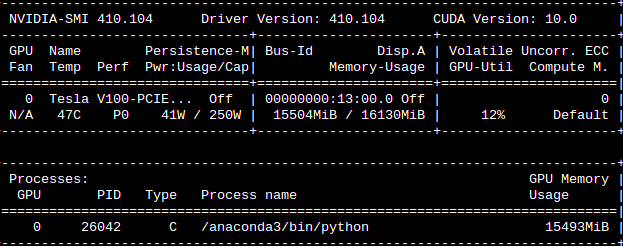

In [99]:
from sklearn.ensemble.gradient_boosting import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA, TruncatedSVD

from xgboost import XGBClassifier

from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score, KFold
from sklearn.metrics import accuracy_score, precision_score, f1_score, confusion_matrix
from sklearn.utils import resample

from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier
from keras.utils import np_utils

from sklearn.pipeline import Pipeline

__*SPOILER:*__ Жестко вписаться в моделинг не получилось, ибо score оказался весьма плачевным, поэтому здесь нет моментов с тюнингом и подбором параметров

In [27]:
train.set_index('company_1', inplace=True)

In [121]:
X = train[train.columns[:-1]].values

In [29]:
scaler = MinMaxScaler()

In [122]:
X = scaler.fit_transform(X)

In [123]:
y = train.target.values

In [124]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [33]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((113188, 331), (28298, 331), (113188,), (28298,))

__Попробуем RandomForest с дефолтным числом деревьев, обучаться будем на всех процессорах__

In [125]:
rf_model = RandomForestClassifier(n_estimators=100 ,n_jobs=-1)

In [126]:
rf_model.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=None, verbose=0,
                       warm_start=False)

In [56]:
features_importances = list(zip(train.columns.values, rf_model.feature_importances_))
features_importances.sort(key=operator.itemgetter(1), reverse=True)
features_importances[:20]

[('industry_cashflow_12', 0.08364151141968554),
 ('industry_payment_count_12', 0.042124679014575575),
 ('industry_week_count_12', 0.03428266392785131),
 ('industry_cashflow_34', 0.021437859147712263),
 ('industry_cashflow_4', 0.018301967578175437),
 ('industry_cashflow_61', 0.016096333800700684),
 ('industry_cashflow_52', 0.015836835970341655),
 ('industry_cashflow_14', 0.015273257658967613),
 ('industry_payment_count_4', 0.014563265000796693),
 ('industry_payment_count_34', 0.013808632493080033),
 ('industry_week_count_4', 0.013539697385777016),
 ('industry_cashflow_9', 0.013128238329069595),
 ('industry_cashflow_8', 0.013013220587611271),
 ('industry_cashflow_55', 0.012612078512582251),
 ('industry_week_count_34', 0.011796644513650825),
 ('industry_cashflow_48', 0.010905755925458237),
 ('industry_cashflow_62', 0.01075951422212158),
 ('industry_cashflow_39', 0.0105425978628766),
 ('industry_cashflow_46', 0.010069546524966933),
 ('industry_cashflow_74', 0.008806411845829568)]

__average='micro', говорит о том что мы возьмем усредненный скор по всем классам__

In [38]:
accuracy_score(y_test, rf_model.predict(X_test))

0.30101067213230615

In [43]:
precision_score(y_test, rf_model.predict(X_test), average='micro')

0.30101067213230615

In [45]:
f1_score(y_test, rf_model.predict(X_test), average='micro')

0.30101067213230615

In [46]:
clf = MLPClassifier(hidden_layer_sizes=(100, 100, 100), max_iter=100, alpha=0.0001,
                     solver='adam', verbose=10,  random_state=21,tol=0.000000001)

In [47]:
clf.fit(X_train, y_train)
accuracy_score(y_test, clf.predict(X_test))

Iteration 1, loss = 3.30229852
Iteration 2, loss = 3.16605733
Iteration 3, loss = 3.07144551
Iteration 4, loss = 3.01767098
Iteration 5, loss = 2.98718434
Iteration 6, loss = 2.96420497
Iteration 7, loss = 2.93770219
Iteration 8, loss = 2.91114945
Iteration 9, loss = 2.88736583
Iteration 10, loss = 2.86684004
Iteration 11, loss = 2.85201033
Iteration 12, loss = 2.83982677
Iteration 13, loss = 2.82944180
Iteration 14, loss = 2.81920563
Iteration 15, loss = 2.80919800
Iteration 16, loss = 2.80039472
Iteration 17, loss = 2.79489115
Iteration 18, loss = 2.78547890
Iteration 19, loss = 2.77885389
Iteration 20, loss = 2.77099588
Iteration 21, loss = 2.76558635
Iteration 22, loss = 2.75916317
Iteration 23, loss = 2.75408092
Iteration 24, loss = 2.74772149
Iteration 25, loss = 2.74421536
Iteration 26, loss = 2.73919821
Iteration 27, loss = 2.73435314
Iteration 28, loss = 2.72828730
Iteration 29, loss = 2.72328546
Iteration 30, loss = 2.71866787
Iteration 31, loss = 2.71538854
Iteration 32, los

0.3530991589511626

In [48]:
precision_score(y_test, clf.predict(X_test), average='micro')

0.3530991589511626

In [49]:
f1_score(y_test, clf.predict(X_test), average='micro')

0.3530991589511626

In [80]:
cv = StratifiedKFold(n_splits=3, random_state=666, shuffle=True)
cross_val_score(rf_model, X, y, cv=cv, scoring='f1_micro')

array([0.30185841, 0.30498304, 0.29920441])

In [127]:
cm = confusion_matrix(y_test, rf_model.predict(X_test))

In [131]:
cm

array([[1, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 1, ..., 0, 0, 0],
       ...,
       [1, 0, 0, ..., 1, 0, 1],
       [0, 0, 0, ..., 0, 0, 1],
       [0, 0, 0, ..., 0, 0, 1]])

In [132]:
cm = pd.DataFrame(data=cm)

In [137]:
for i in cm.columns:
    if cm[i].sum()>1000:
        print(f'Самые угадываемые классы: {i}')

Самые угадываемые классы: 4
Самые угадываемые классы: 12
Самые угадываемые классы: 14
Самые угадываемые классы: 34


__Попробуем построить не сильно глубокую модельку, выставим небольшое число эпох, чтобы проверить, обучается ли она в принципе__

In [22]:
encoder = LabelEncoder()
encoder.fit(y)
Y = encoder.transform(y)
y = np_utils.to_categorical(Y)

In [23]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [24]:
input_dim = X_train.shape[1]

model = Sequential()
model.add(Dense(9, input_dim = input_dim , activation = 'relu'))
model.add(Dense(10, activation = 'relu'))
model.add(Dense(10, activation = 'relu'))
model.add(Dense(10, activation = 'relu'))
model.add(Dense(80, activation = 'softmax'))

model.compile(loss = 'categorical_crossentropy' , optimizer = 'adam' , metrics = ['accuracy'] )

model.fit(X_train, y_train, epochs = 10, batch_size = 2)

scores = model.evaluate(X_test, y_test)
print("\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use tf.cast instead.
Epoch 1/10
113188/113188 [==============================] - 313s 3ms/step - loss: 3.2132 - acc: 0.2828
Epoch 2/10
113188/113188 [==============================] - 326s 3ms/step - loss: 3.1123 - acc: 0.2953
Epoch 3/10
113188/113188 [==============================] - 320s 3ms/step - loss: 3.0654 - acc: 0.3003
Epoch 4/10
113188/113188 [==============================] - 204s 2ms/step - loss: 3.0360 - acc: 0.3080
Epoch 5/10
113188/113188 [==============================] - 331s 3ms/step - loss: 3.0087 - acc: 0.3159
Epoch 6/10
113188/113188 [==============================] - 342s 3ms/step - loss: 2.9878 - acc: 0.3186
Epoch 7/10
113188/113188 [==============================] - 315s 3ms/step - loss: 2.9763 - acc: 0.3207
Epoch 8/10
113188/113188 [==============================] - 303s 3ms/step - loss: 2.9658 - acc: 0.3226
Epoch 9/10
113188/113188 [==============================

__Резалт на XGboost, тоже весьма себе не обнадеживающий__

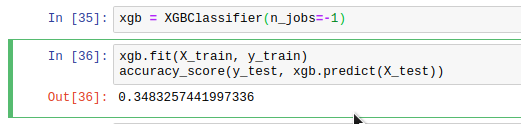

__Как одно из предположений, возможно у нас много шума в данных, и требуется отобрать фичи, воспользуемся методом главных компонент и SVD разложением__

__По процессу:__
Будем строить разложения по всем фичам и потом через ```.explained_variance_``` доставать долю дисперсии для каждой из компонент, тем самым определимся на сколько компонент разложить наши данные

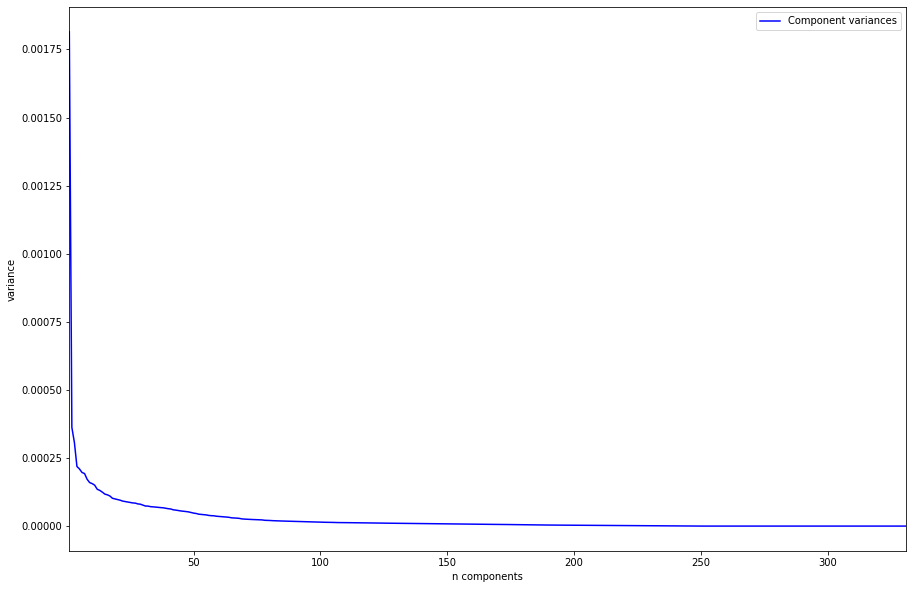

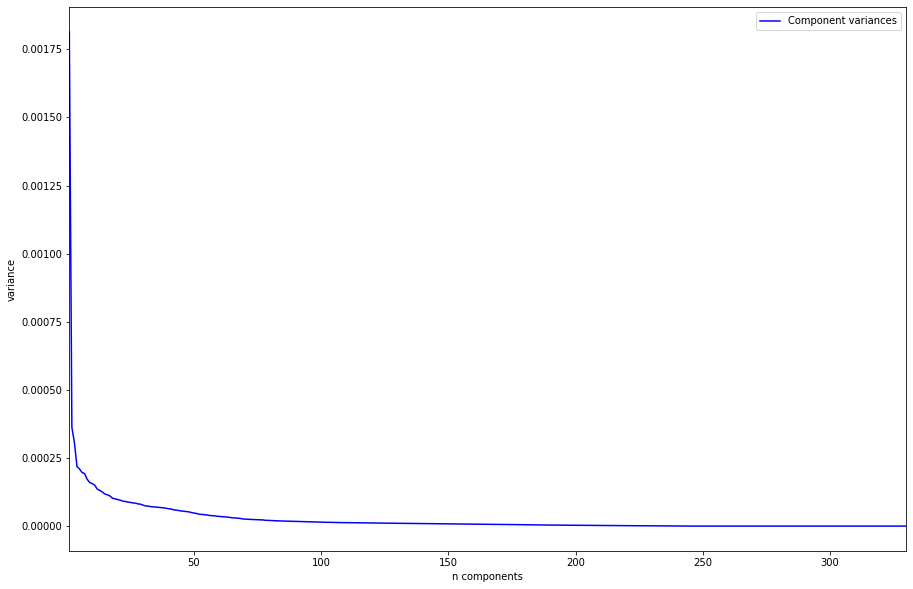

In [109]:
def plot_variances(d_variances):
    n_components = np.arange(1,d_variances.size+1)
    plt.figure(figsize=(15,10))
    plt.plot(n_components, d_variances, 'b', label='Component variances')
    plt.xlim(n_components[0], n_components[-1])
    plt.xlabel('n components')
    plt.ylabel('variance')
    plt.legend(loc='upper right')
    plt.show()


model = PCA(n_components=X.shape[1])
model.fit_transform(X)
model_another= TruncatedSVD(n_components=X.shape[1]-1, n_iter=7, random_state=666)
model_another.fit_transform(X)
d_variances_1 = model_another.explained_variance_
d_variances = model.explained_variance_
plot_variances(d_variances)
plot_variances(d_variances_1)

__Ясно, не так много у нас информативных фичей, посмотрим их score__

In [110]:
X_reduced = TruncatedSVD(n_components=10, n_iter=10).fit_transform(X)
cross_val_score(rf_model, X_reduced, y, cv=cv, scoring='f1_micro')

array([0.27361149, 0.27599661, 0.2720908 ])

In [111]:
X_reduced = PCA(n_components=10).fit_transform(X)
cross_val_score(rf_model, X_reduced, y, cv=cv, scoring='f1_micro')

array([0.27407768, 0.27483036, 0.27158163])

__Score не сильно упал, так что теперь когда у нас не так много фичей, можем попробовать градиентный бустинг на большом числе деревьев__

In [115]:
X_reduced = TruncatedSVD(n_components=15, n_iter=10).fit_transform(X)

In [116]:
X_train, X_test, y_train, y_test = train_test_split(X_reduced, y, test_size=0.2)

In [119]:
Xgb = XGBClassifier(n_estimators=500, n_jobs=-1).fit(X_train, y_train)

**-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------**

__Пока в этом ноутбуке обучалась сетка, пришла идея касательно того, чтобы не так сильно размазывать наши данные, и уместить их более компактно, но также информативно в куда меньшее число колонок, здесь ниже мы мапимся в имеющийся датафрэйм all_operations_df, проводим все агрегации, с вашего позволения не буду здесь все это заново прожимать, просто скопирую .csv файл__

In [134]:
grouped_companies = pd.DataFrame(all_operations_df.groupby(['company_1', 'company_2']).agg({'count': 'sum', 'sum': 'sum','week': 'сount' })).reset_index()

In [135]:
len(grouped_companies.company_1.unique())

240069

In [141]:
regions_dict = dict(zip(inn.hash_inn, inn.region))
okved_dict = dict(zip(inn.hash_inn, inn.okved2))

In [142]:
grouped_companies['region_company_1'] = grouped_companies.company_1.apply(lambda row: regions_dict[row])
grouped_companies['region_company_2'] = grouped_companies.company_2.apply(lambda row: regions_dict[row])

In [143]:
grouped_companies['field_company_1'] = grouped_companies.company_1.apply(lambda row: okved_dict[row])
grouped_companies['field_company_2'] = grouped_companies.company_2.apply(lambda row: okved_dict[row])

__Новый датафрейм__

In [146]:
processed_data = pd.DataFrame()

In [147]:
processed_data['companies_inns'] = grouped_companies.company_1.unique() 

In [152]:
processed_data['regions'] = processed_data.companies_inns.apply(lambda row: regions_dict[row])

In [155]:
target = [okved_dict[comp] for comp in grouped_companies.company_1.unique()]

In [156]:
unique_regions = inn.region.unique()
unique_fields = inn.okved2.unique()
number_of_regions = len(unique_regions)
number_of_fields = len(unique_fields) - 1

In [157]:
region_cols = [f'region_{i}_count' for i in range(number_of_regions)]
field_cols = [f'field_{i}_sum' for i in range(number_of_fields)]

In [159]:
grouped_companies_by_region = pd.DataFrame(grouped_companies.groupby(['company_1', 'region_company_2']).agg({'count': 'sum', 'sum': 'sum', 'week':'sum'})).reset_index()

In [161]:
grouped_companies_by_field = pd.DataFrame(grouped_companies.groupby(['company_1', 'field_company_2']).agg({'count': 'sum', 'sum': 'sum', 'week':'sum'})).reset_index()

__Создаем датафрейм с регионами__

In [164]:
cols = [i for i in range(number_of_regions)]

In [166]:
regions_stats = pd.DataFrame(np.zeros((len(grouped_companies.company_1.unique() ), number_of_regions)), columns=cols)

In [167]:
def load_regions(df):
    for i, comp in tqdm(enumerate(grouped_companies.company_1.unique())):
        company_slice = grouped_companies_by_region[grouped_companies_by_region.company_1 == comp]
        df.loc[i,company_slice.region_company_2.values] = company_slice['count'].values

In [168]:
load_regions(regions_stats)

39099it [01:08, 574.57it/s]

KeyboardInterrupt: 

__Создаем датафрейм с отраслями__

In [99]:
cols_fields = [i for i in range(number_of_fields)]

In [100]:
fields_stats = pd.DataFrame(np.zeros((len(grouped_companies.company_1.unique() ), number_of_fields)), columns=cols_fields)

In [ ]:
def load_fields(df):
    for i, comp in tqdm(enumerate(grouped_companies.company_1.unique())):
        company_slice = grouped_companies_by_field[grouped_companies_by_field.company_1 == comp]
        if -1 in company_slice.field_company_2.values:
            company_slice = company_slice[company_slice.field_company_2 != -1]
            if not len(company_slice.field_company_2.values):
                continue
        df.loc[i,company_slice.field_company_2.values] = company_slice['sum'].values

In [ ]:
load_fields(fields_stats)

In [ ]:
fields_stats.iloc[0:3,:]

In [ ]:
region_names_cols = {n: 'region_{}_count'.format(n) for n in cols}
field_names_cols = {n: 'field_{}_sum'.format(n) for n in cols_fields}

In [ ]:
regions_stats = regions_stats.rename(columns=region_names_cols)
fields_stats = fields_stats.rename(columns=field_names_cols)

In [ ]:
processed_data = pd.concat([processed_data, regions_stats, fields_stats], axis=1)

In [ ]:
processed_data['target'] = target

In [ ]:
processed_data = processed_data.sort_values(by=['target']).reset_index()

In [ ]:
processed_data = processed_data.drop('index', axis=1)

In [ ]:
processed_data.head()

In [ ]:
number_of_test_objects = test_inn_info.shape[0]

In [ ]:
test_data = processed_data.iloc[:number_of_test_objects,:]

In [ ]:
train_data = processed_data.iloc[number_of_test_objects:,:]

In [ ]:
train_data.shape, test_data.shape

__Датафрэймы ниже, есть продукт верхних агрегаций, скопипащенных из другого моего ноутбука__

**Описание:**

Агрегация, в том же стиле, каждая строчка это компания, колонки это ее представление в пространстве индустрии и кэшфлоу обороте с ней, далее регион и counts сопряженный с ним овэрол 174 колонки

In [205]:
trainset = pd.read_csv('TRAINSET.csv')
testset = pd.read_csv('TESTSET.csv')
trainset.drop(['Unnamed: 0'], axis=1, inplace=True)
testset.drop(['Unnamed: 0'], axis=1, inplace=True)

In [61]:
trainset.head()

,companies_inns,regions,region_0_count,region_1_count,region_2_count,region_3_count,region_4_count,region_5_count,region_6_count,region_7_count,...,field_71_sum,field_72_sum,field_73_sum,field_74_sum,field_75_sum,field_76_sum,field_77_sum,field_78_sum,field_79_sum,target
0,230527,28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,908.284,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,4660,56,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,228166,60,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,84860,24,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,186291,60,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


In [62]:
testset.head()

,companies_inns,regions,region_0_count,region_1_count,region_2_count,region_3_count,region_4_count,region_5_count,region_6_count,region_7_count,...,field_71_sum,field_72_sum,field_73_sum,field_74_sum,field_75_sum,field_76_sum,field_77_sum,field_78_sum,field_79_sum,target
0,0,84,0.0,0.0,1.0,0.0,7.0,0.0,7.0,4.0,...,104.672,91.876,0.0,103.556,0.424,10989.04,0.0,2.72,12.688,-1
1,204875,41,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000,0.000,0.0,0.000,0.000,0.00,0.0,0.00,0.000,-1
2,204879,58,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000,0.000,0.0,0.000,0.000,0.00,0.0,0.00,0.000,-1
3,204880,86,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000,0.000,0.0,0.000,0.000,0.00,0.0,0.00,0.000,-1
4,204776,41,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000,0.000,0.0,0.000,0.000,0.00,0.0,0.00,0.000,-1


*Проскорим этот датасэт на нашем имеющемся бэйзлайне моделей*

In [198]:
X = trainset[trainset.columns[2:-1]].values
y = trainset[trainset.columns[-1]].values

In [199]:
X = scaler.fit_transform(X)

In [140]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [141]:
rf_model.fit(X_train, y_train)
accuracy_score(y_test, rf_model.predict(X_test))

0.31149521419942383

In [72]:
precision_score(y_test, rf_model.predict(X_test), average='micro')

0.3120527831985875

In [73]:
f1_score(y_test, rf_model.predict(X_test), average='micro')

0.3120527831985875

In [142]:
cm = confusion_matrix(y_test, rf_model.predict(X_test))
cm = pd.DataFrame(data=cm)

In [146]:
for i in cm.columns:
    if cm[i].sum()>1000:
        print(f'Самые популярные классы: {i}, {cm[i].sum()}')

Самые популярные классы: 4, 1334
Самые популярные классы: 12, 19580
Самые популярные классы: 14, 2396
Самые популярные классы: 34, 2300


In [85]:
cv = StratifiedKFold(n_splits=3, random_state=666, shuffle=True)
scores = cross_val_score(rf_model, X, y, cv=cv, scoring='recall_micro')

In [86]:
scores

array([0.30851538, 0.31280898, 0.31193633])

In [74]:
features_importances = list(zip(train.columns.values, rf_model.feature_importances_))
features_importances.sort(key=operator.itemgetter(1), reverse=True)
features_importances[:20]

[('industry_payment_count_23', 0.10321978134800058),
 ('industry_payment_count_5', 0.06018396456148999),
 ('industry_payment_count_4', 0.053284593720911634),
 ('industry_payment_count_0', 0.032773071461097),
 ('industry_payment_count_15', 0.03265108287965012),
 ('industry_payment_count_45', 0.029155040197183),
 ('industry_cashflow_60', 0.025344745112487483),
 ('industry_payment_count_2', 0.024397955832523858),
 ('industry_payment_count_25', 0.022845055530586397),
 ('industry_payment_count_63', 0.0227957500964822),
 ('industry_payment_count_20', 0.020952998777310505),
 ('industry_cashflow_17', 0.020708010032038135),
 ('industry_payment_count_72', 0.020036041619870222),
 ('industry_payment_count_66', 0.01829468619111955),
 ('industry_payment_count_19', 0.017613950759366174),
 ('industry_cashflow_23', 0.01734768478588081),
 ('industry_week_count_5', 0.017102959786707204),
 ('industry_payment_count_57', 0.014748287693652745),
 ('industry_payment_count_50', 0.014568303067940193),
 ('industr

__С этим датасэтом было произведено тоже самое, что и с предыдущим, никаких брэйкин изменений к сожалению не вышло__

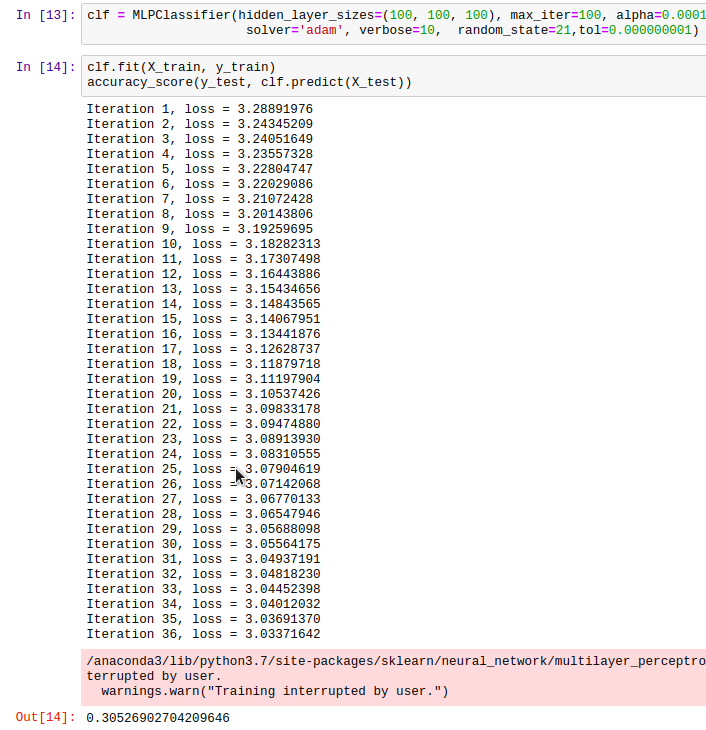

__Резалты от аналогичной нейронки, как сверху__

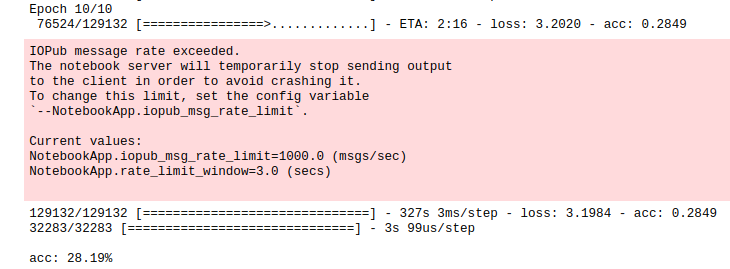

# ОКЕЙ!

__Мы так с разбегу начали заниматься моделингом, что совсем забыли о важной проблеме, которую упомянули еще на моменте визуализации это ДИЗБАЛАНС КЛАССОВ, да, именно о нем мы не позаботились, чтож, займемся__

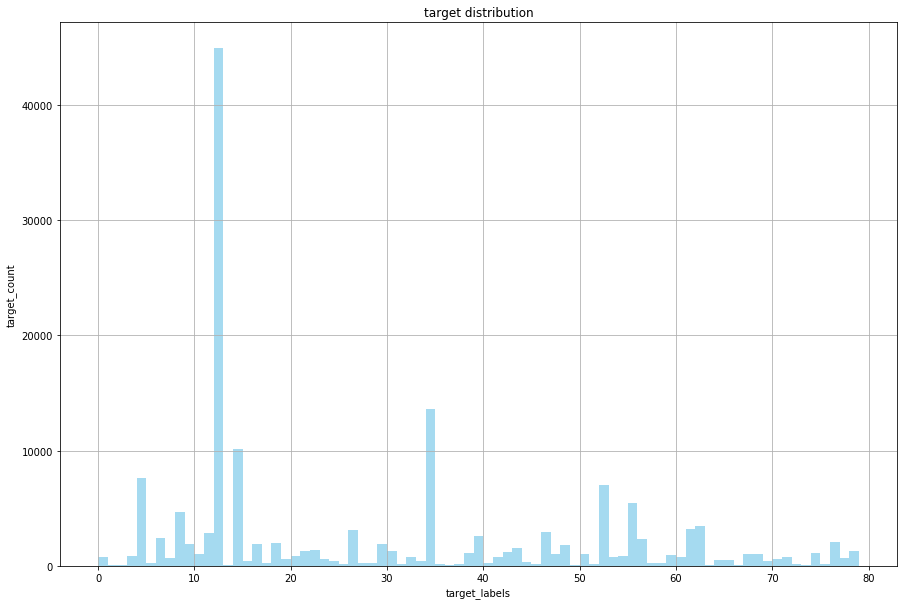

In [174]:
n = target_dist_plotter(trainset)

In [175]:
balance = sorted(list(zip(n[0], n[1])), key=operator.itemgetter(1), reverse=True)
print(f'{start}Distribution of classes in numbers{end}\n')
print(f'{start}Mean{end} observations: {np.mean(balance[1:], axis = 0)[1]} (except of "-1" class)')
print(f'{start}Median{end} observations: {np.median(balance[1:], axis = 0)[1]} (except of "-1" class)\n')
pprint(balance)

Distribution of classes in numbers

Mean observations: 1474.6455696202531 (except of "-1" class)
Median observations: 781.0 (except of "-1" class)

[(12, 44918),
 (34, 13654),
 (14, 10179),
 (4, 7617),
 (52, 6986),
 (55, 5493),
 (8, 4658),
 (62, 3498),
 (61, 3194),
 (26, 3141),
 (46, 2969),
 (11, 2850),
 (39, 2577),
 (6, 2456),
 (56, 2307),
 (76, 2059),
 (18, 1999),
 (29, 1905),
 (9, 1887),
 (16, 1873),
 (48, 1847),
 (43, 1544),
 (22, 1385),
 (30, 1297),
 (21, 1254),
 (42, 1206),
 (74, 1132),
 (38, 1104),
 (47, 1067),
 (68, 1043),
 (67, 1022),
 (10, 1006),
 (50, 994),
 (79, 948),
 (59, 916),
 (54, 887),
 (20, 851),
 (3, 842),
 (0, 815),
 (53, 786),
 (32, 781),
 (60, 768),
 (71, 757),
 (41, 742),
 (7, 649),
 (77, 644),
 (70, 601),
 (19, 560),
 (23, 556),
 (65, 538),
 (64, 519),
 (33, 464),
 (69, 437),
 (15, 436),
 (24, 388),
 (78, 380),
 (44, 338),
 (27, 280),
 (57, 263),
 (28, 253),
 (5, 250),
 (17, 241),
 (40, 234),
 (58, 222),
 (25, 203),
 (75, 187),
 (37, 177),
 (45, 173),
 (31, 166

In [206]:
downsampled_12 = downsampler(12, 5000)
downsampled_34 = downsampler(34, 5000)
downsampled_14 = downsampler(14, 5000)

In [207]:
trainset = pd.concat([trainset[(trainset.target!=12) & (trainset.target!=34) & (trainset.target!=14)],\
                                                             downsampled_12, downsampled_14, downsampled_34])

In [208]:
trainset.shape

(107664, 174)

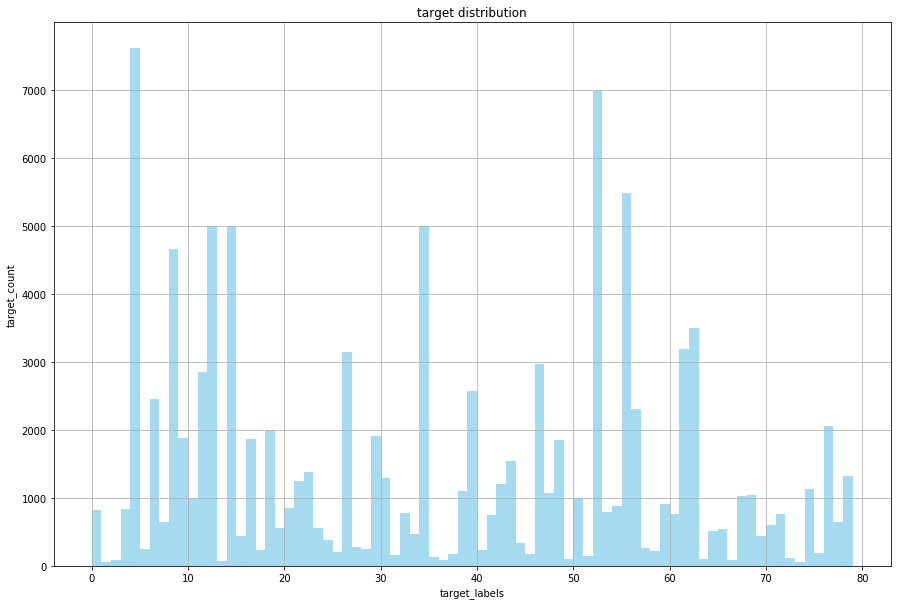

In [179]:
n = target_dist_plotter(trainset)

In [209]:
X = trainset[trainset.columns[2:-1]].values
y = trainset[trainset.columns[-1]].values


In [210]:
X = scaler.fit_transform(X)

In [188]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True)

In [189]:
rf_model.fit(X_train, y_train)
f1_score(y_test, rf_model.predict(X_test), average='micro')

0.18478614220034367

In [182]:
cv = StratifiedKFold(n_splits=3, random_state=666, shuffle=True)
scores = cross_val_score(rf_model, X, y, cv=cv, scoring='f1_micro')

__Здесь напрашивается один вывод:__

Раз score ухудшился, тут дело не в зашумленности или дизбалансе (дизбаланс даже бустил по score), дело в неприавильно подобранных признаках

In [183]:
scores.mean()

0.18364550050667794

In [193]:
clf.fit(X_train, y_train)
accuracy_score(y_test, clf.predict(X_test))

Iteration 1, loss = 3.86473780
Iteration 2, loss = 3.83033950
Iteration 3, loss = 3.82449990
Iteration 4, loss = 3.81673964
Iteration 5, loss = 3.80989247
Iteration 6, loss = 3.80018153
Iteration 7, loss = 3.78980030
Iteration 8, loss = 3.77983874
Iteration 9, loss = 3.76841622
Iteration 10, loss = 3.75855385
Iteration 11, loss = 3.74982324
Iteration 12, loss = 3.74010132
Iteration 13, loss = 3.73182848
Iteration 14, loss = 3.72309338
Iteration 15, loss = 3.71383605
Iteration 16, loss = 3.70819165
Iteration 17, loss = 3.69966333
Iteration 18, loss = 3.69184464
Iteration 19, loss = 3.68596435
Iteration 20, loss = 3.67967244
Iteration 21, loss = 3.67235228
Iteration 22, loss = 3.66703401
Iteration 23, loss = 3.65919183
Iteration 24, loss = 3.65142066
Iteration 25, loss = 3.64592920
Iteration 26, loss = 3.64336591
Iteration 27, loss = 3.63619974
Iteration 28, loss = 3.63116841
Iteration 29, loss = 3.62661414
Iteration 30, loss = 3.61914886
Iteration 31, loss = 3.61252047
Iteration 32, los

0.14359355407978452

In [201]:
X_test = testset[testset.columns[2:-1]].values

In [202]:
X_test = scaler.fit_transform(X_test)

In [211]:
rf_model.fit(X, y)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=None, verbose=0,
                       warm_start=False)

In [212]:
predicts = rf_model.predict(X_test)

In [214]:
companies = testset.companies_inns.values

In [217]:
predicts = list(zip(companies, predicts))

In [218]:
import csv

In [219]:
with open('Murzakhmetov_Sanzhar_05_09_2018_submission.csv', 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerows(predicts)

<h1><center>Заключение</center></h1>

### *Что было проделано*:
 - Была выдвинута идея, что отрасль компании, определяется причастностью ее компаний партнеров к этим отраслям
 - Data Exploration
 - Проделано два вида агрегации, одна более развернутая с использованием ```week``` и ```region_count```, другая более сжатая с мерджингом ```region``` и ```count```
 - Визуализация имеющихся данных
 - Feature Engineering
 - Попытка сжатия разреженных датасэтов методом главных компонент и SVD разложением
 - Анализ дизбаланса классов, как выход предложен андэрсэмплинг
 - Предикт имеющихся таргетов
 
### *Что еще можно было бы сделать*:
 - Возможно стоило бы попробовать сделать датасэт размером 240к х  240к, чтобы получить представление компании в пространстве всех компаний, потом максимально безболезненно сжать их и проскорить. 
 - Использовать векторные расстояния между объектами одного класса, счесть это за эпсилон, и взяв неразмеченный датасэт посчитать ближайшую вектору отрасль
 
В любом случае несмотря на исход, спасибо Вам за внимание, уделенное время и возможность порешать данный кейс, было интересно, хотелось бы узнать как он решается правильно.